In [1]:
import os
import pickle
import logging
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from omegaconf import OmegaConf
from matplotlib import rc
from definitions import ROOT_DIR
from data import imagenet
import matching
import scipy.stats
sns.set_context("paper")

# Set the font to be serif, rather than sans
sns.set(font='serif')
    
# Make the background white, and specify the
# specific font family
sns.set_style("white", {
    "font.family": "serif",
    "font.serif": ["Times", "Palatino", "serif"]
})
colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
sns.set_palette(sns.xkcd_palette(colors))
plt.rc('text', usetex=True)

os.chdir('/home/darsh/Downloads/zsl_text_imagenet/') # https://github.com/sebastianbujwid/zsl_text_imagenet
logging.basicConfig(level=logging.INFO)

In [2]:
overwrite_config = {
}


configs = [
    ROOT_DIR/'configs'/'env_config.yml',
    ROOT_DIR/'configs'/'matching_config.yml',
]

config = OmegaConf.merge(
    OmegaConf.load(str(configs[0])),
    OmegaConf.load(str(configs[1])),
    OmegaConf.create(overwrite_config))
OmegaConf.set_readonly(config, True)
OmegaConf.set_struct(config, True)

args = {
}
args = OmegaConf.create(args)
OmegaConf.set_readonly(args, True)
OmegaConf.set_struct(args, True)



In [47]:
dataset_config = config.env.datasets.ImageNet
imagenet_id_details = imagenet.extract_imagenet_id_details(dataset_config['imagenet_ids_to_wordnet'])
# https://github.com/sebastianbujwid/ImageNet-Wiki_dataset/tree/main/class_article_text_descriptions
mp500_articles_file = ROOT_DIR/'ImageNet-Wiki_dataset-main/class_article_text_descriptions/class_article_text_descriptions_mp500.pkl'
mp500_articles = pickle.load(open(mp500_articles_file, 'rb'))

wnid_to_imagenet_id = imagenet.extract_wordnet_to_imagenet_id(ROOT_DIR/'ImageNet-Wiki_dataset-main/class_article_text_descriptions/class_article_text_descriptions_mp500.pkl')

def class_details(wnid):
    imagenet_id = wnid_to_imagenet_id[wnid]
    return imagenet_id_details[imagenet_id]

class_details(10348)

(['black-footed ferret', 'ferret', 'Mustela nigripes'],
 ['black-footed ferret', 'ferret', 'Mustela nigripes'])

In [6]:
albert_results_file = 'simple_zsl/eval/mp500/szsl_albert-xxl_wiki_ALL/runzslsrs-xxl1006_42/szsl_run001/2020-05-29_10-00-11_N_N/test_results_mp500.pkl'
albert_results = pickle.load(open(albert_results_file, 'rb'))


2022-11-29 21:12:11,265 DEBUG    tpu_cluster_resolver.            <module> -:- Falling back to TensorFlow client; we recommended you install the Cloud TPU client directly with pip install cloud-tpu-client.
2022-11-29 21:12:12.246604: W tensorflow/stream_executor/platform/default/dso_loader.cc:55] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-11-29 21:12:12.246628: E tensorflow/stream_executor/cuda/cuda_driver.cc:313] failed call to cuInit: UNKNOWN ERROR (303)
2022-11-29 21:12:12.246647: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (darsh-ThinkPad-E14): /proc/driver/nvidia/version does not exist
2022-11-29 21:12:12.247322: I tensorflow/core/platform/cpu_feature_guard.cc:143] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 FMA
2022-11-29 21:12:12.275247: I tensorflow/core/platform/profile_uti

In [7]:
# https://github.com/sebastianbujwid/ImageNet-Wiki_dataset/tree/main/class_article_text_descriptions
mp500_articles_file = ROOT_DIR/'ImageNet-Wiki_dataset-main/class_article_text_descriptions/class_article_text_descriptions_mp500.pkl'
mp500_articles = pickle.load(open(mp500_articles_file, 'rb'))

In [48]:
print(len(mp500_articles), len(albert_results['test_unseen_top5_acc']))
print(albert_results.keys())

top5_acc_by_articles_length = []
for imagenet_id, v in mp500_articles.items():
    wnid = v['wnid']
    res = albert_results['test_unseen_top5_acc'][wnid]
    articles_length = 0
    for article in v['articles']:
        articles_length += len(article)
    top5_acc_by_articles_length.append((wnid, res, articles_length))

print(top5_acc_by_articles_length)

489 489
dict_keys(['test_unseen_top1_acc', 'test_unseen_top1_acc_mean', 'test_unseen_top1_acc_mean_allclasses', 'test_unseen_top5_acc', 'test_unseen_top5_acc_mean', 'test_unseen_top5_acc_mean_allclasses'])
[('n03114379', 0.6723032, 4059), ('n03898633', 0.5796937, 10322), ('n02820210', 0.80257994, 7209), ('n02699770', 0.9549763, 10176), ('n02739550', 0.8896586, 4867), ('n03380724', 0.2686287, 2600), ('n00464894', 0.22916667, 53017), ('n01787835', 0.4924338, 31198), ('n04477219', 0.56842643, 15701), ('n02891788', 0.023409363, 26412), ('n02084071', 0.6238303, 9144), ('n02918595', 0.13366646, 17687), ('n04478512', 0.39055794, 3073), ('n03548402', 0.24087591, 7617), ('n02987492', 0.031520396, 14932), ('n04217882', 0.59596574, 16506), ('n09988063', 0.0030432136, 16284), ('n00442847', 0.61713284, 20506), ('n03309808', 0.34275618, 17244), ('n12282933', 0.32586917, 6497), ('n01318894', 0.011786601, 21846), ('n03986704', 0.2757557, 4728), ('n04388743', 0.17595147, 13034), ('n04020298', 0.0739870

In [49]:
def r2(x, y):
    return scipy.stats.linregress(x, y).rvalue**2

def plot_fig(df, group=None, save=None):
    x, y = select_group(df, group)
    sns.regplot(x=x, y=y, marker='x',
                scatter_kws={"s": 10, 'alpha': 0.5},
               )
    #sns.jointplot(x, y, kind='reg', sta)
    plt.xlabel('$\log_{10}$\, class description length (in \# of characters)')
    plt.ylabel('Top-5 mean class accuracy')
    plt.text(x.min(), y.max() * 0.9, f'$R^2={r2(x, y):.3f}$')
    if save:
        plt.savefig(f'{save}.pdf', bbox_inches='tight')
    plt.show()


In [50]:
wnids, accs, lengths = zip(*top5_acc_by_articles_length)
groups = pickle.load(open('/home/darsh/Downloads/zsl_methods_imagenet-main/notebooks/excluding_groups/mp500_groups.pkl', 'rb'))

In [52]:
def wnid_to_groupname(wnid):
    if wnid in groups['animals']:
        return 'animals'
    elif wnid in groups['plants']:
        return 'plants'
    elif wnid in groups['other']:
        return 'other'
    else:
        raise ValueError(wnid)

In [53]:
df = pd.DataFrame.from_dict(
{
    'wnid': wnids,
    'acc': accs,
    'length': lengths,
    'group': list(map(wnid_to_groupname, wnids)),
})


def select_group(df, group=None):
    if group:
        sel = df[df['group'] == group]
    else:
        sel = df
    x = np.log10(np.array(sel['length']))
    y = np.array(sel['acc'])
    return x, y



2022-11-29 21:33:58,603 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:33:58,604 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:33:58,604 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:33:58,605 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:33:58,606 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:33:58,606 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:33:58,607 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:33:58,608 DEBUG              texmanager._get_font_preamble

2022-11-29 21:33:58,643 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:33:58,645 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:33:58,645 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:33:58,646 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:33:58,647 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/6a9fc2f080a9310f3ec0a78f57945c56.dvi
2022-11-29 21:33:58,647 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:33:58,647 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:33:58,687 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:33:58,687 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:33:58,688 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:33:58,688 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:33:58,689 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:33:58,689 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:33:58,690 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:33:58,691 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:33:58,752 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:33:58,752 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:33:58,754 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/4c7e23f3269338f8a486be734ebe2f02.dvi
2022-11-29 21:33:58,754 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:33:58,755 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:33:58,757 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:33:58,757 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:33:58,841 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:33:58,842 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:33:58,843 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:33:58,844 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:33:58,845 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:33:58,846 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:33:58,847 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:33:58,848 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:33:58,973 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/48b72f9d0b39ecfbf40b61204d737c1f.dvi
2022-11-29 21:33:58,975 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:33:58,976 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:33:59,149 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:33:59,150 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:33:59,151 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:33:59,151 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:33:59,1

2022-11-29 21:33:59,192 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:33:59,193 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:33:59,193 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:33:59,194 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:33:59,195 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:33:59,195 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,196 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,196 DEBUG              texmanager._get_font_preambl

2022-11-29 21:33:59,241 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:33:59,242 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:33:59,246 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:33:59,247 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:33:59,248 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:33:59,248 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:33:59,249 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:33:59,249 DEBUG              texmanager._

2022-11-29 21:33:59,297 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:33:59,297 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:33:59,297 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:33:59,298 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,298 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,299 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:33:59,299 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/4c7e23f3269338f8a486be734ebe2f02.dvi
2022-11-29

2022-11-29 21:33:59,351 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:33:59,352 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:33:59,353 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:33:59,354 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:33:59,355 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:33:59,356 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:33:59,357 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:33:59,359 DEBUG              texmanager._get_font_preamble

2022-11-29 21:33:59,470 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:33:59,471 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,473 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,474 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:33:59,477 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/f58dc6adb7f69b413275c37a13dd57e9.dvi
2022-11-29 21:33:59,479 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:33:59,480 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:33:59,549 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:33:59,549 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:33:59,550 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:33:59,551 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:33:59,551 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:33:59,552 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:33:59,552 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:33:59,553 DEBUG              texmanager._get_font_preamble

2022-11-29 21:33:59,616 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:33:59,617 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:33:59,617 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:33:59,618 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,618 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,619 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:33:59,622 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/41126496caa29988ab913f01accc82b1.dvi
2022-11-29

2022-11-29 21:33:59,683 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:33:59,684 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:33:59,684 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:33:59,685 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:33:59,685 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:33:59,686 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:33:59,687 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:33:59,687 DEBUG              texmanager._get_font_preamble

2022-11-29 21:33:59,737 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:33:59,737 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,738 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:33:59,738 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:33:59,739 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/48b72f9d0b39ecfbf40b61204d737c1f.dvi
2022-11-29 21:33:59,742 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:33:59,742 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:33:59,806 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 591: 'get'
2022-11-29 21:33:59,806 DEBUG              _type1font.            __init__ -:- type1font._Token number at 595: '1'
2022-11-29 21:33:59,807 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 597: 'eq'
2022-11-29 21:33:59,808 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 600: 'and'
2022-11-29 21:33:59,809 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 603: '}'
2022-11-29 21:33:59,810 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 604: '{'
2022-11-29 21:33:59,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 605: 'pop'
2022-11-29 21:33:59,811 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 609: 'false'
2022-11-29 21:33:59,812 DEBUG              _type1font.    

2022-11-29 21:33:59,862 DEBUG              _type1font.            __init__ -:- type1font._Token string at 880: '(003.002)'
2022-11-29 21:33:59,863 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 890: 'readonly'
2022-11-29 21:33:59,865 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 899: 'def'
2022-11-29 21:33:59,869 DEBUG              _type1font.            __init__ -:- type1font._Token name at 904: '/Notice'
2022-11-29 21:33:59,870 DEBUG              _type1font.            __init__ -:- type1font._Token string at 912: '(Copyright \\050c\\051 1997, 2009 American Mathematical Society \\050<http://www.ams.org>\\051, with Reserved Font Name CMMI10.)'
2022-11-29 21:33:59,871 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1037: 'readonly'
2022-11-29 21:33:59,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1046: 'def'
2022-11-29 21:33:59,873 DEBUG   

2022-11-29 21:33:59,954 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1434: '4'
2022-11-29 21:33:59,955 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1436: '/Xi'
2022-11-29 21:33:59,958 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1440: 'put'
2022-11-29 21:33:59,959 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1444: 'dup'
2022-11-29 21:33:59,960 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1448: '5'
2022-11-29 21:33:59,961 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1450: '/Pi'
2022-11-29 21:33:59,962 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1454: 'put'
2022-11-29 21:33:59,963 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1458: 'dup'
2022-11-29 21:33:59,964 DEBUG              _type1font.      

2022-11-29 21:34:00,013 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1735: 'put'
2022-11-29 21:34:00,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1739: 'dup'
2022-11-29 21:34:00,014 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1743: '22'
2022-11-29 21:34:00,015 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1746: '/mu'
2022-11-29 21:34:00,015 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1750: 'put'
2022-11-29 21:34:00,016 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1754: 'dup'
2022-11-29 21:34:00,019 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1758: '23'
2022-11-29 21:34:00,020 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1761: '/nu'
2022-11-29 21:34:00,020 DEBUG              _type1font.    

2022-11-29 21:34:00,065 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2030: '39'
2022-11-29 21:34:00,066 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2033: '/phi1'
2022-11-29 21:34:00,066 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2039: 'put'
2022-11-29 21:34:00,067 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2043: 'dup'
2022-11-29 21:34:00,068 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2047: '40'
2022-11-29 21:34:00,068 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2050: '/arrowlefttophalf'
2022-11-29 21:34:00,069 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2068: 'put'
2022-11-29 21:34:00,069 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2072: 'dup'
2022-11-29 21:34:00,070 DEBUG             

2022-11-29 21:34:00,113 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2471: '/eightoldstyle'
2022-11-29 21:34:00,114 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2486: 'put'
2022-11-29 21:34:00,115 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2490: 'dup'
2022-11-29 21:34:00,116 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2494: '57'
2022-11-29 21:34:00,117 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2497: '/nineoldstyle'
2022-11-29 21:34:00,118 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2511: 'put'
2022-11-29 21:34:00,119 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2515: 'dup'
2022-11-29 21:34:00,119 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2519: '58'
2022-11-29 21:34:00,120 DEBUG        

2022-11-29 21:34:00,211 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2774: 'dup'
2022-11-29 21:34:00,212 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2778: '74'
2022-11-29 21:34:00,213 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2781: '/J'
2022-11-29 21:34:00,214 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2784: 'put'
2022-11-29 21:34:00,214 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2788: 'dup'
2022-11-29 21:34:00,215 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2792: '75'
2022-11-29 21:34:00,216 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2795: '/K'
2022-11-29 21:34:00,217 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2798: 'put'
2022-11-29 21:34:00,217 DEBUG              _type1font.      

2022-11-29 21:34:00,260 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3019: '/flat'
2022-11-29 21:34:00,261 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3025: 'put'
2022-11-29 21:34:00,266 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3029: 'dup'
2022-11-29 21:34:00,267 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3033: '92'
2022-11-29 21:34:00,268 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3036: '/natural'
2022-11-29 21:34:00,268 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3045: 'put'
2022-11-29 21:34:00,269 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3049: 'dup'
2022-11-29 21:34:00,270 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3053: '93'
2022-11-29 21:34:00,271 DEBUG              _type1fo

2022-11-29 21:34:00,309 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3308: 'dup'
2022-11-29 21:34:00,309 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3312: '109'
2022-11-29 21:34:00,310 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3316: '/m'
2022-11-29 21:34:00,311 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3319: 'put'
2022-11-29 21:34:00,312 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3323: 'dup'
2022-11-29 21:34:00,312 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3327: '110'
2022-11-29 21:34:00,313 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3331: '/n'
2022-11-29 21:34:00,313 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3334: 'put'
2022-11-29 21:34:00,314 DEBUG              _type1font.    

2022-11-29 21:34:00,348 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3595: '/vector'
2022-11-29 21:34:00,348 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3603: 'put'
2022-11-29 21:34:00,348 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3607: 'dup'
2022-11-29 21:34:00,349 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3611: '127'
2022-11-29 21:34:00,349 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3615: '/tie'
2022-11-29 21:34:00,350 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3620: 'put'
2022-11-29 21:34:00,350 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3624: 'dup'
2022-11-29 21:34:00,351 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3628: '128'
2022-11-29 21:34:00,351 DEBUG              _type1fo

2022-11-29 21:34:00,394 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3918: 'dup'
2022-11-29 21:34:00,395 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3922: '177'
2022-11-29 21:34:00,395 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3926: '/delta'
2022-11-29 21:34:00,396 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3933: 'put'
2022-11-29 21:34:00,396 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3937: 'dup'
2022-11-29 21:34:00,397 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3941: '178'
2022-11-29 21:34:00,397 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3945: '/epsilon1'
2022-11-29 21:34:00,397 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3955: 'put'
2022-11-29 21:34:00,398 DEBUG              _typ

2022-11-29 21:34:00,430 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4233: '/chi'
2022-11-29 21:34:00,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4238: 'put'
2022-11-29 21:34:00,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4242: 'dup'
2022-11-29 21:34:00,432 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4246: '195'
2022-11-29 21:34:00,432 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4250: '/psi'
2022-11-29 21:34:00,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4255: 'put'
2022-11-29 21:34:00,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4259: 'dup'
2022-11-29 21:34:00,434 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4263: '196'
2022-11-29 21:34:00,441 DEBUG              _type1font.

2022-11-29 21:34:00,479 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4569: '453'
2022-11-29 21:34:00,480 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4573: '466'
2022-11-29 21:34:00,480 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4577: '683'
2022-11-29 21:34:00,481 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4581: '705'
2022-11-29 21:34:00,481 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4585: ']'
2022-11-29 21:34:00,482 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4553: '[ -22 0 431 442 453 466 683 705 ]'
2022-11-29 21:34:00,482 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4587: 'ND'
2022-11-29 21:34:00,486 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4590: '/OtherBlues'
2022-11-29 21:34:00,487 

2022-11-29 21:34:00,525 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5044: '/internaldict'
2022-11-29 21:34:00,526 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5058: 'known'
2022-11-29 21:34:00,526 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5064: 'not'
2022-11-29 21:34:00,527 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5068: '{'
2022-11-29 21:34:00,527 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5070: 'userdict'
2022-11-29 21:34:00,528 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5079: '/internaldict'
2022-11-29 21:34:00,528 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5093: '{'
2022-11-29 21:34:00,529 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5094: 'count'
2022-11-29 21:34:00,529 D

2022-11-29 21:34:00,563 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5440: '}'
2022-11-29 21:34:00,563 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5442: '{'
2022-11-29 21:34:00,564 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5443: 'false'
2022-11-29 21:34:00,565 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5448: '}'
2022-11-29 21:34:00,566 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5450: 'ifelse'
2022-11-29 21:34:00,567 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5456: '}'
2022-11-29 21:34:00,568 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5458: 'ifelse'
2022-11-29 21:34:00,569 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5465: '['
2022-11-29 21:34:00,569 DEBUG           

2022-11-29 21:34:00,619 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5830: '/$FlxDict'
2022-11-29 21:34:00,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5840: 'currentdict'
2022-11-29 21:34:00,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5852: 'put'
2022-11-29 21:34:00,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5856: 'end'
2022-11-29 21:34:00,621 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5859: '}'
2022-11-29 21:34:00,621 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5861: 'if'
2022-11-29 21:34:00,622 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5863: '}'
2022-11-29 21:34:00,623 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5865: '{'
2022-11-29 21:34:00,624 DEBUG         

2022-11-29 21:34:00,698 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6193: '/c1y2'
2022-11-29 21:34:00,699 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6199: 'exdef'
2022-11-29 21:34:00,700 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6205: '/c1x2'
2022-11-29 21:34:00,702 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6211: 'exdef'
2022-11-29 21:34:00,703 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6217: '/c2x2'
2022-11-29 21:34:00,704 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6223: 'c4x2'
2022-11-29 21:34:00,705 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6228: 'def'
2022-11-29 21:34:00,706 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6232: '/c2y2'
2022-11-29 21:34:00,707 DEBUG              _typ

2022-11-29 21:34:00,755 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6526: 'exdef'
2022-11-29 21:34:00,756 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6532: '/x1'
2022-11-29 21:34:00,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6536: 'exdef'
2022-11-29 21:34:00,757 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6542: '/y0'
2022-11-29 21:34:00,757 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6546: 'exdef'
2022-11-29 21:34:00,758 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6552: '/x0'
2022-11-29 21:34:00,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6556: 'exdef'
2022-11-29 21:34:00,759 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6562: '}'
2022-11-29 21:34:00,760 DEBUG              _type1

2022-11-29 21:34:00,804 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6850: 'dup'
2022-11-29 21:34:00,805 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6854: '/erosion'
2022-11-29 21:34:00,805 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6863: 'known'
2022-11-29 21:34:00,810 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6869: '{'
2022-11-29 21:34:00,811 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6870: '/erosion'
2022-11-29 21:34:00,812 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6879: 'get'
2022-11-29 21:34:00,813 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6883: '/erosion'
2022-11-29 21:34:00,813 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6892: 'exch'
2022-11-29 21:34:00,814 DEBUG          

2022-11-29 21:34:00,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7149: 'yshrink'
2022-11-29 21:34:00,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7157: 'def'
2022-11-29 21:34:00,869 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7161: '/c2y1'
2022-11-29 21:34:00,870 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7167: 'c4y1'
2022-11-29 21:34:00,870 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7172: 'yshrink'
2022-11-29 21:34:00,871 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7180: 'def'
2022-11-29 21:34:00,871 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7184: '/c1x0'
2022-11-29 21:34:00,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7190: 'c3x0'
2022-11-29 21:34:00,872 DEBUG           

2022-11-29 21:34:00,925 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7467: 'flipXY'
2022-11-29 21:34:00,925 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7474: '1'
2022-11-29 21:34:00,926 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7476: 'eq'
2022-11-29 21:34:00,927 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7479: '{'
2022-11-29 21:34:00,928 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7480: 'exch'
2022-11-29 21:34:00,929 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7484: '}'
2022-11-29 21:34:00,929 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7486: 'if'
2022-11-29 21:34:00,930 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7489: 'pop'
2022-11-29 21:34:00,931 DEBUG              _type1

2022-11-29 21:34:00,993 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7716: 'ey'
2022-11-29 21:34:00,994 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7719: '0.5'
2022-11-29 21:34:00,995 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7723: 'add'
2022-11-29 21:34:00,995 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7727: 'def'
2022-11-29 21:34:00,996 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7730: '}'
2022-11-29 21:34:01,000 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7732: 'if'
2022-11-29 21:34:01,000 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7735: 'ey'
2022-11-29 21:34:01,001 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7738: 'cx'
2022-11-29 21:34:01,001 DEBUG              _type1font

2022-11-29 21:34:01,033 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7987: 'sub'
2022-11-29 21:34:01,033 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7991: 'div'
2022-11-29 21:34:01,033 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7995: 'abs'
2022-11-29 21:34:01,034 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7998: '}'
2022-11-29 21:34:01,034 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8000: 'ifelse'
2022-11-29 21:34:01,035 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8007: 'def'
2022-11-29 21:34:01,035 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8011: '/xshrink'
2022-11-29 21:34:01,035 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8020: '{'
2022-11-29 21:34:01,036 DEBUG              

2022-11-29 21:34:01,078 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8317: '0.001'
2022-11-29 21:34:01,078 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8323: 'gt'
2022-11-29 21:34:01,079 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8326: '{'
2022-11-29 21:34:01,079 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8328: 'c1x2'
2022-11-29 21:34:01,080 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8333: 'c1y2'
2022-11-29 21:34:01,080 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8338: 'transform'
2022-11-29 21:34:01,080 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8348: 'flipXY'
2022-11-29 21:34:01,081 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8355: '-1'
2022-11-29 21:34:01,081 DEBUG          

2022-11-29 21:34:01,112 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8583: 'erode'
2022-11-29 21:34:01,113 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8589: '{'
2022-11-29 21:34:01,113 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8590: '/cx'
2022-11-29 21:34:01,114 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8594: 'cx'
2022-11-29 21:34:01,114 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8597: '.5'
2022-11-29 21:34:01,115 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8600: 'sub'
2022-11-29 21:34:01,115 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8604: 'def'
2022-11-29 21:34:01,116 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8607: '}'
2022-11-29 21:34:01,116 DEBUG              _type1fon

2022-11-29 21:34:01,163 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8855: 'x2'
2022-11-29 21:34:01,163 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8858: 'x5'
2022-11-29 21:34:01,164 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8861: 'eq'
2022-11-29 21:34:01,164 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8864: 'y2'
2022-11-29 21:34:01,165 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8867: 'y5'
2022-11-29 21:34:01,165 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8870: 'eq'
2022-11-29 21:34:01,166 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8873: 'or'
2022-11-29 21:34:01,166 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8876: '{'
2022-11-29 21:34:01,167 DEBUG              _type1font. 

2022-11-29 21:34:01,225 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9186: 'true'
2022-11-29 21:34:01,226 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9190: '}'
2022-11-29 21:34:01,228 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9192: '{'
2022-11-29 21:34:01,229 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9193: '1183615869'
2022-11-29 21:34:01,230 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9204: 'systemdict'
2022-11-29 21:34:01,231 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9215: '/internaldict'
2022-11-29 21:34:01,233 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9229: 'get'
2022-11-29 21:34:01,234 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9233: 'exec'
2022-11-29 21:34:01,235 DE

2022-11-29 21:34:01,305 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9581: 'newpath'
2022-11-29 21:34:01,306 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9589: 'moveto'
2022-11-29 21:34:01,307 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9595: '}'
2022-11-29 21:34:01,308 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9597: 'executeonly'
2022-11-29 21:34:01,308 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9609: '{'
2022-11-29 21:34:01,309 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9610: 'currentpoint'
2022-11-29 21:34:01,310 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9623: 'grestore'
2022-11-29 21:34:01,314 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9632: 'gsave'
2022-11-29 21:34:

2022-11-29 21:34:01,367 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9899: 'ND'
2022-11-29 21:34:01,368 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9902: '/Subrs'
2022-11-29 21:34:01,369 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9909: '8'
2022-11-29 21:34:01,370 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9911: 'array'
2022-11-29 21:34:01,370 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9917: 'dup'
2022-11-29 21:34:01,377 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9921: '0'
2022-11-29 21:34:01,379 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9923: '15'
2022-11-29 21:34:01,380 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9926: 'RD'
2022-11-29 21:34:01,382 DEBUG              _type1font.  

2022-11-29 21:34:01,431 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10360: b' \x10\xbf1py\xc8/\x06\x80'
2022-11-29 21:34:01,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10371: 'ND'
2022-11-29 21:34:01,432 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10374: '/Gamma'
2022-11-29 21:34:01,432 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10381: '206'
2022-11-29 21:34:01,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10385: 'RD'
2022-11-29 21:34:01,434 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10387: b' \x10\xbf1p@\xc2\x94W\x98\x9c\xfe\xce\x8f\xe1\xa01\r\xc7\x11\x1c\x8a\xbed\xbd\xb3W\x8esgi\xe4\x84\xfe\x80A\x12\xcdR\x10`\x7f\xc3"|\x16\x14\xc61\x14\xe8\xa5\xcf6\xd0\xf5\x82\xcd\x05\x9e\x11\xa7\xeek\x0cgz\x9c.D:{ \xcbsd\x84\xd6\x90\xc9k+s\x7fQ\x96H\xe4p\xdc\xf0\xf8\x

2022-11-29 21:34:01,463 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11895: 'ND'
2022-11-29 21:34:01,464 DEBUG              _type1font.            __init__ -:- type1font._Token name at 11898: '/Upsilon'
2022-11-29 21:34:01,465 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11907: '265'
2022-11-29 21:34:01,465 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11911: 'RD'
2022-11-29 21:34:01,466 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11913: b" \x10\xbf1pU\xd1\xe9\xe6)V\xa7\x8b\x16\xf5\xe62\x1e\xea+0\xc6f\x03WN&L\xc9\x90\xa2\xe5/6\xdc#fEE\xf1\x82\xc6\x9f\xd8\xc43i?\xfdfxJ\x80\x8e\x18\xa2^\xc9\x06y=\x16\xaa;vI\xe6\xc3\x92&\xc43\xb2\x0f#\x828\xe1\xdeF%W\xf7\x18\x93\xff\xbdr,\xd8\xb9\xfe\xd8\xe6[,\x86IGl\xc1\xf4\xfd\x99\x98SU\xda\xed\x9fq,\x0fKK(yt\xdf\xcbG\xd7N\\\xe5\xf0\x9a\xf2e\xe8HG\xb9\x9f\x0b\xd9\t\x8b\x0e\xd0AX8\xef\xb7xS\xc7\xd74<\xc0l\x

2022-11-29 21:34:01,483 DEBUG              _type1font.            __init__ -:- type1font._Token name at 13598: '/gamma'
2022-11-29 21:34:01,484 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13605: '143'
2022-11-29 21:34:01,484 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13609: 'RD'
2022-11-29 21:34:01,485 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13611: b' \x10\xbf1po\xd8\x1fa\xe6x\x0b\xcfK\x02(b\xe2\xc4\xbax\xe4\x11\xf9\x96#\x08\x9c\xaeO\xd1dcW\xac\xf6Z\x7f5~iN\x01\x15\xf5M|\x14;\xc3\x837\xae\x8d\xea\xe4\xf0/\x00#ky\x01\xc33\xb2\xf0Fg\xcb\xe4\xd5\x08xS\x18\xa7\xd9 s\x8a%\x12u\x00\xceB\nL\x97\x91fT\x14\x12\xd0,\xb1\'+\x1fP\x13"\xc2\xa2\x99\x8f\xde\xa4\xd7Fo\xd1\xc8\xc4/\xa9q\x97\xbdv\xbd\x0f\xd0\x81dQ\x142w\xc2\x15\xa6i\xdf\x98K\xceCy"^\xcc'
2022-11-29 21:34:01,485 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13756: 'ND'
2022-11-29 21:

2022-11-29 21:34:01,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15031: 'ND'
2022-11-29 21:34:01,507 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15034: '/lambda'
2022-11-29 21:34:01,508 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15042: '121'
2022-11-29 21:34:01,510 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15046: 'RD'
2022-11-29 21:34:01,510 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15048: b' \x10\xbf1p2\x08\xd9v\xdct\x0en-\xfe\xaf\x81(\x94]\x00\xd0~eU(\xf4\x8a\xc6f5\'kV\x18`\xb5\xd2\\\x82\x08\xa1\xe4\xcf\xefpe\x85\x19\x96\x93\xd4\xc1\xd7>)\x19\xa1\xfd\xcd{\xd5|\xd2F\r$\xdb\xa18\xd6\xf8\xf4\xcfx9\xeb\xbd@\xd6\x170\xf0{W>\xd0\x18\xd2\xc53^\xdfr>\xc3S9\xd8?"x\xad\xbb\x13\xf4\x8f\xa7b\xa7\xa1M\xea!\xc9\xcdO1\x83\x9e9\xe8'
2022-11-29 21:34:01,511 DEBUG              _type1font.            __init_

2022-11-29 21:34:01,538 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16408: b' \x10\xbf1pT\xa2\xfb\xd5[\x95fv\xf6C\xbcQ3w>\xe2i\xfcy\xbcWAe\xca\xb9\xc4\x99TL\xe8\xa6\xc3Q8C!\x16\x03\xcad.\xe3\x1e\xc0k\xb9\x0f2\\\xca\xd1GR\tv\x16\x80\xe7\x80\xf8~\xd8g!.\x1f\x19\x0c\xcc}\xe9Rt\xd1@\x02\xcf\x81\x8a>\xf5%9$\x81\xfbs\xbd\xdcPy\xe8'
2022-11-29 21:34:01,538 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16506: 'ND'
2022-11-29 21:34:01,538 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16509: '/upsilon'
2022-11-29 21:34:01,539 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16518: '164'
2022-11-29 21:34:01,539 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16522: 'RD'
2022-11-29 21:34:01,540 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16524: b" \x10\xbf1pZ\xc9s,\x90n\xe8|\xfa\xd4\xe4

2022-11-29 21:34:01,556 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17996: 'ND'
2022-11-29 21:34:01,556 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17999: '/pi1'
2022-11-29 21:34:01,557 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18004: '211'
2022-11-29 21:34:01,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18008: 'RD'
2022-11-29 21:34:01,558 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18010: b' \x10\xbf1pT\xa3P\x9d\x94\x93\xcdO\xc8\\i\x86\xc2L`\xce\x81@\x00\xa7\x12Y\xee\x93!\xdd\x87\x83\xa1\xac\x0e\xabz*F/\x89\x90;n(eM\xc4\xe9\xe2F2+\x85f\x18\x13\'\x10T\xfb\x14i\x0b\xf5\x7f3\x1fz|\xdfQQEz\xb8\x97\xe2\xdd,\xb5\xb3!E\xedD}\t0\x05\xaa+\xc5\x9f\xb5\xc8\x11?EGeU\x039\xb9O\x18+\xfd[$b:\x91\x9d7\xd9\x1c\xb6\xb4\x86\x01\xa8\xd4\x1ac\xa2\x04\x97n\xc8\x03\xb2;D\x08\xe0\xf24\x1f*7b\xfdVw\xfe\xa5\x1b\xa7\xc7

2022-11-29 21:34:01,589 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19239: b' \x10\xbf1p0\xa41\xaf\xb3W\xdb\x87\x9aI\xd3(5d\x19\x97o\x02\xe4\xb6\xa8d\x15}\xffF]\xed\xcf?]\x0b\x88\xddi\xa4\x1c\x0c\xe7\x0f\x18\x8f\x90:\xe0\xb7q\x91~1$\xbd\x89\x0e\xb7\xd2\x9b\xe9\xfd\xcd\xebSY\xe4\x97\xbe!\xfd\xa6\xe3'
2022-11-29 21:34:01,589 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19315: 'ND'
2022-11-29 21:34:01,590 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19318: '/arrowhookright'
2022-11-29 21:34:01,590 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19334: '75'
2022-11-29 21:34:01,594 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19337: 'RD'
2022-11-29 21:34:01,595 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19339: b' \x10\xbf1p0\xa41\xaf\xb3W\xdb\x87\x9aI\xd3(N\xed\x15\xb5\xf6

2022-11-29 21:34:01,619 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20506: '204'
2022-11-29 21:34:01,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20510: 'RD'
2022-11-29 21:34:01,620 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20512: b' \x10\xbf1pO\xaa\xa9P!\xb9\x18\x19\x86\xe87v\x9a5\xd0\x97\xd6\x85P\xe9\xb5LH\xad`\x83\x8b\xd6\xc8\x0fA\x07D\xa7>\xc5\x1ax\x85\x9d\xbf\xb6v\xf1\xa9<\xdaT\'q\x118\xd8/s\x8e\xe9,\x0c\xff{$My.\x94kx\xdc\xee\xd0E\x82\x1f\\DT\x11\xea\xe0tJ\xed@\xf0\xcdK\x0c4\xe6\x83`{\xb9L"7_2h\xe1*\x1e\xb4\x8e\xef$\xf51\xab\x0e)dj\xebg`\xba\x1bo\x81\xa1\xbd4\xd2AV\xeam\xa8\xdaw/\x10Z\xa5\x8d\xae\x92\xc8\nOc\x95\x83|Z\xcb\x0c\xd0\xbf\xd4aC\x94\xf4\xcec\x91\xc9&\x92^\xc3\xae@\x1d\x94\x98\'\xc7\x07\x06M\xc2A\xe2J\x0eE\xac\x9d\xba\xcf\xa3W\x1d\xe34"\xff@@\xa5\x14\xdd\\\xac\x96\x9f'
2022-11-29 21:34:01,621 DEBUG              _type1font.            __init__ -:- type1

2022-11-29 21:34:01,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21838: 'ND'
2022-11-29 21:34:01,650 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21841: '/greater'
2022-11-29 21:34:01,650 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21850: '93'
2022-11-29 21:34:01,650 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21853: 'RD'
2022-11-29 21:34:01,651 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21855: b' \x10\xbf1p,\xe0\r\xd5\x0b\x1f\x9fu\xcd"\x1b~QW\r\x94\xf5R\xde\x1c\xf3hx\xef\'\xeaX+E\xc7\xf0\xfa\xa7A\xbd\\\x91Bnn\xef\xf1\x98e\n\x97+\xa2bl\t\xc5\x9b\x82\xf7+\xad\xb7>\xbd\xd1\xa3F\x83\xfbW\xf2[W\xbf\xdbs\tH\xfbE\xa1s\x94\x97#dE1_\xc402\x06'
2022-11-29 21:34:01,652 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21950: 'ND'
2022-11-29 21:34:01,652 DEBUG              _

2022-11-29 21:34:01,676 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23378: 'ND'
2022-11-29 21:34:01,677 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23381: '/F'
2022-11-29 21:34:01,678 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23384: '279'
2022-11-29 21:34:01,678 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23388: 'RD'
2022-11-29 21:34:01,679 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23390: b' \x10\xbf1pC\\\xe8K\xd5fV8\x1f\xd2/\xcf;\xd9u\x10\xd7Lk>\xc9\xfd\x0fq\xfe[\xdaL\xe6\xa2hvo\x08\xecu\x1d\x96\xe6\xa4\xeaX\xc0\x0f\xec\x98\xfa:~W\xd2\xcf\xb7\xeb\x90\xac8\xc2\xe1E\xd0\xc0x8\n\xfaq\x1b\xe1\xc3gh\x1a\x9d\x1b^^w\x7f\xd4\xf8J]\x1e\x1fg\x0e\x9c{\xa9\xaeq\xa5\x07\xe6\x03\x92\xa7\x9aj\x8e\xe5\x94\xf5\xf6[\x0b\x91*\x9e\xca\xf8@\x80[\x03\x18\xe2\xedlPE=o|\x1d\x9b\x03<\x0b2\xb2\xea\xd3\x1c\x9a\x12\xf0\xe

2022-11-29 21:34:01,693 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25141: 'ND'
2022-11-29 21:34:01,693 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25144: '/L'
2022-11-29 21:34:01,694 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25147: '203'
2022-11-29 21:34:01,695 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25151: 'RD'
2022-11-29 21:34:01,695 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25153: b" \x10\xbf1p@\xc3\x027\xf9\xaa\x85\xa2\x127\xde2h]\x0c\xed\xcet\xd0\xd4-/\x01\x08X\xa0\xac\xa66\x9a/J2@\xa92\xb6\xfcO\x17JW99\xa4\xaa\xb3H[)y\xb6h\xc6TkD\xd9s\xca\x9a ;W\x0c\x18\xde\xb3\x00\xc5X\xd1;\x13\xfcb(_D,\x8d\x84\xb5I\xdanu+\xfc\xbe\xfb\x98\xe7\x9f\xa5O\xd8\xa3\xef\x12\x8c\x0f\xae\x18\xf7z\x9f\xc8i'\xc7\xd4\x13\x80\xb6\xeese\xb2\xb4X.^6\x85N\x80\x85K\x86\x83vA\x92\xdep\xc2\xaa\xc5\xe5\x18\xfa\x9ao+\t\x

2022-11-29 21:34:01,730 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26795: 'ND'
2022-11-29 21:34:01,731 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26798: '/S'
2022-11-29 21:34:01,732 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26801: '213'
2022-11-29 21:34:01,733 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26805: 'RD'
2022-11-29 21:34:01,733 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26807: b' \x10\xbf1pMM\x16N\xf28\xed\xfc\xd3H\xa3\xadh\xcaC,\xd3\xd1\xad\x05\xa8\x985\xca.6\xa9P\x1c\x89\xadq\x7f\x0c\xb5\xe9\xc46q"\'6+\x9cT4\x86<\x00\x882\xe0\x81 \xd0~y"\xfd\x16\xd2Vw"//\xdb\x8a\xfa?\xb0\xb6*`\xbdT\xbcNxB\xd0\xf3\xf5!I\xf0_\x98\xfb\xfa\x8dfk|\xa3\r\xc9:@\'/\x80<)\x1b\xdd0\xf5P\xde\xb6\xed\xf2\x12\x99X\x13\xc4Z\xf6\x1cbJ\xc2\x16uMA\xd8#(\xbe\xe0\x7fq\xda7\xd3)V \xcdZ\xbamD\xaf\x05W\xc1\xbd\xb5\xc2\x

2022-11-29 21:34:01,779 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28544: 'ND'
2022-11-29 21:34:01,780 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28547: '/Y'
2022-11-29 21:34:01,782 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28550: '326'
2022-11-29 21:34:01,785 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28554: 'RD'
2022-11-29 21:34:01,786 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28556: b" \x10\xbf1p\\6\xb7\xc8\x8b3\xc7\x1b\x00U\xe6\xa6\x04\x9emt\xa4\xd9*\xa0\x01p$\xf0\x16&\x08\xc5E\xb9J\xeb\xb7N\xf3\x11pP\x80\xcc\x8a\xa9\x0f\xea\xf2\xf2\n\x1d\r\xc9\xe1\x8f;\xeb\x8f\xfa.\x02\x02\xa50\xd0\xf2\xf3\x91\xc9e|@\xa6\xc5T\xcdI\x11\x90\x03;64\x81I\xbd\xea\x18m0\xfdS\x15\xd1g\xcf\x10\xfc\rk\r\xd42\x1f\x94\x81\x01:Q\x96-\x13Z\x96Pu\x02\rQ\xc2Ej\xb48P\x08:\xf5NN\x19m)\x95\xd3\xf2'QL\xc1\x0b\xcdg\xf7\xab\

2022-11-29 21:34:01,841 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29978: 'ND'
2022-11-29 21:34:01,841 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29981: '/a'
2022-11-29 21:34:01,842 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29984: '141'
2022-11-29 21:34:01,843 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29988: 'RD'
2022-11-29 21:34:01,844 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29990: b' \x10\xbf1pA\xf0\x850|\x8b\x06\x1b\xe1\x8e\x8c\xe8\x87\x99\x93#\x99\xc6)\xec\x9d\xcfS\xda\xb2\xb3I\xc9\x91\xe4\x98\x83Y\xb0\'K\xef(\xa0\x14\xb4J\xc66\xac\x8b\x0c\x04"8;[\xd3I\xc8.\xc1I\xfc\xc2`Z\x95\x8aR1\xea\xdd\xdfV\x97kx0\r\xe0\x1a\xb45L\xd1\xcd\xa0\x02\xc3pX\xb7\xf4\xbc\x91\x17k\x87\xc8\x1d\xaf\x07\xc1\xdc\xbe\xf7\x92\x1b\xca8\xbf\xe6:\xbc\xc4{\xd8\xf1\xb9s4\x1fBz\xc0e\xa0\x00\x0e<\x7fQ"z\xc0}\xc2\x80\x8e

2022-11-29 21:34:01,870 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31369: 'ND'
2022-11-29 21:34:01,871 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31372: '/i'
2022-11-29 21:34:01,871 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31375: '59'
2022-11-29 21:34:01,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31378: 'RD'
2022-11-29 21:34:01,872 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31380: b' \x10\xbf1pZ\xc6\xbbm\xb1\x94B\x0c\xeb\x91\x96\xe9\x8a\xea\x84\x8b\x01ePFL\xef\x04\xddG\xd9(\xf3\xc0C\xbcG$\xbd\x1c\x91(\x87\x16\xbf`\x1e\x14\x0b\xa9\xa8{3\xa2)\xea\x8e\x95\xba\x01'
2022-11-29 21:34:01,873 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31441: 'ND'
2022-11-29 21:34:01,874 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31444: '

2022-11-29 21:34:01,900 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32921: 'ND'
2022-11-29 21:34:01,900 DEBUG              _type1font.            __init__ -:- type1font._Token name at 32924: '/q'
2022-11-29 21:34:01,903 DEBUG              _type1font.            __init__ -:- type1font._Token number at 32927: '206'
2022-11-29 21:34:01,904 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32931: 'RD'
2022-11-29 21:34:01,904 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 32933: b" \x10\xbf1pA\xf0s\xb4jVgOX\x99\xbf\xb0r\x18+l\xc1\xcaT\xef.\xe5\x19\xa1\xddt\xca\xdc\x04\x11\xae\x13\xae\xaa\xaa\xe9Y\x98\xa9\x84\x94n\xa6\x96\xba\xe0Q\xda#,C\x95\xf1-4\\l\x1d\xdc-\x7f\xbc\xbf\xa9tJ\x93\x01\x0e\x8a\x1c<\xe2\xbdNA\xca\x0b\r\xc0\xe9\xc8%M'\x19%\xef_\x91\x89\xc7\x80Mb`\x7f\x92\xeds\xa0\x1e:52Vd\x873\xd3\x9f\xfc\x99&\xb4\x9c\xdaW\xc2\x05\xd3F\x99\xfd\x12\xbc\xd7\xcc\xe4d\x8b\x13\x0f\xa9\xbb\x06\x

2022-11-29 21:34:01,934 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34275: b" \x10\xbf1pZ\xc9\x0c\x1e&\xd6eU\xe4!W\xe9\x8dK\x04)\t\xff\xbe\xf6\xb0'\x14p\x14A0S\xe3\xfc\xfbtl\xa2\xf6\xbf\xa0\xe4\xfcT\\\xc1\x1fMrQB\xc2\x1e\xfeg\xad\x06n\xeb<\xb6w0\x82x\xab/\xa7\xd9\xd0`9o@\x1d\xaa\xc5j\xa4:L\xe0~,vy\xbd\xb9Y$\xe0\xa1\xbd\xdc\\6\xa8~\xb4\xaa\xd4\x16\xeb\x92\xdbj\xbcZjGu\xd7\x19\xa7\xa6&\x10=\xc8\xc5\xd2\xec.\xe2q\xc2V\xa0\xa9\xd7(\xed\x17\xe3\xc4L\xa0tMgQ\xfe6\x8aJ\xaa\xa3\x0f\xc6\xeb\xdc\x1c\x08\x0fd\x94\xbc\xa1\x9c\xf16y\xafiG\x82\x01\xb5\xc8\xf7\xaf\xbc\x14\x92hvg\x9b\xc9\xbd\xd9\x96\xc8\r\xab\xe0\xf9\xc3N\x02\x04\xfe\xa1\x19\xfc\x84\tH0b=\xd92\xebX!\xbc\xa3X\xd9\xe5"
2022-11-29 21:34:01,935 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34488: 'ND'
2022-11-29 21:34:01,935 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34491: '/y'
2022-11-29 21:34:01,936 DEBUG              _type1f

2022-11-29 21:34:01,971 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35637: 'ND'
2022-11-29 21:34:01,974 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35640: 'end'
2022-11-29 21:34:01,975 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35644: 'end'
2022-11-29 21:34:01,976 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35648: 'readonly'
2022-11-29 21:34:01,977 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35657: 'put'
2022-11-29 21:34:01,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35661: 'put'
2022-11-29 21:34:01,980 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35665: 'dup'
2022-11-29 21:34:01,981 DEBUG              _type1font.            __init__ -:- type1font._Token name at 35668: '/FontName'
2022-11-29 21:34:01,981 DEBUG    

2022-11-29 21:34:02,053 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 703: '['
2022-11-29 21:34:02,054 DEBUG              _type1font.            __init__ -:- type1font._Token number at 704: '0.001'
2022-11-29 21:34:02,054 DEBUG              _type1font.            __init__ -:- type1font._Token number at 710: '0'
2022-11-29 21:34:02,055 DEBUG              _type1font.            __init__ -:- type1font._Token number at 712: '0'
2022-11-29 21:34:02,055 DEBUG              _type1font.            __init__ -:- type1font._Token number at 714: '0.001'
2022-11-29 21:34:02,055 DEBUG              _type1font.            __init__ -:- type1font._Token number at 720: '0'
2022-11-29 21:34:02,056 DEBUG              _type1font.            __init__ -:- type1font._Token number at 722: '0'
2022-11-29 21:34:02,056 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 724: ']'
2022-11-29 21:34:02,057 DEBUG              _type1font.            

2022-11-29 21:34:02,111 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1266: '/ascent'
2022-11-29 21:34:02,111 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1274: '750'
2022-11-29 21:34:02,112 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1278: 'def'
2022-11-29 21:34:02,113 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1282: 'end'
2022-11-29 21:34:02,113 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1286: 'readonly'
2022-11-29 21:34:02,114 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1295: 'def'
2022-11-29 21:34:02,114 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1299: '/Encoding'
2022-11-29 21:34:02,114 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1309: '256'
2022-11-29 21:34:02,115 DEBUG            

2022-11-29 21:34:02,157 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1567: '/beta'
2022-11-29 21:34:02,158 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1573: 'put'
2022-11-29 21:34:02,158 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1577: 'dup'
2022-11-29 21:34:02,159 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1581: '13'
2022-11-29 21:34:02,162 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1584: '/gamma'
2022-11-29 21:34:02,163 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1591: 'put'
2022-11-29 21:34:02,165 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1595: 'dup'
2022-11-29 21:34:02,165 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1599: '14'
2022-11-29 21:34:02,166 DEBUG              _type1font

2022-11-29 21:34:02,231 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1869: 'dup'
2022-11-29 21:34:02,232 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1873: '30'
2022-11-29 21:34:02,233 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1876: '/phi'
2022-11-29 21:34:02,233 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1881: 'put'
2022-11-29 21:34:02,234 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1885: 'dup'
2022-11-29 21:34:02,235 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1889: '31'
2022-11-29 21:34:02,236 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1892: '/chi'
2022-11-29 21:34:02,237 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1897: 'put'
2022-11-29 21:34:02,238 DEBUG              _type1font.  

2022-11-29 21:34:02,324 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2244: '47'
2022-11-29 21:34:02,325 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2247: '/triangleleft'
2022-11-29 21:34:02,326 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2261: 'put'
2022-11-29 21:34:02,327 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2265: 'dup'
2022-11-29 21:34:02,327 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2269: '48'
2022-11-29 21:34:02,328 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2272: '/zerooldstyle'
2022-11-29 21:34:02,329 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2286: 'put'
2022-11-29 21:34:02,330 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2290: 'dup'
2022-11-29 21:34:02,331 DEBUG         

2022-11-29 21:34:02,375 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2631: '/partialdiff'
2022-11-29 21:34:02,376 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2644: 'put'
2022-11-29 21:34:02,376 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2648: 'dup'
2022-11-29 21:34:02,376 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2652: '65'
2022-11-29 21:34:02,377 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2655: '/A'
2022-11-29 21:34:02,377 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2658: 'put'
2022-11-29 21:34:02,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2662: 'dup'
2022-11-29 21:34:02,379 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2666: '66'
2022-11-29 21:34:02,380 DEBUG              _type1f

2022-11-29 21:34:02,418 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2886: 'dup'
2022-11-29 21:34:02,419 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2890: '82'
2022-11-29 21:34:02,422 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2893: '/R'
2022-11-29 21:34:02,423 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2896: 'put'
2022-11-29 21:34:02,423 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2900: 'dup'
2022-11-29 21:34:02,424 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2904: '83'
2022-11-29 21:34:02,424 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2907: '/S'
2022-11-29 21:34:02,425 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2910: 'put'
2022-11-29 21:34:02,425 DEBUG              _type1font.      

2022-11-29 21:34:02,469 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3166: '/c'
2022-11-29 21:34:02,470 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3169: 'put'
2022-11-29 21:34:02,470 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3173: 'dup'
2022-11-29 21:34:02,471 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3177: '100'
2022-11-29 21:34:02,472 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3181: '/d'
2022-11-29 21:34:02,473 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3184: 'put'
2022-11-29 21:34:02,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3188: 'dup'
2022-11-29 21:34:02,475 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3192: '101'
2022-11-29 21:34:02,476 DEBUG              _type1font.    

2022-11-29 21:34:02,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3428: 'dup'
2022-11-29 21:34:02,558 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3432: '117'
2022-11-29 21:34:02,559 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3436: '/u'
2022-11-29 21:34:02,568 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3439: 'put'
2022-11-29 21:34:02,570 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3443: 'dup'
2022-11-29 21:34:02,571 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3447: '118'
2022-11-29 21:34:02,573 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3451: '/v'
2022-11-29 21:34:02,574 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3454: 'put'
2022-11-29 21:34:02,575 DEBUG              _type1font.    

2022-11-29 21:34:02,631 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3745: '/Xi'
2022-11-29 21:34:02,631 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3749: 'put'
2022-11-29 21:34:02,632 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3753: 'dup'
2022-11-29 21:34:02,632 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3757: '166'
2022-11-29 21:34:02,633 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3761: '/Pi'
2022-11-29 21:34:02,633 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3765: 'put'
2022-11-29 21:34:02,634 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3769: 'dup'
2022-11-29 21:34:02,634 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3773: '167'
2022-11-29 21:34:02,635 DEBUG              _type1font.  

2022-11-29 21:34:02,670 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4070: 'dup'
2022-11-29 21:34:02,670 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4074: '185'
2022-11-29 21:34:02,671 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4078: '/mu'
2022-11-29 21:34:02,671 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4082: 'put'
2022-11-29 21:34:02,672 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4086: 'dup'
2022-11-29 21:34:02,673 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4090: '186'
2022-11-29 21:34:02,673 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4094: '/nu'
2022-11-29 21:34:02,684 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4098: 'put'
2022-11-29 21:34:02,684 DEBUG              _type1font.  

2022-11-29 21:34:02,719 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4397: 'executeonly'
2022-11-29 21:34:02,720 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4409: 'def'
2022-11-29 21:34:02,720 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4413: '/ND'
2022-11-29 21:34:02,721 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4416: '{'
2022-11-29 21:34:02,721 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4417: 'noaccess'
2022-11-29 21:34:02,722 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4426: 'def'
2022-11-29 21:34:02,722 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4429: '}'
2022-11-29 21:34:02,723 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4416: '{noaccess def}'
2022-11-29 21:34:02,724 DEBUG    

2022-11-29 21:34:02,771 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4704: ']'
2022-11-29 21:34:02,771 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4699: '[ 65 ]'
2022-11-29 21:34:02,772 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4706: 'ND'
2022-11-29 21:34:02,772 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4709: '/ForceBold'
2022-11-29 21:34:02,773 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4720: 'false'
2022-11-29 21:34:02,774 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4726: 'def'
2022-11-29 21:34:02,774 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4730: '/StemSnapH'
2022-11-29 21:34:02,775 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4741: '['
2022-11-29 21:34:02,776 DEBUG             

2022-11-29 21:34:02,831 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5240: '1183615869'
2022-11-29 21:34:02,831 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5251: 'eq'
2022-11-29 21:34:02,832 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5254: '{'
2022-11-29 21:34:02,833 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5255: 'pop'
2022-11-29 21:34:02,834 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5259: '0'
2022-11-29 21:34:02,835 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5260: '}'
2022-11-29 21:34:02,838 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5262: '{'
2022-11-29 21:34:02,839 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5263: '/internaldict'
2022-11-29 21:34:02,841 DEBUG          

2022-11-29 21:34:02,900 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5614: 'if'
2022-11-29 21:34:02,901 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5617: '{'
2022-11-29 21:34:02,901 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5619: 'systemdict'
2022-11-29 21:34:02,902 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5630: '/internaldict'
2022-11-29 21:34:02,903 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5644: 'known'
2022-11-29 21:34:02,903 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5650: '{'
2022-11-29 21:34:02,904 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5652: '1183615869'
2022-11-29 21:34:02,904 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5663: 'systemdict'
2022-11-29 21:34:02,

2022-11-29 21:34:02,947 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5991: 'def'
2022-11-29 21:34:02,947 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5994: '}'
2022-11-29 21:34:02,947 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5996: 'def'
2022-11-29 21:34:02,948 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6000: '/dmin'
2022-11-29 21:34:02,948 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6006: 'exch'
2022-11-29 21:34:02,949 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6011: 'abs'
2022-11-29 21:34:02,949 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6015: '100'
2022-11-29 21:34:02,949 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6019: 'div'
2022-11-29 21:34:02,950 DEBUG              _type1

2022-11-29 21:34:02,988 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6352: 'c2x1'
2022-11-29 21:34:02,989 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6357: 'c2y1'
2022-11-29 21:34:02,989 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6362: 'c2x2'
2022-11-29 21:34:02,990 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6367: 'c2y2'
2022-11-29 21:34:02,990 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6371: '}'
2022-11-29 21:34:02,991 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6373: '{'
2022-11-29 21:34:02,992 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6374: 'c3x0'
2022-11-29 21:34:02,992 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6379: 'c3y0'
2022-11-29 21:34:02,993 DEBUG             

2022-11-29 21:34:03,055 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6663: '1'
2022-11-29 21:34:03,056 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6665: 'get'
2022-11-29 21:34:03,056 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6669: 'abs'
2022-11-29 21:34:03,057 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6673: '.00001'
2022-11-29 21:34:03,059 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6680: 'lt'
2022-11-29 21:34:03,060 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6683: 'mtx'
2022-11-29 21:34:03,060 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6687: '2'
2022-11-29 21:34:03,061 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6689: 'get'
2022-11-29 21:34:03,062 DEBUG              _type1font

2022-11-29 21:34:03,127 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6988: 'c4y2'
2022-11-29 21:34:03,128 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6993: 'eq'
2022-11-29 21:34:03,128 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6996: '{'
2022-11-29 21:34:03,129 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6997: '0'
2022-11-29 21:34:03,130 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6998: '}'
2022-11-29 21:34:03,130 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6999: '{'
2022-11-29 21:34:03,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7000: 'c1y2'
2022-11-29 21:34:03,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7005: 'c4y2'
2022-11-29 21:34:03,132 DEBUG              _type1

2022-11-29 21:34:03,184 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7303: 'pop'
2022-11-29 21:34:03,185 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7307: 'abs'
2022-11-29 21:34:03,185 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7311: 'def'
2022-11-29 21:34:03,186 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7315: 'dY'
2022-11-29 21:34:03,186 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7318: 'dmin'
2022-11-29 21:34:03,186 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7323: 'lt'
2022-11-29 21:34:03,187 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7326: 'PickCoords'
2022-11-29 21:34:03,187 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7337: 'y2'
2022-11-29 21:34:03,188 DEBUG              

2022-11-29 21:34:03,252 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7564: '}'
2022-11-29 21:34:03,252 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7566: 'ifelse'
2022-11-29 21:34:03,253 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7573: '/erode'
2022-11-29 21:34:03,254 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7580: 'PaintType'
2022-11-29 21:34:03,254 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7590: '2'
2022-11-29 21:34:03,257 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7592: 'ne'
2022-11-29 21:34:03,258 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7595: 'erosion'
2022-11-29 21:34:03,259 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7603: '0.5'
2022-11-29 21:34:03,260 DEBUG           

2022-11-29 21:34:03,313 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7847: 'def'
2022-11-29 21:34:03,313 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7851: '/y3'
2022-11-29 21:34:03,314 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7855: 'y3'
2022-11-29 21:34:03,315 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7858: 'eShift'
2022-11-29 21:34:03,316 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7865: 'add'
2022-11-29 21:34:03,317 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7869: 'def'
2022-11-29 21:34:03,318 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7873: '}'
2022-11-29 21:34:03,319 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7875: 'if'
2022-11-29 21:34:03,320 DEBUG              _type1f

2022-11-29 21:34:03,386 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8147: '/c1y0'
2022-11-29 21:34:03,387 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8153: 'c3y0'
2022-11-29 21:34:03,387 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8158: 'def'
2022-11-29 21:34:03,388 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8162: '/c1y1'
2022-11-29 21:34:03,388 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8168: 'c3y1'
2022-11-29 21:34:03,389 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8173: 'def'
2022-11-29 21:34:03,389 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8177: '/c2y0'
2022-11-29 21:34:03,390 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8183: 'c4y0'
2022-11-29 21:34:03,391 DEBUG              _type

2022-11-29 21:34:03,429 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8452: 'if'
2022-11-29 21:34:03,430 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8455: 'pop'
2022-11-29 21:34:03,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8459: 'def'
2022-11-29 21:34:03,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8463: 'dX'
2022-11-29 21:34:03,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8466: 'round'
2022-11-29 21:34:03,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8472: 'dup'
2022-11-29 21:34:03,433 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8476: '0'
2022-11-29 21:34:03,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8478: 'ne'
2022-11-29 21:34:03,433 DEBUG              _type1fon

2022-11-29 21:34:03,496 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8701: 'cy'
2022-11-29 21:34:03,497 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8704: 'flipXY'
2022-11-29 21:34:03,498 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8711: '-1'
2022-11-29 21:34:03,503 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8714: 'eq'
2022-11-29 21:34:03,504 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8717: '{'
2022-11-29 21:34:03,505 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8718: 'exch'
2022-11-29 21:34:03,506 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8722: '}'
2022-11-29 21:34:03,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8724: 'if'
2022-11-29 21:34:03,508 DEBUG              _type1

2022-11-29 21:34:03,575 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8973: '/currentpacking'
2022-11-29 21:34:03,576 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8989: 'known'
2022-11-29 21:34:03,577 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8995: '{'
2022-11-29 21:34:03,578 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8996: 'exch'
2022-11-29 21:34:03,579 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9001: 'setpacking'
2022-11-29 21:34:03,579 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9011: '}'
2022-11-29 21:34:03,580 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9013: 'if'
2022-11-29 21:34:03,581 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9016: '/exec'
2022-11-29 21:34:03,582 DEBUG  

2022-11-29 21:34:03,644 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9366: 'ifelse'
2022-11-29 21:34:03,644 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9373: '{'
2022-11-29 21:34:03,645 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9374: 'systemdict'
2022-11-29 21:34:03,645 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9385: '/internaldict'
2022-11-29 21:34:03,646 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9399: 'known'
2022-11-29 21:34:03,647 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9405: '{'
2022-11-29 21:34:03,647 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9406: '{'
2022-11-29 21:34:03,648 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9407: '1183615869'
2022-11-29 21:34:03,648

2022-11-29 21:34:03,691 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9791: '/startlock'
2022-11-29 21:34:03,692 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9802: 'get'
2022-11-29 21:34:03,692 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9806: 'exec'
2022-11-29 21:34:03,693 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9810: '}'
2022-11-29 21:34:03,693 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9812: '{'
2022-11-29 21:34:03,694 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9813: 'dup'
2022-11-29 21:34:03,695 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9817: '/strtlck'
2022-11-29 21:34:03,695 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9826: 'known'
2022-11-29 21:34:03,696 DEBUG          

2022-11-29 21:34:03,704 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9899: 'ND'
2022-11-29 21:34:03,705 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9902: '/Subrs'
2022-11-29 21:34:03,706 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9909: '55'
2022-11-29 21:34:03,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9912: 'array'
2022-11-29 21:34:03,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9918: 'dup'
2022-11-29 21:34:03,708 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9922: '0'
2022-11-29 21:34:03,709 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9924: '15'
2022-11-29 21:34:03,709 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9927: 'RD'
2022-11-29 21:34:03,710 DEBUG              _type1font. 

2022-11-29 21:34:03,744 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10257: '10'
2022-11-29 21:34:03,744 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10260: '24'
2022-11-29 21:34:03,745 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10263: 'RD'
2022-11-29 21:34:03,746 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10265: b' \x10\xbf1ps\xc6m\x9e\xe3\xf8\x8c@\x89\x9cpuF\x89\x1e\x8eU\r\xc4\x1d'
2022-11-29 21:34:03,747 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10291: 'NP'
2022-11-29 21:34:03,747 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10294: 'dup'
2022-11-29 21:34:03,748 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10298: '11'
2022-11-29 21:34:03,748 DEBUG              _type1font.            __init__ -:- type1font._Token number 

2022-11-29 21:34:03,780 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10684: 'NP'
2022-11-29 21:34:03,781 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10687: 'dup'
2022-11-29 21:34:03,781 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10691: '21'
2022-11-29 21:34:03,781 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10694: '31'
2022-11-29 21:34:03,782 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10697: 'RD'
2022-11-29 21:34:03,782 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10699: b' \x10\xbf1p\t\x8bO~\xb6\xd7\xbf\xb3*\x98\x99\x82\xc3&f<b\x966IOq\xd3\xf5\x81\xd8\xa4'
2022-11-29 21:34:03,783 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10732: 'NP'
2022-11-29 21:34:03,783 DEBUG              _type1font.            __init__ -:- type1fo

2022-11-29 21:34:03,818 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11125: 'RD'
2022-11-29 21:34:03,818 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11127: b' \x10\xbf1p\t\x8bO~k\xe8\xec\x04\x95\xf8\xe6\xd6\xeb\x84\x18\x87\x84\xbe(a\xe4\x82r'
2022-11-29 21:34:03,818 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11156: 'NP'
2022-11-29 21:34:03,819 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11159: 'dup'
2022-11-29 21:34:03,819 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11163: '32'
2022-11-29 21:34:03,819 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11166: '20'
2022-11-29 21:34:03,820 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11169: 'RD'
2022-11-29 21:34:03,820 DEBUG              _type1font.            __init__ -:- type1fon

2022-11-29 21:34:03,873 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11537: '42'
2022-11-29 21:34:03,874 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11540: '26'
2022-11-29 21:34:03,875 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11543: 'RD'
2022-11-29 21:34:03,876 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11545: b' \x10\xbf1ps\xc6m\xa6_\x86\x1fx\x94\x0c\xce\x98\xd67\x10bkZS\x1b8\xa7'
2022-11-29 21:34:03,877 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11573: 'NP'
2022-11-29 21:34:03,879 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11576: 'dup'
2022-11-29 21:34:03,879 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11580: '43'
2022-11-29 21:34:03,880 DEBUG              _type1font.            __init__ -:- type1font._Token number

2022-11-29 21:34:03,915 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11971: b' \x10\xbf1p\x05\x9e)]}Pn=\xc9K \x89>NM\xdc~\x00\xa5\xc7\xc9S\xe6F~\x9d\xb3\xcd\x0bD\xe3n\xc5\x9f\x84'
2022-11-29 21:34:03,916 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12012: 'NP'
2022-11-29 21:34:03,916 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12015: 'dup'
2022-11-29 21:34:03,917 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12019: '53'
2022-11-29 21:34:03,917 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12022: '52'
2022-11-29 21:34:03,918 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12025: 'RD'
2022-11-29 21:34:03,918 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12027: b' \x10\xbf1ptR\xf6\xaf\x18\x1e\xff\x15v\xc9\xbbRF\x07&=\x02\xc5&9w\xb9\xb2s

2022-11-29 21:34:03,953 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12992: 'RD'
2022-11-29 21:34:03,954 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12994: b' \x10\xbf1pMLL9f\x9a\x8add\x1d\x90SJ\xcb\xbe\x8d\xaf\xea@\xc9`\xa0\xd0HoN\xc9\xcc\xcfi\xc3\\F\x07_\xee\x16\x11~\x0c?\xd6y\x16_=\xd8B\xe5h\xae\xc3\x18|a\xea\xa4\xe7\xb9\xbcq\xe9\xd9*\xf5J\x04p\x89\x1e\xcc\xbb\xa0\xdd&{\x90\xc0\xe1\xe9\xd8@\x82\xa7\xdaxF\x83,g\x82\xab\xf875?\xbd\xaao\xd4\xcad\xf1\x05\xc6H\xc7\xcabE\x8b\xb15$ph\xe5>[$""{)$kQ\x98\t\xebF\xf3>g0|n\x00\xcaNB\xc8\x97\xec\xd5M\xc0q\xa8Qg\xa8#\x1d\xf2\xfb~\xe9}\xdf\xc4\x9f,\x96qs\xcch\xaf\x89\x06Z\xbf\xce;G\x0f=>%\xe3\x08\xe0}\xec>\xc0\xcfFx\xdc>\xf0n\xf3b\x02\xeb=\xc3\xb7Ql\x0e\x89\xaf\xb0\xf2&\x18\xe7\x7fvd\x1d\xf0\n\xab\x14\xd8nRr\x1a\xf4\x1c\x9f\xe9\xab\xc8V(:5\xd1t\x9b\xd6\x11\x8b\xd9\xe2\xa1$a\xed\xf6\xa3\xed\x18\xd0\xcf\xac\xcd\xe5\x85t\x0c\x9d\x10~r\xa6\xda5\xb8\xc2\xf3\xe9\x19<]\x1d\xe1\xe6

2022-11-29 21:34:03,968 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14742: 'ND'
2022-11-29 21:34:03,968 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14745: '/alpha'
2022-11-29 21:34:03,968 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14752: '169'
2022-11-29 21:34:03,969 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14756: 'RD'
2022-11-29 21:34:03,969 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14758: b' \x10\xbf1pA\xf1\xf2\xb1}\xbf\x08D\x19\\:\x8a\x8b\xa8\xdd\xe9\x11\xd5Y0J\x01\xacqx9\xcf\x98\x16\x80\x12!\x95\xfd\xechUb\xcb:?\x17\xc7\xb3\xa0\xd1\xfc\x13T6E^\xfe\xa3\xe5\xa2\xa8z\x1d\xdd\n\xd0\xdd5?/Z\x96\xd4o\x04\xd1}q\xcb~ej\xaae\xbd"\xcc\xae\xef3;\xc5\xd2\x84\xa6\xb5\x84\xdd\xb3\xe2N\xcc\x15\xba\xe1(\xdd\xe6h\x9di\xd0\xbb6\xe7\xd5\xbb\x02\xfe9\xed\x07\x040oX#\xa3\xd4\xb8q\xe4@\xc2NO\xa6\xadb\x19\xfb%\x

2022-11-29 21:34:03,994 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16250: 'ND'
2022-11-29 21:34:03,995 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16253: '/iota'
2022-11-29 21:34:03,996 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16259: '117'
2022-11-29 21:34:03,997 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16263: 'RD'
2022-11-29 21:34:03,997 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16265: b' \x10\xbf1p1\xd6md\xd4\xfem\xef\xd2WA\xfa\xf3.\xf7\xe65\xc8\xe6\x1bi\x0e]\x1d\xa4"BI\xd5\xd1\xa7\xec\xa3\xd8\xa1G+g\x9c\xd3\xbb\x81\xab\xa7\xb81\xf9\xb3\x90\x1f\xac\xa6MK\xef<$\xec\xdbU\xc9\xb4\xbfj[\x18\xe6\xb6\x92W\xb2i=;[\xbc\xd0\xd0\xe5\x0fG\x93[\xe2\xf6\x10}\xfb\x98\xb3XP\xe9r!&A\x88oo\xdb"\x83\xca\x0eq:\xe7:\xe4{\xab\xf5'
2022-11-29 21:34:03,997 DEBUG              _type1font.            __init__ -:- 

2022-11-29 21:34:04,034 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17660: 'RD'
2022-11-29 21:34:04,035 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17662: b' \x10\xbf1pU\xd1\xbf\x00,\xdc\xbfS\xda\xd5\x98e\xf1\xc7<]\x88\x8b\x882\x07Y\xad\xd6\x8c-v"\x10\xe2\'\xa2AH\xfe;.\x88\xcbv`a\xd5\xc7\xd8JB\xaa\x8f\x83\x89n\x01\x19\x84\xa67\xdd\xe0\xcf\xf1\xbf\x1a0\x84\xf0E\x0f\x03fq\xd0\x0e\xfe4\x1b\xbb\x19\xa7\x19\xe4\x15\x17\xa9_\x87\x17\xa4\x1f\x95\x98\x92Z\xf2\x9c\xb2n\xcfs\xb6E!\x81\xca\xa1\xc3\x91Uv\xc9\xbe\xf8\xa4\xc6O\xa9\x7f\x93OD\xbe\x04\x0fW\xdb\x94^\n\x80/'
2022-11-29 21:34:04,036 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17798: 'ND'
2022-11-29 21:34:04,042 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17801: '/sigma'
2022-11-29 21:34:04,043 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17808: '109'
20

2022-11-29 21:34:04,090 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19092: '191'
2022-11-29 21:34:04,091 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19096: 'RD'
2022-11-29 21:34:04,092 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19098: b' \x10\xbf1pW>\x80\x02\xe0\x0c\xe0\xf5\x0e=I\xc0\xefv\xc8\x02\x99\xfc\xcf\x1b\xf5J\x87\xf1\xca\x90T^\xf7\xa8N\x04\x1c\xfa3\x907(\xa3\xfe\x9f9K\t\x9e\x06o\xa0\x19h\xa8C\xd0\xf6\x9c\x9e\xfe\x17\x13A\xc1a5\xdc-(6\x1f\xcf-\x86\xe1\x95\x8eOR\x86(e\xae,\xcf\x9f\xc1%j\x88u\xd3\xc7\xda\xb1\x82\x05q\xeb\xc1\xc1nEqL\xeb\xf7\x86&\x98\x11\xbc\x1b\xa8\xeb\x96Z\x97\x12O%z\xd4qO\xe3\xeeg\xb04\xac\xdf\xa9\x89\xc7\x8af\xca\xab\x83\x96\x91q\xde\xd5=O\x89\x00V\xa1<\xd8\xced\x1b\xe0\xd1lq\xddF\tN\xcfD*\xcc|\xfdv\x02\x16\x8638\x1bm\xd52\xf9J\xc8x\xddj\x9c\xf4\xd5\xb1'
2022-11-29 21:34:04,093 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:34:04,146 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20533: 'ND'
2022-11-29 21:34:04,147 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20536: '/arrowrighttophalf'
2022-11-29 21:34:04,148 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20555: '81'
2022-11-29 21:34:04,149 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20558: 'RD'
2022-11-29 21:34:04,150 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20560: b' \x10\xbf1p3D\x99@\xc1\x9b\\.\x85~u$z\x90\xd6\xb7\xb0\x0b\x95De\x1f\x8c*\x1f\x8dOY\x12\x85m\xd7.\xce\x16\xd0Zs{ \xcf<\xe9\xae\x8d\xdb\xd6\xb5\xd3\t#\xa0\xff\x0f\xfc\x0b\t\xbd\xa4u\xacS0\x99\x82\x8cu\xd1(\x9b\x99\xfb)\xbd\x0bU\xe4'
2022-11-29 21:34:04,151 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20643: 'ND'
2022-11-29 21:34:04,152 DEBUG              _typ

2022-11-29 21:34:04,193 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21651: 'RD'
2022-11-29 21:34:04,194 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21653: b' \x10\xbf1pF\xe8\xcfI\xc2\xa2\xe08)b\x94\xc0\xe4\xceQ\xda lz\xf7\x96H\x9d\xf2[\xf0\x8f\xc56\x03\xfc\xda\xa3\x964\xf9\xcb\xcbs\x1c\xfdU\x9cX\x84\xb0.\xee#\x86\xc63{iD$p\xc3U\x90{\xd9\xfd\x12\xb5\xda\x0ew\xe6\xab\xe7\x92_\xe1\xbc\x1c\xc4\x8c\xed\xba\xc4m&\x9c\xb0\t.]NF\xec:\x16a\xeb^\xa2y_C+2s\xd3E\xdc~HR4\xf8\xc6oo\xa5m\x04\xeaH\r\xba\x7f:\xab\x0f\x92\xe2iF\x82\xc8\x08\xb4\xbe\xffc\x8e\xe3\xcb3\x1d\x99p[Y \xb0\x98_\xc9\xeb\x11yw\xab\r\xe5\xef\xf6'
2022-11-29 21:34:04,194 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21818: 'ND'
2022-11-29 21:34:04,195 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21821: '/fouroldstyle'
2022-11-29 21:34:04,195 DEBUG              _type1font.            __i

2022-11-29 21:34:04,219 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23073: 'ND'
2022-11-29 21:34:04,220 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23076: '/less'
2022-11-29 21:34:04,220 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23082: '93'
2022-11-29 21:34:04,220 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23085: 'RD'
2022-11-29 21:34:04,221 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23087: b" \x10\xbf1p/}\x06>\x18\x13\x18h\x08fP{\xd6\xb1\x9c\xa8\x02\xbc\x051\xac\xe2\xa1H\xbc\xca\xa2\x86\xc6\t\x1f\xee\x89\x9br\xbdR\xd5\xaa\xdd\xa2|\xd4\xe2\xe1=l.\xd1\xb5{\x8d\x0f\x16\x06\x19\x86P\xfd6p'Ek\xa4\xbc,\xdfMo\x92\xdd\x8a\xca 1eJ1 \xefM*\x1bt\\\x07\xc5q"
2022-11-29 21:34:04,221 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23182: 'ND'
2022-11-29 21:34:04,222 DEBUG  

2022-11-29 21:34:04,245 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24313: '147'
2022-11-29 21:34:04,245 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24317: 'RD'
2022-11-29 21:34:04,247 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24319: b" \x10\xbf1pHTQ\xed\x0bj\xa9\x15\xc1\x05\x81 E3m$\xe6\x1d\xdb\x9bQ\xe1\x89\x05\xf6't\xe2\xd3a\xb3\xc2\xc9\x8f\x18E\xc4\xa2,nWm\x8b\xf17\x86sf\xd5\xf3\xb0\x06\x1e\xf6\x85\x91\x94\x81\xba\x08\xb5\xdd\x04{\x98\xd0\x84\xe1\xd1_\xce\xd56\xdc\xc6+W@\x1cW\xdd\x98?]'\x97\xe9\xb4\xe1\xbbF\x9cU\x94\xe3\xfc\xf6$:X\xac\xdfN1\x0f\xd8\xed\xd4\x86\n\x86\xdb\xb7\xf4\x15\xa6\x04=c\xbb\xa8\x8f9\x80\x1e\xe6\xc4\x01+\x13\\X\xd3\xdf\x97r\xae\x127\xa1M\xb2L"
2022-11-29 21:34:04,247 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24468: 'ND'
2022-11-29 21:34:04,248 DEBUG              _type1font.            __init__ -:- type1font

2022-11-29 21:34:04,268 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25863: '301'
2022-11-29 21:34:04,269 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25867: 'RD'
2022-11-29 21:34:04,269 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25869: b' \x10\xbf1pK\xe1\xc4Q\x8b\xd3\xeeHD\xa8\x8b\xc5\xbe\xac\xe7\xd8s>\xc3\xfc\xd7\'\x14\xa7\xe1+\xa0yc\x9ag\x1d\xa7\xf3<\r4b\x92y\xe6\xb6X\r#\x9a\x0bHT`S\xb6\xa7\xee\r@\xd1tn*\xfc\xd9\x1e\x1f\xf3\xbc\xa0\x04X\x92Y7\x0f\xdd|\x11\xde\xe7>\xb6\x049\xc5\xee\x93\xd6\xf9\x1a\xbc\x8fn\xf0\xbd\x10\x17\x01\x15i\xc9\xc6\x1dN\xea\xfe\xfay\x848y\xe8\xc8\x8c\x9d&\xab~\x91\xf0\x15\xaf\xe3-\xae\x96Am\x82\x7f\xfa,\x85\xafw\x19\xf6G\x83j\x8d\x13\xb5U\x04U\x89\x19&X\x10\xa0\x95\xd7T\x8e.FJ\xb5\xe6w}\xb9$\xce\xa2\x80\xc9\x98s~\xc3{M\x06\x02\xf6[{\xe7\xb2\x14@_\x05A\xdf\xf3KO2\xa0\xbc\xdcs\x99\x0fB\xae\x9a\x8c\x83\xb0\xcd7&\xbc\x85J\xa0I\xd3hf:\x8flo"[\xfcv\xbeR@

2022-11-29 21:34:04,294 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27384: 'RD'
2022-11-29 21:34:04,295 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27386: b' \x10\xbf1pHT\xed\xa7P\x8b\xb6y\xe3`\xaf\xf2\xe3.K\xfb\xbd\xcd\xb30)4\x9e\xfc\xdb\xf8+\x8b\xa9/B\xc9\x9c\xf6,/`l\xc4\xd8*J\xa3e\xfb\xd5Y\xf9 \x8d\x01N\xdc\xed\xb5\x8d@ \xb7{\xee\x13$\xd6\xc9\xec\x06\x87\x02\xbdH\x8e\x10\x0eZFH\x98\xc4\x1fG\xf3\x94\x84k\x1c\x0c\xae\x08\x91\'\x8cr E\xeb\xe1\x9c\x12\x9c\x08\x89\x9d\x02\xd5\xc0 \x86\xb2z2\xd4\x89\x97\xd9\xb4\xc8p=$&>\xdbT\xb3F\x87\xfa0%\x8f\xd0R\x10\x13Vka:\x06>+\xd7"\xf8\x9a\xdd\'\x11;\xf9\xbd"&\x1c\xfb\xebR\xbe^\xd6\xf2\x9d\x88p\xdbMY\xb4,\xf7j2\xff\x843\xd1\xea\nK\x8f\xd96\xaa4\xf8\x0e\x96{\xf3\xc0\nCF\xe3\xd9<\xe8\xca/R+\xae%\x9b)\xf2\xd7\xcdYEo9\x8b)\x12js\xad\x8e\xf1\xa5\x04Y\x9be\x8a\x8d\xe91t\x19%\x83\x84p\xdb\x00\xab:\xed\\\xc8'
2022-11-29 21:34:04,295 DEBUG              _type1font.            __init_

2022-11-29 21:34:04,314 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29124: 'ND'
2022-11-29 21:34:04,315 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29127: '/Y'
2022-11-29 21:34:04,315 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29130: '241'
2022-11-29 21:34:04,316 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29134: 'RD'
2022-11-29 21:34:04,316 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29136: b' \x10\xbf1p^\x92\x1f&\x0bs\xf74\xa0\xde\xd7\x97\x18\x80\xcb\x95|\xe7\xef\xfd\x01\xf5\xa7\xd44\x9f\xbd\x1b\xd2M\xb6n\xa0\x01\xc0\x94o\xfa{\x0f\xb0\xcc2SO\xd2\x11\xabn?G\xa9\x02\xa6\xe0St\xe4\x14\xea\xd1\xbc\xb1J\x9c\xda\xcb\x10\xcd\x8a\x04C\x88\xba{\xe9O3\x08\xb7X\xcd\x10\x10\xe2\x19\x19\xbb\x92\xc5t\xfbs\x88\xcdU\x94\xd1\x9bX\xd1\xbf^\x84f0Y\xfdf\xd3\xb1B<G\x82\x0eq\x8d^\x89\xb2q8\xa3 \xf1?\xf9>IG\x83\x95\x14

2022-11-29 21:34:04,346 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30461: 'ND'
2022-11-29 21:34:04,346 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30464: '/a'
2022-11-29 21:34:04,347 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30467: '133'
2022-11-29 21:34:04,348 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30471: 'RD'
2022-11-29 21:34:04,349 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30473: b' \x10\xbf1pA\xf0\xb7\x83\xbf\x93n2\xf8\x961Z\x12V\xd4\x8a\xbf\x960@8ZUv\xdf7\x9d\x93+\x95U\x16\xc9<\xb9\xcfG\xa3\xed\xa9L\xe4D\xac\xe4!\x17m\xc0\x114of\xf98\x19\x14\xca\x06\xa9\x1b\xb3F\xa9\x9e\xc7X!\x0eq\xcc\xf4\xd3\'\xc4p\x05\xe7\x19r\xd7\xe1}\xf9\x8f\x1f"J\xf9\xb6\xce\xd4\xde\x03\xed\xaa\xf4q\x8d-\x1b\xc0!\xce\xd8\x03\xc4\x8b\n\xf3.\x19\x04\xb8\xe1\xca\x0fpc\x9dtA\xaep\xea\x08\xd5?N'
2022-11-29 21:34:04,34

2022-11-29 21:34:04,380 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31881: 'ND'
2022-11-29 21:34:04,380 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31884: '/i'
2022-11-29 21:34:04,381 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31887: '47'
2022-11-29 21:34:04,383 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31890: 'RD'
2022-11-29 21:34:04,385 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31892: b' \x10\xbf1pT\xadr\x0e\x16\x0c\xb0\xe3\x8b G\xfc\x17\xcdp\x16\xfc\xe9RB\xfcX\x8c\x0b\x86@Z\xaa\xfc\x1d\xe7"\x9e\xdf\x03\xab\xec;:\xa2\xb8*Z'
2022-11-29 21:34:04,388 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31941: 'ND'
2022-11-29 21:34:04,389 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31944: '/j'
2022-11-29 21:34:04,390 DEBUG         

2022-11-29 21:34:04,404 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33405: 'ND'
2022-11-29 21:34:04,405 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33408: '/q'
2022-11-29 21:34:04,405 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33411: '144'
2022-11-29 21:34:04,406 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33415: 'RD'
2022-11-29 21:34:04,407 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33417: b' \x10\xbf1p@\xc2)\x1f\x9a\xfa4\x05\xdf\xee;C,\xb5\xa1\x19\x8ea\xe3di\x8a~\xf0\x16\xe8Z\xdf\x9cHjo\xd6 \xbf\xc7\x16,\x99\x12p/p`q\xfd\xa0\x17\x18\xc2\xa6H\xd0]\xdf\x91\xf0\xa8\r\xcb\xfaT\xb8\xe4\x1a\x1c\xb9\xf8\xcf\xfe;~_\xd7\x19\xc3\xf9\x96\x1e,M5Pn\xc1Rc\xd0\x0e\x99\x18v\x94\xa81@\xe2\xf6\x98\xc3\x0f,#\xc2#\x93KGEu<,\x8d8\x82@\xf2eC8_\xa0/\x11\xd3d\xef\xd1\x8fg\x15[\x92\x87\xeaU\xb1&t\x8c'
2022-11-29 21:34:0

2022-11-29 21:34:04,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34942: 'ND'
2022-11-29 21:34:04,434 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34945: '/y'
2022-11-29 21:34:04,434 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34948: '205'
2022-11-29 21:34:04,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34952: 'RD'
2022-11-29 21:34:04,435 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34954: b' \x10\xbf1pT\xa2\xc3\xbc\x8fH\xfe;[H\xf2tq\xab\x14\xcb.1\x0b\xe1\xa4\xd6\x83\xfaO\xd5\xd3\x9b\'\x17\xc3\x8f\xd3\x9cmc\x16\xf8k\x86\xcax\xb3\xff\x9c$>aSC\x05\xc3\xab*\x89f\x1aA\xf1\xa95:\x98\xad\xba83\x17\xcb\xc7\xa6`,d\xe4\xc3\xc5\x03fj%W\r\xfa\xcc\xb9\xe5J\xd7;\x82\n\x0f\x90\x95JP\xb3 \x84:U\xcc\xc3\xe2 \xbb\x1ay\x0eVk\r\x92\x0e\x17\xb1"Ba\x80\xa3\xe0X+ZW\xdbi\xe3M\x0c\x97\x96\xe9\xc6\x9f\x1b\x04\xc9\xb0K\xc

2022-11-29 21:34:04,461 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36107: 'dup'
2022-11-29 21:34:04,462 DEBUG              _type1font.            __init__ -:- type1font._Token name at 36110: '/FontName'
2022-11-29 21:34:04,462 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36120: 'get'
2022-11-29 21:34:04,462 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36124: 'exch'
2022-11-29 21:34:04,463 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36129: 'definefont'
2022-11-29 21:34:04,463 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36140: 'pop'
2022-11-29 21:34:04,464 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36145: 'mark'
2022-11-29 21:34:04,464 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36150: 'currentfile'
2022-11-29 21:34:04,

2022-11-29 21:34:04,525 DEBUG              _type1font.            __init__ -:- type1font._Token number at 717: '0'
2022-11-29 21:34:04,526 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 719: ']'
2022-11-29 21:34:04,526 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 698: '[0.001 0 0 0.001 0 0 ]'
2022-11-29 21:34:04,531 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 720: 'readonly'
2022-11-29 21:34:04,532 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 729: 'def'
2022-11-29 21:34:04,532 DEBUG              _type1font.            __init__ -:- type1font._Token name at 733: '/FontName'
2022-11-29 21:34:04,533 DEBUG              _type1font.            __init__ -:- type1font._Token name at 743: '/CMR10'
2022-11-29 21:34:04,533 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 750: 'def'
2022-11-29 21:34:04,534 DEBUG         

2022-11-29 21:34:04,574 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1289: '0'
2022-11-29 21:34:04,575 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1291: '1'
2022-11-29 21:34:04,576 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1293: '255'
2022-11-29 21:34:04,576 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 1297: '{'
2022-11-29 21:34:04,577 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1299: '1'
2022-11-29 21:34:04,578 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1301: 'index'
2022-11-29 21:34:04,578 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1307: 'exch'
2022-11-29 21:34:04,579 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1312: '/.notdef'
2022-11-29 21:34:04,580 DEBUG              _type1font

2022-11-29 21:34:04,635 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1568: 'put'
2022-11-29 21:34:04,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1572: 'dup'
2022-11-29 21:34:04,639 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1576: '15'
2022-11-29 21:34:04,640 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1579: '/ffl'
2022-11-29 21:34:04,640 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1584: 'put'
2022-11-29 21:34:04,641 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1588: 'dup'
2022-11-29 21:34:04,642 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1592: '16'
2022-11-29 21:34:04,642 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1595: '/dotlessi'
2022-11-29 21:34:04,643 DEBUG              _type1fo

2022-11-29 21:34:04,682 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1883: '32'
2022-11-29 21:34:04,683 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1886: '/suppress'
2022-11-29 21:34:04,683 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1896: 'put'
2022-11-29 21:34:04,684 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1900: 'dup'
2022-11-29 21:34:04,685 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1904: '33'
2022-11-29 21:34:04,685 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1907: '/exclam'
2022-11-29 21:34:04,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1915: 'put'
2022-11-29 21:34:04,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1919: 'dup'
2022-11-29 21:34:04,687 DEBUG              _type

2022-11-29 21:34:04,734 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2233: '/one'
2022-11-29 21:34:04,734 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2238: 'put'
2022-11-29 21:34:04,735 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2242: 'dup'
2022-11-29 21:34:04,735 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2246: '50'
2022-11-29 21:34:04,736 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2249: '/two'
2022-11-29 21:34:04,737 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2254: 'put'
2022-11-29 21:34:04,737 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2258: 'dup'
2022-11-29 21:34:04,738 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2262: '51'
2022-11-29 21:34:04,739 DEBUG              _type1font.  

2022-11-29 21:34:04,786 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2549: 'dup'
2022-11-29 21:34:04,786 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2553: '67'
2022-11-29 21:34:04,787 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2556: '/C'
2022-11-29 21:34:04,787 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2559: 'put'
2022-11-29 21:34:04,790 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2563: 'dup'
2022-11-29 21:34:04,790 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2567: '68'
2022-11-29 21:34:04,791 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2570: '/D'
2022-11-29 21:34:04,792 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2573: 'put'
2022-11-29 21:34:04,792 DEBUG              _type1font.      

2022-11-29 21:34:04,842 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2794: '/T'
2022-11-29 21:34:04,849 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2797: 'put'
2022-11-29 21:34:04,850 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2801: 'dup'
2022-11-29 21:34:04,851 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2805: '85'
2022-11-29 21:34:04,852 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2808: '/U'
2022-11-29 21:34:04,853 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2811: 'put'
2022-11-29 21:34:04,853 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2815: 'dup'
2022-11-29 21:34:04,854 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2819: '86'
2022-11-29 21:34:04,854 DEBUG              _type1font.      

2022-11-29 21:34:04,902 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3098: 'dup'
2022-11-29 21:34:04,903 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3102: '102'
2022-11-29 21:34:04,903 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3106: '/f'
2022-11-29 21:34:04,904 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3109: 'put'
2022-11-29 21:34:04,905 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3113: 'dup'
2022-11-29 21:34:04,905 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3117: '103'
2022-11-29 21:34:04,906 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3121: '/g'
2022-11-29 21:34:04,907 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3124: 'put'
2022-11-29 21:34:04,907 DEBUG              _type1font.    

2022-11-29 21:34:04,948 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3361: '/w'
2022-11-29 21:34:04,949 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3364: 'put'
2022-11-29 21:34:04,949 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3368: 'dup'
2022-11-29 21:34:04,949 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3372: '120'
2022-11-29 21:34:04,950 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3376: '/x'
2022-11-29 21:34:04,950 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3379: 'put'
2022-11-29 21:34:04,951 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3383: 'dup'
2022-11-29 21:34:04,951 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3387: '121'
2022-11-29 21:34:04,952 DEBUG              _type1font.    

2022-11-29 21:34:04,995 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3689: 'dup'
2022-11-29 21:34:04,996 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3693: '168'
2022-11-29 21:34:04,996 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3697: '/Upsilon'
2022-11-29 21:34:04,997 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3706: 'put'
2022-11-29 21:34:04,997 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3710: 'dup'
2022-11-29 21:34:04,998 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3714: '169'
2022-11-29 21:34:04,998 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3718: '/Phi'
2022-11-29 21:34:04,999 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3723: 'put'
2022-11-29 21:34:04,999 DEBUG              _type1f

2022-11-29 21:34:05,030 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4017: '/macron'
2022-11-29 21:34:05,030 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4025: 'put'
2022-11-29 21:34:05,031 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4029: 'dup'
2022-11-29 21:34:05,031 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4033: '186'
2022-11-29 21:34:05,032 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4037: '/ring'
2022-11-29 21:34:05,032 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4043: 'put'
2022-11-29 21:34:05,032 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4047: 'dup'
2022-11-29 21:34:05,033 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4051: '187'
2022-11-29 21:34:05,033 DEBUG              _type1f

2022-11-29 21:34:05,082 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4377: '/ND'
2022-11-29 21:34:05,083 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4380: '{'
2022-11-29 21:34:05,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4381: 'noaccess'
2022-11-29 21:34:05,084 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4390: 'def'
2022-11-29 21:34:05,084 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4393: '}'
2022-11-29 21:34:05,084 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4380: '{noaccess def}'
2022-11-29 21:34:05,085 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4394: 'executeonly'
2022-11-29 21:34:05,085 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4406: 'def'
2022-11-29 21:34:05,085 DEBUG    

2022-11-29 21:34:05,118 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4642: '['
2022-11-29 21:34:05,118 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4643: '69'
2022-11-29 21:34:05,119 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4646: '89'
2022-11-29 21:34:05,119 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4648: ']'
2022-11-29 21:34:05,120 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4642: '[69 89]'
2022-11-29 21:34:05,120 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4650: 'ND'
2022-11-29 21:34:05,121 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4653: '/BlueScale'
2022-11-29 21:34:05,121 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4664: '0.04379'
2022-11-29 21:34:05,122 DEBUG              _type

2022-11-29 21:34:05,151 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5194: 'eq'
2022-11-29 21:34:05,151 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5197: '{'
2022-11-29 21:34:05,152 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5198: 'pop'
2022-11-29 21:34:05,152 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5202: '0'
2022-11-29 21:34:05,153 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5203: '}'
2022-11-29 21:34:05,153 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5205: '{'
2022-11-29 21:34:05,154 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5206: '/internaldict'
2022-11-29 21:34:05,171 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5220: 'errordict'
2022-11-29 21:34:05,171 DEBUG          

2022-11-29 21:34:05,216 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5560: '{'
2022-11-29 21:34:05,217 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5562: 'systemdict'
2022-11-29 21:34:05,217 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5573: '/internaldict'
2022-11-29 21:34:05,218 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5587: 'known'
2022-11-29 21:34:05,219 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5593: '{'
2022-11-29 21:34:05,219 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5595: '1183615869'
2022-11-29 21:34:05,220 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5606: 'systemdict'
2022-11-29 21:34:05,220 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5617: '/internaldict'
2022-11-29 2

2022-11-29 21:34:05,273 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5937: '}'
2022-11-29 21:34:05,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5939: 'def'
2022-11-29 21:34:05,275 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5943: '/dmin'
2022-11-29 21:34:05,277 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5949: 'exch'
2022-11-29 21:34:05,278 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5954: 'abs'
2022-11-29 21:34:05,279 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5958: '100'
2022-11-29 21:34:05,280 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5962: 'div'
2022-11-29 21:34:05,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5966: 'def'
2022-11-29 21:34:05,282 DEBUG              _type1

2022-11-29 21:34:05,345 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6300: 'c2y1'
2022-11-29 21:34:05,346 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6305: 'c2x2'
2022-11-29 21:34:05,346 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6310: 'c2y2'
2022-11-29 21:34:05,348 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6314: '}'
2022-11-29 21:34:05,348 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6316: '{'
2022-11-29 21:34:05,349 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6317: 'c3x0'
2022-11-29 21:34:05,349 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6322: 'c3y0'
2022-11-29 21:34:05,350 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6327: 'c3x1'
2022-11-29 21:34:05,350 DEBUG             

2022-11-29 21:34:05,389 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6608: 'get'
2022-11-29 21:34:05,389 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6612: 'abs'
2022-11-29 21:34:05,390 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6616: '.00001'
2022-11-29 21:34:05,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6623: 'lt'
2022-11-29 21:34:05,392 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6626: 'mtx'
2022-11-29 21:34:05,392 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6630: '2'
2022-11-29 21:34:05,392 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6632: 'get'
2022-11-29 21:34:05,393 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6636: 'abs'
2022-11-29 21:34:05,393 DEBUG              _type1f

2022-11-29 21:34:05,430 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6936: 'eq'
2022-11-29 21:34:05,430 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6939: '{'
2022-11-29 21:34:05,431 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6940: '0'
2022-11-29 21:34:05,431 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6941: '}'
2022-11-29 21:34:05,432 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6942: '{'
2022-11-29 21:34:05,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6943: 'c1y2'
2022-11-29 21:34:05,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6948: 'c4y2'
2022-11-29 21:34:05,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6953: 'sub'
2022-11-29 21:34:05,434 DEBUG              _type1f

2022-11-29 21:34:05,472 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7250: 'abs'
2022-11-29 21:34:05,473 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7254: 'def'
2022-11-29 21:34:05,473 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7258: 'dY'
2022-11-29 21:34:05,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7261: 'dmin'
2022-11-29 21:34:05,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7266: 'lt'
2022-11-29 21:34:05,475 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7269: 'PickCoords'
2022-11-29 21:34:05,475 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7280: 'y2'
2022-11-29 21:34:05,476 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7283: 'c1y2'
2022-11-29 21:34:05,476 DEBUG             

2022-11-29 21:34:05,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7509: 'ifelse'
2022-11-29 21:34:05,509 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7516: '/erode'
2022-11-29 21:34:05,510 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7523: 'PaintType'
2022-11-29 21:34:05,511 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7533: '2'
2022-11-29 21:34:05,511 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7535: 'ne'
2022-11-29 21:34:05,516 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7538: 'erosion'
2022-11-29 21:34:05,518 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7546: '0.5'
2022-11-29 21:34:05,525 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7550: 'ge'
2022-11-29 21:34:05,526 DEBUG            

2022-11-29 21:34:05,586 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7794: '/y3'
2022-11-29 21:34:05,587 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7798: 'y3'
2022-11-29 21:34:05,587 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7801: 'eShift'
2022-11-29 21:34:05,594 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7808: 'add'
2022-11-29 21:34:05,594 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7812: 'def'
2022-11-29 21:34:05,595 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7816: '}'
2022-11-29 21:34:05,595 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7818: 'if'
2022-11-29 21:34:05,596 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7821: '}'
2022-11-29 21:34:05,596 DEBUG              _type1f

2022-11-29 21:34:05,642 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8096: 'c3y0'
2022-11-29 21:34:05,643 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8101: 'def'
2022-11-29 21:34:05,643 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8105: '/c1y1'
2022-11-29 21:34:05,644 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8111: 'c3y1'
2022-11-29 21:34:05,644 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8116: 'def'
2022-11-29 21:34:05,645 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8120: '/c2y0'
2022-11-29 21:34:05,645 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8126: 'c4y0'
2022-11-29 21:34:05,646 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8131: 'def'
2022-11-29 21:34:05,646 DEBUG              _typ

2022-11-29 21:34:05,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8398: 'pop'
2022-11-29 21:34:05,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8402: 'def'
2022-11-29 21:34:05,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8406: 'dX'
2022-11-29 21:34:05,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8409: 'round'
2022-11-29 21:34:05,687 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8415: 'dup'
2022-11-29 21:34:05,687 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8419: '0'
2022-11-29 21:34:05,687 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8421: 'ne'
2022-11-29 21:34:05,689 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8424: '{'
2022-11-29 21:34:05,689 DEBUG              _type1fo

2022-11-29 21:34:05,730 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8647: 'flipXY'
2022-11-29 21:34:05,731 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8654: '-1'
2022-11-29 21:34:05,731 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8657: 'eq'
2022-11-29 21:34:05,732 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8660: '{'
2022-11-29 21:34:05,732 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8661: 'exch'
2022-11-29 21:34:05,733 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8665: '}'
2022-11-29 21:34:05,733 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8667: 'if'
2022-11-29 21:34:05,733 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8670: 'itransform'
2022-11-29 21:34:05,734 DEBUG            

2022-11-29 21:34:05,786 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8932: 'known'
2022-11-29 21:34:05,788 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8938: '{'
2022-11-29 21:34:05,790 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8939: 'exch'
2022-11-29 21:34:05,791 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8944: 'setpacking'
2022-11-29 21:34:05,792 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8954: '}'
2022-11-29 21:34:05,792 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8956: 'if'
2022-11-29 21:34:05,793 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8959: '/exec'
2022-11-29 21:34:05,793 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8965: 'cvx'
2022-11-29 21:34:05,793 DEBUG           

2022-11-29 21:34:05,823 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9316: '{'
2022-11-29 21:34:05,824 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9317: 'systemdict'
2022-11-29 21:34:05,825 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9328: '/internaldict'
2022-11-29 21:34:05,826 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9342: 'known'
2022-11-29 21:34:05,826 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9348: '{'
2022-11-29 21:34:05,826 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9349: '{'
2022-11-29 21:34:05,827 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9350: '1183615869'
2022-11-29 21:34:05,827 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9361: 'systemdict'
2022-11-29 21:34:05

2022-11-29 21:34:05,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9745: 'get'
2022-11-29 21:34:05,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9749: 'exec'
2022-11-29 21:34:05,869 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9753: '}'
2022-11-29 21:34:05,870 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9755: '{'
2022-11-29 21:34:05,870 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9756: 'dup'
2022-11-29 21:34:05,871 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9760: '/strtlck'
2022-11-29 21:34:05,874 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9769: 'known'
2022-11-29 21:34:05,874 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9775: '{'
2022-11-29 21:34:05,875 DEBUG              

2022-11-29 21:34:05,888 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9845: '/Subrs'
2022-11-29 21:34:05,889 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9852: '102'
2022-11-29 21:34:05,890 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9856: 'array'
2022-11-29 21:34:05,891 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9862: 'dup'
2022-11-29 21:34:05,891 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9866: '0'
2022-11-29 21:34:05,892 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9868: '15'
2022-11-29 21:34:05,892 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9871: 'RD'
2022-11-29 21:34:05,893 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9873: b' \x10\xbf1p|\x10\x14\x10=-\x93D\\\xe2R'
2022-11-29 21:34:0

2022-11-29 21:34:05,931 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10210: 'RD'
2022-11-29 21:34:05,931 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10212: b' \x10\xbf1py\x9a\x8e\x1f?S\x7f\x94M\x0b\x19)~=\xc5sa\xa6\xb5\x19\xdf\xb3\xed\xec\x94\xd6['
2022-11-29 21:34:05,932 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10245: 'NP'
2022-11-29 21:34:05,932 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10248: 'dup'
2022-11-29 21:34:05,933 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10252: '11'
2022-11-29 21:34:05,933 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10255: '26'
2022-11-29 21:34:05,934 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10258: 'RD'
2022-11-29 21:34:05,934 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:34:05,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10696: 'NP'
2022-11-29 21:34:05,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10699: 'dup'
2022-11-29 21:34:05,979 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10703: '21'
2022-11-29 21:34:05,980 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10706: '38'
2022-11-29 21:34:05,981 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10709: 'RD'
2022-11-29 21:34:05,981 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10711: b' \x10\xbf1p\xa1\xd1\x08\x02f\xbf\x8d\xd9\xf3\xb3V~}h\x1f)#yT\x0b \xc1)3\xec\xee\x9d\xa8\x9c.\x8ad58'
2022-11-29 21:34:05,982 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10751: 'NP'
2022-11-29 21:34:05,982 DEBUG              _type1font.            __ini

2022-11-29 21:34:06,039 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11172: '31'
2022-11-29 21:34:06,040 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11175: '27'
2022-11-29 21:34:06,041 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11178: 'RD'
2022-11-29 21:34:06,041 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11180: b' \x10\xbf1p\x87\xdd\t\x93J\x97\xaa,\x8f\xca\xdf\xcd\xc8\x13\xc3\xbd:,.i=4\xf4'
2022-11-29 21:34:06,042 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11209: 'NP'
2022-11-29 21:34:06,043 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11212: 'dup'
2022-11-29 21:34:06,044 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11216: '32'
2022-11-29 21:34:06,044 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:34:06,069 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11624: 'NP'
2022-11-29 21:34:06,070 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11627: 'dup'
2022-11-29 21:34:06,070 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11631: '42'
2022-11-29 21:34:06,070 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11634: '32'
2022-11-29 21:34:06,071 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11637: 'RD'
2022-11-29 21:34:06,072 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11639: b' \x10\xbf1p\t\x81x\x87\xd6;\rT\xf5\x97zs\xd6.\xc3v\xa4\xf7\x91|\x06q\xe8\xa4v\x89\x1a\x1a'
2022-11-29 21:34:06,072 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11673: 'NP'
2022-11-29 21:34:06,073 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:34:06,107 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12066: 'RD'
2022-11-29 21:34:06,108 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12068: b' \x10\xbf1p\t\xb6g\xc8\x9dd\x06\xe3%\xf7%+\x1f|\xdf=\x13\xfbS\x8f\xe4w\xdc^t\xcb\x91\xae\xda\xf1\xad'
2022-11-29 21:34:06,108 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12105: 'NP'
2022-11-29 21:34:06,109 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12108: 'dup'
2022-11-29 21:34:06,109 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12112: '53'
2022-11-29 21:34:06,109 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12115: '26'
2022-11-29 21:34:06,110 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12118: 'RD'
2022-11-29 21:34:06,110 DEBUG              _type1font.            __in

2022-11-29 21:34:06,139 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12540: 'dup'
2022-11-29 21:34:06,140 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12544: '63'
2022-11-29 21:34:06,141 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12547: '23'
2022-11-29 21:34:06,141 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12550: 'RD'
2022-11-29 21:34:06,142 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12552: b' \x10\xbf1pr/\x0e\x89=\xbb\xa7\x1bR\xe6\xf5?\xd7\x88*\xf5\xf0_\xf2'
2022-11-29 21:34:06,142 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12577: 'NP'
2022-11-29 21:34:06,143 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12580: 'dup'
2022-11-29 21:34:06,143 DEBUG              _type1font.            __init__ -:- type1font._Token number 

2022-11-29 21:34:06,181 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12956: b' \x10\xbf1p\t\x81x\x87\xd6\x07\x1e\xadJ\x17\xdcP\x96tV\xd5r\xf2C/3\xc4tt'
2022-11-29 21:34:06,182 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12986: 'NP'
2022-11-29 21:34:06,182 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12989: 'dup'
2022-11-29 21:34:06,182 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12993: '74'
2022-11-29 21:34:06,183 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12996: '25'
2022-11-29 21:34:06,184 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12999: 'RD'
2022-11-29 21:34:06,184 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13001: b' \x10\xbf1p\t\x81x\x87\xd6\x07\x1e\xadJ\x17\xdcP\x96tV\xd5\x0eV\xd0\xb8h'
2022-11-29 21:34:06,185 DEBU

2022-11-29 21:34:06,221 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13384: '19'
2022-11-29 21:34:06,222 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13387: 'RD'
2022-11-29 21:34:06,222 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13389: b' \x10\xbf1py\x9a\x8e\x1f#\xc7%\xf7{\x13\xc2\xd6\xc2\x1f>'
2022-11-29 21:34:06,223 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13410: 'NP'
2022-11-29 21:34:06,224 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13413: 'dup'
2022-11-29 21:34:06,225 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13417: '85'
2022-11-29 21:34:06,226 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13420: '19'
2022-11-29 21:34:06,227 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13423: '

2022-11-29 21:34:06,265 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13888: b' \x10\xbf1pg[\xc1\x1c4\xa5\x95\xe6\x94v\x9ch\n\x01\x98\xdcV\x8a'
2022-11-29 21:34:06,266 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13912: 'NP'
2022-11-29 21:34:06,266 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13915: 'dup'
2022-11-29 21:34:06,266 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13919: '95'
2022-11-29 21:34:06,267 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13922: '26'
2022-11-29 21:34:06,267 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13925: 'RD'
2022-11-29 21:34:06,268 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13927: b' \x10\xbf1pZBD\xa3\xb6}Jf\xa7l\xbey4\x11\xca\xd9fZ\xf7\xa5:\x96'
2022-11-29 21:34:06,268 DEBUG              _ty

2022-11-29 21:34:06,322 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14496: 'ND'
2022-11-29 21:34:06,323 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14499: '/Delta'
2022-11-29 21:34:06,324 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14506: '86'
2022-11-29 21:34:06,325 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14509: 'RD'
2022-11-29 21:34:06,326 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14511: b" \x10\xbf1pHTE?~f\x92\x82\x9d\xa7[\x06A!\xb9\x0c\xe0b\xda\xd8\x1a2\xa2\x8a9'\xc9s\x19\x9b\x95\xe6?\n\xa3\x12I U\xe7\xb2=Jc\xc7\x00\x8dP\x12&\xa1\xc2\xb0yy\x15\x8du\xbeS%\xaa/g\x8el \xbfB\xec\x04\xee\xf4J:G \x08;\x0b\xd1\x1f"
2022-11-29 21:34:06,326 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14599: 'ND'
2022-11-29 21:34:06,327 DEBUG              _type1font.           

2022-11-29 21:34:06,357 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15910: 'ND'
2022-11-29 21:34:06,358 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15913: '/Psi'
2022-11-29 21:34:06,359 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15918: '280'
2022-11-29 21:34:06,359 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15922: 'RD'
2022-11-29 21:34:06,360 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15924: b' \x10\xbf1p6\xd0,\x9d\xad~\xf6j[\x07\xba\xd1\xd1\xc2\xf6\xe6_4\x8ad`)\xb0\xcd\xb6t[\x8b\x84\x97\xa3Z\xf6\x14:\xd0\xf6sX\xf5M\x8f)c\x89Q\xf3a\xb1\x9c\xf9h>\xc6\xf7`|\xf7\xf4\xa9k"W`=\xa5\xd4\xf7\xce\x8b\x85m\x9c\xfc\xffG\xa8\x1b\xa6~\x02y\\\xd2\xa9mo\x00!X\x84l|\xf2\x95L9\x00\xe9\xa8LE\xf0\t\xa7u\xd2Pc/K\xfad\xfa\xe7\x9e\x1fM\x06K\xa8*\x82\xf8\xf1\xe2N\xa5\x06]\xa2\xa4y|wj\xd1\xd6\xccb\xa8y5\xfa+6J\x03\xfb|\

2022-11-29 21:34:06,383 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17527: b' \x10\xbf1pT\xa3U\x953\xf4\x1d\xc7\xa0Z5\xf4c\xae+=\xd0"\xa8,\x06[\t\x14\xe4\xc2\t\x1d\xf2\x17\xbc\t\x96\x14\xe1y}\x89u~\xa4&\xc0\x89\x86z\xa6\xe8\xbf\xa1\xc5q\x93\x1cS\xf1\xa18\xec\x8e\x02\xbfpW\x9d@\xf2\xc5\x1fJ\xa5\x9bX\xdfX\'e\x87\xb0\x89\xf3\xcb\x130\x0f\x94\xaayWm\xfc\xeb\xb7\xdb\x85\x1b\x17\xc4R\xe7I\xa2\x86\xc1Fx\xc0}s\xa7\xef\x80\xf0Sq\xf5\xdex.{\x16\xb8c\x16\x82\x1a\x93\xd5\xc5\xd5\xb4]\x9d\x1e\x85|\x04\x05\x86\x91Iak.\xe6Pjw\x92\xc1\xa1\tL\xf4!\xb8F\x0f\xbeG\xfb*\x92#\xa2{\x05/>\x95\x07\xb2Qx\x84\xf4\xe7G\xbe\xa7\xa2?"W\xdc\x14\x9a\xee\xd88*athp\xda\x92\xac1\xd5)\xe3\xabC&0\x1d$\xc9d\x8ao\x957\x8e\xf4Z\x95\xd1\xbf\x0e\xf1\x1b\xdc\xd4\xeb\xc1\x0e\xc7\xe9\xe3\x07\xc5\x08\xc1\x7f\x08\x825\x03+\xe0sg\xed\xbc\x93x\x87\x10\xf3\xb1hr[\xbe\xcaU\xfa\x0b\xeb[\x13\xd9/\x9cWy\x14j*e7:\xee\xa8&\xabf=~\xb2d\xf5K\xd81rf\x1d\x84\xb9\x06\xfb8\x95\xf3\xaf\x0f\xdc\xfb\xd5\x7ff\xb5

2022-11-29 21:34:06,420 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18670: 'ND'
2022-11-29 21:34:06,421 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18673: '/ae'
2022-11-29 21:34:06,422 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18677: '187'
2022-11-29 21:34:06,422 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18681: 'RD'
2022-11-29 21:34:06,425 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18683: b' \x10\xbf1pJ\xb39A@H\x8a\xd5v\xb3\xe5f\xdd\xfb\x02\xb6iF\xda\xbd\xc1\xde\x1fC\x0c\xce\xee\'\xe2\xdd\x07\xd3)zx\xc5@\x9b@I \x9a\xdaXYt\x826\x9c\tgZV\xf2D$\xb4\xe1G\xf0\xc3\xb0^k"5`\xa6\xe3s\xe9eY\x816\xde\x94T\xbf\x04[\xe7J@\x9b\xcc\x9a\xa2a\xa1\xb1\x9f\x00\xa3\xd1\xfe3\xb1\x0f%\x89\xca\x91\x01\x1f\x81\xb6%\x9a\xd4\xeb8\xa0K\x90NL\xfcr-\x03\x13i6i\xf3\xf7;\xdc\x12(iu\xb0_\'\x12O\x92\xfdv\x13\x8d\x7fi\xba\x85\

2022-11-29 21:34:06,446 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20059: 'ND'
2022-11-29 21:34:06,447 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20062: '/quotedblright'
2022-11-29 21:34:06,447 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20077: '24'
2022-11-29 21:34:06,447 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20080: 'RD'
2022-11-29 21:34:06,448 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20082: b' \x10\xbf1p^\x92[\x80\xdcj\xe9\xb7]~\x84\x8b\x13\x15\x0fZHBR!'
2022-11-29 21:34:06,448 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20108: 'ND'
2022-11-29 21:34:06,449 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20111: '/numbersign'
2022-11-29 21:34:06,449 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:34:06,467 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21405: 'RD'
2022-11-29 21:34:06,467 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21407: b' \x10\xbf1p>e\xb5i\xd1\xae\x11h\xab\x18\xbb\xffs\x96\xbc7\x12P\xdc<kf\xe6\xf6\t\x9eem\x90\x98.\xa8W\x11*\xbc)]{\xac559\x89\xeaKX\xdd\x00\xb3\xa1\xbdca\x10\x17\x00PdbX\xe9\x82\x1a\x03B\x98\x8f\xfb?\r\xe1\xa7\xa2\x8c\xe3#\x16S\xd6\xa0 \x18\xfd-\xc1\x07\x95qa\rl\xc2\x87\xe8E\xcc"\xfe\xe8`Z\x8a\x13\xfc~\xac\xc0:o\x15k\x99\x92Bo\x18E\xc98\xec.\xeb\xe8<\x05_a\xfa\xe6\x9b\xb5\\\xb5\xd9z\x10\x89\xe9,\xb5\x13\x93\xe7h\x1d\xdc\xdf\xc8\x08?\xa0\xe9r\xd6\x1f\xa0\x08N\xa2Kk'
2022-11-29 21:34:06,468 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21575: 'ND'
2022-11-29 21:34:06,468 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21578: '/plus'
2022-11-29 21:34:06,469 DEBUG              _type1font.       

2022-11-29 21:34:06,504 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22427: '157'
2022-11-29 21:34:06,504 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22431: 'RD'
2022-11-29 21:34:06,505 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22433: b" \x10\xbf1pG'$8\x99\xc2})^\xd0\xe7\xcc\x8c=@4OF\xd6j\xd3\xf9\x97\x00\x94c\\\xba\xa1D/\xcbf\xa8C\xf0c\xf2<|C\x88\xf5f\xf142T\xcc\xa4\xd8\x00JF\xdd\xe4/i\xd9\x85\xc0|(\xc1au\x1fc\xc7c-\x1f\xd9\xfcT\xd4\x15\xacQ@R\x04_nY\xe6\xff\xf6>\xd0g\xbb\xf1\x17\xe0<\xb7d\xfe\x9e\x15\x15\xce`l\x9d\xa9\xa6A6\x00\xf4\xdaY\x89\x0f\xc0\x0f\xbf\xc8\x1c]\xbdH\xeaq\x9a\x90\xef\xef\xd7hm\xda\x15\x9f~\x1a\xd2\x17\xf8}\x06W\xdbV\xbf/\xb3\xed\xe1\x0e\x93"
2022-11-29 21:34:06,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22592: 'ND'
2022-11-29 21:34:06,506 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:34:06,535 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23727: 'ND'
2022-11-29 21:34:06,535 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23730: '/exclamdown'
2022-11-29 21:34:06,536 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23742: '54'
2022-11-29 21:34:06,536 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23745: 'RD'
2022-11-29 21:34:06,537 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23747: b' \x10\xbf1p\x13\x06\x1a\xe4\xf7\xe5\x8dp\xba\xc8\xeb\xb5\xe4\x19C\xdbU\xa6\xc7\xa4\xefU\xcd\x87\xe4\x12\xa2\xa1\x9f\xbfh\x11\x84\x05\x838J\xa8:\x1a\xee\xeaC~\xf0\x00\x990\xa2^'
2022-11-29 21:34:06,538 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23803: 'ND'
2022-11-29 21:34:06,538 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2380

2022-11-29 21:34:06,572 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24944: 'RD'
2022-11-29 21:34:06,573 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24946: b' \x10\xbf1p\\7\xb2Z\r_y\x85\xa3\xb0\xab\x17\xf4\x87\xfa\x98\xb5yzf3f\xd8\xcd\x89\x94\xab\x9a\x1d\x85V!]$\xfe\x04\xbc\xba\xc1|\x08\xadd\x05\x94\xb5\xe9\xb3#\xc2\x91\x94\xab7\x93\x14\xdfh\xfe\xee\xd7\xdb\xb5\x8b)\xe3g\x81\xc8A\r\xc2\xb9\xa0\xd7\xd2!qA;\x88\xc4\xc0\xdb;:\xcb\xbac\xfb\x8c\xf0\xdeL\xcdR\xd6OR\xfaq\xef\x0fh\xad\xc3\x9e\xab\xbf\xf0\x02:#i\x99'
2022-11-29 21:34:06,574 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25067: 'ND'
2022-11-29 21:34:06,574 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25070: '/E'
2022-11-29 21:34:06,575 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25073: '136'
2022-11-29 21:34:06,575 DEBUG              _type1font.  

2022-11-29 21:34:06,598 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26577: 'ND'
2022-11-29 21:34:06,598 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26580: '/L'
2022-11-29 21:34:06,599 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26583: '132'
2022-11-29 21:34:06,599 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26587: 'RD'
2022-11-29 21:34:06,600 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26589: b' \x10\xbf1p^\x93\xa4\t\x18H\r\xc9\x1c[.5\xe3\xfb\xc4\xfd\x17\x04\x7f\xc7(1V^W\xea\xb02\xa3\x89o\xe9*\xc2\x97\xfb\x8d^_T\x18\xe3\x0f\xf1\xc92S\x03\x9f\x07L\xfb\x87p\xe6Y)\x05^Xq\xcd]ir\x8a\xc0\xaf3)\xabW\xcf\x11\x18v\x12\xb4\x08=D\x916\r\x9c\x16\xa7(\xa1\xc5\x87\x0b\xaf\x9af\xd4\x8d\xa5\x9b%TS41\x82\xe3\x18L\xc9\xd8\x07\xc5Pf\xdd\xd3\xf6A\xfaP\xb2O\xd3z\x1d\xd2.-'
2022-11-29 21:34:06,600 DEBUG              _ty

2022-11-29 21:34:06,629 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28083: 'ND'
2022-11-29 21:34:06,630 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28086: '/T'
2022-11-29 21:34:06,630 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28089: '162'
2022-11-29 21:34:06,631 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28093: 'RD'
2022-11-29 21:34:06,631 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28095: b' \x10\xbf1p]e\x89N\r7VF5\\o\x85\xcc\x8a\x8fL\x06\xaa\xe9\r\x9f$yH\xa2d\xac\xf36\xf3f\x8eC\xb0\x82\x82\xeb\x86Wa\xcc\xfc\xf8\xf2\xc3\xc43&3v\xc9\xaez8\x88\x8eL\x8aFp\xc2I$\x03bUd\x80\xca\x06\xae\x9e\xdc\xfd\x9c\x1d\xd5\xe7\xf0\xfe\x9b\x03\xfc\xa3-u0\x1ay\x00O+\xed7\x80\xf3g\xdf\x06\xcc\x84\xf7\xd7q\xb2z\xee~z\xe1\x93\x82\x00\x86I\xf6j\x85\x96\x86.\xadw\xe1\x05\x9f\xbb\xc29_\x98(.\xd3x\x9eWY\xea\x02h+d\x81\xe0w

2022-11-29 21:34:06,651 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29719: 'ND'
2022-11-29 21:34:06,652 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29722: '/bracketleft'
2022-11-29 21:34:06,652 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29735: '44'
2022-11-29 21:34:06,653 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29738: 'RD'
2022-11-29 21:34:06,653 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29740: b' \x10\xbf1p\x05\xad\x1d\x14\x0frY\x9a\x1e\xb3\x9a\xd5I\xf2\xddU\xb5\x05\x88\xf4y\xaa(\x90\x87\xa0fa\xa8\x94M\xa4*34Y\x94\x10J\xbf'
2022-11-29 21:34:06,654 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29786: 'ND'
2022-11-29 21:34:06,656 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29789: '/quotedblleft'
2022-11-29 21:34:06,657 DE

2022-11-29 21:34:06,706 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30678: '/e'
2022-11-29 21:34:06,707 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30681: '107'
2022-11-29 21:34:06,708 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30685: 'RD'
2022-11-29 21:34:06,709 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30687: b' \x10\xbf1pU\xd1b\x02\x95\x06?\xf1p#O\xc6Ul\xe4I3\x02o\xbap\x92\xc7\x91_\xbf\t~\xd9\x00\xf4\xebDQ)B\x95\xeb\x14\x19+`)\x1e\x18\xc8\x82\xb3g\x08\xbf\xa6\x1c\xe4\xa69\xa0\x96R\xe6\x9e\xbd\xfc\xa7A\xa1asY\xbbF\x0c\xc6\xd9\xda\xd1\xa4\x8d^\xcd\xbd\xca\xe1\x02\xf7&G\xf6\xb5h\xde\xde\xc8\x1f\xb0\x86\xbc\x043\xd3*\xac\x9d'
2022-11-29 21:34:06,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30796: 'ND'
2022-11-29 21:34:06,710 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:34:06,748 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31942: 'RD'
2022-11-29 21:34:06,749 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31944: b' \x10\xbf1pY\x9b\xc4{\xe1\xd1<ww$G\x10j)x\xc42:\xc88\x11\x1f\x99\x9e\xc7\xc5F\xb3C\xb1x\xa0\x03\x04o,\x06\x1b\xd4\xca\xb64v\n\xf1-\x9d\xfb\xe2!\x80OC\x03\r\x0cT(-\xfe\xc6\x8aJ\x96\\ya\x82\x7f\x8b\xef\xef\x91\xc84K!a\x19\xd9u\xfao\xab5K?a\xc8\xa3\x00r\x02\xb0\xa7\xdeC\x12\x98\x8b\xf2\x87\xb87\xae\x8c\xb2\xe9\n\x7f1\xd2L:\x82\xed:9u\x1b\x1c\xd6\xfd\xa8\xf4;m"\xc2\x92,\x19\xb5D^3\x8e\xf8z\xc4\x86\x89\x8b_H\xf9M_e\xcf\x82\x9c\x04\'\xb8\x01\x02T\x90\xda\xe1\xf9^\x8e\x1f\xc8\x0f\xe4\x82H\x8d\xb0\xf5i\x0fvX\x92\x15\xdb\x8a\xeb\x14\xe8\xe0J\xdc\x9f\xbbS\xa2q^\x91\xc3[\x9a\x9f\xe7\xe7i\xb9l3|0\xb7\xe3v^\xd5\x05\xed\x93\x97t}\xa7\x7fK D_G\xfc:\x9b\xef\x91o\xc9\r \xbc\xab\xcb\x168\xd5\xc4\xfc\x8d\xa1kSx\x1e\x8fZ\xd1\xe0\x06\xd0+\xa8\xdc\xd4\xdd$\x11\x05\xae5\x03\x85\

2022-11-29 21:34:06,791 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33386: 'ND'
2022-11-29 21:34:06,792 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33389: '/u'
2022-11-29 21:34:06,793 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33392: '93'
2022-11-29 21:34:06,794 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33395: 'RD'
2022-11-29 21:34:06,795 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33397: b" \x10\xbf1pY\x9a\xfd\xdf\x1cU\x95'\x83\xfc\xd9c|yR\xc6\xf7l\xf1\xa9\xd3\x08\xc0\xd4\x97\x9a~On8x'\xbdC\xc9\xaeX\x8e\xa7\xc0f\xaa\x1d6c0\xaa\xa5\x84\x9eqG\x1fA\xc0\x8c\xb4v[}\xb62.\x07\x15u\xc7\x9eXJ\x16\x14Z[\xe5 \xbf\xbb\xf6\xbf\xa0!\xb1\xf5\\\xab\xffk\x02"
2022-11-29 21:34:06,795 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33492: 'ND'
2022-11-29 21:34:06,796 DEBUG      

2022-11-29 21:34:06,825 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34762: b' \x10\xbf1py\xca8\x8f\x19\xc1\x11\xe0\xde\x13\xe3Y\x9a\x02T\xea{\xf1\xf7\xd5/\x9f\xd4\xcc\xbd1'
2022-11-29 21:34:06,825 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34794: 'ND'
2022-11-29 21:34:06,826 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34797: '/hungarumlaut'
2022-11-29 21:34:06,826 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34811: '38'
2022-11-29 21:34:06,827 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34814: 'RD'
2022-11-29 21:34:06,827 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34816: b' \x10\xbf1p\x05\xb39g2\x88b\xd1\xb5}\xbf\x9a\x8b\xd5\xc3 3\xd8-Z&0;\x9b\xeb\xe2\x80\xe1a1\x8a\xfbe\x1a'
2022-11-29 21:34:06,828 DEBUG              _type1font.            __init__ -:- type1fon

2022-11-29 21:34:06,892 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 592: 'eq'
2022-11-29 21:34:06,892 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 595: 'and'
2022-11-29 21:34:06,893 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 598: '}'
2022-11-29 21:34:06,893 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 599: '{'
2022-11-29 21:34:06,894 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 600: 'pop'
2022-11-29 21:34:06,894 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 604: 'false'
2022-11-29 21:34:06,895 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 609: '}'
2022-11-29 21:34:06,896 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 610: 'ifelse'
2022-11-29 21:34:06,896 DEBUG              _type1fon

2022-11-29 21:34:06,946 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 891: 'def'
2022-11-29 21:34:06,947 DEBUG              _type1font.            __init__ -:- type1font._Token name at 896: '/Notice'
2022-11-29 21:34:06,948 DEBUG              _type1font.            __init__ -:- type1font._Token string at 904: '(Copyright \\050c\\051 1997, 2009 American Mathematical Society \\050<http://www.ams.org>\\051, with Reserved Font Name CMR12.)'
2022-11-29 21:34:06,949 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1028: 'readonly'
2022-11-29 21:34:06,950 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1037: 'def'
2022-11-29 21:34:06,951 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1042: '/FullName'
2022-11-29 21:34:06,951 DEBUG              _type1font.            __init__ -:- type1font._Token string at 1052: '(CMR12)'
2022-11-29 21:34:06,952 DEBUG      

2022-11-29 21:34:07,041 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1418: '/Pi'
2022-11-29 21:34:07,042 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1422: 'put'
2022-11-29 21:34:07,043 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1426: 'dup'
2022-11-29 21:34:07,044 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1430: '6'
2022-11-29 21:34:07,044 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1432: '/Sigma'
2022-11-29 21:34:07,045 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1439: 'put'
2022-11-29 21:34:07,045 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1443: 'dup'
2022-11-29 21:34:07,046 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1447: '7'
2022-11-29 21:34:07,047 DEBUG              _type1font.   

2022-11-29 21:34:07,081 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1720: 'dup'
2022-11-29 21:34:07,082 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1724: '23'
2022-11-29 21:34:07,082 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1727: '/ring'
2022-11-29 21:34:07,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1733: 'put'
2022-11-29 21:34:07,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1737: 'dup'
2022-11-29 21:34:07,084 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1741: '24'
2022-11-29 21:34:07,084 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1744: '/cedilla'
2022-11-29 21:34:07,085 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1753: 'put'
2022-11-29 21:34:07,085 DEBUG              _type1fo

2022-11-29 21:34:07,128 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2055: '40'
2022-11-29 21:34:07,128 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2058: '/parenleft'
2022-11-29 21:34:07,129 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2069: 'put'
2022-11-29 21:34:07,129 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2073: 'dup'
2022-11-29 21:34:07,130 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2077: '41'
2022-11-29 21:34:07,130 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2080: '/parenright'
2022-11-29 21:34:07,130 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2092: 'put'
2022-11-29 21:34:07,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2096: 'dup'
2022-11-29 21:34:07,131 DEBUG              

2022-11-29 21:34:07,171 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2374: 'put'
2022-11-29 21:34:07,171 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2378: 'dup'
2022-11-29 21:34:07,172 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2382: '58'
2022-11-29 21:34:07,173 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2385: '/colon'
2022-11-29 21:34:07,174 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2392: 'put'
2022-11-29 21:34:07,174 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2396: 'dup'
2022-11-29 21:34:07,175 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2400: '59'
2022-11-29 21:34:07,176 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2403: '/semicolon'
2022-11-29 21:34:07,176 DEBUG              _type

2022-11-29 21:34:07,229 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2664: '75'
2022-11-29 21:34:07,229 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2667: '/K'
2022-11-29 21:34:07,230 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2670: 'put'
2022-11-29 21:34:07,230 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2674: 'dup'
2022-11-29 21:34:07,231 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2678: '76'
2022-11-29 21:34:07,237 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2681: '/L'
2022-11-29 21:34:07,238 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2684: 'put'
2022-11-29 21:34:07,239 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2688: 'dup'
2022-11-29 21:34:07,240 DEBUG              _type1font.      

2022-11-29 21:34:07,288 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2929: 'put'
2022-11-29 21:34:07,288 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2933: 'dup'
2022-11-29 21:34:07,289 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2937: '93'
2022-11-29 21:34:07,290 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2940: '/bracketright'
2022-11-29 21:34:07,290 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2954: 'put'
2022-11-29 21:34:07,291 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2958: 'dup'
2022-11-29 21:34:07,292 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2962: '94'
2022-11-29 21:34:07,292 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2965: '/circumflex'
2022-11-29 21:34:07,293 DEBUG           

2022-11-29 21:34:07,321 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3221: '110'
2022-11-29 21:34:07,322 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3225: '/n'
2022-11-29 21:34:07,323 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3228: 'put'
2022-11-29 21:34:07,323 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3232: 'dup'
2022-11-29 21:34:07,324 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3236: '111'
2022-11-29 21:34:07,325 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3240: '/o'
2022-11-29 21:34:07,330 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3243: 'put'
2022-11-29 21:34:07,331 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3247: 'dup'
2022-11-29 21:34:07,331 DEBUG              _type1font.    

2022-11-29 21:34:07,369 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3515: 'put'
2022-11-29 21:34:07,370 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3519: 'dup'
2022-11-29 21:34:07,370 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3523: '128'
2022-11-29 21:34:07,371 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3527: '/suppress'
2022-11-29 21:34:07,372 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3537: 'put'
2022-11-29 21:34:07,372 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3541: 'dup'
2022-11-29 21:34:07,373 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3545: '160'
2022-11-29 21:34:07,374 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3549: '/space'
2022-11-29 21:34:07,374 DEBUG              _typ

2022-11-29 21:34:07,430 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3842: '176'
2022-11-29 21:34:07,431 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3846: '/fl'
2022-11-29 21:34:07,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3850: 'put'
2022-11-29 21:34:07,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3854: 'dup'
2022-11-29 21:34:07,432 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3858: '177'
2022-11-29 21:34:07,433 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3862: '/ffi'
2022-11-29 21:34:07,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3867: 'put'
2022-11-29 21:34:07,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3871: 'dup'
2022-11-29 21:34:07,434 DEBUG              _type1font. 

2022-11-29 21:34:07,475 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4171: 'put'
2022-11-29 21:34:07,475 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4175: 'dup'
2022-11-29 21:34:07,476 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4179: '194'
2022-11-29 21:34:07,477 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4183: '/Oslash'
2022-11-29 21:34:07,478 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4191: 'put'
2022-11-29 21:34:07,478 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4195: 'dup'
2022-11-29 21:34:07,479 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4199: '195'
2022-11-29 21:34:07,480 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4203: '/suppress'
2022-11-29 21:34:07,480 DEBUG              _ty

2022-11-29 21:34:07,521 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4521: '0'
2022-11-29 21:34:07,521 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4523: '431'
2022-11-29 21:34:07,522 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4527: '446'
2022-11-29 21:34:07,522 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4531: '665'
2022-11-29 21:34:07,523 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4535: '675'
2022-11-29 21:34:07,524 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4539: '683'
2022-11-29 21:34:07,524 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4543: '704'
2022-11-29 21:34:07,525 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4546: ']'
2022-11-29 21:34:07,525 DEBUG              _type1font.   

2022-11-29 21:34:07,562 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4968: 'ifelse'
2022-11-29 21:34:07,563 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4974: '}'
2022-11-29 21:34:07,563 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4976: '{'
2022-11-29 21:34:07,564 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4977: 'userdict'
2022-11-29 21:34:07,564 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4986: '/internaldict'
2022-11-29 21:34:07,565 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5000: 'known'
2022-11-29 21:34:07,565 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5006: 'not'
2022-11-29 21:34:07,566 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5010: '{'
2022-11-29 21:34:07,566 DEBUG  

2022-11-29 21:34:07,613 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5366: 'known'
2022-11-29 21:34:07,614 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5372: '{'
2022-11-29 21:34:07,614 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5373: 'save'
2022-11-29 21:34:07,615 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5378: 'true'
2022-11-29 21:34:07,615 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5382: '}'
2022-11-29 21:34:07,615 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5384: '{'
2022-11-29 21:34:07,616 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5385: 'false'
2022-11-29 21:34:07,616 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5390: '}'
2022-11-29 21:34:07,617 DEBUG             

2022-11-29 21:34:07,656 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5752: '/mtx'
2022-11-29 21:34:07,657 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5757: 'matrix'
2022-11-29 21:34:07,657 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5764: 'def'
2022-11-29 21:34:07,658 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5768: 'dup'
2022-11-29 21:34:07,658 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5772: '/$FlxDict'
2022-11-29 21:34:07,659 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5782: 'currentdict'
2022-11-29 21:34:07,659 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5794: 'put'
2022-11-29 21:34:07,659 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5798: 'end'
2022-11-29 21:34:07,660 DEBUG       

2022-11-29 21:34:07,706 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6111: '/c3y0'
2022-11-29 21:34:07,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6117: 'exdef'
2022-11-29 21:34:07,709 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6123: '/c3x0'
2022-11-29 21:34:07,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6129: 'exdef'
2022-11-29 21:34:07,711 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6135: '/c1y2'
2022-11-29 21:34:07,712 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6141: 'exdef'
2022-11-29 21:34:07,713 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6147: '/c1x2'
2022-11-29 21:34:07,713 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6153: 'exdef'
2022-11-29 21:34:07,714 DEBUG              _

2022-11-29 21:34:07,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6448: 'exdef'
2022-11-29 21:34:07,757 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6454: '/x2'
2022-11-29 21:34:07,757 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6458: 'exdef'
2022-11-29 21:34:07,758 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6464: '/y1'
2022-11-29 21:34:07,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6468: 'exdef'
2022-11-29 21:34:07,759 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6474: '/x1'
2022-11-29 21:34:07,759 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6478: 'exdef'
2022-11-29 21:34:07,760 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6484: '/y0'
2022-11-29 21:34:07,760 DEBUG              _type1fon

2022-11-29 21:34:07,799 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6758: 'systemdict'
2022-11-29 21:34:07,800 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6769: '/internaldict'
2022-11-29 21:34:07,800 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6783: 'get'
2022-11-29 21:34:07,801 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6787: 'exec'
2022-11-29 21:34:07,801 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6792: 'dup'
2022-11-29 21:34:07,802 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6796: '/erosion'
2022-11-29 21:34:07,802 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6805: 'known'
2022-11-29 21:34:07,803 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6811: '{'
2022-11-29 21:34:07,804 DEBUG

2022-11-29 21:34:07,854 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7068: 'yshrink'
2022-11-29 21:34:07,855 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7076: 'def'
2022-11-29 21:34:07,855 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7080: '/c2y0'
2022-11-29 21:34:07,856 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7086: 'c4y0'
2022-11-29 21:34:07,857 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7091: 'yshrink'
2022-11-29 21:34:07,860 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7099: 'def'
2022-11-29 21:34:07,861 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7103: '/c2y1'
2022-11-29 21:34:07,861 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7109: 'c4y1'
2022-11-29 21:34:07,862 DEBUG           

2022-11-29 21:34:07,917 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7383: 'c1y2'
2022-11-29 21:34:07,918 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7388: 'sub'
2022-11-29 21:34:07,919 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7392: 'round'
2022-11-29 21:34:07,919 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7398: 'dtransform'
2022-11-29 21:34:07,920 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7409: 'flipXY'
2022-11-29 21:34:07,921 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7416: '1'
2022-11-29 21:34:07,922 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7418: 'eq'
2022-11-29 21:34:07,930 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7421: '{'
2022-11-29 21:34:07,931 DEBUG          

2022-11-29 21:34:07,997 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7643: 'def'
2022-11-29 21:34:07,997 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7647: 'erode'
2022-11-29 21:34:07,997 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7653: '{'
2022-11-29 21:34:07,998 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7654: '/ey'
2022-11-29 21:34:07,998 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7658: 'ey'
2022-11-29 21:34:07,999 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7661: '0.5'
2022-11-29 21:34:08,000 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7665: 'add'
2022-11-29 21:34:08,000 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7669: 'def'
2022-11-29 21:34:08,001 DEBUG              _type1fo

2022-11-29 21:34:08,036 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7910: 'c4x2'
2022-11-29 21:34:08,036 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7915: 'sub'
2022-11-29 21:34:08,040 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7919: 'c3x2'
2022-11-29 21:34:08,040 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7924: 'c4x2'
2022-11-29 21:34:08,041 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7929: 'sub'
2022-11-29 21:34:08,042 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7933: 'div'
2022-11-29 21:34:08,042 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7937: 'abs'
2022-11-29 21:34:08,043 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7940: '}'
2022-11-29 21:34:08,043 DEBUG              _t

2022-11-29 21:34:08,082 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8243: 'x2'
2022-11-29 21:34:08,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8246: 'c1x2'
2022-11-29 21:34:08,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8251: 'sub'
2022-11-29 21:34:08,084 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8255: 'abs'
2022-11-29 21:34:08,084 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8259: '0.001'
2022-11-29 21:34:08,084 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8265: 'gt'
2022-11-29 21:34:08,085 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8268: '{'
2022-11-29 21:34:08,085 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8270: 'c1x2'
2022-11-29 21:34:08,086 DEBUG              _typ

2022-11-29 21:34:08,120 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8511: '.5'
2022-11-29 21:34:08,121 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8514: 'ge'
2022-11-29 21:34:08,121 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8517: 'and'
2022-11-29 21:34:08,122 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8521: 'def'
2022-11-29 21:34:08,122 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8525: 'erode'
2022-11-29 21:34:08,123 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8531: '{'
2022-11-29 21:34:08,123 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8532: '/cx'
2022-11-29 21:34:08,125 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8536: 'cx'
2022-11-29 21:34:08,125 DEBUG              _type1font

2022-11-29 21:34:08,168 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8779: '}'
2022-11-29 21:34:08,169 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8781: 'ifelse'
2022-11-29 21:34:08,170 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8788: '}'
2022-11-29 21:34:08,170 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8790: 'ifelse'
2022-11-29 21:34:08,171 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8797: 'x2'
2022-11-29 21:34:08,172 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8800: 'x5'
2022-11-29 21:34:08,173 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8803: 'eq'
2022-11-29 21:34:08,174 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8806: 'y2'
2022-11-29 21:34:08,175 DEBUG              _ty

2022-11-29 21:34:08,236 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9105: 'exch'
2022-11-29 21:34:08,237 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9110: '/FlxProc'
2022-11-29 21:34:08,237 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9119: 'exch'
2022-11-29 21:34:08,238 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9124: 'put'
2022-11-29 21:34:08,242 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9128: 'true'
2022-11-29 21:34:08,244 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9132: '}'
2022-11-29 21:34:08,244 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9134: '{'
2022-11-29 21:34:08,244 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9135: '1183615869'
2022-11-29 21:34:08,245 DEBUG        

2022-11-29 21:34:08,282 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9500: 'if'
2022-11-29 21:34:08,282 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9503: '{'
2022-11-29 21:34:08,283 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9504: 'gsave'
2022-11-29 21:34:08,283 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9510: 'currentpoint'
2022-11-29 21:34:08,284 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9523: 'newpath'
2022-11-29 21:34:08,284 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9531: 'moveto'
2022-11-29 21:34:08,285 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9537: '}'
2022-11-29 21:34:08,285 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9539: 'executeonly'
2022-11-29 21:34:08,286

2022-11-29 21:34:08,321 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9841: 'ND'
2022-11-29 21:34:08,321 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9844: '/Subrs'
2022-11-29 21:34:08,322 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9851: '16'
2022-11-29 21:34:08,327 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9854: 'array'
2022-11-29 21:34:08,328 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9860: 'dup'
2022-11-29 21:34:08,328 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9864: '0'
2022-11-29 21:34:08,329 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9866: '15'
2022-11-29 21:34:08,329 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9869: 'RD'
2022-11-29 21:34:08,330 DEBUG              _type1font. 

2022-11-29 21:34:08,376 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '10'
2022-11-29 21:34:08,377 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256: '13'
2022-11-29 21:34:08,378 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10259: 'RD'
2022-11-29 21:34:08,379 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10261: b' \x10\xbf1p3\xb9\xadg~e\xae\x07H'
2022-11-29 21:34:08,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10276: 'NP'
2022-11-29 21:34:08,380 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10279: 'dup'
2022-11-29 21:34:08,383 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10283: '11'
2022-11-29 21:34:08,384 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10286: '26'
2022-11-29 21:34:08,3

2022-11-29 21:34:08,432 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10861: '107'
2022-11-29 21:34:08,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10865: 'RD'
2022-11-29 21:34:08,433 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10867: b' \x10\xbf1p3G\xe4\x9b\xfc<\x0e/\xa6\xbf\xc6\xb2\x89\x9df\xf4=\xa3\xefd\x88\x19\xdeW\xda\xf5\xf5a\xa0>\x02\\\x12KB>R\xd6\x06c \xc1\xaf \xa8\xb6\x10x\x91\xbd\xc3}\x06\x1dNG\x02;\xc4\x83\x7fI\xcb\x15\xa2\x7f\x87h\xf9\xcd\xfc-\xfa\x1c\x1f\x10}\xc6\x1fF\xfb\xc5i\xe4\xba8Q[\x9c\x88+nk\xf7\xafC\xa6\x03vtJ\x9f\x02'
2022-11-29 21:34:08,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10976: 'ND'
2022-11-29 21:34:08,434 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10979: '/Lambda'
2022-11-29 21:34:08,434 DEBUG              _type1font.            __init__ -:- type1font._Token nu

2022-11-29 21:34:08,461 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12454: 'ND'
2022-11-29 21:34:08,461 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12457: '/Omega'
2022-11-29 21:34:08,462 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12464: '171'
2022-11-29 21:34:08,462 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12468: 'RD'
2022-11-29 21:34:08,463 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12470: b' \x10\xbf1pE\xbb\x99U\xc6~\xcc\xa1\xd6\\\xb4\x089HW\xcfA\x8e\x80\xae\xbe%\xaf\x0c!\x04Q\xaa$:6?)\x93!\xc1\xdd\xf9\xce\x1e\x17\x1d50\xd9\xfa$\xdc\r\xe2\xf27\x02\x0eN@\xcdj\x10\xe5=b\x83\xf2D\xa0\x88Gp\xeeqQ<\xee\xcef\x98\x87E\x01\xbb\x92\xea\xa6\x8aJ\xf6\x82\\`\xbd(\xcd\x9cL\x9c\x0f\xcaZ\xb8 Sm\x96*\xc9\x1c\x7f\xe7\xd2\x0cJ\xc1\xcf7\xfe:2\xbcClB\xf7Z{\x1a\x1f\x03\x9c\x1b\xcb\x01\x9br&]"\x0bm,\x90\x80\xcf\x

2022-11-29 21:34:08,480 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14213: 'ND'
2022-11-29 21:34:08,480 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14216: '/dotlessi'
2022-11-29 21:34:08,483 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14226: '96'
2022-11-29 21:34:08,484 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14229: 'RD'
2022-11-29 21:34:08,484 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14231: b' \x10\xbf1p^\x9d\x11\x89\xf4>\xe5rI\xc1\xe9E\x1dv\xd3:\x06\xdbM6]\xcf\xddG\xe3\xean\xba\x9c\xde\x04\xd6\x0e\x06\xd6\xb6]\x00\x1d\xe6\xfc\x04\xedO\xbe\x834I\x19oi\x82\xd0\xc4N8\xdaq\r\xdb#\xac$\x19\x89YG\x03\x87\x82\x07\x07\x92\x18\xa2|c\xeeJ/\xfc2>\x8d@5\xa2\xde/;\xf1\xf6'
2022-11-29 21:34:08,485 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14329: 'ND'
2022-11-29 21

2022-11-29 21:34:08,521 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15166: '/ae'
2022-11-29 21:34:08,521 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15170: '231'
2022-11-29 21:34:08,522 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15174: 'RD'
2022-11-29 21:34:08,524 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15176: b' \x10\xbf1pK\xe1F\xceJ\t\xf3\x024\x93\xb6\xcdnd\xa5),`h\x8e\xb2\r\x08c\xbbU\x17!Z\xc0\xa2\xa6\xf2\x85b\x01(\xc1Az\xa7\x98\xe5h\x04f*j\xec\x1d;\xcb\xa1\x9e.D\xceY\xdeZJ\xcd\x93\x86\x1c\x1e\xe9z\x9a\xac\x14\xff\xcf\x8f\xe6z\x96\xd5\xfe\x147\xddSy\xfe3\x9b\xc7\x17n\xe6\xb15\xdf\x9a\xd7\xf5Pz\xfd\xcf \x952\xf1e/\xf4\x08\xef\x96\xc4\xffL\xcdx\x1c\x9dK\xf94\x8f\x10W\xbe/\xbf\xba|\xb0\xdb`\xfc\xa24+y\xdfi\x0c\xcc\x8b\xa254^\xeaI?\x9b{\xd4\xb6\x01\xdb\xb6\xca\x1a\xdd\xb8\x04L\x12Y]\xe44\xd3\x00\xc3\xc5\x06\xefX{\xdb\xc6sQ\x12\xa9q\x

2022-11-29 21:34:08,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16604: 'ND'
2022-11-29 21:34:08,558 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16607: '/quotedblright'
2022-11-29 21:34:08,558 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16622: '35'
2022-11-29 21:34:08,559 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16625: 'RD'
2022-11-29 21:34:08,559 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16627: b' \x10\xbf1p^\x92\xaew\xe9\x8a8\\L\xbc\xf3\x1ex\xa2\x12\x7f\xcc\xb5\xbb\xac\x9aD\xb8\xe7\x98\xbe\xd2\x1f\xf9\xe1W'
2022-11-29 21:34:08,560 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16664: 'ND'
2022-11-29 21:34:08,560 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16667: '/numbersign'
2022-11-29 21:34:08,561 DEBUG              

2022-11-29 21:34:08,583 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17980: 'ND'
2022-11-29 21:34:08,583 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17983: '/asterisk'
2022-11-29 21:34:08,583 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17993: '179'
2022-11-29 21:34:08,584 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17997: 'RD'
2022-11-29 21:34:08,585 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17999: b' \x10\xbf1p9m\xd1\x91\xf6\x19\x93\xbd\xed@\x87\xef\x99l\x03\xa7 j\x8b\x02O\xf5\xceLW%\x1e\xcfO\xc9\x9a\xe2\xff\xac\xed\xcd}\x8a3O\xf1\xc6\x88\x1b\x05\x983\x19Rr25T\xe1\xd0\x0fDM\xed,\xefen\'T\xa2\xc4\x96Q\xaf\x0f-\x9a*\xdcD\x9bn\x021\xf2\xa4\x90\xfa\x18b\xd2{-\xda5\x99\xd55\xe8~"\xea\xff:\xc0j\x82\xd7\x073\x85\xed(\xab~/\xe6IJ\xd1\xc5\x91\xc1\x15t>\x8a\x98\xfb0,I\x13\xc4AYc\x19\xbe\xdd\xe5A,\nyV\xe3D\x

2022-11-29 21:34:08,619 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19047: 'ND'
2022-11-29 21:34:08,620 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19050: '/three'
2022-11-29 21:34:08,620 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19057: '173'
2022-11-29 21:34:08,621 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19061: 'RD'
2022-11-29 21:34:08,622 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19063: b' \x10\xbf1pF\xe8\xcfI+\xcd\x82\xc9\xc9\x01\x81R\x97\xedk\xb1\x90\x0f^(\xfd\xac\xf5\x99&\xa6dZ\x18\x8f\xcf;\xd5\xc3\x98s\xc7\x05A)\x90~\xffo/3YS5\xc8\x82\xfd\x97\x05\xff\x92\xc1\xb7\xcec\x0eKh\x0b\xbal0\xe5\xee\xa6f\xaf\x0c\x8a\x95m\x90y\xa0B\xb6N\xd9\xd5y\xf0\x92I|p\xc9\x13)`\xb2\xb1z\xd2m\xb6\xe3\xe1\xf5N~\x1c\x11\xeeHO\xab\x94\x8cl\xe9\xadh\xe6\xa4\x7f*\xfdA\xbb0@\xaf[]\xa9\xfev=\xbe\x7fE\n\t\xc6?\x1f(\

2022-11-29 21:34:08,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20304: 'RD'
2022-11-29 21:34:08,687 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20306: b" \x10\xbf1p\x10rZ\xff8u\x00\x12\x1a\xac\xad'4\xceYtJ%nb\r\xd3\xf3\xd0\xe5\xf9a\xd7\xbd\xbc\x885\xd4\xf1\xe0;\x93\x92\xebsE\x94\xf7z*'\xd7\x91\xd6?`ce\xc0T!G\x19\xe5Q_\xd1Xs`\xb5\xcbvH\xfa\xf2\xe6q\x9aI@\x11"
2022-11-29 21:34:08,687 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20389: 'ND'
2022-11-29 21:34:08,688 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20392: '/exclamdown'
2022-11-29 21:34:08,689 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20404: '84'
2022-11-29 21:34:08,690 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20407: 'RD'
2022-11-29 21:34:08,691 DEBUG              _type1font.            __init__ -:

2022-11-29 21:34:08,721 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21661: 'ND'
2022-11-29 21:34:08,721 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21664: '/D'
2022-11-29 21:34:08,722 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21667: '118'
2022-11-29 21:34:08,723 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21671: 'RD'
2022-11-29 21:34:08,724 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21673: b" \x10\xbf1pG&\xa1k\r\xf9\xbbm\x82\xca1Z\xd3\xa2\x00\x08\x8a\x96\xca9g\x15\xdcn\x83|eG\x14\xc2\x1b_\xc8\x14\x01\xb6\xfdY\xa1y\x12q\x01l+\xe3\xd2\xd8\x89\x96`\xc9ANZ\xdf\xbf\xc9\xb7k\x06\xc5\xceM\xb5R\x83\x9cmP\xd5\xe0\x92|\x8e(\xe4\xb1B\x8a\x82\xa9\xd7)\xeb\xe0\xbd\xa4'w\\V+\x1cJ`\xc3\x87KOCS\xb2\xa1D\x01\xc8\x8d&\x06\x11\x0f\xad\x03"
2022-11-29 21:34:08,724 DEBUG              _type1font.            __init__ -

2022-11-29 21:34:08,748 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23292: 'ND'
2022-11-29 21:34:08,749 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23295: '/L'
2022-11-29 21:34:08,749 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23298: '124'
2022-11-29 21:34:08,750 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23302: 'RD'
2022-11-29 21:34:08,750 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23304: b' \x10\xbf1pF\xe8E\xf3\xbf:\x11\x1dRP<\xac\x8d\xe9\x80\xd0d3sO6\x89\xa5\x90o\xed]\x86^[6*F\xa9\xc0]Ul\xabu/p\xa2\x9c\x95zD\x8bk\x80t\x1cz\xcf\xbf\xe47\xff]\x9d\xc8\x14U\xc5\xd9\x10\xfdN\xc4\xd2\xa5k\xc6\xf9V\x93\x068a\xc0\x82z8R\r\xde\x0f\x81\r\xd2\xcd\x92r\xba\xdc\x9a\x13W\x1b?@&\xe1\xc8 \xe7,\xa1\xc0\n\x8a\xf2\xb8\xd4\x8d71p\xeaL'
2022-11-29 21:34:08,751 DEBUG              _type1font.            __init__ -:-

2022-11-29 21:34:08,770 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24843: 'ND'
2022-11-29 21:34:08,771 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24846: '/T'
2022-11-29 21:34:08,772 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24849: '152'
2022-11-29 21:34:08,772 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24853: 'RD'
2022-11-29 21:34:08,773 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24855: b" \x10\xbf1p\\7jE\xa1'\xdc\x1d}1\xcf\xaf8\x06\x1d\xe1>\xdf\xbf\xc7\xec\x04\xcf\xd9l\x8d>V\xbeh\xb0?:B\x82\x1b\xc3dP\xcf\x83\xcft\x04\x97\xc9T\xa2n\xd7\xb4\xb0f\xce\xf7\\$\x9d+\xcf9\xd5\xe1e\x9b\xda\xbf-#s\xb4Y}eI\xf2\xc3\x16\xfa\x1e\x17\x14\xccY\xa9\xcf\xeb\xb5W1\xd8\x89\xd4\xca\xb6\x07zV\xaaA\x98\xb2\x8f\x98\xc2\xdb\xde\xf0\xc2\xa2t\x9b1\xd2\xb1\xfeb\xad\x97Y\xce\xb9b-|\x94 J\xd5\x9d\x18\x90\xa3\x83]\xbe \xf6

2022-11-29 21:34:08,792 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26440: 'ND'
2022-11-29 21:34:08,793 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26443: '/bracketleft'
2022-11-29 21:34:08,794 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26456: '44'
2022-11-29 21:34:08,794 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26459: 'RD'
2022-11-29 21:34:08,795 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26461: b' \x10\xbf1p\x05\xafp|e\xb20\xe3\xa2\x01\xc4\xb4\xc8?\x17\x8b\xc8_\x10\xe2W\xe6\xca\xb3<\x17|\x8cl3d\\-\x1b\xf7N\x92D\x7f\xc0'
2022-11-29 21:34:08,795 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26507: 'ND'
2022-11-29 21:34:08,796 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26510: '/quotedblleft'
2022-11-29 21:34:08,796 DEBUG  

2022-11-29 21:34:08,843 DEBUG              _type1font.            __init__ -:- type1font._Token name at 27401: '/e'
2022-11-29 21:34:08,844 DEBUG              _type1font.            __init__ -:- type1font._Token number at 27404: '112'
2022-11-29 21:34:08,844 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27408: 'RD'
2022-11-29 21:34:08,845 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27410: b' \x10\xbf1p[\x07\xa8\x1bQq4\x9c3\xbdi\x15\xfd\xd47\xc6\xd41-\xeeA\xbd\x849\xeeTk\nC[\xe7\t"\xd0+q\xe4\xfe\x0c\x9eR\x01?2\x9f~\xc4a\x0c\xf5\xccF\xc3\xf8\x91aY\xb5,\xe8\x800\xb3\r\xef\xaa\xba"\xd0\xe0\x0f\x935\xdbT\x93\x99\x91\x8dl\xd7\xff \x80\xf7\xe3\x84[Z\xc4\x81\x7fQM\x98*p\xf00\x1b;\xeb"aP\x8e\xfc\x1f'
2022-11-29 21:34:08,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27524: 'ND'
2022-11-29 21:34:08,846 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2

2022-11-29 21:34:08,878 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28830: 'ND'
2022-11-29 21:34:08,879 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28833: '/m'
2022-11-29 21:34:08,882 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28836: '293'
2022-11-29 21:34:08,883 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28840: 'RD'
2022-11-29 21:34:08,884 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28842: b' \x10\xbf1pY\x9b\xd2\xcdC\x16\x85\x08\x0c\xb1\x9e]\xd8\xd8\x06\xf1q*\x98H\x1d\xb7<*\x85s\xeb\xcfC(\xfe .\xd3p\xb1\x93bo\x9a\x8a\xf2\\v\x89n\xe0\xfdK\x88x\xc4\xce\x8d\xae\xcb+8\xb1\x17.\xd1\xf2\xa3\xe7\xc7\x19(WuT\xb6\xf8c\xd0\xf6\x9f\x9b\xd8\x90u\xc4\xabh\xbd9NQjb\xddT\x19f\xbbA \x17\x84\xcd\xc1\xa5\x07\x1f:\xce\x84\xf1\xab\x1e\x04<aX\xc7\x106)\xa9\xc0\x8fk{\xa1\x01\x02\xb6\x85\x9b^\xd0\x13\xb0\x17\xe1\x0c{\x

2022-11-29 21:34:08,925 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30239: 'RD'
2022-11-29 21:34:08,926 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30241: b' \x10\xbf1po\xd8\x96lB\x11^\xb9\x94j\xb9#\xd5\x9d7a\x13\r\xd0b3H\xb5G\xf1ABx\xaf_\x95~\xc3Y\x1f\x8f\xa2\x19\x9e\x8fhVx}\x8b\xa2\xd2\x08\t\x9d\xae,N3\\Q\x90\x0e$\xfb\x95\xf7\x9e\xc0g9)CD\x10\x9c\x80\x02\x90\x16\x90\x12.\xe1\xa3\x89\xad\x9e'
2022-11-29 21:34:08,927 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30330: 'ND'
2022-11-29 21:34:08,927 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30333: '/u'
2022-11-29 21:34:08,928 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30336: '110'
2022-11-29 21:34:08,929 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30340: 'RD'
2022-11-29 21:34:08,929 DEBUG              _type1font

2022-11-29 21:34:08,949 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31707: 'ND'
2022-11-29 21:34:08,950 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31710: '/emdash'
2022-11-29 21:34:08,950 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31718: '30'
2022-11-29 21:34:08,951 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31721: 'RD'
2022-11-29 21:34:08,951 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31723: b" \x10\xbf1py\xca#\x9e\xacx\x00\x04Q\xeed\x8bH\x84\x85'\x9f\xc8V\x14bw\xa6\x1c`E"
2022-11-29 21:34:08,951 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31755: 'ND'
2022-11-29 21:34:08,952 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31758: '/hungarumlaut'
2022-11-29 21:34:08,952 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:34:08,996 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 564: 'eq'
2022-11-29 21:34:08,996 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 567: 'exch'
2022-11-29 21:34:08,996 DEBUG              _type1font.            __init__ -:- type1font._Token name at 571: '/FontType'
2022-11-29 21:34:08,997 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 581: 'get'
2022-11-29 21:34:08,997 DEBUG              _type1font.            __init__ -:- type1font._Token number at 585: '1'
2022-11-29 21:34:08,998 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 587: 'eq'
2022-11-29 21:34:08,998 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 590: 'and'
2022-11-29 21:34:08,999 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 593: '}'
2022-11-29 21:34:08,999 DEBUG              _type1font.   

2022-11-29 21:34:09,030 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 847: 'dup'
2022-11-29 21:34:09,031 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 851: 'begin'
2022-11-29 21:34:09,031 DEBUG              _type1font.            __init__ -:- type1font._Token name at 858: '/version'
2022-11-29 21:34:09,031 DEBUG              _type1font.            __init__ -:- type1font._Token string at 867: '(003.002)'
2022-11-29 21:34:09,034 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 877: 'readonly'
2022-11-29 21:34:09,035 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 886: 'def'
2022-11-29 21:34:09,036 DEBUG              _type1font.            __init__ -:- type1font._Token name at 891: '/Notice'
2022-11-29 21:34:09,036 DEBUG              _type1font.            __init__ -:- type1font._Token string at 899: '(Copyright \\050c\\051 1997, 2009 American Math

2022-11-29 21:34:09,070 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1395: '4'
2022-11-29 21:34:09,071 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1397: '/Xi'
2022-11-29 21:34:09,072 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1401: 'put'
2022-11-29 21:34:09,072 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1405: 'dup'
2022-11-29 21:34:09,073 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1409: '5'
2022-11-29 21:34:09,073 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1411: '/Pi'
2022-11-29 21:34:09,074 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1415: 'put'
2022-11-29 21:34:09,075 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1419: 'dup'
2022-11-29 21:34:09,075 DEBUG              _type1font.      

2022-11-29 21:34:09,114 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1690: 'put'
2022-11-29 21:34:09,115 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1694: 'dup'
2022-11-29 21:34:09,115 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1698: '22'
2022-11-29 21:34:09,116 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1701: '/macron'
2022-11-29 21:34:09,116 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1709: 'put'
2022-11-29 21:34:09,117 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1713: 'dup'
2022-11-29 21:34:09,117 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1717: '23'
2022-11-29 21:34:09,118 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1720: '/ring'
2022-11-29 21:34:09,118 DEBUG              _type1fon

2022-11-29 21:34:09,201 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2021: 'dup'
2022-11-29 21:34:09,201 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2025: '39'
2022-11-29 21:34:09,202 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2028: '/quoteright'
2022-11-29 21:34:09,202 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2040: 'put'
2022-11-29 21:34:09,202 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2044: 'dup'
2022-11-29 21:34:09,204 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2048: '40'
2022-11-29 21:34:09,207 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2051: '/parenleft'
2022-11-29 21:34:09,207 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2062: 'put'
2022-11-29 21:34:09,208 DEBUG              

2022-11-29 21:34:09,243 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2343: '/eight'
2022-11-29 21:34:09,243 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2350: 'put'
2022-11-29 21:34:09,244 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2354: 'dup'
2022-11-29 21:34:09,244 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2358: '57'
2022-11-29 21:34:09,245 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2361: '/nine'
2022-11-29 21:34:09,245 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2367: 'put'
2022-11-29 21:34:09,245 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2371: 'dup'
2022-11-29 21:34:09,246 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2375: '58'
2022-11-29 21:34:09,246 DEBUG              _type1font

2022-11-29 21:34:09,286 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2639: 'dup'
2022-11-29 21:34:09,286 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2643: '74'
2022-11-29 21:34:09,287 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2646: '/J'
2022-11-29 21:34:09,287 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2649: 'put'
2022-11-29 21:34:09,288 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2653: 'dup'
2022-11-29 21:34:09,289 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2657: '75'
2022-11-29 21:34:09,290 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2660: '/K'
2022-11-29 21:34:09,291 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2663: 'put'
2022-11-29 21:34:09,291 DEBUG              _type1font.      

2022-11-29 21:34:09,326 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2884: '/bracketleft'
2022-11-29 21:34:09,326 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2897: 'put'
2022-11-29 21:34:09,327 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2901: 'dup'
2022-11-29 21:34:09,328 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2905: '92'
2022-11-29 21:34:09,329 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2908: '/quotedblleft'
2022-11-29 21:34:09,329 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2922: 'put'
2022-11-29 21:34:09,330 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2926: 'dup'
2022-11-29 21:34:09,331 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2930: '93'
2022-11-29 21:34:09,331 DEBUG          

2022-11-29 21:34:09,373 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3195: 'dup'
2022-11-29 21:34:09,373 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3199: '109'
2022-11-29 21:34:09,374 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3203: '/m'
2022-11-29 21:34:09,374 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3206: 'put'
2022-11-29 21:34:09,375 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3210: 'dup'
2022-11-29 21:34:09,375 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3214: '110'
2022-11-29 21:34:09,375 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3218: '/n'
2022-11-29 21:34:09,376 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3221: 'put'
2022-11-29 21:34:09,377 DEBUG              _type1font.    

2022-11-29 21:34:09,428 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3479: '/tilde'
2022-11-29 21:34:09,429 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3486: 'put'
2022-11-29 21:34:09,430 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3490: 'dup'
2022-11-29 21:34:09,434 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3494: '127'
2022-11-29 21:34:09,435 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3498: '/dieresis'
2022-11-29 21:34:09,437 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3508: 'put'
2022-11-29 21:34:09,439 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3512: 'dup'
2022-11-29 21:34:09,440 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3516: '128'
2022-11-29 21:34:09,441 DEBUG              _typ

2022-11-29 21:34:09,484 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3811: 'put'
2022-11-29 21:34:09,485 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3815: 'dup'
2022-11-29 21:34:09,485 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3819: '175'
2022-11-29 21:34:09,486 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3823: '/fi'
2022-11-29 21:34:09,486 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3827: 'put'
2022-11-29 21:34:09,487 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3831: 'dup'
2022-11-29 21:34:09,488 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3835: '176'
2022-11-29 21:34:09,488 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3839: '/fl'
2022-11-29 21:34:09,489 DEBUG              _type1font.  

2022-11-29 21:34:09,534 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4140: '192'
2022-11-29 21:34:09,534 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4144: '/AE'
2022-11-29 21:34:09,535 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4148: 'put'
2022-11-29 21:34:09,535 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4152: 'dup'
2022-11-29 21:34:09,536 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4156: '193'
2022-11-29 21:34:09,536 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4160: '/OE'
2022-11-29 21:34:09,537 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4164: 'put'
2022-11-29 21:34:09,538 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4168: 'dup'
2022-11-29 21:34:09,538 DEBUG              _type1font.  

2022-11-29 21:34:09,579 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4475: '/UniqueID'
2022-11-29 21:34:09,580 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4485: '5000791'
2022-11-29 21:34:09,580 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4493: 'def'
2022-11-29 21:34:09,580 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4497: '/BlueValues'
2022-11-29 21:34:09,581 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4509: '['
2022-11-29 21:34:09,581 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4510: '-21'
2022-11-29 21:34:09,582 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4514: '0'
2022-11-29 21:34:09,582 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4516: '431'
2022-11-29 21:34:09,583 DEBUG             

2022-11-29 21:34:09,626 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4942: 'save'
2022-11-29 21:34:09,626 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4947: 'true'
2022-11-29 21:34:09,627 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4951: '}'
2022-11-29 21:34:09,627 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4953: '{'
2022-11-29 21:34:09,628 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4954: 'false'
2022-11-29 21:34:09,629 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4959: '}'
2022-11-29 21:34:09,629 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4961: 'ifelse'
2022-11-29 21:34:09,630 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4967: '}'
2022-11-29 21:34:09,630 DEBUG            

2022-11-29 21:34:09,671 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5307: '1183615869'
2022-11-29 21:34:09,672 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5318: 'userdict'
2022-11-29 21:34:09,672 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5327: '/internaldict'
2022-11-29 21:34:09,673 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5341: 'get'
2022-11-29 21:34:09,674 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5345: 'exec'
2022-11-29 21:34:09,675 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5350: '/FlxProc'
2022-11-29 21:34:09,675 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5359: 'known'
2022-11-29 21:34:09,676 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5365: '{'
2022-11-29 21:34:09,676 D

2022-11-29 21:34:09,722 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5719: 'known'
2022-11-29 21:34:09,723 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5725: 'not'
2022-11-29 21:34:09,723 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5729: '{'
2022-11-29 21:34:09,724 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5730: '100'
2022-11-29 21:34:09,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5734: 'dict'
2022-11-29 21:34:09,725 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5739: 'begin'
2022-11-29 21:34:09,725 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5745: '/mtx'
2022-11-29 21:34:09,726 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5750: 'matrix'
2022-11-29 21:34:09,728 DEBUG              

2022-11-29 21:34:09,765 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6068: '/c3x2'
2022-11-29 21:34:09,766 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6074: 'exdef'
2022-11-29 21:34:09,766 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6080: '/c3y1'
2022-11-29 21:34:09,767 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6086: 'exdef'
2022-11-29 21:34:09,767 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6092: '/c3x1'
2022-11-29 21:34:09,768 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6098: 'exdef'
2022-11-29 21:34:09,769 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6104: '/c3y0'
2022-11-29 21:34:09,769 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6110: 'exdef'
2022-11-29 21:34:09,770 DEBUG              _

2022-11-29 21:34:09,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6411: 'exdef'
2022-11-29 21:34:09,811 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6417: '/y3'
2022-11-29 21:34:09,812 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6421: 'exdef'
2022-11-29 21:34:09,812 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6427: '/x3'
2022-11-29 21:34:09,813 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6431: 'exdef'
2022-11-29 21:34:09,814 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6437: '/y2'
2022-11-29 21:34:09,814 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6441: 'exdef'
2022-11-29 21:34:09,815 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6447: '/x2'
2022-11-29 21:34:09,815 DEBUG              _type1fon

2022-11-29 21:34:09,870 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6703: 'def'
2022-11-29 21:34:09,871 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6707: 'systemdict'
2022-11-29 21:34:09,872 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6718: '/internaldict'
2022-11-29 21:34:09,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6732: 'known'
2022-11-29 21:34:09,873 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6738: '{'
2022-11-29 21:34:09,874 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6740: '1183615869'
2022-11-29 21:34:09,875 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6751: 'systemdict'
2022-11-29 21:34:09,876 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6762: '/internaldict'
2022-11-29 2

2022-11-29 21:34:09,936 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7027: '/c1y0'
2022-11-29 21:34:09,936 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7033: 'c3y0'
2022-11-29 21:34:09,937 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7038: 'yshrink'
2022-11-29 21:34:09,937 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7046: 'def'
2022-11-29 21:34:09,938 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7050: '/c1y1'
2022-11-29 21:34:09,938 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7056: 'c3y1'
2022-11-29 21:34:09,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7061: 'yshrink'
2022-11-29 21:34:09,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7069: 'def'
2022-11-29 21:34:09,940 DEBUG           

2022-11-29 21:34:09,977 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7354: '/cy'
2022-11-29 21:34:09,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7358: 'exch'
2022-11-29 21:34:09,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7363: 'def'
2022-11-29 21:34:09,979 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7367: '/dY'
2022-11-29 21:34:09,979 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7371: '0'
2022-11-29 21:34:09,979 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7373: 'y2'
2022-11-29 21:34:09,980 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7376: 'c1y2'
2022-11-29 21:34:09,980 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7381: 'sub'
2022-11-29 21:34:09,981 DEBUG              _type1font.  

2022-11-29 21:34:10,019 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7608: 'ceiling'
2022-11-29 21:34:10,020 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7616: 'ey'
2022-11-29 21:34:10,020 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7619: 'sub'
2022-11-29 21:34:10,021 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7623: 'ey'
2022-11-29 21:34:10,022 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7626: 'floor'
2022-11-29 21:34:10,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7632: 'add'
2022-11-29 21:34:10,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7636: 'def'
2022-11-29 21:34:10,024 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7640: 'erode'
2022-11-29 21:34:10,024 DEBUG             

2022-11-29 21:34:10,069 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7891: 'eq'
2022-11-29 21:34:10,069 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7894: '{'
2022-11-29 21:34:10,070 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7895: '0'
2022-11-29 21:34:10,071 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7896: '}'
2022-11-29 21:34:10,071 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7897: '{'
2022-11-29 21:34:10,072 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7898: 'c1x2'
2022-11-29 21:34:10,073 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7903: 'c4x2'
2022-11-29 21:34:10,074 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7908: 'sub'
2022-11-29 21:34:10,075 DEBUG              _type1f

2022-11-29 21:34:10,130 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8206: 'abs'
2022-11-29 21:34:10,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8210: 'def'
2022-11-29 21:34:10,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8214: 'dX'
2022-11-29 21:34:10,132 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8217: 'dmin'
2022-11-29 21:34:10,133 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8222: 'lt'
2022-11-29 21:34:10,134 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8225: 'PickCoords'
2022-11-29 21:34:10,135 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8236: 'x2'
2022-11-29 21:34:10,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8239: 'c1x2'
2022-11-29 21:34:10,137 DEBUG             

2022-11-29 21:34:10,229 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8467: 'ifelse'
2022-11-29 21:34:10,230 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8474: '/erode'
2022-11-29 21:34:10,231 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8481: 'PaintType'
2022-11-29 21:34:10,232 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8491: '2'
2022-11-29 21:34:10,233 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8493: 'ne'
2022-11-29 21:34:10,234 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8496: 'erosion'
2022-11-29 21:34:10,234 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8504: '.5'
2022-11-29 21:34:10,243 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8507: 'ge'
2022-11-29 21:34:10,244 DEBUG             

2022-11-29 21:34:10,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8749: 'x3'
2022-11-29 21:34:10,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8752: 'eShift'
2022-11-29 21:34:10,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8759: 'add'
2022-11-29 21:34:10,282 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8763: 'def'
2022-11-29 21:34:10,282 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8767: '}'
2022-11-29 21:34:10,282 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8769: 'if'
2022-11-29 21:34:10,283 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8772: '}'
2022-11-29 21:34:10,283 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8774: 'ifelse'
2022-11-29 21:34:10,283 DEBUG              _

2022-11-29 21:34:10,323 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9054: '{'
2022-11-29 21:34:10,324 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9055: '1183615869'
2022-11-29 21:34:10,324 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9066: 'userdict'
2022-11-29 21:34:10,325 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9075: '/internaldict'
2022-11-29 21:34:10,325 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9089: 'get'
2022-11-29 21:34:10,326 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9093: 'exec'
2022-11-29 21:34:10,326 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9098: 'exch'
2022-11-29 21:34:10,327 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9103: '/FlxProc'
2022-11-29 21:34:10,327 DE

2022-11-29 21:34:10,376 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9465: 'exec'
2022-11-29 21:34:10,376 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9469: '}'
2022-11-29 21:34:10,377 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9470: '}'
2022-11-29 21:34:10,377 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9472: 'ifelse'
2022-11-29 21:34:10,378 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9479: 'executeonly'
2022-11-29 21:34:10,379 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9491: '}'
2022-11-29 21:34:10,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9493: 'if'
2022-11-29 21:34:10,380 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9496: '{'
2022-11-29 21:34:10,380 DEBUG        

2022-11-29 21:34:10,425 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9834: 'ND'
2022-11-29 21:34:10,425 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9837: '/Subrs'
2022-11-29 21:34:10,426 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9844: '19'
2022-11-29 21:34:10,427 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9847: 'array'
2022-11-29 21:34:10,427 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9853: 'dup'
2022-11-29 21:34:10,428 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9857: '0'
2022-11-29 21:34:10,428 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9859: '15'
2022-11-29 21:34:10,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9862: 'RD'
2022-11-29 21:34:10,432 DEBUG              _type1font. 

2022-11-29 21:34:10,467 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10214: '10'
2022-11-29 21:34:10,467 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10217: '22'
2022-11-29 21:34:10,467 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10220: 'RD'
2022-11-29 21:34:10,468 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10222: b' \x10\xbf1pd\xb6h\xfc)C\x06M\xc2o\xd5\xab\x00p\xa6G\xbc\xe8'
2022-11-29 21:34:10,468 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10246: 'NP'
2022-11-29 21:34:10,469 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10249: 'dup'
2022-11-29 21:34:10,471 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '11'
2022-11-29 21:34:10,471 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256:

2022-11-29 21:34:10,501 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10696: 'RD'
2022-11-29 21:34:10,501 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10698: b' \x10\xbf1py\xc8/\x06\x80'
2022-11-29 21:34:10,502 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10709: 'ND'
2022-11-29 21:34:10,502 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10712: '/Gamma'
2022-11-29 21:34:10,504 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10719: '124'
2022-11-29 21:34:10,505 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10723: 'RD'
2022-11-29 21:34:10,505 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10725: b" \x10\xbf1pE\xbb\xe5\xac\xc0\xcd=\x1d\xca3\xd1}\xc0\xc0sd\xceB\xe2\xfa\xf0c\xff7\xe8;\xe7\xa0\xc8\x17\x9a\xe9\x18\xe1\x86\xbf\xa8~\xdaP\x9e\x1e ;\x

2022-11-29 21:34:10,526 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11998: 'ND'
2022-11-29 21:34:10,526 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12001: '/Phi'
2022-11-29 21:34:10,527 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12006: '247'
2022-11-29 21:34:10,527 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12010: 'RD'
2022-11-29 21:34:10,528 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12012: b' \x10\xbf1p4t\xde,\x1e\xf4\xc5\xc9\x996<\xd9 -3\xb7\x96\xf7\xbb\xcb\xabT\x90\x88\xf9\xc9\xdf\xc9\xda\x90\xfej\xbd\xe1\x86o\x14!\xa7\xba\xc6\xe39u(iH\x97\xe7\x0be\x91\x8f\x1b\nyr\xda3\x0f \x9cQ&\x81\xab\x92"eo\xe8\x93\x92\x94\xc8\x0b\xc8h\xdd-\xed\xc9\xc3.\xa4Z\x9ff\x93\xbe\xf4\xe4\xb74qO\xc4\xe6\'d?\xec\x80!\x00\x99\xa0\x8a\x9c\xfe\x05\xd1I\\\xe3\x02\xef\x94\x1bv\xa1\xeb\x91\x92V\xfb\x08\xd5\xfa+}\xa5<\xbd\

2022-11-29 21:34:10,543 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13551: b' \x10\xbf1pZ\xcbiH\x9e7>\xa0g\xb5\xab\x1e\xbar\\I_\xb3\xa4\x1e\xc6\xd3^9\x17\xf3\x97mt[;R\x01\xd2k\xf9Y\xcaE\xc0S\xc6\r\r*\xceB\x90\xb7\x91\xbe`m\xf6*\xe9\x04.K\x93g\x94T\xfa<\x9a Y\xfay%H\xdb\xd6:\xf4\xd4[\x05:y\x13|\x11\xc7\x9c"g\x06E\xd2\x9bT\x96\x1d\xe9+P\xce4\x9d\xb4\xe3\xfdd=.\n\xbb\x9e\xa8V\xd0\xa3\xcc\xc5\xcdT\x11,\xf3\xfb0\x97\x16k\x83\xfc\x96m\x00(\xc5Pf\xd9\xd9\x06\xf0O\xb1\xc4\x1f*[\x95\xba\x142.{\x1e\x89\x08\xb6B\x16\xa8\x1dF\xf3\x95uj\x89\x82\xd3\x8f\xe3)/\xe4\r>s;\xee\x12\xf9Rxop\x0b_\xf0\x9e\x9f\xad^\xfa\xf9\xf3\xda)\xdf\xa2\xd90D\x05dc|\x90\xa7+\xa3$V\xcdu\x8d\xa9+\x03\x9e]\xbc\xb5\x82U\xe3\x91/\x15\x0c_\xc6"$\xc9O\xe0J7\x12\x077B\xe4q\xe0\x07Y~t\xbd\xb0\xbf\x14\x02TS\xd8[\xba\xe4r\x9b\xcc\xd0\xe2@\xad\xceB\x0c\r\x06=\xa4Z\xa3\xf8\t<\x01\x0f\xa3|\xd74\xe3\xee\x87\xc7i@\xd8Hk\x01\xc3A\xcf\x19\x81 \x7f\x84\xcf\xd1#\xbc\xc5\xfb\xb6\xd3o1\xcc\xfc>s\xdc\xdb\xa2

2022-11-29 21:34:10,574 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14843: '/ring'
2022-11-29 21:34:10,575 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14849: '75'
2022-11-29 21:34:10,575 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14852: 'RD'
2022-11-29 21:34:10,576 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14854: b' \x10\xbf1p\x05\x1eb\xb0\x8f\xc2A\n\xe4\xea\x9a\xa792m\xa2z\x1az\xf8\xfbJ\x835\x98\xb3`\rw\x0e\xb4j<=~\x86\xa9\x16\x1d95V9\xab\x87\x87[*\x92C\xe1v\xdf\x00|0\xc3\xf7a\x06\xad*\xb20=e\x1c\x8e\x8f\x81\xd9'
2022-11-29 21:34:10,578 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14931: 'ND'
2022-11-29 21:34:10,579 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14934: '/cedilla'
2022-11-29 21:34:10,579 DEBUG              _type1font.            __init__ -:- type1f

2022-11-29 21:34:10,602 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16280: 'ND'
2022-11-29 21:34:10,602 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16283: '/Oslash'
2022-11-29 21:34:10,604 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16291: '169'
2022-11-29 21:34:10,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16295: 'RD'
2022-11-29 21:34:10,605 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16297: b' \x10\xbf1p4t\x83\xcd\xd5\xd0 \xeb\xfb\x98Pgs\xd7w)@\x97@\xc20\xa3\xc2\xd8`\x1b\xab\'\x94\xd7zt\xbd\x838\xb6]\xcd\x89\xeb\x8e%O\x90\xa2o\x98\x8a\x89\xa0\xab\xe7_\xd2\xa0\xd3\xd5L\xe7\xbe\xe16\xd3\xc0\xb1\xeb\x105*\xf9\xce\x87V8S\xc5\xa2D\xfdv}KM\rs\x89\x130!;\xa1x\xe5\xb8\x89\x01\x879\xbaf\xdc\xbf\x1dB\xa8\x10:\x90\x0e(\x075C\x86\xfe\xb3\x9f\xe9f\xeb\xddl\xbf\xd7}\xef\x10\x99\xb1\xc4\x97\xd6o%#\x8d\xaf\x

2022-11-29 21:34:10,632 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17688: 'ND'
2022-11-29 21:34:10,635 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17691: '/quoteright'
2022-11-29 21:34:10,636 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17703: '27'
2022-11-29 21:34:10,636 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17706: 'RD'
2022-11-29 21:34:10,637 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17708: b' \x10\xbf1p\x15z\xcaH\xda\xc8\xcf\x1c\x19w\xd6\x18\xf6\xeb\x89H\xcc\x10=\x88Wy\xe5'
2022-11-29 21:34:10,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17737: 'ND'
2022-11-29 21:34:10,639 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17740: '/parenleft'
2022-11-29 21:34:10,640 DEBUG              _type1font.            __init__ -:

2022-11-29 21:34:10,689 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18598: '148'
2022-11-29 21:34:10,690 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18602: 'RD'
2022-11-29 21:34:10,691 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18604: b' \x10\xbf1pF\xe8\x15DR\x19c#~\x8b\x1f\xf6\x9e\xc3"\x0e\x14\xadZE\x8dX\xb0adU\xce\xff\n\xf4\x9b\r*!\xc65\xcba\xae\x914\xfd5Gk\rP\xbc\xa8X{P\xe2\x93\xe2\xc1\xb3}T\x94\x15\x81\xb6\xd5\xf0TV[\xd1\xaePz#\xea\xac\xfcc\xde\xe5|}\xa0N\xf8,IF\xdd9">Z\x7fj\x052\xa46e\x123AyH\xcf.K\xbdQj6\xa2\x07|8\x9e\xb3\x17\x95\xb5\x01~\x9d\x8a\x88Eb\xc1NE:\xfe\x9c\x82\x99\x99]\xe5i\xdc\xcbV\xbd\xb1'
2022-11-29 21:34:10,696 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18754: 'ND'
2022-11-29 21:34:10,704 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18757: '/one'
2022-11-29 21:34:10,705 DEBUG  

2022-11-29 21:34:10,754 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19920: 'RD'
2022-11-29 21:34:10,755 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19922: b' \x10\xbf1pE\xba\xa7\x05va]\xbe\xcb\xe0\xd0\x1cIx3\xc7\xaa\x86\x88y[\xc9\xc9\x13\xb5\xdd\x9e\'\xd36\xfc-<2\xcb\x8f\x8dE\x19\x08\xbe\x7f[\xd7\x8c]]7\xc2\x1e\x81\xb7\x94b\xdbz\xdf\x03\xf5Q\xad/\xaeS9H\xb2\x0e\xd4"\xba]\x90H\x00\'\\\x07\xebE\xc8\x18WA\x1e\xd2=\x90@\x07%Go7I\x13\xb6\xff\x89\xc6VW| \x13\x87\x14\xae\x8f\x92\x82\xf1l\xf2\xf3\xf5\xb0:\x1aZ\x9cn9g\xde\xc4si\xfe#\xe4\x85\x80v\x8f\x7fRK\x10L\x0cY\x0f\xe3\x17\xfc\x05\\L\\j<\x12w=^\x1d'
2022-11-29 21:34:10,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20085: 'ND'
2022-11-29 21:34:10,757 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20088: '/nine'
2022-11-29 21:34:10,758 DEBUG              _type1font.            __init__ -:- type

2022-11-29 21:34:10,794 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21176: '/A'
2022-11-29 21:34:10,794 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21179: '207'
2022-11-29 21:34:10,795 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21183: 'RD'
2022-11-29 21:34:10,795 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21185: b' \x10\xbf1p]e@kk;\xe9\xb1\xea\x0e\xc0\xe2\xfc#\xbf\xe7\x98e\x86oi\xebc\xf8\x859L\x02\x0eV\xfb\xc0S%;g\xe3-\xf6:\xc83\xfbe-=\xfd\x1b\xa5b\x04&=\xffv\xff\x97\xb3UI\xe8\xb2\xe9\x9ciY\x0cW\xd0\xcc\xd0\xf3\xa4\xe4\xe1\x0e\x8d[z\x13NI\xfb\xc4\xc3\xa8uj\x88\x92\x0fO\xce\x8a\xf2\xb0\x1fT\xd1\xbdM\x1a\\n\xf7#\xf9\x8cGw\xd6\xfb\xd9\r@2\xc0\xfc$?\xf77c}8\xe4\x81\x96\x0f\xb6,\xee\x0b\xd3\x84\xa7\x04\r<\x17\xc0\x9a\xcb\xdf\x8f\xf2rEI\x9e\r\x03\xec\xd0\xa6\xf3ap\x13?\xa4\xd7dy\xc0\xf6\xcb{\x1c\t#\x03\xab\xb3De\t=\x1dgH,\xbe\xae\x1a\xf0i\xf

2022-11-29 21:34:10,818 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22678: 'ND'
2022-11-29 21:34:10,819 DEBUG              _type1font.            __init__ -:- type1font._Token name at 22681: '/I'
2022-11-29 21:34:10,820 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22684: '152'
2022-11-29 21:34:10,822 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22688: 'RD'
2022-11-29 21:34:10,822 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22690: b' \x10\xbf1p@\xc2}\xc3\xc1Y\xe4\xd4\xdcb\xd9\xe2\xda\xb2\x01WwI3z\xe2\xabJ\xa2bP\xacn\x02"R\x1e\x9f\xd1\x0f\x9a{\x99\'\xfe\xad\x86\xcd\xcc\xec\xb5\xad\xc3\xea\xfd\x9eL\x87\x17H\xf7\xf3\xfa\xb5C.\xb6m\x957\x8e\x89"7V\xfaO~\x86\\\xfa\xd2\x13\xa9\x85\xcc\xda\x15\xf5S\xe3Z\xfe;\xd8.1\xa6\xca\xab\x01\x9e\x83\xc5"{\x058\x07\xe2\xd1\xea\xb6g{\nt=+M\xf8\xb1m\xb4\x98\xe0Kr\xad\xb6[\xe1W\xdd/fc\x1c\xa3\xbb)l4a)\x9aA\'\x

2022-11-29 21:34:10,842 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24175: 'ND'
2022-11-29 21:34:10,843 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24178: '/Q'
2022-11-29 21:34:10,844 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24181: '209'
2022-11-29 21:34:10,844 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24185: 'RD'
2022-11-29 21:34:10,845 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24187: b' \x10\xbf1p4t\x83\xcd\x7fA\x00(O\xde\xd4\x92\xf1j\xba\xc57[\x99\xd6\xe3\xae yo\xe8\x97\x0ewK\xe2\x8f\x1cU3\x99\x83f\x9d4\x89\xe7v\xa5\x0f\x1fH&\xaf\xc3,\x0b\x00uAd\x8d\xd5B\xed\x01dh\xce\x06\xa4~\x05\xa3\xd6\xf0V\x81K\xe3`e\xe14\x9e\xa5S\xbb+\xc7\xdcc\x87\xa4\xe5.M):\x98r\x8a\x96\x9d\x84e\x89\xed\xfd\xdf\xb6\xde\xe9\x02\x04[\xe2Ryft\xd6\xbdc\x08\x8f\xfb/Ya\x91 s.\xda\x12\xf5\x90\xfdj\r(\x9c\x96\xf7qg\xec\xb4\

2022-11-29 21:34:10,867 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25728: 'ND'
2022-11-29 21:34:10,867 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25731: '/X'
2022-11-29 21:34:10,867 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25734: '336'
2022-11-29 21:34:10,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25738: 'RD'
2022-11-29 21:34:10,868 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25740: b" \x10\xbf1pU\xd0\xcb-\xab1\xae\x01\xe9zD\xf0\xc4X^\x1b\xb7\x9b\xf4\x8cR\xff3\xa0a\xc5I\xbe\xe5\xa1?\xaf\x84M\xdd,\xc3:A\xe7~V\x83\x8fb7c\xd0\x072\x90\x92\xf0A\xb3d\x03\xa9\xd9\x1b\x98\r\x93\x18\xa9mR$\xcbG\xf7\xd4\xc0R\x93\xa1\n\xa1\x1c\x99O\x02\x8b\xf9)*\x8b\xfa\xfcv\x04\xae\x87Pt\x8aM:da\xae.\x95\xcc\x17\xd1Z\x1aZ~&\x8c\xeat\r{wV\x91\xad\x9fY\xfe\xed\x9a3\x178&F\x8bD/\xfd\x13'\xc5\xbf\x1cnl\xcd5\xdd\xbf\xc7

2022-11-29 21:34:10,893 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26874: '158'
2022-11-29 21:34:10,893 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26878: 'RD'
2022-11-29 21:34:10,894 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26880: b' \x10\xbf1pE\xba\xa7\x05\x81\x01\x94\xa3u\x04#D\x17\xb3EI\xcc\xe7]4\xe9\xb5t\xff8\x83\x19\x98g<3?\x08\x97\r3\x93\x1b\x10h\xb6\xb7\x03\x04\xbaR\x85\x06,\x90\xf9\xa5\xb7\xae\xb5\x17Sz\x89\x87\x97\xcb\x04\xc1\xee\xf1v\x88\xc4s\xd2\xb2M\xd7\x92\x00\xfd\x1c\xedOR\xa8\x03\xe91[&(\x95\xaf\x04 %\xc5t\xdd\x1e\xf7%/f\xb2\xe7A\xb9p\x96\xc4K\xab\xcd\x1d\xe6\x82>H\xff8\xd2\xc0\x1c\xf4Bj\xa7\x00\x00\x1c\x05\x01b\xbf\xd2\x99*o\x1c\xd6\x8fq-\x86)\xaf>\xa6LO\xd3\xb3\x1bx\xd3\xb8'
2022-11-29 21:34:10,895 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27040: 'ND'
2022-11-29 21:34:10,895 DEBUG              _type1font.      

2022-11-29 21:34:10,920 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28253: '/i'
2022-11-29 21:34:10,921 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28256: '127'
2022-11-29 21:34:10,922 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28260: 'RD'
2022-11-29 21:34:10,924 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28262: b" \x10\xbf1pG(\xc1e\xfdb\xc1\x06T\xdb#]\x1a\x90\xabc\x07;#\x15\x90fk'TJ}\xf1.\xd8|\xde\xc2F\xa7Q\xbf\xb142/\xb3e\x87\xc1\x0f\xec\x82\xb6<c{?\xf7\t\xd9\x1f\xecc\x84\x1e\xb0\xb8\n*\xe1\x04k\xea/^\xfb\x7f\xd6l8\xd1\xf8\xac\xa3\x10E\xc4\xfc\nT\xc1\xe0M\xd2\x8d\x92\x07\xcex\x9d\x08\xa3\x9b\xf1-\x93\x80\xec\xa8c\x0f8\\`e\xf2\x95\xcc1J\xeb&\x8e\xed\x9e\x08\xed"
2022-11-29 21:34:10,931 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28391: 'ND'
2022-11-29 21:34:10,934 DEBUG              _type1font.  

2022-11-29 21:34:10,957 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29731: 'ND'
2022-11-29 21:34:10,962 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29734: '/q'
2022-11-29 21:34:10,963 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29737: '165'
2022-11-29 21:34:10,963 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29741: 'RD'
2022-11-29 21:34:10,964 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29743: b" \x10\xbf1p\\6\xab\x15\x96\xf1\x9a\x92\xd3g\xf4\xf6<\x0b\xe2\xba\xab+\x85\x0c\x1a\xe5\x1d\x0bk\x08\x9cp\x8axW\xeeL\x9e\xe7\xf9\xe3\x11'>_>\x06\xf6\xf3\x97\xbbz\xc5X\xfbk\xb4\xbc\xa0\xd2Kr\xe8\xf1\xfa\xd7y\x82\xf5\x84DJ\xc5Q\x92\x10\xf9\xe2\xaf\xa9{\x000\xa7\xf1\x89\xf7\x82,V!\xfb(\xff\xff2\xb7\x95[\xd5F\x14\xd0\x1bU\x18\xe1#\xb8\xabb\x8e\xdfz-=\xab\xdc\xed\x9e\xf1.\xdac\x026\x06\xaf\xae\xb4^Nj\x11\xff\x07)\xf

2022-11-29 21:34:10,997 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31322: 'ND'
2022-11-29 21:34:10,997 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31325: '/y'
2022-11-29 21:34:10,998 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31328: '217'
2022-11-29 21:34:10,998 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31332: 'RD'
2022-11-29 21:34:10,999 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31334: b' \x10\xbf1pRE\xbb\xa1ty\xc6\x86x\x10\xca\xe7;\x10[s>\x0eZ\x14\x9cI\xba\x84\xc9\x98&\x7f!\xd7\xc1PZ\xc3\xfd;\xdd3Ue\x19\x8aB\xb2Q\x80\xdaf\xcc`\xb0d\x14>Axx\xef1Vd\x89Q9\xf0G\xbf\r\x8bf\x99\xdau\x01\xbf\x93\xef\x82\xa1+\xd0}2\x06\xb7\xc3\xaf\xf3}\x90\x05\xca4\xe9\x80\xd8\xbe\xc8h\x19\x14\x85\x9f\xee\x11\x87\xc0"\x16\r>\x93lr7{\x88\xeb\x05\xa2E\x91\x19\'\x13H\x941M\xe1h+\x1a\xb8\x9c<s\xd1\xf1\xba\xd2\xf2\x99\'J

2022-11-29 21:34:11,033 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32114: 'definefont'
2022-11-29 21:34:11,033 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32125: 'pop'
2022-11-29 21:34:11,034 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32130: 'mark'
2022-11-29 21:34:11,034 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32135: 'currentfile'
2022-11-29 21:34:11,035 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32147: 'closefile'
2022-11-29 21:34:11,052 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:11,053 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:34:11,053 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Moder

2022-11-29 21:34:11,115 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:11,116 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,116 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,117 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,117 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,117 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:11,119 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,122 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:34:11,178 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/8b0a612bcf5325be28e9f7c8f6de1049.dvi
2022-11-29 21:34:11,180 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:11,181 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:34:11,184 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:11,185 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:34:11,185 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:34:11,186 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:11,1

2022-11-29 21:34:11,246 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,247 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,247 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,248 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,249 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:11,250 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,250 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,251 DEBUG              texmanager._get_font_preambl

2022-11-29 21:34:11,286 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:11,286 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:34:11,288 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:11,289 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:34:11,290 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:34:11,290 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:11,291 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:11,291 DEBUG              texmanager._

2022-11-29 21:34:11,339 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,340 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,341 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:11,341 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,342 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,342 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:11,343 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:11,343 DEBUG              

2022-11-29 21:34:11,379 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,380 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,380 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,381 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:11,381 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,382 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,382 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:11,383 DEBUG              texm

2022-11-29 21:34:11,435 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,436 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,437 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,438 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,439 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:11,441 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,442 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,443 DEBUG              texmanager._get_font_preambl

2022-11-29 21:34:11,531 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:11,532 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,533 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,533 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,534 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,535 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:11,535 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:11,536 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:34:11,578 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:11,578 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:11,579 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,579 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,580 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,580 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,580 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:11,581 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:34:11,615 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:11,616 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:11,616 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:11,616 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,617 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,617 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,618 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:11,618 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:34:11,663 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:34:11,664 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:11,665 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:11,665 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:11,666 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,667 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,667 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:11,668 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:34:11,731 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:34:11,733 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:34:11,736 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:11,737 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:11,739 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:11,740 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,740 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:11,741 DEBUG              texmanager._get_font_preamble_a -

2022-11-29 21:34:11,780 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:11,781 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:34:11,781 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:34:11,782 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:11,782 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:11,783 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:11,783 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:11,784 DEBUG              texmanager._get_font_preamble

2022-11-29 21:34:12,005 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:12,006 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,006 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,007 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,008 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/45c077f356c8cd5aee43aaa0a0fc56fc.dvi
2022-11-29 21:34:12,008 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:12,009 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:34:12,049 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:34:12,049 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:12,049 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:12,050 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:12,050 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:12,051 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:12,051 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:12,052 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:34:12,104 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,104 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,105 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/41126496caa29988ab913f01accc82b1.dvi
2022-11-29 21:34:12,107 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:12,108 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:34:12,110 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:12,110 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:34:12,152 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:12,153 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:12,154 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:12,155 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:12,155 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:12,156 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:12,157 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:12,158 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:34:12,234 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/c0dc12f1bde2d24d8d5615c5b4876876.dvi
2022-11-29 21:34:12,235 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:12,236 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:34:12,257 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:12,258 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:34:12,258 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:34:12,258 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:12,2

2022-11-29 21:34:12,290 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,295 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/45c077f356c8cd5aee43aaa0a0fc56fc.dvi
2022-11-29 21:34:12,296 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:12,297 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:34:12,299 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:12,300 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:34:12,301 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \use

2022-11-29 21:34:12,346 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,347 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,349 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/8f654e6aff22b428f17468f1882a59a5.dvi
2022-11-29 21:34:12,350 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:12,351 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:34:12,353 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:34:12,354 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:34:12,432 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,433 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,434 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,437 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/8b0a612bcf5325be28e9f7c8f6de1049.dvi
2022-11-29 21:34:12,439 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:12,441 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:34:12,449 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usete

2022-11-29 21:34:12,541 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:12,543 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,544 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,544 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,545 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/41126496caa29988ab913f01accc82b1.dvi
2022-11-29 21:34:12,548 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:34:12,549 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:34:12,610 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:12,610 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:12,611 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,611 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,612 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,614 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/e561c136bae629f27c4646a92b46d0e4.dvi
2022-11-29 21:34:12,615 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43

2022-11-29 21:34:12,649 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:12,649 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:12,650 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:12,650 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,650 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,651 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,651 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/b17b7d3e5e7527168c84a5c8e471e42d.dvi
2022-11-29

2022-11-29 21:34:12,689 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:12,690 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:12,690 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:12,691 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:34:12,691 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,692 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:34:12,692 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:34:12,692 DEBUG                 d

2022-11-29 21:34:12,741 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:34:12,742 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:34:12,742 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:34:12,743 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:34:12,744 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:34:12,745 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:34:12,745 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:34:12,746 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

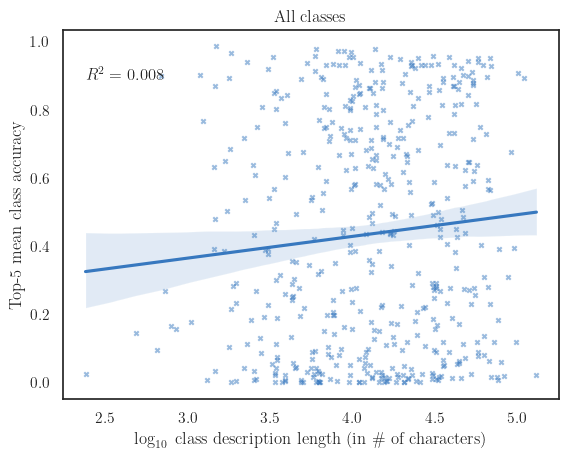

In [64]:
plt.title('All classes')
plot_fig(df, save='simple_zsl_albert_outputs/class_accuracy_vs_description_length')

2022-11-29 21:37:40,169 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:40,170 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:40,170 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:40,171 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:40,171 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:40,172 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:40,172 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:40,173 DEBUG              texmanager._get_font_preamble

2022-11-29 21:37:40,364 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/0170479562998a9385fd9d160435d809.dvi
2022-11-29 21:37:40,365 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:40,366 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:40,368 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:40,369 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:40,370 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:40,370 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:40,3

2022-11-29 21:37:40,501 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:40,502 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:40,503 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:40,503 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:40,504 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:40,504 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:40,504 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:40,505 DEBUG              texmanager._get_font_preamble

2022-11-29 21:37:40,636 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:40,636 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:40,637 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:40,637 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:40,638 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:40,638 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:40,639 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:40,640 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:37:40,760 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:40,761 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:40,762 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:40,764 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:40,766 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:40,767 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:40,768 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:40,771 DEBUG              texm

2022-11-29 21:37:40,894 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:40,894 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:40,895 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:40,895 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:40,896 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:40,897 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:40,898 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:40,898 DEBUG     

2022-11-29 21:37:41,034 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:41,034 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:41,035 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:41,036 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:41,036 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:41,037 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:41,038 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:41,038 DEBUG              texmanager._get_font_preamble

2022-11-29 21:37:41,149 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:41,150 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:41,150 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:41,151 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:41,152 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:41,153 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:41,153 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:41,154 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:37:41,358 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:41,359 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:41,360 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:41,360 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:41,361 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:41,361 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:41,362 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:41,362 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:37:41,427 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:41,428 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/e561c136bae629f27c4646a92b46d0e4.dvi
2022-11-29 21:37:41,431 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:41,431 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:41,433 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:41,434 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:41,435 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \use

2022-11-29 21:37:41,486 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:41,488 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:41,488 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:41,489 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:41,489 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:41,490 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:41,491 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:41,491 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:37:41,649 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/a8ba6365cdc7b835a6f1e78c1a0cf776.dvi
2022-11-29 21:37:41,650 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:41,650 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:41,683 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:41,684 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:41,684 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:41,685 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:41,6

2022-11-29 21:37:41,919 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:41,920 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:41,921 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:41,922 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:41,923 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:41,924 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:41,926 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:41,927 DEBUG              texmanager._get_font_preamble

2022-11-29 21:37:42,068 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:42,069 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:42,070 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:42,071 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:42,073 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/2442ac1f214c5b205707b2d4bdd482f7.dvi
2022-11-29 21:37:42,074 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:42,075 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:37:42,128 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:42,129 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:42,131 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:42,133 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:42,134 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:42,135 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:42,136 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:42,138 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:37:42,217 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:42,218 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:42,223 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/350d68b13c92545c8bfb77070611ea0e.dvi
2022-11-29 21:37:42,224 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:42,225 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:42,234 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:42,236 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:37:42,306 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:42,307 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:42,308 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:42,309 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:42,309 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:42,310 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:42,310 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:42,311 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:37:42,356 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/c089d6a2afbc27e09192a23f714adff3.dvi
2022-11-29 21:37:42,359 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:42,360 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:42,362 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:42,363 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:42,363 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:42,364 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:42,3

2022-11-29 21:37:42,426 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:42,427 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:42,427 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:42,428 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:42,429 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:42,429 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:42,430 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:42,431 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:37:42,495 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/465acd955c8c3db10b1bc3bce338a23a.dvi
2022-11-29 21:37:42,496 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:42,497 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:42,507 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:42,510 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:42,511 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:42,512 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:42,5

2022-11-29 21:37:42,614 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:42,615 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:42,616 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:42,617 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:42,619 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:42,620 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:42,620 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:42,621 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:37:42,672 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/08c668c3ef8b459ca81c82bdc5afa8da.dvi
2022-11-29 21:37:42,673 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:42,674 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:42,678 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:42,679 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:42,679 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:42,680 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:42,6

2022-11-29 21:37:42,741 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:42,742 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:42,742 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:42,743 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:42,743 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:42,743 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:42,744 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:42,744 DEBUG              texmanager._get_font_preambl

2022-11-29 21:37:42,808 DEBUG              _type1font.            __init__ -:- type1font._Token number at 566: '5087385'
2022-11-29 21:37:42,809 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 574: 'eq'
2022-11-29 21:37:42,810 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 577: 'exch'
2022-11-29 21:37:42,810 DEBUG              _type1font.            __init__ -:- type1font._Token name at 581: '/FontType'
2022-11-29 21:37:42,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 591: 'get'
2022-11-29 21:37:42,812 DEBUG              _type1font.            __init__ -:- type1font._Token number at 595: '1'
2022-11-29 21:37:42,813 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 597: 'eq'
2022-11-29 21:37:42,813 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 600: 'and'
2022-11-29 21:37:42,814 DEBUG              _type1font.

2022-11-29 21:37:42,873 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 855: 'dict'
2022-11-29 21:37:42,874 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 860: 'dup'
2022-11-29 21:37:42,875 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 864: 'begin'
2022-11-29 21:37:42,876 DEBUG              _type1font.            __init__ -:- type1font._Token name at 871: '/version'
2022-11-29 21:37:42,876 DEBUG              _type1font.            __init__ -:- type1font._Token string at 880: '(003.002)'
2022-11-29 21:37:42,877 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 890: 'readonly'
2022-11-29 21:37:42,877 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 899: 'def'
2022-11-29 21:37:42,877 DEBUG              _type1font.            __init__ -:- type1font._Token name at 904: '/Notice'
2022-11-29 21:37:42,879 DEBUG           

2022-11-29 21:37:42,927 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1416: '3'
2022-11-29 21:37:42,927 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1418: '/Lambda'
2022-11-29 21:37:42,928 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1426: 'put'
2022-11-29 21:37:42,930 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1430: 'dup'
2022-11-29 21:37:42,930 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1434: '4'
2022-11-29 21:37:42,931 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1436: '/Xi'
2022-11-29 21:37:42,932 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1440: 'put'
2022-11-29 21:37:42,933 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1444: 'dup'
2022-11-29 21:37:42,933 DEBUG              _type1font.  

2022-11-29 21:37:42,975 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1716: 'put'
2022-11-29 21:37:42,976 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1720: 'dup'
2022-11-29 21:37:42,976 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1724: '21'
2022-11-29 21:37:42,977 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1727: '/lambda'
2022-11-29 21:37:42,977 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1735: 'put'
2022-11-29 21:37:42,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1739: 'dup'
2022-11-29 21:37:42,979 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1743: '22'
2022-11-29 21:37:42,980 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1746: '/mu'
2022-11-29 21:37:42,981 DEBUG              _type1font.

2022-11-29 21:37:43,033 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2011: '38'
2022-11-29 21:37:43,034 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2014: '/sigma1'
2022-11-29 21:37:43,034 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2022: 'put'
2022-11-29 21:37:43,035 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2026: 'dup'
2022-11-29 21:37:43,036 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2030: '39'
2022-11-29 21:37:43,036 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2033: '/phi1'
2022-11-29 21:37:43,037 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2039: 'put'
2022-11-29 21:37:43,038 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2043: 'dup'
2022-11-29 21:37:43,039 DEBUG              _type1fon

2022-11-29 21:37:43,093 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2445: '/sevenoldstyle'
2022-11-29 21:37:43,093 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2460: 'put'
2022-11-29 21:37:43,094 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2464: 'dup'
2022-11-29 21:37:43,095 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2468: '56'
2022-11-29 21:37:43,095 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2471: '/eightoldstyle'
2022-11-29 21:37:43,099 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2486: 'put'
2022-11-29 21:37:43,099 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2490: 'dup'
2022-11-29 21:37:43,100 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2494: '57'
2022-11-29 21:37:43,100 DEBUG       

2022-11-29 21:37:43,148 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2760: 'dup'
2022-11-29 21:37:43,149 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2764: '73'
2022-11-29 21:37:43,150 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2767: '/I'
2022-11-29 21:37:43,150 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2770: 'put'
2022-11-29 21:37:43,150 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2774: 'dup'
2022-11-29 21:37:43,151 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2778: '74'
2022-11-29 21:37:43,151 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2781: '/J'
2022-11-29 21:37:43,152 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2784: 'put'
2022-11-29 21:37:43,152 DEBUG              _type1font.      

2022-11-29 21:37:43,201 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3005: '/Z'
2022-11-29 21:37:43,202 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3008: 'put'
2022-11-29 21:37:43,203 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3012: 'dup'
2022-11-29 21:37:43,203 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3016: '91'
2022-11-29 21:37:43,204 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3019: '/flat'
2022-11-29 21:37:43,205 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3025: 'put'
2022-11-29 21:37:43,208 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3029: 'dup'
2022-11-29 21:37:43,209 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3033: '92'
2022-11-29 21:37:43,209 DEBUG              _type1font.   

2022-11-29 21:37:43,253 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3293: 'dup'
2022-11-29 21:37:43,254 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3297: '108'
2022-11-29 21:37:43,255 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3301: '/l'
2022-11-29 21:37:43,255 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3304: 'put'
2022-11-29 21:37:43,256 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3308: 'dup'
2022-11-29 21:37:43,256 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3312: '109'
2022-11-29 21:37:43,257 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3316: '/m'
2022-11-29 21:37:43,257 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3319: 'put'
2022-11-29 21:37:43,258 DEBUG              _type1font.    

2022-11-29 21:37:43,310 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3570: '/weierstrass'
2022-11-29 21:37:43,310 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3583: 'put'
2022-11-29 21:37:43,311 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3587: 'dup'
2022-11-29 21:37:43,311 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3591: '126'
2022-11-29 21:37:43,312 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3595: '/vector'
2022-11-29 21:37:43,313 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3603: 'put'
2022-11-29 21:37:43,314 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3607: 'dup'
2022-11-29 21:37:43,314 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3611: '127'
2022-11-29 21:37:43,315 DEBUG              

2022-11-29 21:37:43,359 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3899: 'dup'
2022-11-29 21:37:43,359 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3903: '176'
2022-11-29 21:37:43,360 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3907: '/gamma'
2022-11-29 21:37:43,360 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3914: 'put'
2022-11-29 21:37:43,360 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3918: 'dup'
2022-11-29 21:37:43,361 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3922: '177'
2022-11-29 21:37:43,361 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3926: '/delta'
2022-11-29 21:37:43,362 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3933: 'put'
2022-11-29 21:37:43,362 DEBUG              _type1f

2022-11-29 21:37:43,410 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4216: '/phi'
2022-11-29 21:37:43,413 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4221: 'put'
2022-11-29 21:37:43,414 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4225: 'dup'
2022-11-29 21:37:43,414 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4229: '194'
2022-11-29 21:37:43,415 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4233: '/chi'
2022-11-29 21:37:43,415 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4238: 'put'
2022-11-29 21:37:43,416 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4242: 'dup'
2022-11-29 21:37:43,417 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4246: '195'
2022-11-29 21:37:43,417 DEBUG              _type1font.

2022-11-29 21:37:43,459 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4555: '-22'
2022-11-29 21:37:43,459 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4559: '0'
2022-11-29 21:37:43,460 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4561: '431'
2022-11-29 21:37:43,460 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4565: '442'
2022-11-29 21:37:43,461 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4569: '453'
2022-11-29 21:37:43,462 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4573: '466'
2022-11-29 21:37:43,463 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4577: '683'
2022-11-29 21:37:43,463 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4581: '705'
2022-11-29 21:37:43,464 DEBUG              _type1font.    

2022-11-29 21:37:43,524 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5026: 'ifelse'
2022-11-29 21:37:43,525 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5032: '}'
2022-11-29 21:37:43,526 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5034: '{'
2022-11-29 21:37:43,527 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5035: 'userdict'
2022-11-29 21:37:43,528 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5044: '/internaldict'
2022-11-29 21:37:43,528 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5058: 'known'
2022-11-29 21:37:43,529 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5064: 'not'
2022-11-29 21:37:43,529 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5068: '{'
2022-11-29 21:37:43,530 DEBUG  

2022-11-29 21:37:43,572 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5424: 'known'
2022-11-29 21:37:43,572 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5430: '{'
2022-11-29 21:37:43,573 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5431: 'save'
2022-11-29 21:37:43,573 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5436: 'true'
2022-11-29 21:37:43,574 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5440: '}'
2022-11-29 21:37:43,574 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5442: '{'
2022-11-29 21:37:43,574 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5443: 'false'
2022-11-29 21:37:43,575 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5448: '}'
2022-11-29 21:37:43,575 DEBUG             

2022-11-29 21:37:43,620 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5810: '/mtx'
2022-11-29 21:37:43,621 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5815: 'matrix'
2022-11-29 21:37:43,622 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5822: 'def'
2022-11-29 21:37:43,622 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5826: 'dup'
2022-11-29 21:37:43,625 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5830: '/$FlxDict'
2022-11-29 21:37:43,625 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5840: 'currentdict'
2022-11-29 21:37:43,626 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5852: 'put'
2022-11-29 21:37:43,626 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5856: 'end'
2022-11-29 21:37:43,627 DEBUG       

2022-11-29 21:37:43,676 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6169: '/c3y0'
2022-11-29 21:37:43,676 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6175: 'exdef'
2022-11-29 21:37:43,677 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6181: '/c3x0'
2022-11-29 21:37:43,677 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6187: 'exdef'
2022-11-29 21:37:43,678 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6193: '/c1y2'
2022-11-29 21:37:43,679 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6199: 'exdef'
2022-11-29 21:37:43,679 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6205: '/c1x2'
2022-11-29 21:37:43,680 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6211: 'exdef'
2022-11-29 21:37:43,681 DEBUG              _

2022-11-29 21:37:43,736 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6506: 'exdef'
2022-11-29 21:37:43,742 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6512: '/x2'
2022-11-29 21:37:43,742 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6516: 'exdef'
2022-11-29 21:37:43,743 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6522: '/y1'
2022-11-29 21:37:43,743 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6526: 'exdef'
2022-11-29 21:37:43,744 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6532: '/x1'
2022-11-29 21:37:43,745 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6536: 'exdef'
2022-11-29 21:37:43,745 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6542: '/y0'
2022-11-29 21:37:43,746 DEBUG              _type1fon

2022-11-29 21:37:43,778 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6816: 'systemdict'
2022-11-29 21:37:43,779 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6827: '/internaldict'
2022-11-29 21:37:43,786 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6841: 'get'
2022-11-29 21:37:43,787 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6845: 'exec'
2022-11-29 21:37:43,787 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6850: 'dup'
2022-11-29 21:37:43,788 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6854: '/erosion'
2022-11-29 21:37:43,788 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6863: 'known'
2022-11-29 21:37:43,789 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6869: '{'
2022-11-29 21:37:43,789 DEBUG

2022-11-29 21:37:43,839 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7126: 'yshrink'
2022-11-29 21:37:43,840 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7134: 'def'
2022-11-29 21:37:43,840 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7138: '/c2y0'
2022-11-29 21:37:43,841 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7144: 'c4y0'
2022-11-29 21:37:43,841 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7149: 'yshrink'
2022-11-29 21:37:43,841 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7157: 'def'
2022-11-29 21:37:43,842 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7161: '/c2y1'
2022-11-29 21:37:43,842 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7167: 'c4y1'
2022-11-29 21:37:43,843 DEBUG           

2022-11-29 21:37:43,888 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7441: 'c1y2'
2022-11-29 21:37:43,888 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7446: 'sub'
2022-11-29 21:37:43,889 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7450: 'round'
2022-11-29 21:37:43,889 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7456: 'dtransform'
2022-11-29 21:37:43,890 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7467: 'flipXY'
2022-11-29 21:37:43,891 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7474: '1'
2022-11-29 21:37:43,891 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7476: 'eq'
2022-11-29 21:37:43,891 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7479: '{'
2022-11-29 21:37:43,892 DEBUG          

2022-11-29 21:37:43,936 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7701: 'def'
2022-11-29 21:37:43,936 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7705: 'erode'
2022-11-29 21:37:43,937 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7711: '{'
2022-11-29 21:37:43,938 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7712: '/ey'
2022-11-29 21:37:43,938 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7716: 'ey'
2022-11-29 21:37:43,939 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7719: '0.5'
2022-11-29 21:37:43,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7723: 'add'
2022-11-29 21:37:43,940 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7727: 'def'
2022-11-29 21:37:43,940 DEBUG              _type1fo

2022-11-29 21:37:43,991 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7968: 'c4x2'
2022-11-29 21:37:43,992 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7973: 'sub'
2022-11-29 21:37:43,992 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7977: 'c3x2'
2022-11-29 21:37:43,993 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7982: 'c4x2'
2022-11-29 21:37:43,993 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7987: 'sub'
2022-11-29 21:37:43,993 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7991: 'div'
2022-11-29 21:37:43,994 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7995: 'abs'
2022-11-29 21:37:43,994 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7998: '}'
2022-11-29 21:37:43,995 DEBUG              _t

2022-11-29 21:37:44,056 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8301: 'x2'
2022-11-29 21:37:44,056 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8304: 'c1x2'
2022-11-29 21:37:44,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8309: 'sub'
2022-11-29 21:37:44,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8313: 'abs'
2022-11-29 21:37:44,058 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8317: '0.001'
2022-11-29 21:37:44,058 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8323: 'gt'
2022-11-29 21:37:44,059 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8326: '{'
2022-11-29 21:37:44,059 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8328: 'c1x2'
2022-11-29 21:37:44,060 DEBUG              _typ

2022-11-29 21:37:44,110 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8569: '.5'
2022-11-29 21:37:44,110 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8572: 'ge'
2022-11-29 21:37:44,111 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8575: 'and'
2022-11-29 21:37:44,112 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8579: 'def'
2022-11-29 21:37:44,113 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8583: 'erode'
2022-11-29 21:37:44,114 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8589: '{'
2022-11-29 21:37:44,116 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8590: '/cx'
2022-11-29 21:37:44,117 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8594: 'cx'
2022-11-29 21:37:44,118 DEBUG              _type1font

2022-11-29 21:37:44,186 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8837: '}'
2022-11-29 21:37:44,187 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8839: 'ifelse'
2022-11-29 21:37:44,187 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8846: '}'
2022-11-29 21:37:44,188 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8848: 'ifelse'
2022-11-29 21:37:44,188 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8855: 'x2'
2022-11-29 21:37:44,189 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8858: 'x5'
2022-11-29 21:37:44,189 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8861: 'eq'
2022-11-29 21:37:44,190 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8864: 'y2'
2022-11-29 21:37:44,192 DEBUG              _ty

2022-11-29 21:37:44,228 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9163: 'exch'
2022-11-29 21:37:44,229 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9168: '/FlxProc'
2022-11-29 21:37:44,230 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9177: 'exch'
2022-11-29 21:37:44,230 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9182: 'put'
2022-11-29 21:37:44,231 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9186: 'true'
2022-11-29 21:37:44,231 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9190: '}'
2022-11-29 21:37:44,232 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9192: '{'
2022-11-29 21:37:44,237 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9193: '1183615869'
2022-11-29 21:37:44,237 DEBUG        

2022-11-29 21:37:44,278 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9558: 'if'
2022-11-29 21:37:44,278 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9561: '{'
2022-11-29 21:37:44,279 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9562: 'gsave'
2022-11-29 21:37:44,280 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9568: 'currentpoint'
2022-11-29 21:37:44,280 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9581: 'newpath'
2022-11-29 21:37:44,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9589: 'moveto'
2022-11-29 21:37:44,282 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9595: '}'
2022-11-29 21:37:44,283 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9597: 'executeonly'
2022-11-29 21:37:44,283

2022-11-29 21:37:44,317 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9899: 'ND'
2022-11-29 21:37:44,318 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9902: '/Subrs'
2022-11-29 21:37:44,318 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9909: '8'
2022-11-29 21:37:44,319 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9911: 'array'
2022-11-29 21:37:44,319 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9917: 'dup'
2022-11-29 21:37:44,319 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9921: '0'
2022-11-29 21:37:44,320 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9923: '15'
2022-11-29 21:37:44,320 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9926: 'RD'
2022-11-29 21:37:44,321 DEBUG              _type1font.  

2022-11-29 21:37:44,367 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10360: b' \x10\xbf1py\xc8/\x06\x80'
2022-11-29 21:37:44,368 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10371: 'ND'
2022-11-29 21:37:44,369 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10374: '/Gamma'
2022-11-29 21:37:44,370 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10381: '206'
2022-11-29 21:37:44,371 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10385: 'RD'
2022-11-29 21:37:44,372 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10387: b' \x10\xbf1p@\xc2\x94W\x98\x9c\xfe\xce\x8f\xe1\xa01\r\xc7\x11\x1c\x8a\xbed\xbd\xb3W\x8esgi\xe4\x84\xfe\x80A\x12\xcdR\x10`\x7f\xc3"|\x16\x14\xc61\x14\xe8\xa5\xcf6\xd0\xf5\x82\xcd\x05\x9e\x11\xa7\xeek\x0cgz\x9c.D:{ \xcbsd\x84\xd6\x90\xc9k+s\x7fQ\x96H\xe4p\xdc\xf0\xf8\x

2022-11-29 21:37:44,401 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11895: 'ND'
2022-11-29 21:37:44,401 DEBUG              _type1font.            __init__ -:- type1font._Token name at 11898: '/Upsilon'
2022-11-29 21:37:44,402 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11907: '265'
2022-11-29 21:37:44,402 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11911: 'RD'
2022-11-29 21:37:44,404 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11913: b" \x10\xbf1pU\xd1\xe9\xe6)V\xa7\x8b\x16\xf5\xe62\x1e\xea+0\xc6f\x03WN&L\xc9\x90\xa2\xe5/6\xdc#fEE\xf1\x82\xc6\x9f\xd8\xc43i?\xfdfxJ\x80\x8e\x18\xa2^\xc9\x06y=\x16\xaa;vI\xe6\xc3\x92&\xc43\xb2\x0f#\x828\xe1\xdeF%W\xf7\x18\x93\xff\xbdr,\xd8\xb9\xfe\xd8\xe6[,\x86IGl\xc1\xf4\xfd\x99\x98SU\xda\xed\x9fq,\x0fKK(yt\xdf\xcbG\xd7N\\\xe5\xf0\x9a\xf2e\xe8HG\xb9\x9f\x0b\xd9\t\x8b\x0e\xd0AX8\xef\xb7xS\xc7\xd74<\xc0l\x

2022-11-29 21:37:44,422 DEBUG              _type1font.            __init__ -:- type1font._Token name at 13598: '/gamma'
2022-11-29 21:37:44,423 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13605: '143'
2022-11-29 21:37:44,423 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13609: 'RD'
2022-11-29 21:37:44,424 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13611: b' \x10\xbf1po\xd8\x1fa\xe6x\x0b\xcfK\x02(b\xe2\xc4\xbax\xe4\x11\xf9\x96#\x08\x9c\xaeO\xd1dcW\xac\xf6Z\x7f5~iN\x01\x15\xf5M|\x14;\xc3\x837\xae\x8d\xea\xe4\xf0/\x00#ky\x01\xc33\xb2\xf0Fg\xcb\xe4\xd5\x08xS\x18\xa7\xd9 s\x8a%\x12u\x00\xceB\nL\x97\x91fT\x14\x12\xd0,\xb1\'+\x1fP\x13"\xc2\xa2\x99\x8f\xde\xa4\xd7Fo\xd1\xc8\xc4/\xa9q\x97\xbdv\xbd\x0f\xd0\x81dQ\x142w\xc2\x15\xa6i\xdf\x98K\xceCy"^\xcc'
2022-11-29 21:37:44,424 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13756: 'ND'
2022-11-29 21:

2022-11-29 21:37:44,443 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15031: 'ND'
2022-11-29 21:37:44,444 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15034: '/lambda'
2022-11-29 21:37:44,444 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15042: '121'
2022-11-29 21:37:44,445 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15046: 'RD'
2022-11-29 21:37:44,445 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15048: b' \x10\xbf1p2\x08\xd9v\xdct\x0en-\xfe\xaf\x81(\x94]\x00\xd0~eU(\xf4\x8a\xc6f5\'kV\x18`\xb5\xd2\\\x82\x08\xa1\xe4\xcf\xefpe\x85\x19\x96\x93\xd4\xc1\xd7>)\x19\xa1\xfd\xcd{\xd5|\xd2F\r$\xdb\xa18\xd6\xf8\xf4\xcfx9\xeb\xbd@\xd6\x170\xf0{W>\xd0\x18\xd2\xc53^\xdfr>\xc3S9\xd8?"x\xad\xbb\x13\xf4\x8f\xa7b\xa7\xa1M\xea!\xc9\xcdO1\x83\x9e9\xe8'
2022-11-29 21:37:44,448 DEBUG              _type1font.            __init_

2022-11-29 21:37:44,472 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16408: b' \x10\xbf1pT\xa2\xfb\xd5[\x95fv\xf6C\xbcQ3w>\xe2i\xfcy\xbcWAe\xca\xb9\xc4\x99TL\xe8\xa6\xc3Q8C!\x16\x03\xcad.\xe3\x1e\xc0k\xb9\x0f2\\\xca\xd1GR\tv\x16\x80\xe7\x80\xf8~\xd8g!.\x1f\x19\x0c\xcc}\xe9Rt\xd1@\x02\xcf\x81\x8a>\xf5%9$\x81\xfbs\xbd\xdcPy\xe8'
2022-11-29 21:37:44,472 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16506: 'ND'
2022-11-29 21:37:44,473 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16509: '/upsilon'
2022-11-29 21:37:44,473 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16518: '164'
2022-11-29 21:37:44,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16522: 'RD'
2022-11-29 21:37:44,474 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16524: b" \x10\xbf1pZ\xc9s,\x90n\xe8|\xfa\xd4\xe4

2022-11-29 21:37:44,500 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17996: 'ND'
2022-11-29 21:37:44,501 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17999: '/pi1'
2022-11-29 21:37:44,502 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18004: '211'
2022-11-29 21:37:44,502 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18008: 'RD'
2022-11-29 21:37:44,502 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18010: b' \x10\xbf1pT\xa3P\x9d\x94\x93\xcdO\xc8\\i\x86\xc2L`\xce\x81@\x00\xa7\x12Y\xee\x93!\xdd\x87\x83\xa1\xac\x0e\xabz*F/\x89\x90;n(eM\xc4\xe9\xe2F2+\x85f\x18\x13\'\x10T\xfb\x14i\x0b\xf5\x7f3\x1fz|\xdfQQEz\xb8\x97\xe2\xdd,\xb5\xb3!E\xedD}\t0\x05\xaa+\xc5\x9f\xb5\xc8\x11?EGeU\x039\xb9O\x18+\xfd[$b:\x91\x9d7\xd9\x1c\xb6\xb4\x86\x01\xa8\xd4\x1ac\xa2\x04\x97n\xc8\x03\xb2;D\x08\xe0\xf24\x1f*7b\xfdVw\xfe\xa5\x1b\xa7\xc7

2022-11-29 21:37:44,530 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19239: b' \x10\xbf1p0\xa41\xaf\xb3W\xdb\x87\x9aI\xd3(5d\x19\x97o\x02\xe4\xb6\xa8d\x15}\xffF]\xed\xcf?]\x0b\x88\xddi\xa4\x1c\x0c\xe7\x0f\x18\x8f\x90:\xe0\xb7q\x91~1$\xbd\x89\x0e\xb7\xd2\x9b\xe9\xfd\xcd\xebSY\xe4\x97\xbe!\xfd\xa6\xe3'
2022-11-29 21:37:44,531 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19315: 'ND'
2022-11-29 21:37:44,531 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19318: '/arrowhookright'
2022-11-29 21:37:44,533 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19334: '75'
2022-11-29 21:37:44,533 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19337: 'RD'
2022-11-29 21:37:44,534 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19339: b' \x10\xbf1p0\xa41\xaf\xb3W\xdb\x87\x9aI\xd3(N\xed\x15\xb5\xf6

2022-11-29 21:37:44,558 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20506: '204'
2022-11-29 21:37:44,559 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20510: 'RD'
2022-11-29 21:37:44,559 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20512: b' \x10\xbf1pO\xaa\xa9P!\xb9\x18\x19\x86\xe87v\x9a5\xd0\x97\xd6\x85P\xe9\xb5LH\xad`\x83\x8b\xd6\xc8\x0fA\x07D\xa7>\xc5\x1ax\x85\x9d\xbf\xb6v\xf1\xa9<\xdaT\'q\x118\xd8/s\x8e\xe9,\x0c\xff{$My.\x94kx\xdc\xee\xd0E\x82\x1f\\DT\x11\xea\xe0tJ\xed@\xf0\xcdK\x0c4\xe6\x83`{\xb9L"7_2h\xe1*\x1e\xb4\x8e\xef$\xf51\xab\x0e)dj\xebg`\xba\x1bo\x81\xa1\xbd4\xd2AV\xeam\xa8\xdaw/\x10Z\xa5\x8d\xae\x92\xc8\nOc\x95\x83|Z\xcb\x0c\xd0\xbf\xd4aC\x94\xf4\xcec\x91\xc9&\x92^\xc3\xae@\x1d\x94\x98\'\xc7\x07\x06M\xc2A\xe2J\x0eE\xac\x9d\xba\xcf\xa3W\x1d\xe34"\xff@@\xa5\x14\xdd\\\xac\x96\x9f'
2022-11-29 21:37:44,560 DEBUG              _type1font.            __init__ -:- type1

2022-11-29 21:37:44,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21838: 'ND'
2022-11-29 21:37:44,604 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21841: '/greater'
2022-11-29 21:37:44,605 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21850: '93'
2022-11-29 21:37:44,607 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21853: 'RD'
2022-11-29 21:37:44,608 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21855: b' \x10\xbf1p,\xe0\r\xd5\x0b\x1f\x9fu\xcd"\x1b~QW\r\x94\xf5R\xde\x1c\xf3hx\xef\'\xeaX+E\xc7\xf0\xfa\xa7A\xbd\\\x91Bnn\xef\xf1\x98e\n\x97+\xa2bl\t\xc5\x9b\x82\xf7+\xad\xb7>\xbd\xd1\xa3F\x83\xfbW\xf2[W\xbf\xdbs\tH\xfbE\xa1s\x94\x97#dE1_\xc402\x06'
2022-11-29 21:37:44,611 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21950: 'ND'
2022-11-29 21:37:44,611 DEBUG              _

2022-11-29 21:37:44,631 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23378: 'ND'
2022-11-29 21:37:44,637 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23381: '/F'
2022-11-29 21:37:44,637 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23384: '279'
2022-11-29 21:37:44,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23388: 'RD'
2022-11-29 21:37:44,638 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23390: b' \x10\xbf1pC\\\xe8K\xd5fV8\x1f\xd2/\xcf;\xd9u\x10\xd7Lk>\xc9\xfd\x0fq\xfe[\xdaL\xe6\xa2hvo\x08\xecu\x1d\x96\xe6\xa4\xeaX\xc0\x0f\xec\x98\xfa:~W\xd2\xcf\xb7\xeb\x90\xac8\xc2\xe1E\xd0\xc0x8\n\xfaq\x1b\xe1\xc3gh\x1a\x9d\x1b^^w\x7f\xd4\xf8J]\x1e\x1fg\x0e\x9c{\xa9\xaeq\xa5\x07\xe6\x03\x92\xa7\x9aj\x8e\xe5\x94\xf5\xf6[\x0b\x91*\x9e\xca\xf8@\x80[\x03\x18\xe2\xedlPE=o|\x1d\x9b\x03<\x0b2\xb2\xea\xd3\x1c\x9a\x12\xf0\xe

2022-11-29 21:37:44,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25141: 'ND'
2022-11-29 21:37:44,656 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25144: '/L'
2022-11-29 21:37:44,656 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25147: '203'
2022-11-29 21:37:44,657 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25151: 'RD'
2022-11-29 21:37:44,658 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25153: b" \x10\xbf1p@\xc3\x027\xf9\xaa\x85\xa2\x127\xde2h]\x0c\xed\xcet\xd0\xd4-/\x01\x08X\xa0\xac\xa66\x9a/J2@\xa92\xb6\xfcO\x17JW99\xa4\xaa\xb3H[)y\xb6h\xc6TkD\xd9s\xca\x9a ;W\x0c\x18\xde\xb3\x00\xc5X\xd1;\x13\xfcb(_D,\x8d\x84\xb5I\xdanu+\xfc\xbe\xfb\x98\xe7\x9f\xa5O\xd8\xa3\xef\x12\x8c\x0f\xae\x18\xf7z\x9f\xc8i'\xc7\xd4\x13\x80\xb6\xeese\xb2\xb4X.^6\x85N\x80\x85K\x86\x83vA\x92\xdep\xc2\xaa\xc5\xe5\x18\xfa\x9ao+\t\x

2022-11-29 21:37:44,677 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26795: 'ND'
2022-11-29 21:37:44,677 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26798: '/S'
2022-11-29 21:37:44,678 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26801: '213'
2022-11-29 21:37:44,679 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26805: 'RD'
2022-11-29 21:37:44,680 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26807: b' \x10\xbf1pMM\x16N\xf28\xed\xfc\xd3H\xa3\xadh\xcaC,\xd3\xd1\xad\x05\xa8\x985\xca.6\xa9P\x1c\x89\xadq\x7f\x0c\xb5\xe9\xc46q"\'6+\x9cT4\x86<\x00\x882\xe0\x81 \xd0~y"\xfd\x16\xd2Vw"//\xdb\x8a\xfa?\xb0\xb6*`\xbdT\xbcNxB\xd0\xf3\xf5!I\xf0_\x98\xfb\xfa\x8dfk|\xa3\r\xc9:@\'/\x80<)\x1b\xdd0\xf5P\xde\xb6\xed\xf2\x12\x99X\x13\xc4Z\xf6\x1cbJ\xc2\x16uMA\xd8#(\xbe\xe0\x7fq\xda7\xd3)V \xcdZ\xbamD\xaf\x05W\xc1\xbd\xb5\xc2\x

2022-11-29 21:37:44,712 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28544: 'ND'
2022-11-29 21:37:44,712 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28547: '/Y'
2022-11-29 21:37:44,713 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28550: '326'
2022-11-29 21:37:44,714 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28554: 'RD'
2022-11-29 21:37:44,714 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28556: b" \x10\xbf1p\\6\xb7\xc8\x8b3\xc7\x1b\x00U\xe6\xa6\x04\x9emt\xa4\xd9*\xa0\x01p$\xf0\x16&\x08\xc5E\xb9J\xeb\xb7N\xf3\x11pP\x80\xcc\x8a\xa9\x0f\xea\xf2\xf2\n\x1d\r\xc9\xe1\x8f;\xeb\x8f\xfa.\x02\x02\xa50\xd0\xf2\xf3\x91\xc9e|@\xa6\xc5T\xcdI\x11\x90\x03;64\x81I\xbd\xea\x18m0\xfdS\x15\xd1g\xcf\x10\xfc\rk\r\xd42\x1f\x94\x81\x01:Q\x96-\x13Z\x96Pu\x02\rQ\xc2Ej\xb48P\x08:\xf5NN\x19m)\x95\xd3\xf2'QL\xc1\x0b\xcdg\xf7\xab\

2022-11-29 21:37:44,743 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29978: 'ND'
2022-11-29 21:37:44,743 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29981: '/a'
2022-11-29 21:37:44,744 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29984: '141'
2022-11-29 21:37:44,745 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29988: 'RD'
2022-11-29 21:37:44,746 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29990: b' \x10\xbf1pA\xf0\x850|\x8b\x06\x1b\xe1\x8e\x8c\xe8\x87\x99\x93#\x99\xc6)\xec\x9d\xcfS\xda\xb2\xb3I\xc9\x91\xe4\x98\x83Y\xb0\'K\xef(\xa0\x14\xb4J\xc66\xac\x8b\x0c\x04"8;[\xd3I\xc8.\xc1I\xfc\xc2`Z\x95\x8aR1\xea\xdd\xdfV\x97kx0\r\xe0\x1a\xb45L\xd1\xcd\xa0\x02\xc3pX\xb7\xf4\xbc\x91\x17k\x87\xc8\x1d\xaf\x07\xc1\xdc\xbe\xf7\x92\x1b\xca8\xbf\xe6:\xbc\xc4{\xd8\xf1\xb9s4\x1fBz\xc0e\xa0\x00\x0e<\x7fQ"z\xc0}\xc2\x80\x8e

2022-11-29 21:37:44,778 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31369: 'ND'
2022-11-29 21:37:44,778 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31372: '/i'
2022-11-29 21:37:44,779 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31375: '59'
2022-11-29 21:37:44,780 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31378: 'RD'
2022-11-29 21:37:44,783 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31380: b' \x10\xbf1pZ\xc6\xbbm\xb1\x94B\x0c\xeb\x91\x96\xe9\x8a\xea\x84\x8b\x01ePFL\xef\x04\xddG\xd9(\xf3\xc0C\xbcG$\xbd\x1c\x91(\x87\x16\xbf`\x1e\x14\x0b\xa9\xa8{3\xa2)\xea\x8e\x95\xba\x01'
2022-11-29 21:37:44,784 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31441: 'ND'
2022-11-29 21:37:44,785 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31444: '

2022-11-29 21:37:44,813 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32921: 'ND'
2022-11-29 21:37:44,814 DEBUG              _type1font.            __init__ -:- type1font._Token name at 32924: '/q'
2022-11-29 21:37:44,815 DEBUG              _type1font.            __init__ -:- type1font._Token number at 32927: '206'
2022-11-29 21:37:44,815 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32931: 'RD'
2022-11-29 21:37:44,816 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 32933: b" \x10\xbf1pA\xf0s\xb4jVgOX\x99\xbf\xb0r\x18+l\xc1\xcaT\xef.\xe5\x19\xa1\xddt\xca\xdc\x04\x11\xae\x13\xae\xaa\xaa\xe9Y\x98\xa9\x84\x94n\xa6\x96\xba\xe0Q\xda#,C\x95\xf1-4\\l\x1d\xdc-\x7f\xbc\xbf\xa9tJ\x93\x01\x0e\x8a\x1c<\xe2\xbdNA\xca\x0b\r\xc0\xe9\xc8%M'\x19%\xef_\x91\x89\xc7\x80Mb`\x7f\x92\xeds\xa0\x1e:52Vd\x873\xd3\x9f\xfc\x99&\xb4\x9c\xdaW\xc2\x05\xd3F\x99\xfd\x12\xbc\xd7\xcc\xe4d\x8b\x13\x0f\xa9\xbb\x06\x

2022-11-29 21:37:44,848 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34275: b" \x10\xbf1pZ\xc9\x0c\x1e&\xd6eU\xe4!W\xe9\x8dK\x04)\t\xff\xbe\xf6\xb0'\x14p\x14A0S\xe3\xfc\xfbtl\xa2\xf6\xbf\xa0\xe4\xfcT\\\xc1\x1fMrQB\xc2\x1e\xfeg\xad\x06n\xeb<\xb6w0\x82x\xab/\xa7\xd9\xd0`9o@\x1d\xaa\xc5j\xa4:L\xe0~,vy\xbd\xb9Y$\xe0\xa1\xbd\xdc\\6\xa8~\xb4\xaa\xd4\x16\xeb\x92\xdbj\xbcZjGu\xd7\x19\xa7\xa6&\x10=\xc8\xc5\xd2\xec.\xe2q\xc2V\xa0\xa9\xd7(\xed\x17\xe3\xc4L\xa0tMgQ\xfe6\x8aJ\xaa\xa3\x0f\xc6\xeb\xdc\x1c\x08\x0fd\x94\xbc\xa1\x9c\xf16y\xafiG\x82\x01\xb5\xc8\xf7\xaf\xbc\x14\x92hvg\x9b\xc9\xbd\xd9\x96\xc8\r\xab\xe0\xf9\xc3N\x02\x04\xfe\xa1\x19\xfc\x84\tH0b=\xd92\xebX!\xbc\xa3X\xd9\xe5"
2022-11-29 21:37:44,849 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34488: 'ND'
2022-11-29 21:37:44,849 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34491: '/y'
2022-11-29 21:37:44,850 DEBUG              _type1f

2022-11-29 21:37:44,867 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35637: 'ND'
2022-11-29 21:37:44,867 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35640: 'end'
2022-11-29 21:37:44,867 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35644: 'end'
2022-11-29 21:37:44,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35648: 'readonly'
2022-11-29 21:37:44,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35657: 'put'
2022-11-29 21:37:44,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35661: 'put'
2022-11-29 21:37:44,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35665: 'dup'
2022-11-29 21:37:44,869 DEBUG              _type1font.            __init__ -:- type1font._Token name at 35668: '/FontName'
2022-11-29 21:37:44,870 DEBUG    

2022-11-29 21:37:44,939 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 703: '['
2022-11-29 21:37:44,940 DEBUG              _type1font.            __init__ -:- type1font._Token number at 704: '0.001'
2022-11-29 21:37:44,940 DEBUG              _type1font.            __init__ -:- type1font._Token number at 710: '0'
2022-11-29 21:37:44,941 DEBUG              _type1font.            __init__ -:- type1font._Token number at 712: '0'
2022-11-29 21:37:44,941 DEBUG              _type1font.            __init__ -:- type1font._Token number at 714: '0.001'
2022-11-29 21:37:44,942 DEBUG              _type1font.            __init__ -:- type1font._Token number at 720: '0'
2022-11-29 21:37:44,943 DEBUG              _type1font.            __init__ -:- type1font._Token number at 722: '0'
2022-11-29 21:37:44,944 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 724: ']'
2022-11-29 21:37:44,946 DEBUG              _type1font.            

2022-11-29 21:37:44,989 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1266: '/ascent'
2022-11-29 21:37:44,990 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1274: '750'
2022-11-29 21:37:44,990 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1278: 'def'
2022-11-29 21:37:44,990 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1282: 'end'
2022-11-29 21:37:44,991 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1286: 'readonly'
2022-11-29 21:37:44,991 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1295: 'def'
2022-11-29 21:37:44,992 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1299: '/Encoding'
2022-11-29 21:37:44,993 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1309: '256'
2022-11-29 21:37:44,995 DEBUG            

2022-11-29 21:37:45,043 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1567: '/beta'
2022-11-29 21:37:45,043 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1573: 'put'
2022-11-29 21:37:45,044 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1577: 'dup'
2022-11-29 21:37:45,045 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1581: '13'
2022-11-29 21:37:45,046 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1584: '/gamma'
2022-11-29 21:37:45,047 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1591: 'put'
2022-11-29 21:37:45,048 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1595: 'dup'
2022-11-29 21:37:45,049 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1599: '14'
2022-11-29 21:37:45,050 DEBUG              _type1font

2022-11-29 21:37:45,093 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1869: 'dup'
2022-11-29 21:37:45,094 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1873: '30'
2022-11-29 21:37:45,094 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1876: '/phi'
2022-11-29 21:37:45,095 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1881: 'put'
2022-11-29 21:37:45,096 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1885: 'dup'
2022-11-29 21:37:45,096 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1889: '31'
2022-11-29 21:37:45,097 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1892: '/chi'
2022-11-29 21:37:45,098 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1897: 'put'
2022-11-29 21:37:45,104 DEBUG              _type1font.  

2022-11-29 21:37:45,144 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2244: '47'
2022-11-29 21:37:45,144 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2247: '/triangleleft'
2022-11-29 21:37:45,145 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2261: 'put'
2022-11-29 21:37:45,146 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2265: 'dup'
2022-11-29 21:37:45,146 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2269: '48'
2022-11-29 21:37:45,147 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2272: '/zerooldstyle'
2022-11-29 21:37:45,148 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2286: 'put'
2022-11-29 21:37:45,149 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2290: 'dup'
2022-11-29 21:37:45,154 DEBUG         

2022-11-29 21:37:45,221 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2631: '/partialdiff'
2022-11-29 21:37:45,225 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2644: 'put'
2022-11-29 21:37:45,226 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2648: 'dup'
2022-11-29 21:37:45,227 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2652: '65'
2022-11-29 21:37:45,233 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2655: '/A'
2022-11-29 21:37:45,233 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2658: 'put'
2022-11-29 21:37:45,234 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2662: 'dup'
2022-11-29 21:37:45,235 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2666: '66'
2022-11-29 21:37:45,236 DEBUG              _type1f

2022-11-29 21:37:45,355 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2886: 'dup'
2022-11-29 21:37:45,359 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2890: '82'
2022-11-29 21:37:45,360 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2893: '/R'
2022-11-29 21:37:45,362 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2896: 'put'
2022-11-29 21:37:45,363 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2900: 'dup'
2022-11-29 21:37:45,365 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2904: '83'
2022-11-29 21:37:45,367 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2907: '/S'
2022-11-29 21:37:45,368 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2910: 'put'
2022-11-29 21:37:45,369 DEBUG              _type1font.      

2022-11-29 21:37:45,438 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3166: '/c'
2022-11-29 21:37:45,438 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3169: 'put'
2022-11-29 21:37:45,439 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3173: 'dup'
2022-11-29 21:37:45,440 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3177: '100'
2022-11-29 21:37:45,441 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3181: '/d'
2022-11-29 21:37:45,441 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3184: 'put'
2022-11-29 21:37:45,442 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3188: 'dup'
2022-11-29 21:37:45,443 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3192: '101'
2022-11-29 21:37:45,444 DEBUG              _type1font.    

2022-11-29 21:37:45,519 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3428: 'dup'
2022-11-29 21:37:45,523 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3432: '117'
2022-11-29 21:37:45,524 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3436: '/u'
2022-11-29 21:37:45,525 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3439: 'put'
2022-11-29 21:37:45,526 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3443: 'dup'
2022-11-29 21:37:45,529 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3447: '118'
2022-11-29 21:37:45,531 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3451: '/v'
2022-11-29 21:37:45,532 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3454: 'put'
2022-11-29 21:37:45,534 DEBUG              _type1font.    

2022-11-29 21:37:45,602 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3745: '/Xi'
2022-11-29 21:37:45,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3749: 'put'
2022-11-29 21:37:45,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3753: 'dup'
2022-11-29 21:37:45,605 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3757: '166'
2022-11-29 21:37:45,606 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3761: '/Pi'
2022-11-29 21:37:45,607 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3765: 'put'
2022-11-29 21:37:45,608 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3769: 'dup'
2022-11-29 21:37:45,611 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3773: '167'
2022-11-29 21:37:45,612 DEBUG              _type1font.  

2022-11-29 21:37:45,681 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4070: 'dup'
2022-11-29 21:37:45,682 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4074: '185'
2022-11-29 21:37:45,683 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4078: '/mu'
2022-11-29 21:37:45,684 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4082: 'put'
2022-11-29 21:37:45,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4086: 'dup'
2022-11-29 21:37:45,685 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4090: '186'
2022-11-29 21:37:45,686 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4094: '/nu'
2022-11-29 21:37:45,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4098: 'put'
2022-11-29 21:37:45,687 DEBUG              _type1font.  

2022-11-29 21:37:45,735 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4397: 'executeonly'
2022-11-29 21:37:45,736 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4409: 'def'
2022-11-29 21:37:45,736 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4413: '/ND'
2022-11-29 21:37:45,737 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4416: '{'
2022-11-29 21:37:45,737 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4417: 'noaccess'
2022-11-29 21:37:45,738 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4426: 'def'
2022-11-29 21:37:45,739 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4429: '}'
2022-11-29 21:37:45,739 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4416: '{noaccess def}'
2022-11-29 21:37:45,740 DEBUG    

2022-11-29 21:37:45,799 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4704: ']'
2022-11-29 21:37:45,800 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4699: '[ 65 ]'
2022-11-29 21:37:45,801 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4706: 'ND'
2022-11-29 21:37:45,801 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4709: '/ForceBold'
2022-11-29 21:37:45,802 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4720: 'false'
2022-11-29 21:37:45,803 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4726: 'def'
2022-11-29 21:37:45,804 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4730: '/StemSnapH'
2022-11-29 21:37:45,804 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4741: '['
2022-11-29 21:37:45,805 DEBUG             

2022-11-29 21:37:45,869 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5240: '1183615869'
2022-11-29 21:37:45,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5251: 'eq'
2022-11-29 21:37:45,870 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5254: '{'
2022-11-29 21:37:45,871 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5255: 'pop'
2022-11-29 21:37:45,872 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5259: '0'
2022-11-29 21:37:45,872 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5260: '}'
2022-11-29 21:37:45,873 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5262: '{'
2022-11-29 21:37:45,873 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5263: '/internaldict'
2022-11-29 21:37:45,874 DEBUG          

2022-11-29 21:37:45,922 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5614: 'if'
2022-11-29 21:37:45,922 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5617: '{'
2022-11-29 21:37:45,923 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5619: 'systemdict'
2022-11-29 21:37:45,923 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5630: '/internaldict'
2022-11-29 21:37:45,923 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5644: 'known'
2022-11-29 21:37:45,924 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5650: '{'
2022-11-29 21:37:45,924 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5652: '1183615869'
2022-11-29 21:37:45,925 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5663: 'systemdict'
2022-11-29 21:37:45,

2022-11-29 21:37:45,956 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5991: 'def'
2022-11-29 21:37:45,957 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5994: '}'
2022-11-29 21:37:45,957 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5996: 'def'
2022-11-29 21:37:45,957 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6000: '/dmin'
2022-11-29 21:37:45,958 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6006: 'exch'
2022-11-29 21:37:45,958 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6011: 'abs'
2022-11-29 21:37:45,959 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6015: '100'
2022-11-29 21:37:45,959 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6019: 'div'
2022-11-29 21:37:45,973 DEBUG              _type1

2022-11-29 21:37:46,010 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6352: 'c2x1'
2022-11-29 21:37:46,010 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6357: 'c2y1'
2022-11-29 21:37:46,011 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6362: 'c2x2'
2022-11-29 21:37:46,012 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6367: 'c2y2'
2022-11-29 21:37:46,012 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6371: '}'
2022-11-29 21:37:46,013 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6373: '{'
2022-11-29 21:37:46,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6374: 'c3x0'
2022-11-29 21:37:46,016 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6379: 'c3y0'
2022-11-29 21:37:46,017 DEBUG             

2022-11-29 21:37:46,057 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6663: '1'
2022-11-29 21:37:46,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6665: 'get'
2022-11-29 21:37:46,058 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6669: 'abs'
2022-11-29 21:37:46,058 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6673: '.00001'
2022-11-29 21:37:46,058 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6680: 'lt'
2022-11-29 21:37:46,059 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6683: 'mtx'
2022-11-29 21:37:46,059 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6687: '2'
2022-11-29 21:37:46,060 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6689: 'get'
2022-11-29 21:37:46,060 DEBUG              _type1font

2022-11-29 21:37:46,123 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6988: 'c4y2'
2022-11-29 21:37:46,124 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6993: 'eq'
2022-11-29 21:37:46,124 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6996: '{'
2022-11-29 21:37:46,125 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6997: '0'
2022-11-29 21:37:46,126 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6998: '}'
2022-11-29 21:37:46,126 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6999: '{'
2022-11-29 21:37:46,126 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7000: 'c1y2'
2022-11-29 21:37:46,130 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7005: 'c4y2'
2022-11-29 21:37:46,131 DEBUG              _type1

2022-11-29 21:37:46,175 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7303: 'pop'
2022-11-29 21:37:46,175 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7307: 'abs'
2022-11-29 21:37:46,176 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7311: 'def'
2022-11-29 21:37:46,176 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7315: 'dY'
2022-11-29 21:37:46,177 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7318: 'dmin'
2022-11-29 21:37:46,177 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7323: 'lt'
2022-11-29 21:37:46,178 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7326: 'PickCoords'
2022-11-29 21:37:46,178 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7337: 'y2'
2022-11-29 21:37:46,179 DEBUG              

2022-11-29 21:37:46,224 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7564: '}'
2022-11-29 21:37:46,225 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7566: 'ifelse'
2022-11-29 21:37:46,225 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7573: '/erode'
2022-11-29 21:37:46,226 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7580: 'PaintType'
2022-11-29 21:37:46,226 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7590: '2'
2022-11-29 21:37:46,227 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7592: 'ne'
2022-11-29 21:37:46,228 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7595: 'erosion'
2022-11-29 21:37:46,229 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7603: '0.5'
2022-11-29 21:37:46,230 DEBUG           

2022-11-29 21:37:46,269 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7847: 'def'
2022-11-29 21:37:46,270 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7851: '/y3'
2022-11-29 21:37:46,270 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7855: 'y3'
2022-11-29 21:37:46,271 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7858: 'eShift'
2022-11-29 21:37:46,271 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7865: 'add'
2022-11-29 21:37:46,272 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7869: 'def'
2022-11-29 21:37:46,272 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7873: '}'
2022-11-29 21:37:46,272 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7875: 'if'
2022-11-29 21:37:46,273 DEBUG              _type1f

2022-11-29 21:37:46,312 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8147: '/c1y0'
2022-11-29 21:37:46,313 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8153: 'c3y0'
2022-11-29 21:37:46,313 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8158: 'def'
2022-11-29 21:37:46,314 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8162: '/c1y1'
2022-11-29 21:37:46,315 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8168: 'c3y1'
2022-11-29 21:37:46,316 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8173: 'def'
2022-11-29 21:37:46,317 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8177: '/c2y0'
2022-11-29 21:37:46,322 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8183: 'c4y0'
2022-11-29 21:37:46,322 DEBUG              _type

2022-11-29 21:37:46,369 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8452: 'if'
2022-11-29 21:37:46,369 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8455: 'pop'
2022-11-29 21:37:46,370 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8459: 'def'
2022-11-29 21:37:46,370 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8463: 'dX'
2022-11-29 21:37:46,371 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8466: 'round'
2022-11-29 21:37:46,371 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8472: 'dup'
2022-11-29 21:37:46,371 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8476: '0'
2022-11-29 21:37:46,372 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8478: 'ne'
2022-11-29 21:37:46,374 DEBUG              _type1fon

2022-11-29 21:37:46,411 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8701: 'cy'
2022-11-29 21:37:46,412 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8704: 'flipXY'
2022-11-29 21:37:46,414 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8711: '-1'
2022-11-29 21:37:46,416 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8714: 'eq'
2022-11-29 21:37:46,417 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8717: '{'
2022-11-29 21:37:46,418 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8718: 'exch'
2022-11-29 21:37:46,418 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8722: '}'
2022-11-29 21:37:46,419 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8724: 'if'
2022-11-29 21:37:46,419 DEBUG              _type1

2022-11-29 21:37:46,456 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8973: '/currentpacking'
2022-11-29 21:37:46,456 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8989: 'known'
2022-11-29 21:37:46,456 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8995: '{'
2022-11-29 21:37:46,457 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8996: 'exch'
2022-11-29 21:37:46,457 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9001: 'setpacking'
2022-11-29 21:37:46,457 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9011: '}'
2022-11-29 21:37:46,458 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9013: 'if'
2022-11-29 21:37:46,458 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9016: '/exec'
2022-11-29 21:37:46,459 DEBUG  

2022-11-29 21:37:46,494 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9366: 'ifelse'
2022-11-29 21:37:46,494 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9373: '{'
2022-11-29 21:37:46,496 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9374: 'systemdict'
2022-11-29 21:37:46,497 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9385: '/internaldict'
2022-11-29 21:37:46,497 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9399: 'known'
2022-11-29 21:37:46,498 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9405: '{'
2022-11-29 21:37:46,499 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9406: '{'
2022-11-29 21:37:46,506 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9407: '1183615869'
2022-11-29 21:37:46,506

2022-11-29 21:37:46,547 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9791: '/startlock'
2022-11-29 21:37:46,548 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9802: 'get'
2022-11-29 21:37:46,549 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9806: 'exec'
2022-11-29 21:37:46,550 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9810: '}'
2022-11-29 21:37:46,551 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9812: '{'
2022-11-29 21:37:46,552 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9813: 'dup'
2022-11-29 21:37:46,553 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9817: '/strtlck'
2022-11-29 21:37:46,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9826: 'known'
2022-11-29 21:37:46,554 DEBUG          

2022-11-29 21:37:46,582 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9899: 'ND'
2022-11-29 21:37:46,583 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9902: '/Subrs'
2022-11-29 21:37:46,584 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9909: '55'
2022-11-29 21:37:46,585 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9912: 'array'
2022-11-29 21:37:46,586 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9918: 'dup'
2022-11-29 21:37:46,587 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9922: '0'
2022-11-29 21:37:46,588 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9924: '15'
2022-11-29 21:37:46,589 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9927: 'RD'
2022-11-29 21:37:46,589 DEBUG              _type1font. 

2022-11-29 21:37:46,636 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10257: '10'
2022-11-29 21:37:46,637 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10260: '24'
2022-11-29 21:37:46,637 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10263: 'RD'
2022-11-29 21:37:46,638 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10265: b' \x10\xbf1ps\xc6m\x9e\xe3\xf8\x8c@\x89\x9cpuF\x89\x1e\x8eU\r\xc4\x1d'
2022-11-29 21:37:46,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10291: 'NP'
2022-11-29 21:37:46,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10294: 'dup'
2022-11-29 21:37:46,639 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10298: '11'
2022-11-29 21:37:46,639 DEBUG              _type1font.            __init__ -:- type1font._Token number 

2022-11-29 21:37:46,679 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10684: 'NP'
2022-11-29 21:37:46,680 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10687: 'dup'
2022-11-29 21:37:46,680 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10691: '21'
2022-11-29 21:37:46,681 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10694: '31'
2022-11-29 21:37:46,681 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10697: 'RD'
2022-11-29 21:37:46,682 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10699: b' \x10\xbf1p\t\x8bO~\xb6\xd7\xbf\xb3*\x98\x99\x82\xc3&f<b\x966IOq\xd3\xf5\x81\xd8\xa4'
2022-11-29 21:37:46,682 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10732: 'NP'
2022-11-29 21:37:46,683 DEBUG              _type1font.            __init__ -:- type1fo

2022-11-29 21:37:46,717 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11125: 'RD'
2022-11-29 21:37:46,717 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11127: b' \x10\xbf1p\t\x8bO~k\xe8\xec\x04\x95\xf8\xe6\xd6\xeb\x84\x18\x87\x84\xbe(a\xe4\x82r'
2022-11-29 21:37:46,717 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11156: 'NP'
2022-11-29 21:37:46,718 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11159: 'dup'
2022-11-29 21:37:46,719 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11163: '32'
2022-11-29 21:37:46,719 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11166: '20'
2022-11-29 21:37:46,720 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11169: 'RD'
2022-11-29 21:37:46,720 DEBUG              _type1font.            __init__ -:- type1fon

2022-11-29 21:37:46,753 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11537: '42'
2022-11-29 21:37:46,753 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11540: '26'
2022-11-29 21:37:46,754 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11543: 'RD'
2022-11-29 21:37:46,754 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11545: b' \x10\xbf1ps\xc6m\xa6_\x86\x1fx\x94\x0c\xce\x98\xd67\x10bkZS\x1b8\xa7'
2022-11-29 21:37:46,755 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11573: 'NP'
2022-11-29 21:37:46,755 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11576: 'dup'
2022-11-29 21:37:46,755 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11580: '43'
2022-11-29 21:37:46,756 DEBUG              _type1font.            __init__ -:- type1font._Token number

2022-11-29 21:37:46,787 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11971: b' \x10\xbf1p\x05\x9e)]}Pn=\xc9K \x89>NM\xdc~\x00\xa5\xc7\xc9S\xe6F~\x9d\xb3\xcd\x0bD\xe3n\xc5\x9f\x84'
2022-11-29 21:37:46,788 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12012: 'NP'
2022-11-29 21:37:46,788 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12015: 'dup'
2022-11-29 21:37:46,789 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12019: '53'
2022-11-29 21:37:46,789 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12022: '52'
2022-11-29 21:37:46,790 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12025: 'RD'
2022-11-29 21:37:46,790 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12027: b' \x10\xbf1ptR\xf6\xaf\x18\x1e\xff\x15v\xc9\xbbRF\x07&=\x02\xc5&9w\xb9\xb2s

2022-11-29 21:37:46,839 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12992: 'RD'
2022-11-29 21:37:46,840 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12994: b' \x10\xbf1pMLL9f\x9a\x8add\x1d\x90SJ\xcb\xbe\x8d\xaf\xea@\xc9`\xa0\xd0HoN\xc9\xcc\xcfi\xc3\\F\x07_\xee\x16\x11~\x0c?\xd6y\x16_=\xd8B\xe5h\xae\xc3\x18|a\xea\xa4\xe7\xb9\xbcq\xe9\xd9*\xf5J\x04p\x89\x1e\xcc\xbb\xa0\xdd&{\x90\xc0\xe1\xe9\xd8@\x82\xa7\xdaxF\x83,g\x82\xab\xf875?\xbd\xaao\xd4\xcad\xf1\x05\xc6H\xc7\xcabE\x8b\xb15$ph\xe5>[$""{)$kQ\x98\t\xebF\xf3>g0|n\x00\xcaNB\xc8\x97\xec\xd5M\xc0q\xa8Qg\xa8#\x1d\xf2\xfb~\xe9}\xdf\xc4\x9f,\x96qs\xcch\xaf\x89\x06Z\xbf\xce;G\x0f=>%\xe3\x08\xe0}\xec>\xc0\xcfFx\xdc>\xf0n\xf3b\x02\xeb=\xc3\xb7Ql\x0e\x89\xaf\xb0\xf2&\x18\xe7\x7fvd\x1d\xf0\n\xab\x14\xd8nRr\x1a\xf4\x1c\x9f\xe9\xab\xc8V(:5\xd1t\x9b\xd6\x11\x8b\xd9\xe2\xa1$a\xed\xf6\xa3\xed\x18\xd0\xcf\xac\xcd\xe5\x85t\x0c\x9d\x10~r\xa6\xda5\xb8\xc2\xf3\xe9\x19<]\x1d\xe1\xe6

2022-11-29 21:37:46,856 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14742: 'ND'
2022-11-29 21:37:46,856 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14745: '/alpha'
2022-11-29 21:37:46,857 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14752: '169'
2022-11-29 21:37:46,858 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14756: 'RD'
2022-11-29 21:37:46,858 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14758: b' \x10\xbf1pA\xf1\xf2\xb1}\xbf\x08D\x19\\:\x8a\x8b\xa8\xdd\xe9\x11\xd5Y0J\x01\xacqx9\xcf\x98\x16\x80\x12!\x95\xfd\xechUb\xcb:?\x17\xc7\xb3\xa0\xd1\xfc\x13T6E^\xfe\xa3\xe5\xa2\xa8z\x1d\xdd\n\xd0\xdd5?/Z\x96\xd4o\x04\xd1}q\xcb~ej\xaae\xbd"\xcc\xae\xef3;\xc5\xd2\x84\xa6\xb5\x84\xdd\xb3\xe2N\xcc\x15\xba\xe1(\xdd\xe6h\x9di\xd0\xbb6\xe7\xd5\xbb\x02\xfe9\xed\x07\x040oX#\xa3\xd4\xb8q\xe4@\xc2NO\xa6\xadb\x19\xfb%\x

2022-11-29 21:37:46,883 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16250: 'ND'
2022-11-29 21:37:46,883 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16253: '/iota'
2022-11-29 21:37:46,883 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16259: '117'
2022-11-29 21:37:46,884 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16263: 'RD'
2022-11-29 21:37:46,884 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16265: b' \x10\xbf1p1\xd6md\xd4\xfem\xef\xd2WA\xfa\xf3.\xf7\xe65\xc8\xe6\x1bi\x0e]\x1d\xa4"BI\xd5\xd1\xa7\xec\xa3\xd8\xa1G+g\x9c\xd3\xbb\x81\xab\xa7\xb81\xf9\xb3\x90\x1f\xac\xa6MK\xef<$\xec\xdbU\xc9\xb4\xbfj[\x18\xe6\xb6\x92W\xb2i=;[\xbc\xd0\xd0\xe5\x0fG\x93[\xe2\xf6\x10}\xfb\x98\xb3XP\xe9r!&A\x88oo\xdb"\x83\xca\x0eq:\xe7:\xe4{\xab\xf5'
2022-11-29 21:37:46,885 DEBUG              _type1font.            __init__ -:- 

2022-11-29 21:37:46,911 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17660: 'RD'
2022-11-29 21:37:46,912 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17662: b' \x10\xbf1pU\xd1\xbf\x00,\xdc\xbfS\xda\xd5\x98e\xf1\xc7<]\x88\x8b\x882\x07Y\xad\xd6\x8c-v"\x10\xe2\'\xa2AH\xfe;.\x88\xcbv`a\xd5\xc7\xd8JB\xaa\x8f\x83\x89n\x01\x19\x84\xa67\xdd\xe0\xcf\xf1\xbf\x1a0\x84\xf0E\x0f\x03fq\xd0\x0e\xfe4\x1b\xbb\x19\xa7\x19\xe4\x15\x17\xa9_\x87\x17\xa4\x1f\x95\x98\x92Z\xf2\x9c\xb2n\xcfs\xb6E!\x81\xca\xa1\xc3\x91Uv\xc9\xbe\xf8\xa4\xc6O\xa9\x7f\x93OD\xbe\x04\x0fW\xdb\x94^\n\x80/'
2022-11-29 21:37:46,913 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17798: 'ND'
2022-11-29 21:37:46,913 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17801: '/sigma'
2022-11-29 21:37:46,914 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17808: '109'
20

2022-11-29 21:37:46,940 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19092: '191'
2022-11-29 21:37:46,941 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19096: 'RD'
2022-11-29 21:37:46,941 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19098: b' \x10\xbf1pW>\x80\x02\xe0\x0c\xe0\xf5\x0e=I\xc0\xefv\xc8\x02\x99\xfc\xcf\x1b\xf5J\x87\xf1\xca\x90T^\xf7\xa8N\x04\x1c\xfa3\x907(\xa3\xfe\x9f9K\t\x9e\x06o\xa0\x19h\xa8C\xd0\xf6\x9c\x9e\xfe\x17\x13A\xc1a5\xdc-(6\x1f\xcf-\x86\xe1\x95\x8eOR\x86(e\xae,\xcf\x9f\xc1%j\x88u\xd3\xc7\xda\xb1\x82\x05q\xeb\xc1\xc1nEqL\xeb\xf7\x86&\x98\x11\xbc\x1b\xa8\xeb\x96Z\x97\x12O%z\xd4qO\xe3\xeeg\xb04\xac\xdf\xa9\x89\xc7\x8af\xca\xab\x83\x96\x91q\xde\xd5=O\x89\x00V\xa1<\xd8\xced\x1b\xe0\xd1lq\xddF\tN\xcfD*\xcc|\xfdv\x02\x16\x8638\x1bm\xd52\xf9J\xc8x\xddj\x9c\xf4\xd5\xb1'
2022-11-29 21:37:46,942 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:37:46,965 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20533: 'ND'
2022-11-29 21:37:46,965 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20536: '/arrowrighttophalf'
2022-11-29 21:37:46,965 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20555: '81'
2022-11-29 21:37:46,966 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20558: 'RD'
2022-11-29 21:37:46,966 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20560: b' \x10\xbf1p3D\x99@\xc1\x9b\\.\x85~u$z\x90\xd6\xb7\xb0\x0b\x95De\x1f\x8c*\x1f\x8dOY\x12\x85m\xd7.\xce\x16\xd0Zs{ \xcf<\xe9\xae\x8d\xdb\xd6\xb5\xd3\t#\xa0\xff\x0f\xfc\x0b\t\xbd\xa4u\xacS0\x99\x82\x8cu\xd1(\x9b\x99\xfb)\xbd\x0bU\xe4'
2022-11-29 21:37:46,967 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20643: 'ND'
2022-11-29 21:37:46,967 DEBUG              _typ

2022-11-29 21:37:46,989 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21651: 'RD'
2022-11-29 21:37:46,989 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21653: b' \x10\xbf1pF\xe8\xcfI\xc2\xa2\xe08)b\x94\xc0\xe4\xceQ\xda lz\xf7\x96H\x9d\xf2[\xf0\x8f\xc56\x03\xfc\xda\xa3\x964\xf9\xcb\xcbs\x1c\xfdU\x9cX\x84\xb0.\xee#\x86\xc63{iD$p\xc3U\x90{\xd9\xfd\x12\xb5\xda\x0ew\xe6\xab\xe7\x92_\xe1\xbc\x1c\xc4\x8c\xed\xba\xc4m&\x9c\xb0\t.]NF\xec:\x16a\xeb^\xa2y_C+2s\xd3E\xdc~HR4\xf8\xc6oo\xa5m\x04\xeaH\r\xba\x7f:\xab\x0f\x92\xe2iF\x82\xc8\x08\xb4\xbe\xffc\x8e\xe3\xcb3\x1d\x99p[Y \xb0\x98_\xc9\xeb\x11yw\xab\r\xe5\xef\xf6'
2022-11-29 21:37:46,990 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21818: 'ND'
2022-11-29 21:37:46,990 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21821: '/fouroldstyle'
2022-11-29 21:37:46,990 DEBUG              _type1font.            __i

2022-11-29 21:37:47,012 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23073: 'ND'
2022-11-29 21:37:47,013 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23076: '/less'
2022-11-29 21:37:47,014 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23082: '93'
2022-11-29 21:37:47,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23085: 'RD'
2022-11-29 21:37:47,015 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23087: b" \x10\xbf1p/}\x06>\x18\x13\x18h\x08fP{\xd6\xb1\x9c\xa8\x02\xbc\x051\xac\xe2\xa1H\xbc\xca\xa2\x86\xc6\t\x1f\xee\x89\x9br\xbdR\xd5\xaa\xdd\xa2|\xd4\xe2\xe1=l.\xd1\xb5{\x8d\x0f\x16\x06\x19\x86P\xfd6p'Ek\xa4\xbc,\xdfMo\x92\xdd\x8a\xca 1eJ1 \xefM*\x1bt\\\x07\xc5q"
2022-11-29 21:37:47,015 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23182: 'ND'
2022-11-29 21:37:47,016 DEBUG  

2022-11-29 21:37:47,049 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24313: '147'
2022-11-29 21:37:47,050 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24317: 'RD'
2022-11-29 21:37:47,050 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24319: b" \x10\xbf1pHTQ\xed\x0bj\xa9\x15\xc1\x05\x81 E3m$\xe6\x1d\xdb\x9bQ\xe1\x89\x05\xf6't\xe2\xd3a\xb3\xc2\xc9\x8f\x18E\xc4\xa2,nWm\x8b\xf17\x86sf\xd5\xf3\xb0\x06\x1e\xf6\x85\x91\x94\x81\xba\x08\xb5\xdd\x04{\x98\xd0\x84\xe1\xd1_\xce\xd56\xdc\xc6+W@\x1cW\xdd\x98?]'\x97\xe9\xb4\xe1\xbbF\x9cU\x94\xe3\xfc\xf6$:X\xac\xdfN1\x0f\xd8\xed\xd4\x86\n\x86\xdb\xb7\xf4\x15\xa6\x04=c\xbb\xa8\x8f9\x80\x1e\xe6\xc4\x01+\x13\\X\xd3\xdf\x97r\xae\x127\xa1M\xb2L"
2022-11-29 21:37:47,050 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24468: 'ND'
2022-11-29 21:37:47,051 DEBUG              _type1font.            __init__ -:- type1font

2022-11-29 21:37:47,067 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25863: '301'
2022-11-29 21:37:47,068 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25867: 'RD'
2022-11-29 21:37:47,068 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25869: b' \x10\xbf1pK\xe1\xc4Q\x8b\xd3\xeeHD\xa8\x8b\xc5\xbe\xac\xe7\xd8s>\xc3\xfc\xd7\'\x14\xa7\xe1+\xa0yc\x9ag\x1d\xa7\xf3<\r4b\x92y\xe6\xb6X\r#\x9a\x0bHT`S\xb6\xa7\xee\r@\xd1tn*\xfc\xd9\x1e\x1f\xf3\xbc\xa0\x04X\x92Y7\x0f\xdd|\x11\xde\xe7>\xb6\x049\xc5\xee\x93\xd6\xf9\x1a\xbc\x8fn\xf0\xbd\x10\x17\x01\x15i\xc9\xc6\x1dN\xea\xfe\xfay\x848y\xe8\xc8\x8c\x9d&\xab~\x91\xf0\x15\xaf\xe3-\xae\x96Am\x82\x7f\xfa,\x85\xafw\x19\xf6G\x83j\x8d\x13\xb5U\x04U\x89\x19&X\x10\xa0\x95\xd7T\x8e.FJ\xb5\xe6w}\xb9$\xce\xa2\x80\xc9\x98s~\xc3{M\x06\x02\xf6[{\xe7\xb2\x14@_\x05A\xdf\xf3KO2\xa0\xbc\xdcs\x99\x0fB\xae\x9a\x8c\x83\xb0\xcd7&\xbc\x85J\xa0I\xd3hf:\x8flo"[\xfcv\xbeR@

2022-11-29 21:37:47,088 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27384: 'RD'
2022-11-29 21:37:47,089 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27386: b' \x10\xbf1pHT\xed\xa7P\x8b\xb6y\xe3`\xaf\xf2\xe3.K\xfb\xbd\xcd\xb30)4\x9e\xfc\xdb\xf8+\x8b\xa9/B\xc9\x9c\xf6,/`l\xc4\xd8*J\xa3e\xfb\xd5Y\xf9 \x8d\x01N\xdc\xed\xb5\x8d@ \xb7{\xee\x13$\xd6\xc9\xec\x06\x87\x02\xbdH\x8e\x10\x0eZFH\x98\xc4\x1fG\xf3\x94\x84k\x1c\x0c\xae\x08\x91\'\x8cr E\xeb\xe1\x9c\x12\x9c\x08\x89\x9d\x02\xd5\xc0 \x86\xb2z2\xd4\x89\x97\xd9\xb4\xc8p=$&>\xdbT\xb3F\x87\xfa0%\x8f\xd0R\x10\x13Vka:\x06>+\xd7"\xf8\x9a\xdd\'\x11;\xf9\xbd"&\x1c\xfb\xebR\xbe^\xd6\xf2\x9d\x88p\xdbMY\xb4,\xf7j2\xff\x843\xd1\xea\nK\x8f\xd96\xaa4\xf8\x0e\x96{\xf3\xc0\nCF\xe3\xd9<\xe8\xca/R+\xae%\x9b)\xf2\xd7\xcdYEo9\x8b)\x12js\xad\x8e\xf1\xa5\x04Y\x9be\x8a\x8d\xe91t\x19%\x83\x84p\xdb\x00\xab:\xed\\\xc8'
2022-11-29 21:37:47,090 DEBUG              _type1font.            __init_

2022-11-29 21:37:47,110 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29124: 'ND'
2022-11-29 21:37:47,110 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29127: '/Y'
2022-11-29 21:37:47,111 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29130: '241'
2022-11-29 21:37:47,112 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29134: 'RD'
2022-11-29 21:37:47,113 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29136: b' \x10\xbf1p^\x92\x1f&\x0bs\xf74\xa0\xde\xd7\x97\x18\x80\xcb\x95|\xe7\xef\xfd\x01\xf5\xa7\xd44\x9f\xbd\x1b\xd2M\xb6n\xa0\x01\xc0\x94o\xfa{\x0f\xb0\xcc2SO\xd2\x11\xabn?G\xa9\x02\xa6\xe0St\xe4\x14\xea\xd1\xbc\xb1J\x9c\xda\xcb\x10\xcd\x8a\x04C\x88\xba{\xe9O3\x08\xb7X\xcd\x10\x10\xe2\x19\x19\xbb\x92\xc5t\xfbs\x88\xcdU\x94\xd1\x9bX\xd1\xbf^\x84f0Y\xfdf\xd3\xb1B<G\x82\x0eq\x8d^\x89\xb2q8\xa3 \xf1?\xf9>IG\x83\x95\x14

2022-11-29 21:37:47,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30461: 'ND'
2022-11-29 21:37:47,137 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30464: '/a'
2022-11-29 21:37:47,137 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30467: '133'
2022-11-29 21:37:47,137 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30471: 'RD'
2022-11-29 21:37:47,138 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30473: b' \x10\xbf1pA\xf0\xb7\x83\xbf\x93n2\xf8\x961Z\x12V\xd4\x8a\xbf\x960@8ZUv\xdf7\x9d\x93+\x95U\x16\xc9<\xb9\xcfG\xa3\xed\xa9L\xe4D\xac\xe4!\x17m\xc0\x114of\xf98\x19\x14\xca\x06\xa9\x1b\xb3F\xa9\x9e\xc7X!\x0eq\xcc\xf4\xd3\'\xc4p\x05\xe7\x19r\xd7\xe1}\xf9\x8f\x1f"J\xf9\xb6\xce\xd4\xde\x03\xed\xaa\xf4q\x8d-\x1b\xc0!\xce\xd8\x03\xc4\x8b\n\xf3.\x19\x04\xb8\xe1\xca\x0fpc\x9dtA\xaep\xea\x08\xd5?N'
2022-11-29 21:37:47,13

2022-11-29 21:37:47,158 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31881: 'ND'
2022-11-29 21:37:47,159 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31884: '/i'
2022-11-29 21:37:47,159 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31887: '47'
2022-11-29 21:37:47,159 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31890: 'RD'
2022-11-29 21:37:47,160 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31892: b' \x10\xbf1pT\xadr\x0e\x16\x0c\xb0\xe3\x8b G\xfc\x17\xcdp\x16\xfc\xe9RB\xfcX\x8c\x0b\x86@Z\xaa\xfc\x1d\xe7"\x9e\xdf\x03\xab\xec;:\xa2\xb8*Z'
2022-11-29 21:37:47,160 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31941: 'ND'
2022-11-29 21:37:47,161 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31944: '/j'
2022-11-29 21:37:47,161 DEBUG         

2022-11-29 21:37:47,176 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33405: 'ND'
2022-11-29 21:37:47,177 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33408: '/q'
2022-11-29 21:37:47,177 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33411: '144'
2022-11-29 21:37:47,178 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33415: 'RD'
2022-11-29 21:37:47,183 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33417: b' \x10\xbf1p@\xc2)\x1f\x9a\xfa4\x05\xdf\xee;C,\xb5\xa1\x19\x8ea\xe3di\x8a~\xf0\x16\xe8Z\xdf\x9cHjo\xd6 \xbf\xc7\x16,\x99\x12p/p`q\xfd\xa0\x17\x18\xc2\xa6H\xd0]\xdf\x91\xf0\xa8\r\xcb\xfaT\xb8\xe4\x1a\x1c\xb9\xf8\xcf\xfe;~_\xd7\x19\xc3\xf9\x96\x1e,M5Pn\xc1Rc\xd0\x0e\x99\x18v\x94\xa81@\xe2\xf6\x98\xc3\x0f,#\xc2#\x93KGEu<,\x8d8\x82@\xf2eC8_\xa0/\x11\xd3d\xef\xd1\x8fg\x15[\x92\x87\xeaU\xb1&t\x8c'
2022-11-29 21:37:4

2022-11-29 21:37:47,205 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34942: 'ND'
2022-11-29 21:37:47,205 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34945: '/y'
2022-11-29 21:37:47,206 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34948: '205'
2022-11-29 21:37:47,206 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34952: 'RD'
2022-11-29 21:37:47,207 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34954: b' \x10\xbf1pT\xa2\xc3\xbc\x8fH\xfe;[H\xf2tq\xab\x14\xcb.1\x0b\xe1\xa4\xd6\x83\xfaO\xd5\xd3\x9b\'\x17\xc3\x8f\xd3\x9cmc\x16\xf8k\x86\xcax\xb3\xff\x9c$>aSC\x05\xc3\xab*\x89f\x1aA\xf1\xa95:\x98\xad\xba83\x17\xcb\xc7\xa6`,d\xe4\xc3\xc5\x03fj%W\r\xfa\xcc\xb9\xe5J\xd7;\x82\n\x0f\x90\x95JP\xb3 \x84:U\xcc\xc3\xe2 \xbb\x1ay\x0eVk\r\x92\x0e\x17\xb1"Ba\x80\xa3\xe0X+ZW\xdbi\xe3M\x0c\x97\x96\xe9\xc6\x9f\x1b\x04\xc9\xb0K\xc

2022-11-29 21:37:47,224 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36107: 'dup'
2022-11-29 21:37:47,224 DEBUG              _type1font.            __init__ -:- type1font._Token name at 36110: '/FontName'
2022-11-29 21:37:47,225 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36120: 'get'
2022-11-29 21:37:47,225 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36124: 'exch'
2022-11-29 21:37:47,230 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36129: 'definefont'
2022-11-29 21:37:47,231 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36140: 'pop'
2022-11-29 21:37:47,232 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36145: 'mark'
2022-11-29 21:37:47,233 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36150: 'currentfile'
2022-11-29 21:37:47,

2022-11-29 21:37:47,272 DEBUG              _type1font.            __init__ -:- type1font._Token number at 717: '0'
2022-11-29 21:37:47,273 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 719: ']'
2022-11-29 21:37:47,273 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 698: '[0.001 0 0 0.001 0 0 ]'
2022-11-29 21:37:47,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 720: 'readonly'
2022-11-29 21:37:47,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 729: 'def'
2022-11-29 21:37:47,275 DEBUG              _type1font.            __init__ -:- type1font._Token name at 733: '/FontName'
2022-11-29 21:37:47,275 DEBUG              _type1font.            __init__ -:- type1font._Token name at 743: '/CMR10'
2022-11-29 21:37:47,275 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 750: 'def'
2022-11-29 21:37:47,276 DEBUG         

2022-11-29 21:37:47,309 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1289: '0'
2022-11-29 21:37:47,309 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1291: '1'
2022-11-29 21:37:47,310 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1293: '255'
2022-11-29 21:37:47,310 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 1297: '{'
2022-11-29 21:37:47,311 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1299: '1'
2022-11-29 21:37:47,311 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1301: 'index'
2022-11-29 21:37:47,312 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1307: 'exch'
2022-11-29 21:37:47,312 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1312: '/.notdef'
2022-11-29 21:37:47,313 DEBUG              _type1font

2022-11-29 21:37:47,349 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1568: 'put'
2022-11-29 21:37:47,350 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1572: 'dup'
2022-11-29 21:37:47,350 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1576: '15'
2022-11-29 21:37:47,350 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1579: '/ffl'
2022-11-29 21:37:47,351 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1584: 'put'
2022-11-29 21:37:47,351 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1588: 'dup'
2022-11-29 21:37:47,352 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1592: '16'
2022-11-29 21:37:47,352 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1595: '/dotlessi'
2022-11-29 21:37:47,353 DEBUG              _type1fo

2022-11-29 21:37:47,421 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1883: '32'
2022-11-29 21:37:47,421 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1886: '/suppress'
2022-11-29 21:37:47,422 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1896: 'put'
2022-11-29 21:37:47,423 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1900: 'dup'
2022-11-29 21:37:47,423 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1904: '33'
2022-11-29 21:37:47,424 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1907: '/exclam'
2022-11-29 21:37:47,425 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1915: 'put'
2022-11-29 21:37:47,425 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1919: 'dup'
2022-11-29 21:37:47,426 DEBUG              _type

2022-11-29 21:37:47,483 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2233: '/one'
2022-11-29 21:37:47,483 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2238: 'put'
2022-11-29 21:37:47,484 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2242: 'dup'
2022-11-29 21:37:47,485 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2246: '50'
2022-11-29 21:37:47,487 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2249: '/two'
2022-11-29 21:37:47,488 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2254: 'put'
2022-11-29 21:37:47,488 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2258: 'dup'
2022-11-29 21:37:47,489 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2262: '51'
2022-11-29 21:37:47,489 DEBUG              _type1font.  

2022-11-29 21:37:47,532 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2549: 'dup'
2022-11-29 21:37:47,533 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2553: '67'
2022-11-29 21:37:47,533 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2556: '/C'
2022-11-29 21:37:47,535 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2559: 'put'
2022-11-29 21:37:47,536 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2563: 'dup'
2022-11-29 21:37:47,537 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2567: '68'
2022-11-29 21:37:47,537 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2570: '/D'
2022-11-29 21:37:47,538 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2573: 'put'
2022-11-29 21:37:47,538 DEBUG              _type1font.      

2022-11-29 21:37:47,574 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2794: '/T'
2022-11-29 21:37:47,574 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2797: 'put'
2022-11-29 21:37:47,575 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2801: 'dup'
2022-11-29 21:37:47,575 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2805: '85'
2022-11-29 21:37:47,576 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2808: '/U'
2022-11-29 21:37:47,584 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2811: 'put'
2022-11-29 21:37:47,584 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2815: 'dup'
2022-11-29 21:37:47,585 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2819: '86'
2022-11-29 21:37:47,585 DEBUG              _type1font.      

2022-11-29 21:37:47,629 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3098: 'dup'
2022-11-29 21:37:47,630 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3102: '102'
2022-11-29 21:37:47,631 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3106: '/f'
2022-11-29 21:37:47,632 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3109: 'put'
2022-11-29 21:37:47,633 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3113: 'dup'
2022-11-29 21:37:47,633 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3117: '103'
2022-11-29 21:37:47,634 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3121: '/g'
2022-11-29 21:37:47,634 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3124: 'put'
2022-11-29 21:37:47,635 DEBUG              _type1font.    

2022-11-29 21:37:47,714 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3361: '/w'
2022-11-29 21:37:47,714 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3364: 'put'
2022-11-29 21:37:47,715 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3368: 'dup'
2022-11-29 21:37:47,716 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3372: '120'
2022-11-29 21:37:47,716 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3376: '/x'
2022-11-29 21:37:47,717 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3379: 'put'
2022-11-29 21:37:47,718 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3383: 'dup'
2022-11-29 21:37:47,718 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3387: '121'
2022-11-29 21:37:47,719 DEBUG              _type1font.    

2022-11-29 21:37:47,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3689: 'dup'
2022-11-29 21:37:47,757 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3693: '168'
2022-11-29 21:37:47,757 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3697: '/Upsilon'
2022-11-29 21:37:47,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3706: 'put'
2022-11-29 21:37:47,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3710: 'dup'
2022-11-29 21:37:47,758 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3714: '169'
2022-11-29 21:37:47,759 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3718: '/Phi'
2022-11-29 21:37:47,759 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3723: 'put'
2022-11-29 21:37:47,759 DEBUG              _type1f

2022-11-29 21:37:47,802 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4017: '/macron'
2022-11-29 21:37:47,803 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4025: 'put'
2022-11-29 21:37:47,804 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4029: 'dup'
2022-11-29 21:37:47,804 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4033: '186'
2022-11-29 21:37:47,805 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4037: '/ring'
2022-11-29 21:37:47,806 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4043: 'put'
2022-11-29 21:37:47,806 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4047: 'dup'
2022-11-29 21:37:47,807 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4051: '187'
2022-11-29 21:37:47,807 DEBUG              _type1f

2022-11-29 21:37:47,848 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4377: '/ND'
2022-11-29 21:37:47,848 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4380: '{'
2022-11-29 21:37:47,849 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4381: 'noaccess'
2022-11-29 21:37:47,849 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4390: 'def'
2022-11-29 21:37:47,850 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4393: '}'
2022-11-29 21:37:47,850 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4380: '{noaccess def}'
2022-11-29 21:37:47,851 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4394: 'executeonly'
2022-11-29 21:37:47,851 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4406: 'def'
2022-11-29 21:37:47,852 DEBUG    

2022-11-29 21:37:47,892 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4642: '['
2022-11-29 21:37:47,892 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4643: '69'
2022-11-29 21:37:47,894 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4646: '89'
2022-11-29 21:37:47,895 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4648: ']'
2022-11-29 21:37:47,895 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4642: '[69 89]'
2022-11-29 21:37:47,896 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4650: 'ND'
2022-11-29 21:37:47,897 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4653: '/BlueScale'
2022-11-29 21:37:47,898 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4664: '0.04379'
2022-11-29 21:37:47,898 DEBUG              _type

2022-11-29 21:37:47,956 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5194: 'eq'
2022-11-29 21:37:47,956 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5197: '{'
2022-11-29 21:37:47,957 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5198: 'pop'
2022-11-29 21:37:47,958 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5202: '0'
2022-11-29 21:37:47,958 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5203: '}'
2022-11-29 21:37:47,959 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5205: '{'
2022-11-29 21:37:47,959 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5206: '/internaldict'
2022-11-29 21:37:47,960 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5220: 'errordict'
2022-11-29 21:37:47,961 DEBUG          

2022-11-29 21:37:48,001 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5560: '{'
2022-11-29 21:37:48,002 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5562: 'systemdict'
2022-11-29 21:37:48,002 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5573: '/internaldict'
2022-11-29 21:37:48,003 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5587: 'known'
2022-11-29 21:37:48,003 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5593: '{'
2022-11-29 21:37:48,004 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5595: '1183615869'
2022-11-29 21:37:48,004 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5606: 'systemdict'
2022-11-29 21:37:48,005 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5617: '/internaldict'
2022-11-29 2

2022-11-29 21:37:48,050 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5937: '}'
2022-11-29 21:37:48,051 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5939: 'def'
2022-11-29 21:37:48,051 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5943: '/dmin'
2022-11-29 21:37:48,052 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5949: 'exch'
2022-11-29 21:37:48,052 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5954: 'abs'
2022-11-29 21:37:48,053 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5958: '100'
2022-11-29 21:37:48,053 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5962: 'div'
2022-11-29 21:37:48,054 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5966: 'def'
2022-11-29 21:37:48,054 DEBUG              _type1

2022-11-29 21:37:48,085 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6300: 'c2y1'
2022-11-29 21:37:48,086 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6305: 'c2x2'
2022-11-29 21:37:48,086 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6310: 'c2y2'
2022-11-29 21:37:48,087 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6314: '}'
2022-11-29 21:37:48,087 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6316: '{'
2022-11-29 21:37:48,088 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6317: 'c3x0'
2022-11-29 21:37:48,088 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6322: 'c3y0'
2022-11-29 21:37:48,089 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6327: 'c3x1'
2022-11-29 21:37:48,089 DEBUG             

2022-11-29 21:37:48,146 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6608: 'get'
2022-11-29 21:37:48,147 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6612: 'abs'
2022-11-29 21:37:48,147 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6616: '.00001'
2022-11-29 21:37:48,148 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6623: 'lt'
2022-11-29 21:37:48,148 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6626: 'mtx'
2022-11-29 21:37:48,149 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6630: '2'
2022-11-29 21:37:48,149 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6632: 'get'
2022-11-29 21:37:48,150 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6636: 'abs'
2022-11-29 21:37:48,150 DEBUG              _type1f

2022-11-29 21:37:48,184 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6936: 'eq'
2022-11-29 21:37:48,185 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6939: '{'
2022-11-29 21:37:48,185 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6940: '0'
2022-11-29 21:37:48,204 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6941: '}'
2022-11-29 21:37:48,205 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6942: '{'
2022-11-29 21:37:48,206 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6943: 'c1y2'
2022-11-29 21:37:48,206 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6948: 'c4y2'
2022-11-29 21:37:48,207 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6953: 'sub'
2022-11-29 21:37:48,209 DEBUG              _type1f

2022-11-29 21:37:48,248 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7250: 'abs'
2022-11-29 21:37:48,249 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7254: 'def'
2022-11-29 21:37:48,250 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7258: 'dY'
2022-11-29 21:37:48,251 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7261: 'dmin'
2022-11-29 21:37:48,252 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7266: 'lt'
2022-11-29 21:37:48,253 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7269: 'PickCoords'
2022-11-29 21:37:48,254 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7280: 'y2'
2022-11-29 21:37:48,255 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7283: 'c1y2'
2022-11-29 21:37:48,255 DEBUG             

2022-11-29 21:37:48,326 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7509: 'ifelse'
2022-11-29 21:37:48,326 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7516: '/erode'
2022-11-29 21:37:48,327 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7523: 'PaintType'
2022-11-29 21:37:48,328 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7533: '2'
2022-11-29 21:37:48,329 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7535: 'ne'
2022-11-29 21:37:48,330 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7538: 'erosion'
2022-11-29 21:37:48,331 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7546: '0.5'
2022-11-29 21:37:48,332 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7550: 'ge'
2022-11-29 21:37:48,333 DEBUG            

2022-11-29 21:37:48,401 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7794: '/y3'
2022-11-29 21:37:48,402 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7798: 'y3'
2022-11-29 21:37:48,403 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7801: 'eShift'
2022-11-29 21:37:48,404 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7808: 'add'
2022-11-29 21:37:48,405 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7812: 'def'
2022-11-29 21:37:48,406 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7816: '}'
2022-11-29 21:37:48,406 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7818: 'if'
2022-11-29 21:37:48,407 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7821: '}'
2022-11-29 21:37:48,408 DEBUG              _type1f

2022-11-29 21:37:48,457 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8096: 'c3y0'
2022-11-29 21:37:48,457 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8101: 'def'
2022-11-29 21:37:48,458 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8105: '/c1y1'
2022-11-29 21:37:48,458 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8111: 'c3y1'
2022-11-29 21:37:48,459 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8116: 'def'
2022-11-29 21:37:48,459 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8120: '/c2y0'
2022-11-29 21:37:48,460 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8126: 'c4y0'
2022-11-29 21:37:48,461 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8131: 'def'
2022-11-29 21:37:48,462 DEBUG              _typ

2022-11-29 21:37:48,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8398: 'pop'
2022-11-29 21:37:48,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8402: 'def'
2022-11-29 21:37:48,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8406: 'dX'
2022-11-29 21:37:48,508 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8409: 'round'
2022-11-29 21:37:48,508 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8415: 'dup'
2022-11-29 21:37:48,508 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8419: '0'
2022-11-29 21:37:48,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8421: 'ne'
2022-11-29 21:37:48,510 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8424: '{'
2022-11-29 21:37:48,511 DEBUG              _type1fo

2022-11-29 21:37:48,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8647: 'flipXY'
2022-11-29 21:37:48,557 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8654: '-1'
2022-11-29 21:37:48,558 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8657: 'eq'
2022-11-29 21:37:48,559 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8660: '{'
2022-11-29 21:37:48,560 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8661: 'exch'
2022-11-29 21:37:48,561 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8665: '}'
2022-11-29 21:37:48,562 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8667: 'if'
2022-11-29 21:37:48,563 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8670: 'itransform'
2022-11-29 21:37:48,564 DEBUG            

2022-11-29 21:37:48,635 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8932: 'known'
2022-11-29 21:37:48,636 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8938: '{'
2022-11-29 21:37:48,637 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8939: 'exch'
2022-11-29 21:37:48,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8944: 'setpacking'
2022-11-29 21:37:48,639 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8954: '}'
2022-11-29 21:37:48,639 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8956: 'if'
2022-11-29 21:37:48,640 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8959: '/exec'
2022-11-29 21:37:48,641 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8965: 'cvx'
2022-11-29 21:37:48,641 DEBUG           

2022-11-29 21:37:48,684 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9316: '{'
2022-11-29 21:37:48,684 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9317: 'systemdict'
2022-11-29 21:37:48,685 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9328: '/internaldict'
2022-11-29 21:37:48,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9342: 'known'
2022-11-29 21:37:48,686 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9348: '{'
2022-11-29 21:37:48,686 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9349: '{'
2022-11-29 21:37:48,687 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9350: '1183615869'
2022-11-29 21:37:48,688 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9361: 'systemdict'
2022-11-29 21:37:48

2022-11-29 21:37:48,746 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9745: 'get'
2022-11-29 21:37:48,747 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9749: 'exec'
2022-11-29 21:37:48,747 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9753: '}'
2022-11-29 21:37:48,748 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9755: '{'
2022-11-29 21:37:48,749 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9756: 'dup'
2022-11-29 21:37:48,750 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9760: '/strtlck'
2022-11-29 21:37:48,751 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9769: 'known'
2022-11-29 21:37:48,752 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9775: '{'
2022-11-29 21:37:48,756 DEBUG              

2022-11-29 21:37:48,768 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9845: '/Subrs'
2022-11-29 21:37:48,769 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9852: '102'
2022-11-29 21:37:48,769 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9856: 'array'
2022-11-29 21:37:48,770 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9862: 'dup'
2022-11-29 21:37:48,771 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9866: '0'
2022-11-29 21:37:48,772 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9868: '15'
2022-11-29 21:37:48,772 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9871: 'RD'
2022-11-29 21:37:48,773 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9873: b' \x10\xbf1p|\x10\x14\x10=-\x93D\\\xe2R'
2022-11-29 21:37:4

2022-11-29 21:37:48,827 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10210: 'RD'
2022-11-29 21:37:48,828 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10212: b' \x10\xbf1py\x9a\x8e\x1f?S\x7f\x94M\x0b\x19)~=\xc5sa\xa6\xb5\x19\xdf\xb3\xed\xec\x94\xd6['
2022-11-29 21:37:48,829 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10245: 'NP'
2022-11-29 21:37:48,831 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10248: 'dup'
2022-11-29 21:37:48,832 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10252: '11'
2022-11-29 21:37:48,834 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10255: '26'
2022-11-29 21:37:48,835 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10258: 'RD'
2022-11-29 21:37:48,836 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:37:48,903 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10696: 'NP'
2022-11-29 21:37:48,904 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10699: 'dup'
2022-11-29 21:37:48,905 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10703: '21'
2022-11-29 21:37:48,905 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10706: '38'
2022-11-29 21:37:48,906 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10709: 'RD'
2022-11-29 21:37:48,906 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10711: b' \x10\xbf1p\xa1\xd1\x08\x02f\xbf\x8d\xd9\xf3\xb3V~}h\x1f)#yT\x0b \xc1)3\xec\xee\x9d\xa8\x9c.\x8ad58'
2022-11-29 21:37:48,907 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10751: 'NP'
2022-11-29 21:37:48,907 DEBUG              _type1font.            __ini

2022-11-29 21:37:48,940 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11172: '31'
2022-11-29 21:37:48,941 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11175: '27'
2022-11-29 21:37:48,941 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11178: 'RD'
2022-11-29 21:37:48,941 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11180: b' \x10\xbf1p\x87\xdd\t\x93J\x97\xaa,\x8f\xca\xdf\xcd\xc8\x13\xc3\xbd:,.i=4\xf4'
2022-11-29 21:37:48,942 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11209: 'NP'
2022-11-29 21:37:48,942 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11212: 'dup'
2022-11-29 21:37:48,943 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11216: '32'
2022-11-29 21:37:48,943 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:37:48,981 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11624: 'NP'
2022-11-29 21:37:48,982 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11627: 'dup'
2022-11-29 21:37:48,982 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11631: '42'
2022-11-29 21:37:48,983 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11634: '32'
2022-11-29 21:37:48,984 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11637: 'RD'
2022-11-29 21:37:48,985 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11639: b' \x10\xbf1p\t\x81x\x87\xd6;\rT\xf5\x97zs\xd6.\xc3v\xa4\xf7\x91|\x06q\xe8\xa4v\x89\x1a\x1a'
2022-11-29 21:37:48,986 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11673: 'NP'
2022-11-29 21:37:48,987 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:37:49,025 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12066: 'RD'
2022-11-29 21:37:49,026 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12068: b' \x10\xbf1p\t\xb6g\xc8\x9dd\x06\xe3%\xf7%+\x1f|\xdf=\x13\xfbS\x8f\xe4w\xdc^t\xcb\x91\xae\xda\xf1\xad'
2022-11-29 21:37:49,026 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12105: 'NP'
2022-11-29 21:37:49,027 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12108: 'dup'
2022-11-29 21:37:49,028 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12112: '53'
2022-11-29 21:37:49,029 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12115: '26'
2022-11-29 21:37:49,030 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12118: 'RD'
2022-11-29 21:37:49,030 DEBUG              _type1font.            __in

2022-11-29 21:37:49,091 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12540: 'dup'
2022-11-29 21:37:49,092 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12544: '63'
2022-11-29 21:37:49,093 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12547: '23'
2022-11-29 21:37:49,106 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12550: 'RD'
2022-11-29 21:37:49,107 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12552: b' \x10\xbf1pr/\x0e\x89=\xbb\xa7\x1bR\xe6\xf5?\xd7\x88*\xf5\xf0_\xf2'
2022-11-29 21:37:49,108 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12577: 'NP'
2022-11-29 21:37:49,109 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12580: 'dup'
2022-11-29 21:37:49,110 DEBUG              _type1font.            __init__ -:- type1font._Token number 

2022-11-29 21:37:49,199 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12956: b' \x10\xbf1p\t\x81x\x87\xd6\x07\x1e\xadJ\x17\xdcP\x96tV\xd5r\xf2C/3\xc4tt'
2022-11-29 21:37:49,199 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12986: 'NP'
2022-11-29 21:37:49,200 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12989: 'dup'
2022-11-29 21:37:49,201 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12993: '74'
2022-11-29 21:37:49,202 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12996: '25'
2022-11-29 21:37:49,203 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12999: 'RD'
2022-11-29 21:37:49,203 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13001: b' \x10\xbf1p\t\x81x\x87\xd6\x07\x1e\xadJ\x17\xdcP\x96tV\xd5\x0eV\xd0\xb8h'
2022-11-29 21:37:49,204 DEBU

2022-11-29 21:37:49,251 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13384: '19'
2022-11-29 21:37:49,251 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13387: 'RD'
2022-11-29 21:37:49,252 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13389: b' \x10\xbf1py\x9a\x8e\x1f#\xc7%\xf7{\x13\xc2\xd6\xc2\x1f>'
2022-11-29 21:37:49,253 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13410: 'NP'
2022-11-29 21:37:49,253 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13413: 'dup'
2022-11-29 21:37:49,254 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13417: '85'
2022-11-29 21:37:49,254 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13420: '19'
2022-11-29 21:37:49,255 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13423: '

2022-11-29 21:37:49,293 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13888: b' \x10\xbf1pg[\xc1\x1c4\xa5\x95\xe6\x94v\x9ch\n\x01\x98\xdcV\x8a'
2022-11-29 21:37:49,294 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13912: 'NP'
2022-11-29 21:37:49,295 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13915: 'dup'
2022-11-29 21:37:49,295 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13919: '95'
2022-11-29 21:37:49,296 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13922: '26'
2022-11-29 21:37:49,297 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13925: 'RD'
2022-11-29 21:37:49,297 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13927: b' \x10\xbf1pZBD\xa3\xb6}Jf\xa7l\xbey4\x11\xca\xd9fZ\xf7\xa5:\x96'
2022-11-29 21:37:49,298 DEBUG              _ty

2022-11-29 21:37:49,351 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14496: 'ND'
2022-11-29 21:37:49,352 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14499: '/Delta'
2022-11-29 21:37:49,353 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14506: '86'
2022-11-29 21:37:49,354 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14509: 'RD'
2022-11-29 21:37:49,355 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14511: b" \x10\xbf1pHTE?~f\x92\x82\x9d\xa7[\x06A!\xb9\x0c\xe0b\xda\xd8\x1a2\xa2\x8a9'\xc9s\x19\x9b\x95\xe6?\n\xa3\x12I U\xe7\xb2=Jc\xc7\x00\x8dP\x12&\xa1\xc2\xb0yy\x15\x8du\xbeS%\xaa/g\x8el \xbfB\xec\x04\xee\xf4J:G \x08;\x0b\xd1\x1f"
2022-11-29 21:37:49,355 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14599: 'ND'
2022-11-29 21:37:49,356 DEBUG              _type1font.           

2022-11-29 21:37:49,389 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15910: 'ND'
2022-11-29 21:37:49,389 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15913: '/Psi'
2022-11-29 21:37:49,390 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15918: '280'
2022-11-29 21:37:49,390 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15922: 'RD'
2022-11-29 21:37:49,391 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15924: b' \x10\xbf1p6\xd0,\x9d\xad~\xf6j[\x07\xba\xd1\xd1\xc2\xf6\xe6_4\x8ad`)\xb0\xcd\xb6t[\x8b\x84\x97\xa3Z\xf6\x14:\xd0\xf6sX\xf5M\x8f)c\x89Q\xf3a\xb1\x9c\xf9h>\xc6\xf7`|\xf7\xf4\xa9k"W`=\xa5\xd4\xf7\xce\x8b\x85m\x9c\xfc\xffG\xa8\x1b\xa6~\x02y\\\xd2\xa9mo\x00!X\x84l|\xf2\x95L9\x00\xe9\xa8LE\xf0\t\xa7u\xd2Pc/K\xfad\xfa\xe7\x9e\x1fM\x06K\xa8*\x82\xf8\xf1\xe2N\xa5\x06]\xa2\xa4y|wj\xd1\xd6\xccb\xa8y5\xfa+6J\x03\xfb|\

2022-11-29 21:37:49,430 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17527: b' \x10\xbf1pT\xa3U\x953\xf4\x1d\xc7\xa0Z5\xf4c\xae+=\xd0"\xa8,\x06[\t\x14\xe4\xc2\t\x1d\xf2\x17\xbc\t\x96\x14\xe1y}\x89u~\xa4&\xc0\x89\x86z\xa6\xe8\xbf\xa1\xc5q\x93\x1cS\xf1\xa18\xec\x8e\x02\xbfpW\x9d@\xf2\xc5\x1fJ\xa5\x9bX\xdfX\'e\x87\xb0\x89\xf3\xcb\x130\x0f\x94\xaayWm\xfc\xeb\xb7\xdb\x85\x1b\x17\xc4R\xe7I\xa2\x86\xc1Fx\xc0}s\xa7\xef\x80\xf0Sq\xf5\xdex.{\x16\xb8c\x16\x82\x1a\x93\xd5\xc5\xd5\xb4]\x9d\x1e\x85|\x04\x05\x86\x91Iak.\xe6Pjw\x92\xc1\xa1\tL\xf4!\xb8F\x0f\xbeG\xfb*\x92#\xa2{\x05/>\x95\x07\xb2Qx\x84\xf4\xe7G\xbe\xa7\xa2?"W\xdc\x14\x9a\xee\xd88*athp\xda\x92\xac1\xd5)\xe3\xabC&0\x1d$\xc9d\x8ao\x957\x8e\xf4Z\x95\xd1\xbf\x0e\xf1\x1b\xdc\xd4\xeb\xc1\x0e\xc7\xe9\xe3\x07\xc5\x08\xc1\x7f\x08\x825\x03+\xe0sg\xed\xbc\x93x\x87\x10\xf3\xb1hr[\xbe\xcaU\xfa\x0b\xeb[\x13\xd9/\x9cWy\x14j*e7:\xee\xa8&\xabf=~\xb2d\xf5K\xd81rf\x1d\x84\xb9\x06\xfb8\x95\xf3\xaf\x0f\xdc\xfb\xd5\x7ff\xb5

2022-11-29 21:37:49,469 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18670: 'ND'
2022-11-29 21:37:49,470 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18673: '/ae'
2022-11-29 21:37:49,470 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18677: '187'
2022-11-29 21:37:49,471 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18681: 'RD'
2022-11-29 21:37:49,471 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18683: b' \x10\xbf1pJ\xb39A@H\x8a\xd5v\xb3\xe5f\xdd\xfb\x02\xb6iF\xda\xbd\xc1\xde\x1fC\x0c\xce\xee\'\xe2\xdd\x07\xd3)zx\xc5@\x9b@I \x9a\xdaXYt\x826\x9c\tgZV\xf2D$\xb4\xe1G\xf0\xc3\xb0^k"5`\xa6\xe3s\xe9eY\x816\xde\x94T\xbf\x04[\xe7J@\x9b\xcc\x9a\xa2a\xa1\xb1\x9f\x00\xa3\xd1\xfe3\xb1\x0f%\x89\xca\x91\x01\x1f\x81\xb6%\x9a\xd4\xeb8\xa0K\x90NL\xfcr-\x03\x13i6i\xf3\xf7;\xdc\x12(iu\xb0_\'\x12O\x92\xfdv\x13\x8d\x7fi\xba\x85\

2022-11-29 21:37:49,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20059: 'ND'
2022-11-29 21:37:49,507 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20062: '/quotedblright'
2022-11-29 21:37:49,507 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20077: '24'
2022-11-29 21:37:49,508 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20080: 'RD'
2022-11-29 21:37:49,508 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20082: b' \x10\xbf1p^\x92[\x80\xdcj\xe9\xb7]~\x84\x8b\x13\x15\x0fZHBR!'
2022-11-29 21:37:49,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20108: 'ND'
2022-11-29 21:37:49,510 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20111: '/numbersign'
2022-11-29 21:37:49,510 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:37:49,531 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21405: 'RD'
2022-11-29 21:37:49,531 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21407: b' \x10\xbf1p>e\xb5i\xd1\xae\x11h\xab\x18\xbb\xffs\x96\xbc7\x12P\xdc<kf\xe6\xf6\t\x9eem\x90\x98.\xa8W\x11*\xbc)]{\xac559\x89\xeaKX\xdd\x00\xb3\xa1\xbdca\x10\x17\x00PdbX\xe9\x82\x1a\x03B\x98\x8f\xfb?\r\xe1\xa7\xa2\x8c\xe3#\x16S\xd6\xa0 \x18\xfd-\xc1\x07\x95qa\rl\xc2\x87\xe8E\xcc"\xfe\xe8`Z\x8a\x13\xfc~\xac\xc0:o\x15k\x99\x92Bo\x18E\xc98\xec.\xeb\xe8<\x05_a\xfa\xe6\x9b\xb5\\\xb5\xd9z\x10\x89\xe9,\xb5\x13\x93\xe7h\x1d\xdc\xdf\xc8\x08?\xa0\xe9r\xd6\x1f\xa0\x08N\xa2Kk'
2022-11-29 21:37:49,532 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21575: 'ND'
2022-11-29 21:37:49,532 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21578: '/plus'
2022-11-29 21:37:49,533 DEBUG              _type1font.       

2022-11-29 21:37:49,572 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22427: '157'
2022-11-29 21:37:49,573 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22431: 'RD'
2022-11-29 21:37:49,574 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22433: b" \x10\xbf1pG'$8\x99\xc2})^\xd0\xe7\xcc\x8c=@4OF\xd6j\xd3\xf9\x97\x00\x94c\\\xba\xa1D/\xcbf\xa8C\xf0c\xf2<|C\x88\xf5f\xf142T\xcc\xa4\xd8\x00JF\xdd\xe4/i\xd9\x85\xc0|(\xc1au\x1fc\xc7c-\x1f\xd9\xfcT\xd4\x15\xacQ@R\x04_nY\xe6\xff\xf6>\xd0g\xbb\xf1\x17\xe0<\xb7d\xfe\x9e\x15\x15\xce`l\x9d\xa9\xa6A6\x00\xf4\xdaY\x89\x0f\xc0\x0f\xbf\xc8\x1c]\xbdH\xeaq\x9a\x90\xef\xef\xd7hm\xda\x15\x9f~\x1a\xd2\x17\xf8}\x06W\xdbV\xbf/\xb3\xed\xe1\x0e\x93"
2022-11-29 21:37:49,574 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22592: 'ND'
2022-11-29 21:37:49,575 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:37:49,611 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23727: 'ND'
2022-11-29 21:37:49,612 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23730: '/exclamdown'
2022-11-29 21:37:49,613 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23742: '54'
2022-11-29 21:37:49,613 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23745: 'RD'
2022-11-29 21:37:49,614 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23747: b' \x10\xbf1p\x13\x06\x1a\xe4\xf7\xe5\x8dp\xba\xc8\xeb\xb5\xe4\x19C\xdbU\xa6\xc7\xa4\xefU\xcd\x87\xe4\x12\xa2\xa1\x9f\xbfh\x11\x84\x05\x838J\xa8:\x1a\xee\xeaC~\xf0\x00\x990\xa2^'
2022-11-29 21:37:49,614 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23803: 'ND'
2022-11-29 21:37:49,615 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2380

2022-11-29 21:37:49,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24944: 'RD'
2022-11-29 21:37:49,650 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24946: b' \x10\xbf1p\\7\xb2Z\r_y\x85\xa3\xb0\xab\x17\xf4\x87\xfa\x98\xb5yzf3f\xd8\xcd\x89\x94\xab\x9a\x1d\x85V!]$\xfe\x04\xbc\xba\xc1|\x08\xadd\x05\x94\xb5\xe9\xb3#\xc2\x91\x94\xab7\x93\x14\xdfh\xfe\xee\xd7\xdb\xb5\x8b)\xe3g\x81\xc8A\r\xc2\xb9\xa0\xd7\xd2!qA;\x88\xc4\xc0\xdb;:\xcb\xbac\xfb\x8c\xf0\xdeL\xcdR\xd6OR\xfaq\xef\x0fh\xad\xc3\x9e\xab\xbf\xf0\x02:#i\x99'
2022-11-29 21:37:49,651 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25067: 'ND'
2022-11-29 21:37:49,652 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25070: '/E'
2022-11-29 21:37:49,653 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25073: '136'
2022-11-29 21:37:49,654 DEBUG              _type1font.  

2022-11-29 21:37:49,675 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26577: 'ND'
2022-11-29 21:37:49,676 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26580: '/L'
2022-11-29 21:37:49,677 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26583: '132'
2022-11-29 21:37:49,678 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26587: 'RD'
2022-11-29 21:37:49,679 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26589: b' \x10\xbf1p^\x93\xa4\t\x18H\r\xc9\x1c[.5\xe3\xfb\xc4\xfd\x17\x04\x7f\xc7(1V^W\xea\xb02\xa3\x89o\xe9*\xc2\x97\xfb\x8d^_T\x18\xe3\x0f\xf1\xc92S\x03\x9f\x07L\xfb\x87p\xe6Y)\x05^Xq\xcd]ir\x8a\xc0\xaf3)\xabW\xcf\x11\x18v\x12\xb4\x08=D\x916\r\x9c\x16\xa7(\xa1\xc5\x87\x0b\xaf\x9af\xd4\x8d\xa5\x9b%TS41\x82\xe3\x18L\xc9\xd8\x07\xc5Pf\xdd\xd3\xf6A\xfaP\xb2O\xd3z\x1d\xd2.-'
2022-11-29 21:37:49,680 DEBUG              _ty

2022-11-29 21:37:49,729 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28083: 'ND'
2022-11-29 21:37:49,730 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28086: '/T'
2022-11-29 21:37:49,730 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28089: '162'
2022-11-29 21:37:49,731 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28093: 'RD'
2022-11-29 21:37:49,732 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28095: b' \x10\xbf1p]e\x89N\r7VF5\\o\x85\xcc\x8a\x8fL\x06\xaa\xe9\r\x9f$yH\xa2d\xac\xf36\xf3f\x8eC\xb0\x82\x82\xeb\x86Wa\xcc\xfc\xf8\xf2\xc3\xc43&3v\xc9\xaez8\x88\x8eL\x8aFp\xc2I$\x03bUd\x80\xca\x06\xae\x9e\xdc\xfd\x9c\x1d\xd5\xe7\xf0\xfe\x9b\x03\xfc\xa3-u0\x1ay\x00O+\xed7\x80\xf3g\xdf\x06\xcc\x84\xf7\xd7q\xb2z\xee~z\xe1\x93\x82\x00\x86I\xf6j\x85\x96\x86.\xadw\xe1\x05\x9f\xbb\xc29_\x98(.\xd3x\x9eWY\xea\x02h+d\x81\xe0w

2022-11-29 21:37:49,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29719: 'ND'
2022-11-29 21:37:49,759 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29722: '/bracketleft'
2022-11-29 21:37:49,759 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29735: '44'
2022-11-29 21:37:49,760 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29738: 'RD'
2022-11-29 21:37:49,761 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29740: b' \x10\xbf1p\x05\xad\x1d\x14\x0frY\x9a\x1e\xb3\x9a\xd5I\xf2\xddU\xb5\x05\x88\xf4y\xaa(\x90\x87\xa0fa\xa8\x94M\xa4*34Y\x94\x10J\xbf'
2022-11-29 21:37:49,761 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29786: 'ND'
2022-11-29 21:37:49,762 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29789: '/quotedblleft'
2022-11-29 21:37:49,763 DE

2022-11-29 21:37:49,785 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30678: '/e'
2022-11-29 21:37:49,785 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30681: '107'
2022-11-29 21:37:49,786 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30685: 'RD'
2022-11-29 21:37:49,786 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30687: b' \x10\xbf1pU\xd1b\x02\x95\x06?\xf1p#O\xc6Ul\xe4I3\x02o\xbap\x92\xc7\x91_\xbf\t~\xd9\x00\xf4\xebDQ)B\x95\xeb\x14\x19+`)\x1e\x18\xc8\x82\xb3g\x08\xbf\xa6\x1c\xe4\xa69\xa0\x96R\xe6\x9e\xbd\xfc\xa7A\xa1asY\xbbF\x0c\xc6\xd9\xda\xd1\xa4\x8d^\xcd\xbd\xca\xe1\x02\xf7&G\xf6\xb5h\xde\xde\xc8\x1f\xb0\x86\xbc\x043\xd3*\xac\x9d'
2022-11-29 21:37:49,787 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30796: 'ND'
2022-11-29 21:37:49,787 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:37:49,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31942: 'RD'
2022-11-29 21:37:49,812 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31944: b' \x10\xbf1pY\x9b\xc4{\xe1\xd1<ww$G\x10j)x\xc42:\xc88\x11\x1f\x99\x9e\xc7\xc5F\xb3C\xb1x\xa0\x03\x04o,\x06\x1b\xd4\xca\xb64v\n\xf1-\x9d\xfb\xe2!\x80OC\x03\r\x0cT(-\xfe\xc6\x8aJ\x96\\ya\x82\x7f\x8b\xef\xef\x91\xc84K!a\x19\xd9u\xfao\xab5K?a\xc8\xa3\x00r\x02\xb0\xa7\xdeC\x12\x98\x8b\xf2\x87\xb87\xae\x8c\xb2\xe9\n\x7f1\xd2L:\x82\xed:9u\x1b\x1c\xd6\xfd\xa8\xf4;m"\xc2\x92,\x19\xb5D^3\x8e\xf8z\xc4\x86\x89\x8b_H\xf9M_e\xcf\x82\x9c\x04\'\xb8\x01\x02T\x90\xda\xe1\xf9^\x8e\x1f\xc8\x0f\xe4\x82H\x8d\xb0\xf5i\x0fvX\x92\x15\xdb\x8a\xeb\x14\xe8\xe0J\xdc\x9f\xbbS\xa2q^\x91\xc3[\x9a\x9f\xe7\xe7i\xb9l3|0\xb7\xe3v^\xd5\x05\xed\x93\x97t}\xa7\x7fK D_G\xfc:\x9b\xef\x91o\xc9\r \xbc\xab\xcb\x168\xd5\xc4\xfc\x8d\xa1kSx\x1e\x8fZ\xd1\xe0\x06\xd0+\xa8\xdc\xd4\xdd$\x11\x05\xae5\x03\x85\

2022-11-29 21:37:49,855 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33386: 'ND'
2022-11-29 21:37:49,856 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33389: '/u'
2022-11-29 21:37:49,857 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33392: '93'
2022-11-29 21:37:49,857 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33395: 'RD'
2022-11-29 21:37:49,858 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33397: b" \x10\xbf1pY\x9a\xfd\xdf\x1cU\x95'\x83\xfc\xd9c|yR\xc6\xf7l\xf1\xa9\xd3\x08\xc0\xd4\x97\x9a~On8x'\xbdC\xc9\xaeX\x8e\xa7\xc0f\xaa\x1d6c0\xaa\xa5\x84\x9eqG\x1fA\xc0\x8c\xb4v[}\xb62.\x07\x15u\xc7\x9eXJ\x16\x14Z[\xe5 \xbf\xbb\xf6\xbf\xa0!\xb1\xf5\\\xab\xffk\x02"
2022-11-29 21:37:49,859 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33492: 'ND'
2022-11-29 21:37:49,860 DEBUG      

2022-11-29 21:37:49,890 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34762: b' \x10\xbf1py\xca8\x8f\x19\xc1\x11\xe0\xde\x13\xe3Y\x9a\x02T\xea{\xf1\xf7\xd5/\x9f\xd4\xcc\xbd1'
2022-11-29 21:37:49,891 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34794: 'ND'
2022-11-29 21:37:49,892 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34797: '/hungarumlaut'
2022-11-29 21:37:49,897 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34811: '38'
2022-11-29 21:37:49,898 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34814: 'RD'
2022-11-29 21:37:49,899 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34816: b' \x10\xbf1p\x05\xb39g2\x88b\xd1\xb5}\xbf\x9a\x8b\xd5\xc3 3\xd8-Z&0;\x9b\xeb\xe2\x80\xe1a1\x8a\xfbe\x1a'
2022-11-29 21:37:49,900 DEBUG              _type1font.            __init__ -:- type1fon

2022-11-29 21:37:49,966 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 592: 'eq'
2022-11-29 21:37:49,967 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 595: 'and'
2022-11-29 21:37:49,967 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 598: '}'
2022-11-29 21:37:49,968 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 599: '{'
2022-11-29 21:37:49,968 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 600: 'pop'
2022-11-29 21:37:49,971 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 604: 'false'
2022-11-29 21:37:49,971 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 609: '}'
2022-11-29 21:37:49,972 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 610: 'ifelse'
2022-11-29 21:37:49,972 DEBUG              _type1fon

2022-11-29 21:37:50,013 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 891: 'def'
2022-11-29 21:37:50,014 DEBUG              _type1font.            __init__ -:- type1font._Token name at 896: '/Notice'
2022-11-29 21:37:50,014 DEBUG              _type1font.            __init__ -:- type1font._Token string at 904: '(Copyright \\050c\\051 1997, 2009 American Mathematical Society \\050<http://www.ams.org>\\051, with Reserved Font Name CMR12.)'
2022-11-29 21:37:50,015 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1028: 'readonly'
2022-11-29 21:37:50,016 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1037: 'def'
2022-11-29 21:37:50,016 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1042: '/FullName'
2022-11-29 21:37:50,017 DEBUG              _type1font.            __init__ -:- type1font._Token string at 1052: '(CMR12)'
2022-11-29 21:37:50,018 DEBUG      

2022-11-29 21:37:50,049 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1418: '/Pi'
2022-11-29 21:37:50,049 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1422: 'put'
2022-11-29 21:37:50,050 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1426: 'dup'
2022-11-29 21:37:50,050 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1430: '6'
2022-11-29 21:37:50,051 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1432: '/Sigma'
2022-11-29 21:37:50,051 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1439: 'put'
2022-11-29 21:37:50,052 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1443: 'dup'
2022-11-29 21:37:50,052 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1447: '7'
2022-11-29 21:37:50,053 DEBUG              _type1font.   

2022-11-29 21:37:50,102 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1720: 'dup'
2022-11-29 21:37:50,103 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1724: '23'
2022-11-29 21:37:50,103 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1727: '/ring'
2022-11-29 21:37:50,104 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1733: 'put'
2022-11-29 21:37:50,105 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1737: 'dup'
2022-11-29 21:37:50,105 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1741: '24'
2022-11-29 21:37:50,106 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1744: '/cedilla'
2022-11-29 21:37:50,108 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1753: 'put'
2022-11-29 21:37:50,108 DEBUG              _type1fo

2022-11-29 21:37:50,147 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2055: '40'
2022-11-29 21:37:50,156 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2058: '/parenleft'
2022-11-29 21:37:50,157 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2069: 'put'
2022-11-29 21:37:50,157 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2073: 'dup'
2022-11-29 21:37:50,158 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2077: '41'
2022-11-29 21:37:50,159 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2080: '/parenright'
2022-11-29 21:37:50,160 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2092: 'put'
2022-11-29 21:37:50,160 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2096: 'dup'
2022-11-29 21:37:50,161 DEBUG              

2022-11-29 21:37:50,220 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2374: 'put'
2022-11-29 21:37:50,221 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2378: 'dup'
2022-11-29 21:37:50,221 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2382: '58'
2022-11-29 21:37:50,222 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2385: '/colon'
2022-11-29 21:37:50,222 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2392: 'put'
2022-11-29 21:37:50,222 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2396: 'dup'
2022-11-29 21:37:50,223 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2400: '59'
2022-11-29 21:37:50,223 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2403: '/semicolon'
2022-11-29 21:37:50,224 DEBUG              _type

2022-11-29 21:37:50,263 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2664: '75'
2022-11-29 21:37:50,263 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2667: '/K'
2022-11-29 21:37:50,263 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2670: 'put'
2022-11-29 21:37:50,264 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2674: 'dup'
2022-11-29 21:37:50,264 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2678: '76'
2022-11-29 21:37:50,264 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2681: '/L'
2022-11-29 21:37:50,265 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2684: 'put'
2022-11-29 21:37:50,265 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2688: 'dup'
2022-11-29 21:37:50,266 DEBUG              _type1font.      

2022-11-29 21:37:50,307 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2929: 'put'
2022-11-29 21:37:50,307 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2933: 'dup'
2022-11-29 21:37:50,308 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2937: '93'
2022-11-29 21:37:50,308 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2940: '/bracketright'
2022-11-29 21:37:50,309 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2954: 'put'
2022-11-29 21:37:50,309 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2958: 'dup'
2022-11-29 21:37:50,310 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2962: '94'
2022-11-29 21:37:50,311 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2965: '/circumflex'
2022-11-29 21:37:50,311 DEBUG           

2022-11-29 21:37:50,341 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3221: '110'
2022-11-29 21:37:50,341 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3225: '/n'
2022-11-29 21:37:50,341 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3228: 'put'
2022-11-29 21:37:50,342 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3232: 'dup'
2022-11-29 21:37:50,342 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3236: '111'
2022-11-29 21:37:50,343 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3240: '/o'
2022-11-29 21:37:50,344 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3243: 'put'
2022-11-29 21:37:50,345 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3247: 'dup'
2022-11-29 21:37:50,345 DEBUG              _type1font.    

2022-11-29 21:37:50,408 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3515: 'put'
2022-11-29 21:37:50,409 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3519: 'dup'
2022-11-29 21:37:50,410 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3523: '128'
2022-11-29 21:37:50,411 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3527: '/suppress'
2022-11-29 21:37:50,412 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3537: 'put'
2022-11-29 21:37:50,413 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3541: 'dup'
2022-11-29 21:37:50,414 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3545: '160'
2022-11-29 21:37:50,415 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3549: '/space'
2022-11-29 21:37:50,423 DEBUG              _typ

2022-11-29 21:37:50,464 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3842: '176'
2022-11-29 21:37:50,464 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3846: '/fl'
2022-11-29 21:37:50,464 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3850: 'put'
2022-11-29 21:37:50,465 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3854: 'dup'
2022-11-29 21:37:50,465 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3858: '177'
2022-11-29 21:37:50,465 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3862: '/ffi'
2022-11-29 21:37:50,466 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3867: 'put'
2022-11-29 21:37:50,470 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3871: 'dup'
2022-11-29 21:37:50,471 DEBUG              _type1font. 

2022-11-29 21:37:50,504 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4171: 'put'
2022-11-29 21:37:50,505 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4175: 'dup'
2022-11-29 21:37:50,505 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4179: '194'
2022-11-29 21:37:50,505 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4183: '/Oslash'
2022-11-29 21:37:50,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4191: 'put'
2022-11-29 21:37:50,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4195: 'dup'
2022-11-29 21:37:50,507 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4199: '195'
2022-11-29 21:37:50,507 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4203: '/suppress'
2022-11-29 21:37:50,507 DEBUG              _ty

2022-11-29 21:37:50,534 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4521: '0'
2022-11-29 21:37:50,535 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4523: '431'
2022-11-29 21:37:50,535 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4527: '446'
2022-11-29 21:37:50,535 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4531: '665'
2022-11-29 21:37:50,536 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4535: '675'
2022-11-29 21:37:50,536 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4539: '683'
2022-11-29 21:37:50,536 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4543: '704'
2022-11-29 21:37:50,537 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4546: ']'
2022-11-29 21:37:50,548 DEBUG              _type1font.   

2022-11-29 21:37:50,613 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4968: 'ifelse'
2022-11-29 21:37:50,614 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4974: '}'
2022-11-29 21:37:50,615 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4976: '{'
2022-11-29 21:37:50,616 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4977: 'userdict'
2022-11-29 21:37:50,617 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4986: '/internaldict'
2022-11-29 21:37:50,619 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5000: 'known'
2022-11-29 21:37:50,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5006: 'not'
2022-11-29 21:37:50,621 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5010: '{'
2022-11-29 21:37:50,622 DEBUG  

2022-11-29 21:37:50,721 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5366: 'known'
2022-11-29 21:37:50,723 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5372: '{'
2022-11-29 21:37:50,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5373: 'save'
2022-11-29 21:37:50,725 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5378: 'true'
2022-11-29 21:37:50,727 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5382: '}'
2022-11-29 21:37:50,728 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5384: '{'
2022-11-29 21:37:50,733 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5385: 'false'
2022-11-29 21:37:50,735 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5390: '}'
2022-11-29 21:37:50,737 DEBUG             

2022-11-29 21:37:50,831 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5752: '/mtx'
2022-11-29 21:37:50,832 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5757: 'matrix'
2022-11-29 21:37:50,833 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5764: 'def'
2022-11-29 21:37:50,835 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5768: 'dup'
2022-11-29 21:37:50,836 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5772: '/$FlxDict'
2022-11-29 21:37:50,837 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5782: 'currentdict'
2022-11-29 21:37:50,839 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5794: 'put'
2022-11-29 21:37:50,840 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5798: 'end'
2022-11-29 21:37:50,840 DEBUG       

2022-11-29 21:37:50,881 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6111: '/c3y0'
2022-11-29 21:37:50,882 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6117: 'exdef'
2022-11-29 21:37:50,882 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6123: '/c3x0'
2022-11-29 21:37:50,883 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6129: 'exdef'
2022-11-29 21:37:50,884 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6135: '/c1y2'
2022-11-29 21:37:50,884 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6141: 'exdef'
2022-11-29 21:37:50,885 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6147: '/c1x2'
2022-11-29 21:37:50,885 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6153: 'exdef'
2022-11-29 21:37:50,886 DEBUG              _

2022-11-29 21:37:50,929 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6448: 'exdef'
2022-11-29 21:37:50,930 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6454: '/x2'
2022-11-29 21:37:50,930 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6458: 'exdef'
2022-11-29 21:37:50,931 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6464: '/y1'
2022-11-29 21:37:50,931 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6468: 'exdef'
2022-11-29 21:37:50,932 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6474: '/x1'
2022-11-29 21:37:50,932 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6478: 'exdef'
2022-11-29 21:37:50,933 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6484: '/y0'
2022-11-29 21:37:50,933 DEBUG              _type1fon

2022-11-29 21:37:50,973 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6758: 'systemdict'
2022-11-29 21:37:50,973 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6769: '/internaldict'
2022-11-29 21:37:50,974 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6783: 'get'
2022-11-29 21:37:50,977 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6787: 'exec'
2022-11-29 21:37:50,982 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6792: 'dup'
2022-11-29 21:37:50,982 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6796: '/erosion'
2022-11-29 21:37:50,983 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6805: 'known'
2022-11-29 21:37:50,983 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6811: '{'
2022-11-29 21:37:50,984 DEBUG

2022-11-29 21:37:51,020 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7068: 'yshrink'
2022-11-29 21:37:51,021 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7076: 'def'
2022-11-29 21:37:51,022 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7080: '/c2y0'
2022-11-29 21:37:51,022 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7086: 'c4y0'
2022-11-29 21:37:51,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7091: 'yshrink'
2022-11-29 21:37:51,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7099: 'def'
2022-11-29 21:37:51,024 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7103: '/c2y1'
2022-11-29 21:37:51,025 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7109: 'c4y1'
2022-11-29 21:37:51,026 DEBUG           

2022-11-29 21:37:51,073 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7383: 'c1y2'
2022-11-29 21:37:51,073 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7388: 'sub'
2022-11-29 21:37:51,074 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7392: 'round'
2022-11-29 21:37:51,074 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7398: 'dtransform'
2022-11-29 21:37:51,074 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7409: 'flipXY'
2022-11-29 21:37:51,075 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7416: '1'
2022-11-29 21:37:51,075 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7418: 'eq'
2022-11-29 21:37:51,076 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7421: '{'
2022-11-29 21:37:51,080 DEBUG          

2022-11-29 21:37:51,109 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7643: 'def'
2022-11-29 21:37:51,109 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7647: 'erode'
2022-11-29 21:37:51,110 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7653: '{'
2022-11-29 21:37:51,110 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7654: '/ey'
2022-11-29 21:37:51,111 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7658: 'ey'
2022-11-29 21:37:51,111 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7661: '0.5'
2022-11-29 21:37:51,112 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7665: 'add'
2022-11-29 21:37:51,112 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7669: 'def'
2022-11-29 21:37:51,113 DEBUG              _type1fo

2022-11-29 21:37:51,150 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7910: 'c4x2'
2022-11-29 21:37:51,151 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7915: 'sub'
2022-11-29 21:37:51,151 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7919: 'c3x2'
2022-11-29 21:37:51,152 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7924: 'c4x2'
2022-11-29 21:37:51,152 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7929: 'sub'
2022-11-29 21:37:51,153 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7933: 'div'
2022-11-29 21:37:51,153 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7937: 'abs'
2022-11-29 21:37:51,154 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7940: '}'
2022-11-29 21:37:51,154 DEBUG              _t

2022-11-29 21:37:51,195 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8243: 'x2'
2022-11-29 21:37:51,195 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8246: 'c1x2'
2022-11-29 21:37:51,196 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8251: 'sub'
2022-11-29 21:37:51,196 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8255: 'abs'
2022-11-29 21:37:51,197 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8259: '0.001'
2022-11-29 21:37:51,197 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8265: 'gt'
2022-11-29 21:37:51,198 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8268: '{'
2022-11-29 21:37:51,198 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8270: 'c1x2'
2022-11-29 21:37:51,199 DEBUG              _typ

2022-11-29 21:37:51,250 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8511: '.5'
2022-11-29 21:37:51,250 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8514: 'ge'
2022-11-29 21:37:51,251 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8517: 'and'
2022-11-29 21:37:51,252 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8521: 'def'
2022-11-29 21:37:51,253 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8525: 'erode'
2022-11-29 21:37:51,253 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8531: '{'
2022-11-29 21:37:51,254 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8532: '/cx'
2022-11-29 21:37:51,255 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8536: 'cx'
2022-11-29 21:37:51,256 DEBUG              _type1font

2022-11-29 21:37:51,314 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8779: '}'
2022-11-29 21:37:51,315 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8781: 'ifelse'
2022-11-29 21:37:51,315 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8788: '}'
2022-11-29 21:37:51,317 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8790: 'ifelse'
2022-11-29 21:37:51,318 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8797: 'x2'
2022-11-29 21:37:51,318 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8800: 'x5'
2022-11-29 21:37:51,318 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8803: 'eq'
2022-11-29 21:37:51,319 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8806: 'y2'
2022-11-29 21:37:51,319 DEBUG              _ty

2022-11-29 21:37:51,348 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9105: 'exch'
2022-11-29 21:37:51,348 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9110: '/FlxProc'
2022-11-29 21:37:51,348 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9119: 'exch'
2022-11-29 21:37:51,349 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9124: 'put'
2022-11-29 21:37:51,349 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9128: 'true'
2022-11-29 21:37:51,350 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9132: '}'
2022-11-29 21:37:51,355 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9134: '{'
2022-11-29 21:37:51,355 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9135: '1183615869'
2022-11-29 21:37:51,356 DEBUG        

2022-11-29 21:37:51,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9500: 'if'
2022-11-29 21:37:51,392 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9503: '{'
2022-11-29 21:37:51,393 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9504: 'gsave'
2022-11-29 21:37:51,393 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9510: 'currentpoint'
2022-11-29 21:37:51,394 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9523: 'newpath'
2022-11-29 21:37:51,395 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9531: 'moveto'
2022-11-29 21:37:51,395 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9537: '}'
2022-11-29 21:37:51,396 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9539: 'executeonly'
2022-11-29 21:37:51,396

2022-11-29 21:37:51,442 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9841: 'ND'
2022-11-29 21:37:51,443 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9844: '/Subrs'
2022-11-29 21:37:51,443 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9851: '16'
2022-11-29 21:37:51,444 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9854: 'array'
2022-11-29 21:37:51,445 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9860: 'dup'
2022-11-29 21:37:51,446 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9864: '0'
2022-11-29 21:37:51,448 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9866: '15'
2022-11-29 21:37:51,449 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9869: 'RD'
2022-11-29 21:37:51,449 DEBUG              _type1font. 

2022-11-29 21:37:51,479 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '10'
2022-11-29 21:37:51,480 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256: '13'
2022-11-29 21:37:51,481 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10259: 'RD'
2022-11-29 21:37:51,481 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10261: b' \x10\xbf1p3\xb9\xadg~e\xae\x07H'
2022-11-29 21:37:51,482 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10276: 'NP'
2022-11-29 21:37:51,482 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10279: 'dup'
2022-11-29 21:37:51,482 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10283: '11'
2022-11-29 21:37:51,483 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10286: '26'
2022-11-29 21:37:51,4

2022-11-29 21:37:51,532 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10861: '107'
2022-11-29 21:37:51,533 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10865: 'RD'
2022-11-29 21:37:51,533 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10867: b' \x10\xbf1p3G\xe4\x9b\xfc<\x0e/\xa6\xbf\xc6\xb2\x89\x9df\xf4=\xa3\xefd\x88\x19\xdeW\xda\xf5\xf5a\xa0>\x02\\\x12KB>R\xd6\x06c \xc1\xaf \xa8\xb6\x10x\x91\xbd\xc3}\x06\x1dNG\x02;\xc4\x83\x7fI\xcb\x15\xa2\x7f\x87h\xf9\xcd\xfc-\xfa\x1c\x1f\x10}\xc6\x1fF\xfb\xc5i\xe4\xba8Q[\x9c\x88+nk\xf7\xafC\xa6\x03vtJ\x9f\x02'
2022-11-29 21:37:51,533 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10976: 'ND'
2022-11-29 21:37:51,534 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10979: '/Lambda'
2022-11-29 21:37:51,534 DEBUG              _type1font.            __init__ -:- type1font._Token nu

2022-11-29 21:37:51,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12454: 'ND'
2022-11-29 21:37:51,554 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12457: '/Omega'
2022-11-29 21:37:51,555 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12464: '171'
2022-11-29 21:37:51,556 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12468: 'RD'
2022-11-29 21:37:51,556 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12470: b' \x10\xbf1pE\xbb\x99U\xc6~\xcc\xa1\xd6\\\xb4\x089HW\xcfA\x8e\x80\xae\xbe%\xaf\x0c!\x04Q\xaa$:6?)\x93!\xc1\xdd\xf9\xce\x1e\x17\x1d50\xd9\xfa$\xdc\r\xe2\xf27\x02\x0eN@\xcdj\x10\xe5=b\x83\xf2D\xa0\x88Gp\xeeqQ<\xee\xcef\x98\x87E\x01\xbb\x92\xea\xa6\x8aJ\xf6\x82\\`\xbd(\xcd\x9cL\x9c\x0f\xcaZ\xb8 Sm\x96*\xc9\x1c\x7f\xe7\xd2\x0cJ\xc1\xcf7\xfe:2\xbcClB\xf7Z{\x1a\x1f\x03\x9c\x1b\xcb\x01\x9br&]"\x0bm,\x90\x80\xcf\x

2022-11-29 21:37:51,578 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14213: 'ND'
2022-11-29 21:37:51,579 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14216: '/dotlessi'
2022-11-29 21:37:51,580 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14226: '96'
2022-11-29 21:37:51,580 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14229: 'RD'
2022-11-29 21:37:51,581 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14231: b' \x10\xbf1p^\x9d\x11\x89\xf4>\xe5rI\xc1\xe9E\x1dv\xd3:\x06\xdbM6]\xcf\xddG\xe3\xean\xba\x9c\xde\x04\xd6\x0e\x06\xd6\xb6]\x00\x1d\xe6\xfc\x04\xedO\xbe\x834I\x19oi\x82\xd0\xc4N8\xdaq\r\xdb#\xac$\x19\x89YG\x03\x87\x82\x07\x07\x92\x18\xa2|c\xeeJ/\xfc2>\x8d@5\xa2\xde/;\xf1\xf6'
2022-11-29 21:37:51,581 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14329: 'ND'
2022-11-29 21

2022-11-29 21:37:51,609 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15166: '/ae'
2022-11-29 21:37:51,609 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15170: '231'
2022-11-29 21:37:51,610 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15174: 'RD'
2022-11-29 21:37:51,611 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15176: b' \x10\xbf1pK\xe1F\xceJ\t\xf3\x024\x93\xb6\xcdnd\xa5),`h\x8e\xb2\r\x08c\xbbU\x17!Z\xc0\xa2\xa6\xf2\x85b\x01(\xc1Az\xa7\x98\xe5h\x04f*j\xec\x1d;\xcb\xa1\x9e.D\xceY\xdeZJ\xcd\x93\x86\x1c\x1e\xe9z\x9a\xac\x14\xff\xcf\x8f\xe6z\x96\xd5\xfe\x147\xddSy\xfe3\x9b\xc7\x17n\xe6\xb15\xdf\x9a\xd7\xf5Pz\xfd\xcf \x952\xf1e/\xf4\x08\xef\x96\xc4\xffL\xcdx\x1c\x9dK\xf94\x8f\x10W\xbe/\xbf\xba|\xb0\xdb`\xfc\xa24+y\xdfi\x0c\xcc\x8b\xa254^\xeaI?\x9b{\xd4\xb6\x01\xdb\xb6\xca\x1a\xdd\xb8\x04L\x12Y]\xe44\xd3\x00\xc3\xc5\x06\xefX{\xdb\xc6sQ\x12\xa9q\x

2022-11-29 21:37:51,637 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16604: 'ND'
2022-11-29 21:37:51,637 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16607: '/quotedblright'
2022-11-29 21:37:51,637 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16622: '35'
2022-11-29 21:37:51,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16625: 'RD'
2022-11-29 21:37:51,638 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16627: b' \x10\xbf1p^\x92\xaew\xe9\x8a8\\L\xbc\xf3\x1ex\xa2\x12\x7f\xcc\xb5\xbb\xac\x9aD\xb8\xe7\x98\xbe\xd2\x1f\xf9\xe1W'
2022-11-29 21:37:51,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16664: 'ND'
2022-11-29 21:37:51,639 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16667: '/numbersign'
2022-11-29 21:37:51,639 DEBUG              

2022-11-29 21:37:51,656 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17980: 'ND'
2022-11-29 21:37:51,657 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17983: '/asterisk'
2022-11-29 21:37:51,657 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17993: '179'
2022-11-29 21:37:51,657 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17997: 'RD'
2022-11-29 21:37:51,658 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17999: b' \x10\xbf1p9m\xd1\x91\xf6\x19\x93\xbd\xed@\x87\xef\x99l\x03\xa7 j\x8b\x02O\xf5\xceLW%\x1e\xcfO\xc9\x9a\xe2\xff\xac\xed\xcd}\x8a3O\xf1\xc6\x88\x1b\x05\x983\x19Rr25T\xe1\xd0\x0fDM\xed,\xefen\'T\xa2\xc4\x96Q\xaf\x0f-\x9a*\xdcD\x9bn\x021\xf2\xa4\x90\xfa\x18b\xd2{-\xda5\x99\xd55\xe8~"\xea\xff:\xc0j\x82\xd7\x073\x85\xed(\xab~/\xe6IJ\xd1\xc5\x91\xc1\x15t>\x8a\x98\xfb0,I\x13\xc4AYc\x19\xbe\xdd\xe5A,\nyV\xe3D\x

2022-11-29 21:37:51,687 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19047: 'ND'
2022-11-29 21:37:51,687 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19050: '/three'
2022-11-29 21:37:51,688 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19057: '173'
2022-11-29 21:37:51,688 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19061: 'RD'
2022-11-29 21:37:51,689 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19063: b' \x10\xbf1pF\xe8\xcfI+\xcd\x82\xc9\xc9\x01\x81R\x97\xedk\xb1\x90\x0f^(\xfd\xac\xf5\x99&\xa6dZ\x18\x8f\xcf;\xd5\xc3\x98s\xc7\x05A)\x90~\xffo/3YS5\xc8\x82\xfd\x97\x05\xff\x92\xc1\xb7\xcec\x0eKh\x0b\xbal0\xe5\xee\xa6f\xaf\x0c\x8a\x95m\x90y\xa0B\xb6N\xd9\xd5y\xf0\x92I|p\xc9\x13)`\xb2\xb1z\xd2m\xb6\xe3\xe1\xf5N~\x1c\x11\xeeHO\xab\x94\x8cl\xe9\xadh\xe6\xa4\x7f*\xfdA\xbb0@\xaf[]\xa9\xfev=\xbe\x7fE\n\t\xc6?\x1f(\

2022-11-29 21:37:51,714 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20304: 'RD'
2022-11-29 21:37:51,715 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20306: b" \x10\xbf1p\x10rZ\xff8u\x00\x12\x1a\xac\xad'4\xceYtJ%nb\r\xd3\xf3\xd0\xe5\xf9a\xd7\xbd\xbc\x885\xd4\xf1\xe0;\x93\x92\xebsE\x94\xf7z*'\xd7\x91\xd6?`ce\xc0T!G\x19\xe5Q_\xd1Xs`\xb5\xcbvH\xfa\xf2\xe6q\x9aI@\x11"
2022-11-29 21:37:51,715 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20389: 'ND'
2022-11-29 21:37:51,716 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20392: '/exclamdown'
2022-11-29 21:37:51,719 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20404: '84'
2022-11-29 21:37:51,720 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20407: 'RD'
2022-11-29 21:37:51,720 DEBUG              _type1font.            __init__ -:

2022-11-29 21:37:51,743 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21661: 'ND'
2022-11-29 21:37:51,743 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21664: '/D'
2022-11-29 21:37:51,744 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21667: '118'
2022-11-29 21:37:51,744 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21671: 'RD'
2022-11-29 21:37:51,745 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21673: b" \x10\xbf1pG&\xa1k\r\xf9\xbbm\x82\xca1Z\xd3\xa2\x00\x08\x8a\x96\xca9g\x15\xdcn\x83|eG\x14\xc2\x1b_\xc8\x14\x01\xb6\xfdY\xa1y\x12q\x01l+\xe3\xd2\xd8\x89\x96`\xc9ANZ\xdf\xbf\xc9\xb7k\x06\xc5\xceM\xb5R\x83\x9cmP\xd5\xe0\x92|\x8e(\xe4\xb1B\x8a\x82\xa9\xd7)\xeb\xe0\xbd\xa4'w\\V+\x1cJ`\xc3\x87KOCS\xb2\xa1D\x01\xc8\x8d&\x06\x11\x0f\xad\x03"
2022-11-29 21:37:51,745 DEBUG              _type1font.            __init__ -

2022-11-29 21:37:51,764 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23292: 'ND'
2022-11-29 21:37:51,764 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23295: '/L'
2022-11-29 21:37:51,765 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23298: '124'
2022-11-29 21:37:51,765 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23302: 'RD'
2022-11-29 21:37:51,776 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23304: b' \x10\xbf1pF\xe8E\xf3\xbf:\x11\x1dRP<\xac\x8d\xe9\x80\xd0d3sO6\x89\xa5\x90o\xed]\x86^[6*F\xa9\xc0]Ul\xabu/p\xa2\x9c\x95zD\x8bk\x80t\x1cz\xcf\xbf\xe47\xff]\x9d\xc8\x14U\xc5\xd9\x10\xfdN\xc4\xd2\xa5k\xc6\xf9V\x93\x068a\xc0\x82z8R\r\xde\x0f\x81\r\xd2\xcd\x92r\xba\xdc\x9a\x13W\x1b?@&\xe1\xc8 \xe7,\xa1\xc0\n\x8a\xf2\xb8\xd4\x8d71p\xeaL'
2022-11-29 21:37:51,777 DEBUG              _type1font.            __init__ -:-

2022-11-29 21:37:51,796 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24843: 'ND'
2022-11-29 21:37:51,797 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24846: '/T'
2022-11-29 21:37:51,797 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24849: '152'
2022-11-29 21:37:51,798 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24853: 'RD'
2022-11-29 21:37:51,799 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24855: b" \x10\xbf1p\\7jE\xa1'\xdc\x1d}1\xcf\xaf8\x06\x1d\xe1>\xdf\xbf\xc7\xec\x04\xcf\xd9l\x8d>V\xbeh\xb0?:B\x82\x1b\xc3dP\xcf\x83\xcft\x04\x97\xc9T\xa2n\xd7\xb4\xb0f\xce\xf7\\$\x9d+\xcf9\xd5\xe1e\x9b\xda\xbf-#s\xb4Y}eI\xf2\xc3\x16\xfa\x1e\x17\x14\xccY\xa9\xcf\xeb\xb5W1\xd8\x89\xd4\xca\xb6\x07zV\xaaA\x98\xb2\x8f\x98\xc2\xdb\xde\xf0\xc2\xa2t\x9b1\xd2\xb1\xfeb\xad\x97Y\xce\xb9b-|\x94 J\xd5\x9d\x18\x90\xa3\x83]\xbe \xf6

2022-11-29 21:37:51,825 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26440: 'ND'
2022-11-29 21:37:51,826 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26443: '/bracketleft'
2022-11-29 21:37:51,826 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26456: '44'
2022-11-29 21:37:51,827 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26459: 'RD'
2022-11-29 21:37:51,827 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26461: b' \x10\xbf1p\x05\xafp|e\xb20\xe3\xa2\x01\xc4\xb4\xc8?\x17\x8b\xc8_\x10\xe2W\xe6\xca\xb3<\x17|\x8cl3d\\-\x1b\xf7N\x92D\x7f\xc0'
2022-11-29 21:37:51,828 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26507: 'ND'
2022-11-29 21:37:51,829 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26510: '/quotedblleft'
2022-11-29 21:37:51,829 DEBUG  

2022-11-29 21:37:51,863 DEBUG              _type1font.            __init__ -:- type1font._Token name at 27401: '/e'
2022-11-29 21:37:51,863 DEBUG              _type1font.            __init__ -:- type1font._Token number at 27404: '112'
2022-11-29 21:37:51,864 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27408: 'RD'
2022-11-29 21:37:51,864 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27410: b' \x10\xbf1p[\x07\xa8\x1bQq4\x9c3\xbdi\x15\xfd\xd47\xc6\xd41-\xeeA\xbd\x849\xeeTk\nC[\xe7\t"\xd0+q\xe4\xfe\x0c\x9eR\x01?2\x9f~\xc4a\x0c\xf5\xccF\xc3\xf8\x91aY\xb5,\xe8\x800\xb3\r\xef\xaa\xba"\xd0\xe0\x0f\x935\xdbT\x93\x99\x91\x8dl\xd7\xff \x80\xf7\xe3\x84[Z\xc4\x81\x7fQM\x98*p\xf00\x1b;\xeb"aP\x8e\xfc\x1f'
2022-11-29 21:37:51,865 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27524: 'ND'
2022-11-29 21:37:51,865 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2

2022-11-29 21:37:51,882 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28830: 'ND'
2022-11-29 21:37:51,882 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28833: '/m'
2022-11-29 21:37:51,883 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28836: '293'
2022-11-29 21:37:51,884 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28840: 'RD'
2022-11-29 21:37:51,884 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28842: b' \x10\xbf1pY\x9b\xd2\xcdC\x16\x85\x08\x0c\xb1\x9e]\xd8\xd8\x06\xf1q*\x98H\x1d\xb7<*\x85s\xeb\xcfC(\xfe .\xd3p\xb1\x93bo\x9a\x8a\xf2\\v\x89n\xe0\xfdK\x88x\xc4\xce\x8d\xae\xcb+8\xb1\x17.\xd1\xf2\xa3\xe7\xc7\x19(WuT\xb6\xf8c\xd0\xf6\x9f\x9b\xd8\x90u\xc4\xabh\xbd9NQjb\xddT\x19f\xbbA \x17\x84\xcd\xc1\xa5\x07\x1f:\xce\x84\xf1\xab\x1e\x04<aX\xc7\x106)\xa9\xc0\x8fk{\xa1\x01\x02\xb6\x85\x9b^\xd0\x13\xb0\x17\xe1\x0c{\x

2022-11-29 21:37:51,905 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30239: 'RD'
2022-11-29 21:37:51,906 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30241: b' \x10\xbf1po\xd8\x96lB\x11^\xb9\x94j\xb9#\xd5\x9d7a\x13\r\xd0b3H\xb5G\xf1ABx\xaf_\x95~\xc3Y\x1f\x8f\xa2\x19\x9e\x8fhVx}\x8b\xa2\xd2\x08\t\x9d\xae,N3\\Q\x90\x0e$\xfb\x95\xf7\x9e\xc0g9)CD\x10\x9c\x80\x02\x90\x16\x90\x12.\xe1\xa3\x89\xad\x9e'
2022-11-29 21:37:51,906 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30330: 'ND'
2022-11-29 21:37:51,907 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30333: '/u'
2022-11-29 21:37:51,907 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30336: '110'
2022-11-29 21:37:51,908 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30340: 'RD'
2022-11-29 21:37:51,908 DEBUG              _type1font

2022-11-29 21:37:51,945 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31707: 'ND'
2022-11-29 21:37:51,945 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31710: '/emdash'
2022-11-29 21:37:51,946 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31718: '30'
2022-11-29 21:37:51,946 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31721: 'RD'
2022-11-29 21:37:51,947 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31723: b" \x10\xbf1py\xca#\x9e\xacx\x00\x04Q\xeed\x8bH\x84\x85'\x9f\xc8V\x14bw\xa6\x1c`E"
2022-11-29 21:37:51,947 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31755: 'ND'
2022-11-29 21:37:51,948 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31758: '/hungarumlaut'
2022-11-29 21:37:51,949 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:37:52,011 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 564: 'eq'
2022-11-29 21:37:52,012 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 567: 'exch'
2022-11-29 21:37:52,012 DEBUG              _type1font.            __init__ -:- type1font._Token name at 571: '/FontType'
2022-11-29 21:37:52,013 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 581: 'get'
2022-11-29 21:37:52,013 DEBUG              _type1font.            __init__ -:- type1font._Token number at 585: '1'
2022-11-29 21:37:52,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 587: 'eq'
2022-11-29 21:37:52,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 590: 'and'
2022-11-29 21:37:52,018 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 593: '}'
2022-11-29 21:37:52,019 DEBUG              _type1font.   

2022-11-29 21:37:52,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 847: 'dup'
2022-11-29 21:37:52,058 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 851: 'begin'
2022-11-29 21:37:52,058 DEBUG              _type1font.            __init__ -:- type1font._Token name at 858: '/version'
2022-11-29 21:37:52,059 DEBUG              _type1font.            __init__ -:- type1font._Token string at 867: '(003.002)'
2022-11-29 21:37:52,059 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 877: 'readonly'
2022-11-29 21:37:52,060 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 886: 'def'
2022-11-29 21:37:52,060 DEBUG              _type1font.            __init__ -:- type1font._Token name at 891: '/Notice'
2022-11-29 21:37:52,061 DEBUG              _type1font.            __init__ -:- type1font._Token string at 899: '(Copyright \\050c\\051 1997, 2009 American Math

2022-11-29 21:37:52,113 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1395: '4'
2022-11-29 21:37:52,114 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1397: '/Xi'
2022-11-29 21:37:52,115 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1401: 'put'
2022-11-29 21:37:52,116 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1405: 'dup'
2022-11-29 21:37:52,118 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1409: '5'
2022-11-29 21:37:52,119 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1411: '/Pi'
2022-11-29 21:37:52,120 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1415: 'put'
2022-11-29 21:37:52,121 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1419: 'dup'
2022-11-29 21:37:52,122 DEBUG              _type1font.      

2022-11-29 21:37:52,185 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1690: 'put'
2022-11-29 21:37:52,186 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1694: 'dup'
2022-11-29 21:37:52,186 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1698: '22'
2022-11-29 21:37:52,186 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1701: '/macron'
2022-11-29 21:37:52,187 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1709: 'put'
2022-11-29 21:37:52,187 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1713: 'dup'
2022-11-29 21:37:52,187 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1717: '23'
2022-11-29 21:37:52,188 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1720: '/ring'
2022-11-29 21:37:52,188 DEBUG              _type1fon

2022-11-29 21:37:52,223 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2021: 'dup'
2022-11-29 21:37:52,226 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2025: '39'
2022-11-29 21:37:52,227 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2028: '/quoteright'
2022-11-29 21:37:52,227 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2040: 'put'
2022-11-29 21:37:52,228 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2044: 'dup'
2022-11-29 21:37:52,228 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2048: '40'
2022-11-29 21:37:52,229 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2051: '/parenleft'
2022-11-29 21:37:52,230 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2062: 'put'
2022-11-29 21:37:52,230 DEBUG              

2022-11-29 21:37:52,271 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2343: '/eight'
2022-11-29 21:37:52,272 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2350: 'put'
2022-11-29 21:37:52,272 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2354: 'dup'
2022-11-29 21:37:52,273 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2358: '57'
2022-11-29 21:37:52,273 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2361: '/nine'
2022-11-29 21:37:52,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2367: 'put'
2022-11-29 21:37:52,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2371: 'dup'
2022-11-29 21:37:52,275 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2375: '58'
2022-11-29 21:37:52,276 DEBUG              _type1font

2022-11-29 21:37:52,342 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2639: 'dup'
2022-11-29 21:37:52,343 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2643: '74'
2022-11-29 21:37:52,344 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2646: '/J'
2022-11-29 21:37:52,345 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2649: 'put'
2022-11-29 21:37:52,346 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2653: 'dup'
2022-11-29 21:37:52,347 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2657: '75'
2022-11-29 21:37:52,348 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2660: '/K'
2022-11-29 21:37:52,350 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2663: 'put'
2022-11-29 21:37:52,351 DEBUG              _type1font.      

2022-11-29 21:37:52,441 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2884: '/bracketleft'
2022-11-29 21:37:52,442 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2897: 'put'
2022-11-29 21:37:52,443 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2901: 'dup'
2022-11-29 21:37:52,445 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2905: '92'
2022-11-29 21:37:52,446 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2908: '/quotedblleft'
2022-11-29 21:37:52,455 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2922: 'put'
2022-11-29 21:37:52,456 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2926: 'dup'
2022-11-29 21:37:52,457 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2930: '93'
2022-11-29 21:37:52,457 DEBUG          

2022-11-29 21:37:52,498 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3195: 'dup'
2022-11-29 21:37:52,499 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3199: '109'
2022-11-29 21:37:52,499 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3203: '/m'
2022-11-29 21:37:52,499 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3206: 'put'
2022-11-29 21:37:52,500 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3210: 'dup'
2022-11-29 21:37:52,501 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3214: '110'
2022-11-29 21:37:52,501 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3218: '/n'
2022-11-29 21:37:52,502 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3221: 'put'
2022-11-29 21:37:52,503 DEBUG              _type1font.    

2022-11-29 21:37:52,549 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3479: '/tilde'
2022-11-29 21:37:52,549 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3486: 'put'
2022-11-29 21:37:52,550 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3490: 'dup'
2022-11-29 21:37:52,551 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3494: '127'
2022-11-29 21:37:52,552 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3498: '/dieresis'
2022-11-29 21:37:52,552 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3508: 'put'
2022-11-29 21:37:52,553 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3512: 'dup'
2022-11-29 21:37:52,553 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3516: '128'
2022-11-29 21:37:52,554 DEBUG              _typ

2022-11-29 21:37:52,595 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3811: 'put'
2022-11-29 21:37:52,595 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3815: 'dup'
2022-11-29 21:37:52,596 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3819: '175'
2022-11-29 21:37:52,596 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3823: '/fi'
2022-11-29 21:37:52,597 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3827: 'put'
2022-11-29 21:37:52,597 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3831: 'dup'
2022-11-29 21:37:52,597 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3835: '176'
2022-11-29 21:37:52,598 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3839: '/fl'
2022-11-29 21:37:52,598 DEBUG              _type1font.  

2022-11-29 21:37:52,643 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4140: '192'
2022-11-29 21:37:52,643 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4144: '/AE'
2022-11-29 21:37:52,644 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4148: 'put'
2022-11-29 21:37:52,645 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4152: 'dup'
2022-11-29 21:37:52,646 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4156: '193'
2022-11-29 21:37:52,647 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4160: '/OE'
2022-11-29 21:37:52,647 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4164: 'put'
2022-11-29 21:37:52,648 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4168: 'dup'
2022-11-29 21:37:52,649 DEBUG              _type1font.  

2022-11-29 21:37:52,719 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4475: '/UniqueID'
2022-11-29 21:37:52,720 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4485: '5000791'
2022-11-29 21:37:52,721 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4493: 'def'
2022-11-29 21:37:52,721 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4497: '/BlueValues'
2022-11-29 21:37:52,722 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4509: '['
2022-11-29 21:37:52,722 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4510: '-21'
2022-11-29 21:37:52,723 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4514: '0'
2022-11-29 21:37:52,723 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4516: '431'
2022-11-29 21:37:52,724 DEBUG             

2022-11-29 21:37:52,772 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4942: 'save'
2022-11-29 21:37:52,772 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4947: 'true'
2022-11-29 21:37:52,773 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4951: '}'
2022-11-29 21:37:52,773 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4953: '{'
2022-11-29 21:37:52,773 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4954: 'false'
2022-11-29 21:37:52,774 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4959: '}'
2022-11-29 21:37:52,774 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4961: 'ifelse'
2022-11-29 21:37:52,775 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4967: '}'
2022-11-29 21:37:52,775 DEBUG            

2022-11-29 21:37:52,805 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5307: '1183615869'
2022-11-29 21:37:52,805 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5318: 'userdict'
2022-11-29 21:37:52,806 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5327: '/internaldict'
2022-11-29 21:37:52,806 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5341: 'get'
2022-11-29 21:37:52,806 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5345: 'exec'
2022-11-29 21:37:52,807 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5350: '/FlxProc'
2022-11-29 21:37:52,808 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5359: 'known'
2022-11-29 21:37:52,808 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5365: '{'
2022-11-29 21:37:52,809 D

2022-11-29 21:37:52,847 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5719: 'known'
2022-11-29 21:37:52,847 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5725: 'not'
2022-11-29 21:37:52,848 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5729: '{'
2022-11-29 21:37:52,848 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5730: '100'
2022-11-29 21:37:52,849 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5734: 'dict'
2022-11-29 21:37:52,855 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5739: 'begin'
2022-11-29 21:37:52,855 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5745: '/mtx'
2022-11-29 21:37:52,856 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5750: 'matrix'
2022-11-29 21:37:52,856 DEBUG              

2022-11-29 21:37:52,913 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6068: '/c3x2'
2022-11-29 21:37:52,914 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6074: 'exdef'
2022-11-29 21:37:52,914 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6080: '/c3y1'
2022-11-29 21:37:52,914 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6086: 'exdef'
2022-11-29 21:37:52,915 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6092: '/c3x1'
2022-11-29 21:37:52,915 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6098: 'exdef'
2022-11-29 21:37:52,916 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6104: '/c3y0'
2022-11-29 21:37:52,916 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6110: 'exdef'
2022-11-29 21:37:52,916 DEBUG              _

2022-11-29 21:37:52,940 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6411: 'exdef'
2022-11-29 21:37:52,940 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6417: '/y3'
2022-11-29 21:37:52,941 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6421: 'exdef'
2022-11-29 21:37:52,941 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6427: '/x3'
2022-11-29 21:37:52,942 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6431: 'exdef'
2022-11-29 21:37:52,942 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6437: '/y2'
2022-11-29 21:37:52,943 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6441: 'exdef'
2022-11-29 21:37:52,946 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6447: '/x2'
2022-11-29 21:37:52,949 DEBUG              _type1fon

2022-11-29 21:37:52,982 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6703: 'def'
2022-11-29 21:37:52,982 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6707: 'systemdict'
2022-11-29 21:37:52,983 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6718: '/internaldict'
2022-11-29 21:37:52,983 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6732: 'known'
2022-11-29 21:37:52,983 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6738: '{'
2022-11-29 21:37:52,984 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6740: '1183615869'
2022-11-29 21:37:52,984 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6751: 'systemdict'
2022-11-29 21:37:52,984 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6762: '/internaldict'
2022-11-29 2

2022-11-29 21:37:53,013 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7027: '/c1y0'
2022-11-29 21:37:53,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7033: 'c3y0'
2022-11-29 21:37:53,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7038: 'yshrink'
2022-11-29 21:37:53,014 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7046: 'def'
2022-11-29 21:37:53,015 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7050: '/c1y1'
2022-11-29 21:37:53,015 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7056: 'c3y1'
2022-11-29 21:37:53,016 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7061: 'yshrink'
2022-11-29 21:37:53,016 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7069: 'def'
2022-11-29 21:37:53,017 DEBUG           

2022-11-29 21:37:53,063 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7354: '/cy'
2022-11-29 21:37:53,063 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7358: 'exch'
2022-11-29 21:37:53,063 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7363: 'def'
2022-11-29 21:37:53,064 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7367: '/dY'
2022-11-29 21:37:53,064 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7371: '0'
2022-11-29 21:37:53,065 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7373: 'y2'
2022-11-29 21:37:53,065 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7376: 'c1y2'
2022-11-29 21:37:53,066 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7381: 'sub'
2022-11-29 21:37:53,066 DEBUG              _type1font.  

2022-11-29 21:37:53,105 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7608: 'ceiling'
2022-11-29 21:37:53,105 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7616: 'ey'
2022-11-29 21:37:53,106 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7619: 'sub'
2022-11-29 21:37:53,106 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7623: 'ey'
2022-11-29 21:37:53,107 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7626: 'floor'
2022-11-29 21:37:53,107 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7632: 'add'
2022-11-29 21:37:53,108 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7636: 'def'
2022-11-29 21:37:53,109 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7640: 'erode'
2022-11-29 21:37:53,109 DEBUG             

2022-11-29 21:37:53,150 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7891: 'eq'
2022-11-29 21:37:53,150 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7894: '{'
2022-11-29 21:37:53,151 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7895: '0'
2022-11-29 21:37:53,151 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7896: '}'
2022-11-29 21:37:53,152 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7897: '{'
2022-11-29 21:37:53,153 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7898: 'c1x2'
2022-11-29 21:37:53,153 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7903: 'c4x2'
2022-11-29 21:37:53,154 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7908: 'sub'
2022-11-29 21:37:53,157 DEBUG              _type1f

2022-11-29 21:37:53,199 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8206: 'abs'
2022-11-29 21:37:53,200 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8210: 'def'
2022-11-29 21:37:53,200 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8214: 'dX'
2022-11-29 21:37:53,201 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8217: 'dmin'
2022-11-29 21:37:53,201 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8222: 'lt'
2022-11-29 21:37:53,202 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8225: 'PickCoords'
2022-11-29 21:37:53,202 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8236: 'x2'
2022-11-29 21:37:53,202 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8239: 'c1x2'
2022-11-29 21:37:53,203 DEBUG             

2022-11-29 21:37:53,247 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8467: 'ifelse'
2022-11-29 21:37:53,247 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8474: '/erode'
2022-11-29 21:37:53,248 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8481: 'PaintType'
2022-11-29 21:37:53,248 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8491: '2'
2022-11-29 21:37:53,249 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8493: 'ne'
2022-11-29 21:37:53,249 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8496: 'erosion'
2022-11-29 21:37:53,249 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8504: '.5'
2022-11-29 21:37:53,250 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8507: 'ge'
2022-11-29 21:37:53,250 DEBUG             

2022-11-29 21:37:53,290 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8749: 'x3'
2022-11-29 21:37:53,291 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8752: 'eShift'
2022-11-29 21:37:53,292 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8759: 'add'
2022-11-29 21:37:53,292 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8763: 'def'
2022-11-29 21:37:53,295 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8767: '}'
2022-11-29 21:37:53,295 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8769: 'if'
2022-11-29 21:37:53,296 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8772: '}'
2022-11-29 21:37:53,296 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8774: 'ifelse'
2022-11-29 21:37:53,297 DEBUG              _

2022-11-29 21:37:53,350 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9054: '{'
2022-11-29 21:37:53,351 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9055: '1183615869'
2022-11-29 21:37:53,351 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9066: 'userdict'
2022-11-29 21:37:53,352 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9075: '/internaldict'
2022-11-29 21:37:53,359 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9089: 'get'
2022-11-29 21:37:53,360 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9093: 'exec'
2022-11-29 21:37:53,361 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9098: 'exch'
2022-11-29 21:37:53,363 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9103: '/FlxProc'
2022-11-29 21:37:53,364 DE

2022-11-29 21:37:53,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9465: 'exec'
2022-11-29 21:37:53,432 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9469: '}'
2022-11-29 21:37:53,433 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9470: '}'
2022-11-29 21:37:53,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9472: 'ifelse'
2022-11-29 21:37:53,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9479: 'executeonly'
2022-11-29 21:37:53,434 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9491: '}'
2022-11-29 21:37:53,435 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9493: 'if'
2022-11-29 21:37:53,436 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9496: '{'
2022-11-29 21:37:53,436 DEBUG        

2022-11-29 21:37:53,470 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9834: 'ND'
2022-11-29 21:37:53,470 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9837: '/Subrs'
2022-11-29 21:37:53,471 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9844: '19'
2022-11-29 21:37:53,471 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9847: 'array'
2022-11-29 21:37:53,472 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9853: 'dup'
2022-11-29 21:37:53,472 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9857: '0'
2022-11-29 21:37:53,476 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9859: '15'
2022-11-29 21:37:53,477 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9862: 'RD'
2022-11-29 21:37:53,478 DEBUG              _type1font. 

2022-11-29 21:37:53,514 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10214: '10'
2022-11-29 21:37:53,514 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10217: '22'
2022-11-29 21:37:53,515 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10220: 'RD'
2022-11-29 21:37:53,515 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10222: b' \x10\xbf1pd\xb6h\xfc)C\x06M\xc2o\xd5\xab\x00p\xa6G\xbc\xe8'
2022-11-29 21:37:53,516 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10246: 'NP'
2022-11-29 21:37:53,516 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10249: 'dup'
2022-11-29 21:37:53,516 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '11'
2022-11-29 21:37:53,517 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256:

2022-11-29 21:37:53,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10696: 'RD'
2022-11-29 21:37:53,555 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10698: b' \x10\xbf1py\xc8/\x06\x80'
2022-11-29 21:37:53,555 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10709: 'ND'
2022-11-29 21:37:53,556 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10712: '/Gamma'
2022-11-29 21:37:53,557 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10719: '124'
2022-11-29 21:37:53,562 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10723: 'RD'
2022-11-29 21:37:53,563 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10725: b" \x10\xbf1pE\xbb\xe5\xac\xc0\xcd=\x1d\xca3\xd1}\xc0\xc0sd\xceB\xe2\xfa\xf0c\xff7\xe8;\xe7\xa0\xc8\x17\x9a\xe9\x18\xe1\x86\xbf\xa8~\xdaP\x9e\x1e ;\x

2022-11-29 21:37:53,596 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11998: 'ND'
2022-11-29 21:37:53,596 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12001: '/Phi'
2022-11-29 21:37:53,597 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12006: '247'
2022-11-29 21:37:53,598 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12010: 'RD'
2022-11-29 21:37:53,598 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12012: b' \x10\xbf1p4t\xde,\x1e\xf4\xc5\xc9\x996<\xd9 -3\xb7\x96\xf7\xbb\xcb\xabT\x90\x88\xf9\xc9\xdf\xc9\xda\x90\xfej\xbd\xe1\x86o\x14!\xa7\xba\xc6\xe39u(iH\x97\xe7\x0be\x91\x8f\x1b\nyr\xda3\x0f \x9cQ&\x81\xab\x92"eo\xe8\x93\x92\x94\xc8\x0b\xc8h\xdd-\xed\xc9\xc3.\xa4Z\x9ff\x93\xbe\xf4\xe4\xb74qO\xc4\xe6\'d?\xec\x80!\x00\x99\xa0\x8a\x9c\xfe\x05\xd1I\\\xe3\x02\xef\x94\x1bv\xa1\xeb\x91\x92V\xfb\x08\xd5\xfa+}\xa5<\xbd\

2022-11-29 21:37:53,629 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13551: b' \x10\xbf1pZ\xcbiH\x9e7>\xa0g\xb5\xab\x1e\xbar\\I_\xb3\xa4\x1e\xc6\xd3^9\x17\xf3\x97mt[;R\x01\xd2k\xf9Y\xcaE\xc0S\xc6\r\r*\xceB\x90\xb7\x91\xbe`m\xf6*\xe9\x04.K\x93g\x94T\xfa<\x9a Y\xfay%H\xdb\xd6:\xf4\xd4[\x05:y\x13|\x11\xc7\x9c"g\x06E\xd2\x9bT\x96\x1d\xe9+P\xce4\x9d\xb4\xe3\xfdd=.\n\xbb\x9e\xa8V\xd0\xa3\xcc\xc5\xcdT\x11,\xf3\xfb0\x97\x16k\x83\xfc\x96m\x00(\xc5Pf\xd9\xd9\x06\xf0O\xb1\xc4\x1f*[\x95\xba\x142.{\x1e\x89\x08\xb6B\x16\xa8\x1dF\xf3\x95uj\x89\x82\xd3\x8f\xe3)/\xe4\r>s;\xee\x12\xf9Rxop\x0b_\xf0\x9e\x9f\xad^\xfa\xf9\xf3\xda)\xdf\xa2\xd90D\x05dc|\x90\xa7+\xa3$V\xcdu\x8d\xa9+\x03\x9e]\xbc\xb5\x82U\xe3\x91/\x15\x0c_\xc6"$\xc9O\xe0J7\x12\x077B\xe4q\xe0\x07Y~t\xbd\xb0\xbf\x14\x02TS\xd8[\xba\xe4r\x9b\xcc\xd0\xe2@\xad\xceB\x0c\r\x06=\xa4Z\xa3\xf8\t<\x01\x0f\xa3|\xd74\xe3\xee\x87\xc7i@\xd8Hk\x01\xc3A\xcf\x19\x81 \x7f\x84\xcf\xd1#\xbc\xc5\xfb\xb6\xd3o1\xcc\xfc>s\xdc\xdb\xa2

2022-11-29 21:37:53,686 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14843: '/ring'
2022-11-29 21:37:53,687 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14849: '75'
2022-11-29 21:37:53,687 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14852: 'RD'
2022-11-29 21:37:53,687 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14854: b' \x10\xbf1p\x05\x1eb\xb0\x8f\xc2A\n\xe4\xea\x9a\xa792m\xa2z\x1az\xf8\xfbJ\x835\x98\xb3`\rw\x0e\xb4j<=~\x86\xa9\x16\x1d95V9\xab\x87\x87[*\x92C\xe1v\xdf\x00|0\xc3\xf7a\x06\xad*\xb20=e\x1c\x8e\x8f\x81\xd9'
2022-11-29 21:37:53,688 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14931: 'ND'
2022-11-29 21:37:53,688 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14934: '/cedilla'
2022-11-29 21:37:53,688 DEBUG              _type1font.            __init__ -:- type1f

2022-11-29 21:37:53,715 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16280: 'ND'
2022-11-29 21:37:53,715 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16283: '/Oslash'
2022-11-29 21:37:53,716 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16291: '169'
2022-11-29 21:37:53,717 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16295: 'RD'
2022-11-29 21:37:53,717 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16297: b' \x10\xbf1p4t\x83\xcd\xd5\xd0 \xeb\xfb\x98Pgs\xd7w)@\x97@\xc20\xa3\xc2\xd8`\x1b\xab\'\x94\xd7zt\xbd\x838\xb6]\xcd\x89\xeb\x8e%O\x90\xa2o\x98\x8a\x89\xa0\xab\xe7_\xd2\xa0\xd3\xd5L\xe7\xbe\xe16\xd3\xc0\xb1\xeb\x105*\xf9\xce\x87V8S\xc5\xa2D\xfdv}KM\rs\x89\x130!;\xa1x\xe5\xb8\x89\x01\x879\xbaf\xdc\xbf\x1dB\xa8\x10:\x90\x0e(\x075C\x86\xfe\xb3\x9f\xe9f\xeb\xddl\xbf\xd7}\xef\x10\x99\xb1\xc4\x97\xd6o%#\x8d\xaf\x

2022-11-29 21:37:53,736 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17688: 'ND'
2022-11-29 21:37:53,737 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17691: '/quoteright'
2022-11-29 21:37:53,737 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17703: '27'
2022-11-29 21:37:53,738 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17706: 'RD'
2022-11-29 21:37:53,738 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17708: b' \x10\xbf1p\x15z\xcaH\xda\xc8\xcf\x1c\x19w\xd6\x18\xf6\xeb\x89H\xcc\x10=\x88Wy\xe5'
2022-11-29 21:37:53,738 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17737: 'ND'
2022-11-29 21:37:53,739 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17740: '/parenleft'
2022-11-29 21:37:53,740 DEBUG              _type1font.            __init__ -:

2022-11-29 21:37:53,773 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18598: '148'
2022-11-29 21:37:53,773 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18602: 'RD'
2022-11-29 21:37:53,774 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18604: b' \x10\xbf1pF\xe8\x15DR\x19c#~\x8b\x1f\xf6\x9e\xc3"\x0e\x14\xadZE\x8dX\xb0adU\xce\xff\n\xf4\x9b\r*!\xc65\xcba\xae\x914\xfd5Gk\rP\xbc\xa8X{P\xe2\x93\xe2\xc1\xb3}T\x94\x15\x81\xb6\xd5\xf0TV[\xd1\xaePz#\xea\xac\xfcc\xde\xe5|}\xa0N\xf8,IF\xdd9">Z\x7fj\x052\xa46e\x123AyH\xcf.K\xbdQj6\xa2\x07|8\x9e\xb3\x17\x95\xb5\x01~\x9d\x8a\x88Eb\xc1NE:\xfe\x9c\x82\x99\x99]\xe5i\xdc\xcbV\xbd\xb1'
2022-11-29 21:37:53,775 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18754: 'ND'
2022-11-29 21:37:53,775 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18757: '/one'
2022-11-29 21:37:53,776 DEBUG  

2022-11-29 21:37:53,813 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19920: 'RD'
2022-11-29 21:37:53,814 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19922: b' \x10\xbf1pE\xba\xa7\x05va]\xbe\xcb\xe0\xd0\x1cIx3\xc7\xaa\x86\x88y[\xc9\xc9\x13\xb5\xdd\x9e\'\xd36\xfc-<2\xcb\x8f\x8dE\x19\x08\xbe\x7f[\xd7\x8c]]7\xc2\x1e\x81\xb7\x94b\xdbz\xdf\x03\xf5Q\xad/\xaeS9H\xb2\x0e\xd4"\xba]\x90H\x00\'\\\x07\xebE\xc8\x18WA\x1e\xd2=\x90@\x07%Go7I\x13\xb6\xff\x89\xc6VW| \x13\x87\x14\xae\x8f\x92\x82\xf1l\xf2\xf3\xf5\xb0:\x1aZ\x9cn9g\xde\xc4si\xfe#\xe4\x85\x80v\x8f\x7fRK\x10L\x0cY\x0f\xe3\x17\xfc\x05\\L\\j<\x12w=^\x1d'
2022-11-29 21:37:53,815 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20085: 'ND'
2022-11-29 21:37:53,815 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20088: '/nine'
2022-11-29 21:37:53,816 DEBUG              _type1font.            __init__ -:- type

2022-11-29 21:37:53,854 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21176: '/A'
2022-11-29 21:37:53,854 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21179: '207'
2022-11-29 21:37:53,856 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21183: 'RD'
2022-11-29 21:37:53,857 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21185: b' \x10\xbf1p]e@kk;\xe9\xb1\xea\x0e\xc0\xe2\xfc#\xbf\xe7\x98e\x86oi\xebc\xf8\x859L\x02\x0eV\xfb\xc0S%;g\xe3-\xf6:\xc83\xfbe-=\xfd\x1b\xa5b\x04&=\xffv\xff\x97\xb3UI\xe8\xb2\xe9\x9ciY\x0cW\xd0\xcc\xd0\xf3\xa4\xe4\xe1\x0e\x8d[z\x13NI\xfb\xc4\xc3\xa8uj\x88\x92\x0fO\xce\x8a\xf2\xb0\x1fT\xd1\xbdM\x1a\\n\xf7#\xf9\x8cGw\xd6\xfb\xd9\r@2\xc0\xfc$?\xf77c}8\xe4\x81\x96\x0f\xb6,\xee\x0b\xd3\x84\xa7\x04\r<\x17\xc0\x9a\xcb\xdf\x8f\xf2rEI\x9e\r\x03\xec\xd0\xa6\xf3ap\x13?\xa4\xd7dy\xc0\xf6\xcb{\x1c\t#\x03\xab\xb3De\t=\x1dgH,\xbe\xae\x1a\xf0i\xf

2022-11-29 21:37:53,896 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22678: 'ND'
2022-11-29 21:37:53,897 DEBUG              _type1font.            __init__ -:- type1font._Token name at 22681: '/I'
2022-11-29 21:37:53,897 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22684: '152'
2022-11-29 21:37:53,898 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22688: 'RD'
2022-11-29 21:37:53,899 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22690: b' \x10\xbf1p@\xc2}\xc3\xc1Y\xe4\xd4\xdcb\xd9\xe2\xda\xb2\x01WwI3z\xe2\xabJ\xa2bP\xacn\x02"R\x1e\x9f\xd1\x0f\x9a{\x99\'\xfe\xad\x86\xcd\xcc\xec\xb5\xad\xc3\xea\xfd\x9eL\x87\x17H\xf7\xf3\xfa\xb5C.\xb6m\x957\x8e\x89"7V\xfaO~\x86\\\xfa\xd2\x13\xa9\x85\xcc\xda\x15\xf5S\xe3Z\xfe;\xd8.1\xa6\xca\xab\x01\x9e\x83\xc5"{\x058\x07\xe2\xd1\xea\xb6g{\nt=+M\xf8\xb1m\xb4\x98\xe0Kr\xad\xb6[\xe1W\xdd/fc\x1c\xa3\xbb)l4a)\x9aA\'\x

2022-11-29 21:37:53,921 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24175: 'ND'
2022-11-29 21:37:53,921 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24178: '/Q'
2022-11-29 21:37:53,922 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24181: '209'
2022-11-29 21:37:53,922 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24185: 'RD'
2022-11-29 21:37:53,922 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24187: b' \x10\xbf1p4t\x83\xcd\x7fA\x00(O\xde\xd4\x92\xf1j\xba\xc57[\x99\xd6\xe3\xae yo\xe8\x97\x0ewK\xe2\x8f\x1cU3\x99\x83f\x9d4\x89\xe7v\xa5\x0f\x1fH&\xaf\xc3,\x0b\x00uAd\x8d\xd5B\xed\x01dh\xce\x06\xa4~\x05\xa3\xd6\xf0V\x81K\xe3`e\xe14\x9e\xa5S\xbb+\xc7\xdcc\x87\xa4\xe5.M):\x98r\x8a\x96\x9d\x84e\x89\xed\xfd\xdf\xb6\xde\xe9\x02\x04[\xe2Ryft\xd6\xbdc\x08\x8f\xfb/Ya\x91 s.\xda\x12\xf5\x90\xfdj\r(\x9c\x96\xf7qg\xec\xb4\

2022-11-29 21:37:53,944 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25728: 'ND'
2022-11-29 21:37:53,945 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25731: '/X'
2022-11-29 21:37:53,946 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25734: '336'
2022-11-29 21:37:53,947 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25738: 'RD'
2022-11-29 21:37:53,948 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25740: b" \x10\xbf1pU\xd0\xcb-\xab1\xae\x01\xe9zD\xf0\xc4X^\x1b\xb7\x9b\xf4\x8cR\xff3\xa0a\xc5I\xbe\xe5\xa1?\xaf\x84M\xdd,\xc3:A\xe7~V\x83\x8fb7c\xd0\x072\x90\x92\xf0A\xb3d\x03\xa9\xd9\x1b\x98\r\x93\x18\xa9mR$\xcbG\xf7\xd4\xc0R\x93\xa1\n\xa1\x1c\x99O\x02\x8b\xf9)*\x8b\xfa\xfcv\x04\xae\x87Pt\x8aM:da\xae.\x95\xcc\x17\xd1Z\x1aZ~&\x8c\xeat\r{wV\x91\xad\x9fY\xfe\xed\x9a3\x178&F\x8bD/\xfd\x13'\xc5\xbf\x1cnl\xcd5\xdd\xbf\xc7

2022-11-29 21:37:53,985 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26874: '158'
2022-11-29 21:37:53,986 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26878: 'RD'
2022-11-29 21:37:53,986 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26880: b' \x10\xbf1pE\xba\xa7\x05\x81\x01\x94\xa3u\x04#D\x17\xb3EI\xcc\xe7]4\xe9\xb5t\xff8\x83\x19\x98g<3?\x08\x97\r3\x93\x1b\x10h\xb6\xb7\x03\x04\xbaR\x85\x06,\x90\xf9\xa5\xb7\xae\xb5\x17Sz\x89\x87\x97\xcb\x04\xc1\xee\xf1v\x88\xc4s\xd2\xb2M\xd7\x92\x00\xfd\x1c\xedOR\xa8\x03\xe91[&(\x95\xaf\x04 %\xc5t\xdd\x1e\xf7%/f\xb2\xe7A\xb9p\x96\xc4K\xab\xcd\x1d\xe6\x82>H\xff8\xd2\xc0\x1c\xf4Bj\xa7\x00\x00\x1c\x05\x01b\xbf\xd2\x99*o\x1c\xd6\x8fq-\x86)\xaf>\xa6LO\xd3\xb3\x1bx\xd3\xb8'
2022-11-29 21:37:53,987 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27040: 'ND'
2022-11-29 21:37:53,988 DEBUG              _type1font.      

2022-11-29 21:37:54,019 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28253: '/i'
2022-11-29 21:37:54,019 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28256: '127'
2022-11-29 21:37:54,020 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28260: 'RD'
2022-11-29 21:37:54,021 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28262: b" \x10\xbf1pG(\xc1e\xfdb\xc1\x06T\xdb#]\x1a\x90\xabc\x07;#\x15\x90fk'TJ}\xf1.\xd8|\xde\xc2F\xa7Q\xbf\xb142/\xb3e\x87\xc1\x0f\xec\x82\xb6<c{?\xf7\t\xd9\x1f\xecc\x84\x1e\xb0\xb8\n*\xe1\x04k\xea/^\xfb\x7f\xd6l8\xd1\xf8\xac\xa3\x10E\xc4\xfc\nT\xc1\xe0M\xd2\x8d\x92\x07\xcex\x9d\x08\xa3\x9b\xf1-\x93\x80\xec\xa8c\x0f8\\`e\xf2\x95\xcc1J\xeb&\x8e\xed\x9e\x08\xed"
2022-11-29 21:37:54,021 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28391: 'ND'
2022-11-29 21:37:54,024 DEBUG              _type1font.  

2022-11-29 21:37:54,046 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29731: 'ND'
2022-11-29 21:37:54,053 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29734: '/q'
2022-11-29 21:37:54,054 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29737: '165'
2022-11-29 21:37:54,055 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29741: 'RD'
2022-11-29 21:37:54,055 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29743: b" \x10\xbf1p\\6\xab\x15\x96\xf1\x9a\x92\xd3g\xf4\xf6<\x0b\xe2\xba\xab+\x85\x0c\x1a\xe5\x1d\x0bk\x08\x9cp\x8axW\xeeL\x9e\xe7\xf9\xe3\x11'>_>\x06\xf6\xf3\x97\xbbz\xc5X\xfbk\xb4\xbc\xa0\xd2Kr\xe8\xf1\xfa\xd7y\x82\xf5\x84DJ\xc5Q\x92\x10\xf9\xe2\xaf\xa9{\x000\xa7\xf1\x89\xf7\x82,V!\xfb(\xff\xff2\xb7\x95[\xd5F\x14\xd0\x1bU\x18\xe1#\xb8\xabb\x8e\xdfz-=\xab\xdc\xed\x9e\xf1.\xdac\x026\x06\xaf\xae\xb4^Nj\x11\xff\x07)\xf

2022-11-29 21:37:54,104 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31322: 'ND'
2022-11-29 21:37:54,104 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31325: '/y'
2022-11-29 21:37:54,105 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31328: '217'
2022-11-29 21:37:54,106 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31332: 'RD'
2022-11-29 21:37:54,108 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31334: b' \x10\xbf1pRE\xbb\xa1ty\xc6\x86x\x10\xca\xe7;\x10[s>\x0eZ\x14\x9cI\xba\x84\xc9\x98&\x7f!\xd7\xc1PZ\xc3\xfd;\xdd3Ue\x19\x8aB\xb2Q\x80\xdaf\xcc`\xb0d\x14>Axx\xef1Vd\x89Q9\xf0G\xbf\r\x8bf\x99\xdau\x01\xbf\x93\xef\x82\xa1+\xd0}2\x06\xb7\xc3\xaf\xf3}\x90\x05\xca4\xe9\x80\xd8\xbe\xc8h\x19\x14\x85\x9f\xee\x11\x87\xc0"\x16\r>\x93lr7{\x88\xeb\x05\xa2E\x91\x19\'\x13H\x941M\xe1h+\x1a\xb8\x9c<s\xd1\xf1\xba\xd2\xf2\x99\'J

2022-11-29 21:37:54,176 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32114: 'definefont'
2022-11-29 21:37:54,177 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32125: 'pop'
2022-11-29 21:37:54,178 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32130: 'mark'
2022-11-29 21:37:54,178 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32135: 'currentfile'
2022-11-29 21:37:54,179 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32147: 'closefile'
2022-11-29 21:37:54,205 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:54,206 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:54,206 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Moder

2022-11-29 21:37:54,267 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:54,270 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:54,271 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:54,271 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:54,272 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:54,272 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:54,273 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,273 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:37:54,327 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/465acd955c8c3db10b1bc3bce338a23a.dvi
2022-11-29 21:37:54,328 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:54,329 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:54,331 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:54,332 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:54,332 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:54,333 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:54,3

2022-11-29 21:37:54,375 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:54,376 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:54,377 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:54,378 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:54,379 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:54,379 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,387 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,388 DEBUG              texmanager._get_font_preambl

2022-11-29 21:37:54,434 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:54,435 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:54,437 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:54,437 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:54,438 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:54,438 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:54,439 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:54,439 DEBUG              texmanager._

2022-11-29 21:37:54,487 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:54,487 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:54,488 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:54,488 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,488 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,489 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:54,491 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/c089d6a2afbc27e09192a23f714adff3.dvi
2022-11-29

2022-11-29 21:37:54,555 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:54,555 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:54,556 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:54,556 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:54,557 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,557 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,558 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:54,559 DEBUG              texm

2022-11-29 21:37:54,682 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:54,683 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:54,683 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:54,683 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:54,684 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:54,684 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:54,684 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:54,685 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:37:54,777 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,778 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,779 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:54,780 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:54,781 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:54,781 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:54,782 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:54,783 DEBUG     

2022-11-29 21:37:54,944 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:54,945 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:54,947 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:54,948 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:54,950 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:54,951 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,958 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:54,962 DEBUG              texmanager._get_font_preambl

2022-11-29 21:37:55,068 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:55,068 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:55,068 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:55,069 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:55,069 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:55,070 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:55,070 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:55,070 DEBUG              texmanager._get_font_preamble_a -

2022-11-29 21:37:55,171 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,171 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,172 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:55,173 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:55,173 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:55,174 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:55,175 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:55,176 DEBUG     

2022-11-29 21:37:55,262 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:55,262 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:55,263 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:55,264 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:55,264 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:55,265 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,265 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,265 DEBUG              texmanager._get_font_preambl

2022-11-29 21:37:55,379 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:55,380 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:55,382 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:55,383 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:55,384 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:55,385 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:55,390 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:55,393 DEBUG              texmanager._get_font_preamble_a -

2022-11-29 21:37:55,502 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/d8e4dd0f8fefc373ee4c34e83e66fce1.dvi
2022-11-29 21:37:55,504 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:55,504 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:55,513 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:55,515 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:55,517 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:55,518 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:55,5

2022-11-29 21:37:55,572 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:55,573 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/41126496caa29988ab913f01accc82b1.dvi
2022-11-29 21:37:55,577 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:55,577 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:55,580 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:55,581 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:55,581 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \use

2022-11-29 21:37:55,617 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,617 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:55,618 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/e561c136bae629f27c4646a92b46d0e4.dvi
2022-11-29 21:37:55,619 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:55,620 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:55,622 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:55,623 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:37:55,663 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,663 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,664 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:55,664 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/b17b7d3e5e7527168c84a5c8e471e42d.dvi
2022-11-29 21:37:55,666 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:55,666 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:55,668 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usete

2022-11-29 21:37:55,707 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:55,708 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,709 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,709 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:55,710 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/c089d6a2afbc27e09192a23f714adff3.dvi
2022-11-29 21:37:55,715 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:55,716 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:37:55,767 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:55,767 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:55,768 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,768 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:55,768 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:55,770 DEBUG              texmanager._run_checked_subproc -:- dvipng -bg Transparent -D 100.0 -T tight -o /home/darsh/.cache/matplotlib/tex.cache/7f4880e883b59454f71a9f8949730abd.png /home/darsh/.cache/matplotlib/tex.cache/156afb770f467fbfc7ddd49ea268440f.dvi
2022-11-29 21:37:55,821 

2022-11-29 21:37:55,868 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:55,868 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:55,869 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:55,869 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:55,869 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:55,870 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:55,870 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:55,871 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:37:56,114 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:56,115 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,115 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,116 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:56,116 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/0170479562998a9385fd9d160435d809.dvi
2022-11-29 21:37:56,118 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:56,119 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:37:56,154 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,155 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,155 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,156 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,156 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,157 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,157 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:56,157 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:37:56,191 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,191 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:56,192 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/d8e4dd0f8fefc373ee4c34e83e66fce1.dvi
2022-11-29 21:37:56,194 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:56,194 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:56,197 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:56,198 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:37:56,249 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,250 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,250 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,251 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,251 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:56,252 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:56,252 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:56,253 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:37:56,302 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/b17b7d3e5e7527168c84a5c8e471e42d.dvi
2022-11-29 21:37:56,304 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:56,304 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:56,306 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:56,307 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:56,308 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,308 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,3

2022-11-29 21:37:56,404 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,405 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,405 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:56,406 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:56,406 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:56,407 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,408 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,409 DEBUG              texmanager._get_font_preambl

2022-11-29 21:37:56,448 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,449 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,449 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,450 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:56,450 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:56,451 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:56,451 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,452 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:37:56,512 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,513 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,513 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,514 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,516 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:56,520 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:56,521 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:37:56,522 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:37:56,604 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,604 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,605 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,606 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,606 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,607 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:56,608 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:37:56,612 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:37:56,665 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,666 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,666 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,667 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,668 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,668 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,669 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:37:56,669 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:37:56,715 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:56,715 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,716 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,717 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,717 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,718 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,719 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:37:56,719 DEBUG              texmanager._get_font_preamble_a -

2022-11-29 21:37:56,766 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:56,767 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:56,768 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,769 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,769 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,770 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,772 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:37:56,773 DEBUG              texmanager._get_font_preamble

2022-11-29 21:37:56,820 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:56,823 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:56,824 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:56,825 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,829 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,831 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,834 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:37:56,835 DEBUG              texmanager._get_font_preamb

2022-11-29 21:37:56,885 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:37:56,885 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:37:56,890 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:56,891 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:56,891 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,892 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,893 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:37:56,893 DEBUG              texmanager._

2022-11-29 21:37:56,933 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,933 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:37:56,934 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:37:56,935 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:37:56,935 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:37:56,936 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:37:56,936 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:37:56,936 DEBUG     

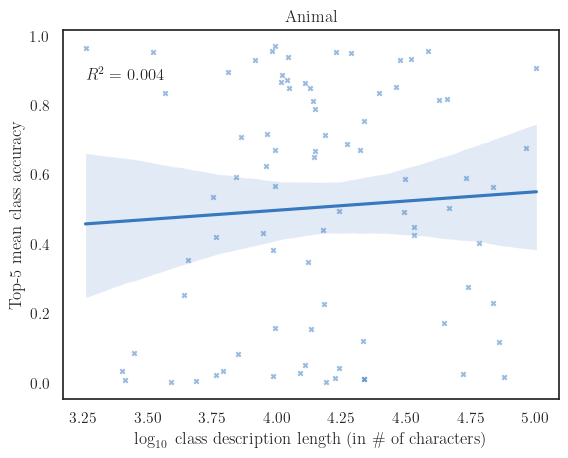

In [65]:
plt.title('Animal')
plot_fig(df, 'animals', save='simple_zsl_albert_outputs/class_accuracy_vs_description_length_animals')


2022-11-29 21:39:10,772 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:10,773 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:10,773 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:10,774 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:10,775 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:10,776 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:10,777 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:10,777 DEBUG              texmanager._get_font_preamble

2022-11-29 21:39:10,930 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/88125481cf1ae79d2252bf48ffa72efa.dvi
2022-11-29 21:39:10,931 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:10,932 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:10,936 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:10,936 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:10,937 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:10,938 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:10,9

2022-11-29 21:39:11,106 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:11,107 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:11,108 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:11,109 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:11,110 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:11,110 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:11,111 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:11,112 DEBUG              texmanager._get_font_preamble

2022-11-29 21:39:11,290 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:11,292 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:11,296 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:11,297 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:11,300 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:11,301 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:11,303 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:11,304 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:39:11,494 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:11,495 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:11,495 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:11,496 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:11,496 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:11,497 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:11,499 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:11,500 DEBUG                 d

2022-11-29 21:39:11,632 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/6d8c74af20637ec417d5b5f2ab2c7f1d.dvi
2022-11-29 21:39:11,633 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:11,634 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:11,637 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:11,638 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:11,638 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:11,639 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:11,6

2022-11-29 21:39:11,749 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:11,750 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:11,751 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:11,752 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:11,753 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:11,753 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:11,754 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:11,755 DEBUG              texmanager._get_font_preamble

2022-11-29 21:39:11,889 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:11,889 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:11,890 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:11,891 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:11,892 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:11,893 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:11,893 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:11,894 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:39:11,967 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:11,968 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/4c7e23f3269338f8a486be734ebe2f02.dvi
2022-11-29 21:39:11,969 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:11,970 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:11,976 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:11,977 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:11,978 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \use

2022-11-29 21:39:12,041 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:12,042 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:12,042 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:12,043 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:12,043 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:12,044 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:12,045 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:12,045 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:39:12,231 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/a2ca0c3f03597c00396d3efe2f65df87.dvi
2022-11-29 21:39:12,233 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:12,234 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:12,278 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:12,278 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:12,278 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:12,280 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:12,2

2022-11-29 21:39:12,541 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:12,542 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:12,543 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:12,544 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:12,544 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:12,545 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:12,546 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:12,546 DEBUG              texmanager._get_font_preamble

2022-11-29 21:39:12,599 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:12,600 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:12,602 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:12,603 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:12,604 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/9eaf6654afeb703e1187264057e444ca.dvi
2022-11-29 21:39:12,606 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:12,607 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:39:12,708 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:12,708 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:12,709 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:12,711 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:12,712 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:12,712 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:12,713 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:12,714 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:39:12,784 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:12,785 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:12,787 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/350d68b13c92545c8bfb77070611ea0e.dvi
2022-11-29 21:39:12,790 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:12,792 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:12,804 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:12,806 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:39:12,891 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:12,892 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:12,892 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:12,893 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:12,894 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:12,895 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:12,896 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:12,896 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:39:12,972 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/a2ca0c3f03597c00396d3efe2f65df87.dvi
2022-11-29 21:39:12,973 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:12,974 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:12,994 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:12,995 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:12,995 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:12,996 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:12,9

2022-11-29 21:39:13,047 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:13,048 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:13,049 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:13,050 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:13,051 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:13,051 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:13,052 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:13,052 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:39:13,096 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/236c60fa973d9704eac92a59f70abd98.dvi
2022-11-29 21:39:13,099 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:13,099 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:13,102 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:13,103 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:13,103 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:13,104 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:13,1

2022-11-29 21:39:13,187 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:13,188 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:13,189 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:13,190 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:13,191 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:13,191 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:13,192 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:13,193 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:39:13,260 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/b17b7d3e5e7527168c84a5c8e471e42d.dvi
2022-11-29 21:39:13,260 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:13,261 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:13,270 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:13,271 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:13,271 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:13,272 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:13,2

2022-11-29 21:39:13,363 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:13,364 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:13,365 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:13,366 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:13,367 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:13,368 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:13,369 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:13,370 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:39:13,476 DEBUG              _type1font.            __init__ -:- type1font._Token number at 710: '0'
2022-11-29 21:39:13,477 DEBUG              _type1font.            __init__ -:- type1font._Token number at 712: '0'
2022-11-29 21:39:13,479 DEBUG              _type1font.            __init__ -:- type1font._Token number at 714: '0.001'
2022-11-29 21:39:13,481 DEBUG              _type1font.            __init__ -:- type1font._Token number at 720: '0'
2022-11-29 21:39:13,482 DEBUG              _type1font.            __init__ -:- type1font._Token number at 722: '0'
2022-11-29 21:39:13,483 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 724: ']'
2022-11-29 21:39:13,484 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 703: '[0.001 0 0 0.001 0 0 ]'
2022-11-29 21:39:13,485 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 725: 'readonly'
2022-11-29 21:39:13,486 DEBUG              _type1

2022-11-29 21:39:13,541 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1278: 'def'
2022-11-29 21:39:13,542 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1282: 'end'
2022-11-29 21:39:13,542 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1286: 'readonly'
2022-11-29 21:39:13,543 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1295: 'def'
2022-11-29 21:39:13,544 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1299: '/Encoding'
2022-11-29 21:39:13,544 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1309: '256'
2022-11-29 21:39:13,546 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1313: 'array'
2022-11-29 21:39:13,546 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1320: '0'
2022-11-29 21:39:13,547 DEBUG             

2022-11-29 21:39:13,586 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1577: 'dup'
2022-11-29 21:39:13,586 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1581: '13'
2022-11-29 21:39:13,587 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1584: '/gamma'
2022-11-29 21:39:13,588 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1591: 'put'
2022-11-29 21:39:13,588 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1595: 'dup'
2022-11-29 21:39:13,588 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1599: '14'
2022-11-29 21:39:13,589 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1602: '/delta'
2022-11-29 21:39:13,589 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1609: 'put'
2022-11-29 21:39:13,593 DEBUG              _type1fon

2022-11-29 21:39:13,636 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1876: '/phi'
2022-11-29 21:39:13,637 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1881: 'put'
2022-11-29 21:39:13,639 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1885: 'dup'
2022-11-29 21:39:13,640 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1889: '31'
2022-11-29 21:39:13,640 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1892: '/chi'
2022-11-29 21:39:13,641 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1897: 'put'
2022-11-29 21:39:13,642 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1901: 'dup'
2022-11-29 21:39:13,642 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1905: '32'
2022-11-29 21:39:13,643 DEBUG              _type1font.  

2022-11-29 21:39:13,708 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2261: 'put'
2022-11-29 21:39:13,708 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2265: 'dup'
2022-11-29 21:39:13,708 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2269: '48'
2022-11-29 21:39:13,709 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2272: '/zerooldstyle'
2022-11-29 21:39:13,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2286: 'put'
2022-11-29 21:39:13,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2290: 'dup'
2022-11-29 21:39:13,711 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2294: '49'
2022-11-29 21:39:13,711 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2297: '/oneoldstyle'
2022-11-29 21:39:13,712 DEBUG          

2022-11-29 21:39:13,754 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2648: 'dup'
2022-11-29 21:39:13,755 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2652: '65'
2022-11-29 21:39:13,758 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2655: '/A'
2022-11-29 21:39:13,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2658: 'put'
2022-11-29 21:39:13,759 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2662: 'dup'
2022-11-29 21:39:13,759 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2666: '66'
2022-11-29 21:39:13,760 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2669: '/B'
2022-11-29 21:39:13,760 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2672: 'put'
2022-11-29 21:39:13,761 DEBUG              _type1font.      

2022-11-29 21:39:13,800 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2893: '/R'
2022-11-29 21:39:13,801 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2896: 'put'
2022-11-29 21:39:13,801 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2900: 'dup'
2022-11-29 21:39:13,802 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2904: '83'
2022-11-29 21:39:13,802 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2907: '/S'
2022-11-29 21:39:13,803 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2910: 'put'
2022-11-29 21:39:13,805 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2914: 'dup'
2022-11-29 21:39:13,805 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2918: '84'
2022-11-29 21:39:13,806 DEBUG              _type1font.      

2022-11-29 21:39:13,844 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3173: 'dup'
2022-11-29 21:39:13,844 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3177: '100'
2022-11-29 21:39:13,845 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3181: '/d'
2022-11-29 21:39:13,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3184: 'put'
2022-11-29 21:39:13,847 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3188: 'dup'
2022-11-29 21:39:13,848 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3192: '101'
2022-11-29 21:39:13,848 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3196: '/e'
2022-11-29 21:39:13,849 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3199: 'put'
2022-11-29 21:39:13,850 DEBUG              _type1font.    

2022-11-29 21:39:13,912 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3436: '/u'
2022-11-29 21:39:13,915 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3439: 'put'
2022-11-29 21:39:13,916 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3443: 'dup'
2022-11-29 21:39:13,918 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3447: '118'
2022-11-29 21:39:13,918 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3451: '/v'
2022-11-29 21:39:13,919 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3454: 'put'
2022-11-29 21:39:13,919 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3458: 'dup'
2022-11-29 21:39:13,920 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3462: '119'
2022-11-29 21:39:13,921 DEBUG              _type1font.    

2022-11-29 21:39:13,961 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3753: 'dup'
2022-11-29 21:39:13,962 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3757: '166'
2022-11-29 21:39:13,962 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3761: '/Pi'
2022-11-29 21:39:13,962 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3765: 'put'
2022-11-29 21:39:13,963 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3769: 'dup'
2022-11-29 21:39:13,963 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3773: '167'
2022-11-29 21:39:13,964 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3777: '/Sigma'
2022-11-29 21:39:13,964 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3784: 'put'
2022-11-29 21:39:13,965 DEBUG              _type1font

2022-11-29 21:39:13,995 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4078: '/mu'
2022-11-29 21:39:13,996 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4082: 'put'
2022-11-29 21:39:13,998 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4086: 'dup'
2022-11-29 21:39:14,000 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4090: '186'
2022-11-29 21:39:14,001 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4094: '/nu'
2022-11-29 21:39:14,001 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4098: 'put'
2022-11-29 21:39:14,002 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4102: 'dup'
2022-11-29 21:39:14,002 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4106: '187'
2022-11-29 21:39:14,003 DEBUG              _type1font.  

2022-11-29 21:39:14,036 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4413: '/ND'
2022-11-29 21:39:14,036 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4416: '{'
2022-11-29 21:39:14,037 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4417: 'noaccess'
2022-11-29 21:39:14,037 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4426: 'def'
2022-11-29 21:39:14,037 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4429: '}'
2022-11-29 21:39:14,038 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4416: '{noaccess def}'
2022-11-29 21:39:14,038 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4430: 'executeonly'
2022-11-29 21:39:14,041 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4442: 'def'
2022-11-29 21:39:14,041 DEBUG    

2022-11-29 21:39:14,081 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4706: 'ND'
2022-11-29 21:39:14,081 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4709: '/ForceBold'
2022-11-29 21:39:14,082 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4720: 'false'
2022-11-29 21:39:14,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4726: 'def'
2022-11-29 21:39:14,087 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4730: '/StemSnapH'
2022-11-29 21:39:14,088 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4741: '['
2022-11-29 21:39:14,088 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4743: '25'
2022-11-29 21:39:14,089 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4746: '31'
2022-11-29 21:39:14,090 DEBUG              

2022-11-29 21:39:14,139 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5254: '{'
2022-11-29 21:39:14,140 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5255: 'pop'
2022-11-29 21:39:14,140 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5259: '0'
2022-11-29 21:39:14,141 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5260: '}'
2022-11-29 21:39:14,141 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5262: '{'
2022-11-29 21:39:14,141 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5263: '/internaldict'
2022-11-29 21:39:14,142 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5277: 'errordict'
2022-11-29 21:39:14,142 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5287: '/invalidaccess'
2022-11-29 21:39:14,147 DEBUG 

2022-11-29 21:39:14,220 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5619: 'systemdict'
2022-11-29 21:39:14,224 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5630: '/internaldict'
2022-11-29 21:39:14,226 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5644: 'known'
2022-11-29 21:39:14,228 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5650: '{'
2022-11-29 21:39:14,229 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5652: '1183615869'
2022-11-29 21:39:14,231 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5663: 'systemdict'
2022-11-29 21:39:14,234 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5674: '/internaldict'
2022-11-29 21:39:14,235 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5688: 'get'
2022-11-29 2

2022-11-29 21:39:14,333 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5996: 'def'
2022-11-29 21:39:14,333 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6000: '/dmin'
2022-11-29 21:39:14,334 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6006: 'exch'
2022-11-29 21:39:14,335 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6011: 'abs'
2022-11-29 21:39:14,335 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6015: '100'
2022-11-29 21:39:14,336 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6019: 'div'
2022-11-29 21:39:14,336 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6023: 'def'
2022-11-29 21:39:14,337 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6027: '/epX'
2022-11-29 21:39:14,338 DEBUG              _type1fo

2022-11-29 21:39:14,393 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6362: 'c2x2'
2022-11-29 21:39:14,394 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6367: 'c2y2'
2022-11-29 21:39:14,394 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6371: '}'
2022-11-29 21:39:14,395 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6373: '{'
2022-11-29 21:39:14,396 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6374: 'c3x0'
2022-11-29 21:39:14,397 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6379: 'c3y0'
2022-11-29 21:39:14,398 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6384: 'c3x1'
2022-11-29 21:39:14,399 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6389: 'c3y1'
2022-11-29 21:39:14,399 DEBUG             

2022-11-29 21:39:14,445 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6669: 'abs'
2022-11-29 21:39:14,451 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6673: '.00001'
2022-11-29 21:39:14,451 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6680: 'lt'
2022-11-29 21:39:14,452 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6683: 'mtx'
2022-11-29 21:39:14,452 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6687: '2'
2022-11-29 21:39:14,453 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6689: 'get'
2022-11-29 21:39:14,453 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6693: 'abs'
2022-11-29 21:39:14,453 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6697: '.00001'
2022-11-29 21:39:14,454 DEBUG              _type

2022-11-29 21:39:14,489 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6996: '{'
2022-11-29 21:39:14,490 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6997: '0'
2022-11-29 21:39:14,490 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6998: '}'
2022-11-29 21:39:14,490 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6999: '{'
2022-11-29 21:39:14,491 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7000: 'c1y2'
2022-11-29 21:39:14,491 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7005: 'c4y2'
2022-11-29 21:39:14,491 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7010: 'sub'
2022-11-29 21:39:14,492 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7014: 'c3y2'
2022-11-29 21:39:14,492 DEBUG              _type

2022-11-29 21:39:14,528 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7311: 'def'
2022-11-29 21:39:14,528 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7315: 'dY'
2022-11-29 21:39:14,528 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7318: 'dmin'
2022-11-29 21:39:14,529 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7323: 'lt'
2022-11-29 21:39:14,529 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7326: 'PickCoords'
2022-11-29 21:39:14,530 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7337: 'y2'
2022-11-29 21:39:14,531 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7340: 'c1y2'
2022-11-29 21:39:14,531 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7345: 'sub'
2022-11-29 21:39:14,532 DEBUG             

2022-11-29 21:39:14,572 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7573: '/erode'
2022-11-29 21:39:14,574 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7580: 'PaintType'
2022-11-29 21:39:14,577 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7590: '2'
2022-11-29 21:39:14,577 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7592: 'ne'
2022-11-29 21:39:14,578 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7595: 'erosion'
2022-11-29 21:39:14,578 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7603: '0.5'
2022-11-29 21:39:14,578 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7607: 'ge'
2022-11-29 21:39:14,579 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7610: 'and'
2022-11-29 21:39:14,579 DEBUG              _

2022-11-29 21:39:14,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7855: 'y3'
2022-11-29 21:39:14,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7858: 'eShift'
2022-11-29 21:39:14,621 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7865: 'add'
2022-11-29 21:39:14,621 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7869: 'def'
2022-11-29 21:39:14,622 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7873: '}'
2022-11-29 21:39:14,622 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7875: 'if'
2022-11-29 21:39:14,622 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7878: '}'
2022-11-29 21:39:14,623 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7880: 'ifelse'
2022-11-29 21:39:14,624 DEBUG              _

2022-11-29 21:39:14,660 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8158: 'def'
2022-11-29 21:39:14,661 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8162: '/c1y1'
2022-11-29 21:39:14,661 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8168: 'c3y1'
2022-11-29 21:39:14,662 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8173: 'def'
2022-11-29 21:39:14,662 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8177: '/c2y0'
2022-11-29 21:39:14,663 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8183: 'c4y0'
2022-11-29 21:39:14,663 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8188: 'def'
2022-11-29 21:39:14,664 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8192: '/c2y1'
2022-11-29 21:39:14,666 DEBUG              _type1

2022-11-29 21:39:14,695 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8459: 'def'
2022-11-29 21:39:14,696 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8463: 'dX'
2022-11-29 21:39:14,696 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8466: 'round'
2022-11-29 21:39:14,697 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8472: 'dup'
2022-11-29 21:39:14,697 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8476: '0'
2022-11-29 21:39:14,699 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8478: 'ne'
2022-11-29 21:39:14,706 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8481: '{'
2022-11-29 21:39:14,707 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8482: '/dX'
2022-11-29 21:39:14,708 DEBUG              _type1font.

2022-11-29 21:39:14,756 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8711: '-1'
2022-11-29 21:39:14,757 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8714: 'eq'
2022-11-29 21:39:14,757 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8717: '{'
2022-11-29 21:39:14,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8718: 'exch'
2022-11-29 21:39:14,758 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8722: '}'
2022-11-29 21:39:14,759 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8724: 'if'
2022-11-29 21:39:14,762 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8727: 'itransform'
2022-11-29 21:39:14,768 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8738: 'pop'
2022-11-29 21:39:14,768 DEBUG              _

2022-11-29 21:39:14,825 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8995: '{'
2022-11-29 21:39:14,826 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8996: 'exch'
2022-11-29 21:39:14,827 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9001: 'setpacking'
2022-11-29 21:39:14,827 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9011: '}'
2022-11-29 21:39:14,828 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9013: 'if'
2022-11-29 21:39:14,828 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9016: '/exec'
2022-11-29 21:39:14,828 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9022: 'cvx'
2022-11-29 21:39:14,829 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9026: '/end'
2022-11-29 21:39:14,830 DEBUG              _

2022-11-29 21:39:14,859 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9374: 'systemdict'
2022-11-29 21:39:14,859 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9385: '/internaldict'
2022-11-29 21:39:14,860 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9399: 'known'
2022-11-29 21:39:14,860 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9405: '{'
2022-11-29 21:39:14,861 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9406: '{'
2022-11-29 21:39:14,861 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9407: '1183615869'
2022-11-29 21:39:14,862 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9418: 'systemdict'
2022-11-29 21:39:14,862 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9429: '/internaldict'
2022-11-29 2

2022-11-29 21:39:14,903 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9806: 'exec'
2022-11-29 21:39:14,904 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9810: '}'
2022-11-29 21:39:14,904 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9812: '{'
2022-11-29 21:39:14,905 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9813: 'dup'
2022-11-29 21:39:14,905 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9817: '/strtlck'
2022-11-29 21:39:14,906 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9826: 'known'
2022-11-29 21:39:14,907 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9832: '{'
2022-11-29 21:39:14,907 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9833: '/strtlck'
2022-11-29 21:39:14,908 DEBUG            

2022-11-29 21:39:14,919 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9909: '8'
2022-11-29 21:39:14,919 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9911: 'array'
2022-11-29 21:39:14,920 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9917: 'dup'
2022-11-29 21:39:14,921 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9921: '0'
2022-11-29 21:39:14,921 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9923: '15'
2022-11-29 21:39:14,931 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9926: 'RD'
2022-11-29 21:39:14,932 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9928: b' \x10\xbf1p|\x10\x14\x10=-\x93D\\\xe2R'
2022-11-29 21:39:14,933 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9945: 'NP'
2022-11-29 21:39:14,9

2022-11-29 21:39:14,972 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10374: '/Gamma'
2022-11-29 21:39:14,973 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10381: '206'
2022-11-29 21:39:14,973 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10385: 'RD'
2022-11-29 21:39:14,973 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10387: b' \x10\xbf1p@\xc2\x94W\x98\x9c\xfe\xce\x8f\xe1\xa01\r\xc7\x11\x1c\x8a\xbed\xbd\xb3W\x8esgi\xe4\x84\xfe\x80A\x12\xcdR\x10`\x7f\xc3"|\x16\x14\xc61\x14\xe8\xa5\xcf6\xd0\xf5\x82\xcd\x05\x9e\x11\xa7\xeek\x0cgz\x9c.D:{ \xcbsd\x84\xd6\x90\xc9k+s\x7fQ\x96H\xe4p\xdc\xf0\xf8\xec\x06\x9a\xc4\x87\x9bA\x81\x85m\x16\x8e\xbc\xcb\xbe`\xb2\xb6\xdfe\xf6\xd6*\xed\xe0[\xfc\xe0h\xd4\xf8xv\xd8\xbaTd\xcc\x0bzF\x9dC{r\x0c\xb9\x082\xf0\xe6;\x17eL\x82\xfd\xde\xc1\xad\x8f\x05\x192\xe5\xf5\xc3\x9a,\xa2\x89K\x93Q\x1f\x1e\xb4\xe6\x9e\x177\xf0\xa9\x80m`

2022-11-29 21:39:14,991 DEBUG              _type1font.            __init__ -:- type1font._Token name at 11898: '/Upsilon'
2022-11-29 21:39:14,992 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11907: '265'
2022-11-29 21:39:14,993 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11911: 'RD'
2022-11-29 21:39:14,993 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11913: b" \x10\xbf1pU\xd1\xe9\xe6)V\xa7\x8b\x16\xf5\xe62\x1e\xea+0\xc6f\x03WN&L\xc9\x90\xa2\xe5/6\xdc#fEE\xf1\x82\xc6\x9f\xd8\xc43i?\xfdfxJ\x80\x8e\x18\xa2^\xc9\x06y=\x16\xaa;vI\xe6\xc3\x92&\xc43\xb2\x0f#\x828\xe1\xdeF%W\xf7\x18\x93\xff\xbdr,\xd8\xb9\xfe\xd8\xe6[,\x86IGl\xc1\xf4\xfd\x99\x98SU\xda\xed\x9fq,\x0fKK(yt\xdf\xcbG\xd7N\\\xe5\xf0\x9a\xf2e\xe8HG\xb9\x9f\x0b\xd9\t\x8b\x0e\xd0AX8\xef\xb7xS\xc7\xd74<\xc0l\xf1\xd3U\xf3w\xa5wbR4\xcc\x9e\xea\xb5\xa4e\xca\x04\xb6\xcc,\xfd\x88\x89\x95\xa5\xe4\r'5\x84t\xc87\xf9\xa5\xcc\xe4\x85n\x

2022-11-29 21:39:15,030 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13605: '143'
2022-11-29 21:39:15,031 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13609: 'RD'
2022-11-29 21:39:15,031 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13611: b' \x10\xbf1po\xd8\x1fa\xe6x\x0b\xcfK\x02(b\xe2\xc4\xbax\xe4\x11\xf9\x96#\x08\x9c\xaeO\xd1dcW\xac\xf6Z\x7f5~iN\x01\x15\xf5M|\x14;\xc3\x837\xae\x8d\xea\xe4\xf0/\x00#ky\x01\xc33\xb2\xf0Fg\xcb\xe4\xd5\x08xS\x18\xa7\xd9 s\x8a%\x12u\x00\xceB\nL\x97\x91fT\x14\x12\xd0,\xb1\'+\x1fP\x13"\xc2\xa2\x99\x8f\xde\xa4\xd7Fo\xd1\xc8\xc4/\xa9q\x97\xbdv\xbd\x0f\xd0\x81dQ\x142w\xc2\x15\xa6i\xdf\x98K\xceCy"^\xcc'
2022-11-29 21:39:15,032 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13756: 'ND'
2022-11-29 21:39:15,032 DEBUG              _type1font.            __init__ -:- type1font._Token name at 13759: '/delta'
2022-11-29 21:

2022-11-29 21:39:15,051 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15034: '/lambda'
2022-11-29 21:39:15,051 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15042: '121'
2022-11-29 21:39:15,051 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15046: 'RD'
2022-11-29 21:39:15,052 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15048: b' \x10\xbf1p2\x08\xd9v\xdct\x0en-\xfe\xaf\x81(\x94]\x00\xd0~eU(\xf4\x8a\xc6f5\'kV\x18`\xb5\xd2\\\x82\x08\xa1\xe4\xcf\xefpe\x85\x19\x96\x93\xd4\xc1\xd7>)\x19\xa1\xfd\xcd{\xd5|\xd2F\r$\xdb\xa18\xd6\xf8\xf4\xcfx9\xeb\xbd@\xd6\x170\xf0{W>\xd0\x18\xd2\xc53^\xdfr>\xc3S9\xd8?"x\xad\xbb\x13\xf4\x8f\xa7b\xa7\xa1M\xea!\xc9\xcdO1\x83\x9e9\xe8'
2022-11-29 21:39:15,052 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15171: 'ND'
2022-11-29 21:39:15,053 DEBUG              _type1font.            __init_

2022-11-29 21:39:15,071 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16506: 'ND'
2022-11-29 21:39:15,071 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16509: '/upsilon'
2022-11-29 21:39:15,072 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16518: '164'
2022-11-29 21:39:15,072 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16522: 'RD'
2022-11-29 21:39:15,072 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16524: b" \x10\xbf1pZ\xc9s,\x90n\xe8|\xfa\xd4\xe4\x8f\x87\xa2\x94\xdc\x9e(]\xa9\x1a\x98:/\xa3\xba{\xcc\x8a\xe0\xae=u\xc5&\xb6\xc5\xb9^q\x80\xd7\x8a\xfeD\xb8\xaaE\x06\x08\xa6V\xc2l\x13U\xc0\x05\xa4x\x16\xf7\x9c\xb2\x1b&\xde\x9f\xa6\x19a-$0\xcc1\x074.\xee\x08S\x9cH\xe8#\x9a\xb8\xee\xe3\xce\xf3\t\xdd\xc3\xc6N\xccL\xbd\xd4\x1f\xb3/\xaf\xb6_\xf8\xee\x13\x12\x98@\x90..a\x0c\x11\x8a`\x8a\x9c\x10\x946R\xad\x16}\xfe\x9aS

2022-11-29 21:39:15,087 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18004: '211'
2022-11-29 21:39:15,087 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18008: 'RD'
2022-11-29 21:39:15,088 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18010: b' \x10\xbf1pT\xa3P\x9d\x94\x93\xcdO\xc8\\i\x86\xc2L`\xce\x81@\x00\xa7\x12Y\xee\x93!\xdd\x87\x83\xa1\xac\x0e\xabz*F/\x89\x90;n(eM\xc4\xe9\xe2F2+\x85f\x18\x13\'\x10T\xfb\x14i\x0b\xf5\x7f3\x1fz|\xdfQQEz\xb8\x97\xe2\xdd,\xb5\xb3!E\xedD}\t0\x05\xaa+\xc5\x9f\xb5\xc8\x11?EGeU\x039\xb9O\x18+\xfd[$b:\x91\x9d7\xd9\x1c\xb6\xb4\x86\x01\xa8\xd4\x1ac\xa2\x04\x97n\xc8\x03\xb2;D\x08\xe0\xf24\x1f*7b\xfdVw\xfe\xa5\x1b\xa7\xc7Q@s\xa20\xa9j\xeeL\x1c\xc4\xd5e-\xed1\xa6\xa0\xb9{\x94\x87\xf9-x\xa7L\x12\xeeG\xb2\xdd\xb8h\xe2\xcas\xf3\x83[\xacA\xd7\xc9\xeen\x9b"\x98<W\xc8\x86\x8b\xf1\x10Z\xbe5\xe6'
2022-11-29 21:39:15,088 DEBUG              _type1font.            _

2022-11-29 21:39:15,118 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19315: 'ND'
2022-11-29 21:39:15,118 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19318: '/arrowhookright'
2022-11-29 21:39:15,118 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19334: '75'
2022-11-29 21:39:15,119 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19337: 'RD'
2022-11-29 21:39:15,119 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19339: b' \x10\xbf1p0\xa41\xaf\xb3W\xdb\x87\x9aI\xd3(N\xed\x15\xb5\xf6\xbf\xe8\xbd\xc1\xcb\xa17p\x81\x04;3\xd6\x00\xce4H\xeeS\xf2\xa4\xad\xd2\x1c\xf1Rtz\x1f\xc78\xdd\n.\xff\xbb\x9a\x91\x98\x9dp9$\x83b\x1d\xd8\xfe\xb2;B\x08\x01\x13'
2022-11-29 21:39:15,120 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19416: 'ND'
2022-11-29 21:39:15,120 DEBUG              _type1font.    

2022-11-29 21:39:15,143 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20718: 'ND'
2022-11-29 21:39:15,143 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20721: '/sixoldstyle'
2022-11-29 21:39:15,144 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20734: '181'
2022-11-29 21:39:15,144 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20738: 'RD'
2022-11-29 21:39:15,145 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20740: b' \x10\xbf1pG\'$8K\xc0\xcf\xb1\xe9\x14\xe6\xbda\xed\xd0.\xf1\x00\xd8\xb8\x0c\xc3\xa6W\xc6\x9f\x94\x12"\xa89RS\xee.\x1aJe\xb0\xc6\x0c/D\x0c\x8d\xcd0\xde\xd5-\xcd%\xc5\xee\x10\xfb7\x9aR,\xac%\x13yo\x807\xed\x81\x92\x9a!.\xeb#\xadm\n\xb3\x1c\xfaKI\x078N\x97\xe0[\xf3\xa5\xd3\xb5\xb2W\xec\xba\xc5\xff\xa9{\x96\xf7!\x12\xee\xff\xb1\xedi\xef\xd7g\xa2P\x86g:Bw\xad?=\x895\xb9\x9a\xf3\x18\xb5\xfb`\xae\xae7\x00\

2022-11-29 21:39:15,172 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21950: 'ND'
2022-11-29 21:39:15,172 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21953: '/star'
2022-11-29 21:39:15,173 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21959: '165'
2022-11-29 21:39:15,173 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21963: 'RD'
2022-11-29 21:39:15,173 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21965: b' \x10\xbf1p}\x92\x0e\xdd\xa9z\x85P\xdck\x98R?\xbf\xbdQ\xd4\xe3\xf2\xc5\x1f\xfa\x80\xd4\xa1&\xee1\x8a\xad^\x81l_c\xcf\x13\x16\xaf\xcf\xd5\x17\xb6>\xfe\xe6\x92\xde\x0e\x81\x01;\xb2elB\x9ej\xe1\xa0\xed\x97\x94F\x1anX\x19z\xe2\xa4rW\xad\xd8\x04\xb3\x9d\x843<L\xc5\x99\xc1F^m\x02\xfd\x82\x982\xfc\xe7\xce\xb2\xa7\x03zHU\xf2\xf7\xca\x18\xb2=\xf1t~\xbf\xc4\xa7\x00Q\x96\xa4\t\xd09L\xb1\xa7\xa5M\xbb_\xbc\x83\xfd\xdf-

2022-11-29 21:39:15,187 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23388: 'RD'
2022-11-29 21:39:15,188 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23390: b' \x10\xbf1pC\\\xe8K\xd5fV8\x1f\xd2/\xcf;\xd9u\x10\xd7Lk>\xc9\xfd\x0fq\xfe[\xdaL\xe6\xa2hvo\x08\xecu\x1d\x96\xe6\xa4\xeaX\xc0\x0f\xec\x98\xfa:~W\xd2\xcf\xb7\xeb\x90\xac8\xc2\xe1E\xd0\xc0x8\n\xfaq\x1b\xe1\xc3gh\x1a\x9d\x1b^^w\x7f\xd4\xf8J]\x1e\x1fg\x0e\x9c{\xa9\xaeq\xa5\x07\xe6\x03\x92\xa7\x9aj\x8e\xe5\x94\xf5\xf6[\x0b\x91*\x9e\xca\xf8@\x80[\x03\x18\xe2\xedlPE=o|\x1d\x9b\x03<\x0b2\xb2\xea\xd3\x1c\x9a\x12\xf0\xe0\xfdS\x942\xc1e\xb3\x9bQh\xfe\x85\xde\xee\xc5\xaa\xdfY\x17\x11o\xbaU \x8d\xe5\x1d\x87\xff\x8f\xf7\x9e\xb8\xd5\xc3@\x1bc\xcb\xe0:\x02\x00\xd3 \xfdf\x16\x04L\xb4\xa4?2\xbe0\x1b\xe0\xbbD\x98`\xfa\xa3L\xde-\xef<\xf5\xd5\x85\xc3\x05}\xbf-\xe8e\x82\\~+\xff\x80<\x98\xb5\xa3\xe8c\xf9\x91Z\x8f\xdb\x15\xe2,\x1c#\x04\xd7/\xb5\xd6\x1e\xb6\x14\x8d\x9a\xf1pe\x13\xd

2022-11-29 21:39:15,208 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25147: '203'
2022-11-29 21:39:15,209 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25151: 'RD'
2022-11-29 21:39:15,210 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25153: b" \x10\xbf1p@\xc3\x027\xf9\xaa\x85\xa2\x127\xde2h]\x0c\xed\xcet\xd0\xd4-/\x01\x08X\xa0\xac\xa66\x9a/J2@\xa92\xb6\xfcO\x17JW99\xa4\xaa\xb3H[)y\xb6h\xc6TkD\xd9s\xca\x9a ;W\x0c\x18\xde\xb3\x00\xc5X\xd1;\x13\xfcb(_D,\x8d\x84\xb5I\xdanu+\xfc\xbe\xfb\x98\xe7\x9f\xa5O\xd8\xa3\xef\x12\x8c\x0f\xae\x18\xf7z\x9f\xc8i'\xc7\xd4\x13\x80\xb6\xeese\xb2\xb4X.^6\x85N\x80\x85K\x86\x83vA\x92\xdep\xc2\xaa\xc5\xe5\x18\xfa\x9ao+\t\xabPKQ\x18\xbc\xdfN\xb4nb\x98\x13A \x8f\x99\xa0\x151!,e\xb6\xfe\x8a\xc4w'*\xba\xbf\x0c\xaer\xce\xd8A\xf4b\x8cF!\xd1\xbc'k\x8f\xe3M\xb3\x9f\x85"
2022-11-29 21:39:15,210 DEBUG              _type1font.            __init__ -:- type1font._To

2022-11-29 21:39:15,236 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26795: 'ND'
2022-11-29 21:39:15,237 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26798: '/S'
2022-11-29 21:39:15,239 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26801: '213'
2022-11-29 21:39:15,240 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26805: 'RD'
2022-11-29 21:39:15,240 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26807: b' \x10\xbf1pMM\x16N\xf28\xed\xfc\xd3H\xa3\xadh\xcaC,\xd3\xd1\xad\x05\xa8\x985\xca.6\xa9P\x1c\x89\xadq\x7f\x0c\xb5\xe9\xc46q"\'6+\x9cT4\x86<\x00\x882\xe0\x81 \xd0~y"\xfd\x16\xd2Vw"//\xdb\x8a\xfa?\xb0\xb6*`\xbdT\xbcNxB\xd0\xf3\xf5!I\xf0_\x98\xfb\xfa\x8dfk|\xa3\r\xc9:@\'/\x80<)\x1b\xdd0\xf5P\xde\xb6\xed\xf2\x12\x99X\x13\xc4Z\xf6\x1cbJ\xc2\x16uMA\xd8#(\xbe\xe0\x7fq\xda7\xd3)V \xcdZ\xbamD\xaf\x05W\xc1\xbd\xb5\xc2\x

2022-11-29 21:39:15,254 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28544: 'ND'
2022-11-29 21:39:15,254 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28547: '/Y'
2022-11-29 21:39:15,254 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28550: '326'
2022-11-29 21:39:15,255 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28554: 'RD'
2022-11-29 21:39:15,255 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28556: b" \x10\xbf1p\\6\xb7\xc8\x8b3\xc7\x1b\x00U\xe6\xa6\x04\x9emt\xa4\xd9*\xa0\x01p$\xf0\x16&\x08\xc5E\xb9J\xeb\xb7N\xf3\x11pP\x80\xcc\x8a\xa9\x0f\xea\xf2\xf2\n\x1d\r\xc9\xe1\x8f;\xeb\x8f\xfa.\x02\x02\xa50\xd0\xf2\xf3\x91\xc9e|@\xa6\xc5T\xcdI\x11\x90\x03;64\x81I\xbd\xea\x18m0\xfdS\x15\xd1g\xcf\x10\xfc\rk\r\xd42\x1f\x94\x81\x01:Q\x96-\x13Z\x96Pu\x02\rQ\xc2Ej\xb48P\x08:\xf5NN\x19m)\x95\xd3\xf2'QL\xc1\x0b\xcdg\xf7\xab\

2022-11-29 21:39:15,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29978: 'ND'
2022-11-29 21:39:15,275 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29981: '/a'
2022-11-29 21:39:15,276 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29984: '141'
2022-11-29 21:39:15,277 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29988: 'RD'
2022-11-29 21:39:15,278 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29990: b' \x10\xbf1pA\xf0\x850|\x8b\x06\x1b\xe1\x8e\x8c\xe8\x87\x99\x93#\x99\xc6)\xec\x9d\xcfS\xda\xb2\xb3I\xc9\x91\xe4\x98\x83Y\xb0\'K\xef(\xa0\x14\xb4J\xc66\xac\x8b\x0c\x04"8;[\xd3I\xc8.\xc1I\xfc\xc2`Z\x95\x8aR1\xea\xdd\xdfV\x97kx0\r\xe0\x1a\xb45L\xd1\xcd\xa0\x02\xc3pX\xb7\xf4\xbc\x91\x17k\x87\xc8\x1d\xaf\x07\xc1\xdc\xbe\xf7\x92\x1b\xca8\xbf\xe6:\xbc\xc4{\xd8\xf1\xb9s4\x1fBz\xc0e\xa0\x00\x0e<\x7fQ"z\xc0}\xc2\x80\x8e

2022-11-29 21:39:15,306 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31369: 'ND'
2022-11-29 21:39:15,306 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31372: '/i'
2022-11-29 21:39:15,307 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31375: '59'
2022-11-29 21:39:15,307 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31378: 'RD'
2022-11-29 21:39:15,307 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31380: b' \x10\xbf1pZ\xc6\xbbm\xb1\x94B\x0c\xeb\x91\x96\xe9\x8a\xea\x84\x8b\x01ePFL\xef\x04\xddG\xd9(\xf3\xc0C\xbcG$\xbd\x1c\x91(\x87\x16\xbf`\x1e\x14\x0b\xa9\xa8{3\xa2)\xea\x8e\x95\xba\x01'
2022-11-29 21:39:15,308 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31441: 'ND'
2022-11-29 21:39:15,308 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31444: '

2022-11-29 21:39:15,328 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32921: 'ND'
2022-11-29 21:39:15,328 DEBUG              _type1font.            __init__ -:- type1font._Token name at 32924: '/q'
2022-11-29 21:39:15,329 DEBUG              _type1font.            __init__ -:- type1font._Token number at 32927: '206'
2022-11-29 21:39:15,329 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32931: 'RD'
2022-11-29 21:39:15,330 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 32933: b" \x10\xbf1pA\xf0s\xb4jVgOX\x99\xbf\xb0r\x18+l\xc1\xcaT\xef.\xe5\x19\xa1\xddt\xca\xdc\x04\x11\xae\x13\xae\xaa\xaa\xe9Y\x98\xa9\x84\x94n\xa6\x96\xba\xe0Q\xda#,C\x95\xf1-4\\l\x1d\xdc-\x7f\xbc\xbf\xa9tJ\x93\x01\x0e\x8a\x1c<\xe2\xbdNA\xca\x0b\r\xc0\xe9\xc8%M'\x19%\xef_\x91\x89\xc7\x80Mb`\x7f\x92\xeds\xa0\x1e:52Vd\x873\xd3\x9f\xfc\x99&\xb4\x9c\xdaW\xc2\x05\xd3F\x99\xfd\x12\xbc\xd7\xcc\xe4d\x8b\x13\x0f\xa9\xbb\x06\x

2022-11-29 21:39:15,353 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34275: b" \x10\xbf1pZ\xc9\x0c\x1e&\xd6eU\xe4!W\xe9\x8dK\x04)\t\xff\xbe\xf6\xb0'\x14p\x14A0S\xe3\xfc\xfbtl\xa2\xf6\xbf\xa0\xe4\xfcT\\\xc1\x1fMrQB\xc2\x1e\xfeg\xad\x06n\xeb<\xb6w0\x82x\xab/\xa7\xd9\xd0`9o@\x1d\xaa\xc5j\xa4:L\xe0~,vy\xbd\xb9Y$\xe0\xa1\xbd\xdc\\6\xa8~\xb4\xaa\xd4\x16\xeb\x92\xdbj\xbcZjGu\xd7\x19\xa7\xa6&\x10=\xc8\xc5\xd2\xec.\xe2q\xc2V\xa0\xa9\xd7(\xed\x17\xe3\xc4L\xa0tMgQ\xfe6\x8aJ\xaa\xa3\x0f\xc6\xeb\xdc\x1c\x08\x0fd\x94\xbc\xa1\x9c\xf16y\xafiG\x82\x01\xb5\xc8\xf7\xaf\xbc\x14\x92hvg\x9b\xc9\xbd\xd9\x96\xc8\r\xab\xe0\xf9\xc3N\x02\x04\xfe\xa1\x19\xfc\x84\tH0b=\xd92\xebX!\xbc\xa3X\xd9\xe5"
2022-11-29 21:39:15,354 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34488: 'ND'
2022-11-29 21:39:15,354 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34491: '/y'
2022-11-29 21:39:15,355 DEBUG              _type1f

2022-11-29 21:39:15,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35637: 'ND'
2022-11-29 21:39:15,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35640: 'end'
2022-11-29 21:39:15,380 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35644: 'end'
2022-11-29 21:39:15,381 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35648: 'readonly'
2022-11-29 21:39:15,382 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35657: 'put'
2022-11-29 21:39:15,383 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35661: 'put'
2022-11-29 21:39:15,387 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35665: 'dup'
2022-11-29 21:39:15,387 DEBUG              _type1font.            __init__ -:- type1font._Token name at 35668: '/FontName'
2022-11-29 21:39:15,388 DEBUG    

2022-11-29 21:39:15,468 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 703: '['
2022-11-29 21:39:15,469 DEBUG              _type1font.            __init__ -:- type1font._Token number at 704: '0.001'
2022-11-29 21:39:15,470 DEBUG              _type1font.            __init__ -:- type1font._Token number at 710: '0'
2022-11-29 21:39:15,475 DEBUG              _type1font.            __init__ -:- type1font._Token number at 712: '0'
2022-11-29 21:39:15,476 DEBUG              _type1font.            __init__ -:- type1font._Token number at 714: '0.001'
2022-11-29 21:39:15,477 DEBUG              _type1font.            __init__ -:- type1font._Token number at 720: '0'
2022-11-29 21:39:15,478 DEBUG              _type1font.            __init__ -:- type1font._Token number at 722: '0'
2022-11-29 21:39:15,481 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 724: ']'
2022-11-29 21:39:15,482 DEBUG              _type1font.            

2022-11-29 21:39:15,538 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1266: '/ascent'
2022-11-29 21:39:15,539 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1274: '750'
2022-11-29 21:39:15,539 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1278: 'def'
2022-11-29 21:39:15,540 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1282: 'end'
2022-11-29 21:39:15,540 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1286: 'readonly'
2022-11-29 21:39:15,541 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1295: 'def'
2022-11-29 21:39:15,541 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1299: '/Encoding'
2022-11-29 21:39:15,542 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1309: '256'
2022-11-29 21:39:15,542 DEBUG            

2022-11-29 21:39:15,576 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1567: '/beta'
2022-11-29 21:39:15,577 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1573: 'put'
2022-11-29 21:39:15,577 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1577: 'dup'
2022-11-29 21:39:15,578 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1581: '13'
2022-11-29 21:39:15,578 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1584: '/gamma'
2022-11-29 21:39:15,579 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1591: 'put'
2022-11-29 21:39:15,580 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1595: 'dup'
2022-11-29 21:39:15,581 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1599: '14'
2022-11-29 21:39:15,581 DEBUG              _type1font

2022-11-29 21:39:15,641 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1869: 'dup'
2022-11-29 21:39:15,642 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1873: '30'
2022-11-29 21:39:15,642 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1876: '/phi'
2022-11-29 21:39:15,642 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1881: 'put'
2022-11-29 21:39:15,643 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1885: 'dup'
2022-11-29 21:39:15,643 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1889: '31'
2022-11-29 21:39:15,644 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1892: '/chi'
2022-11-29 21:39:15,644 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1897: 'put'
2022-11-29 21:39:15,645 DEBUG              _type1font.  

2022-11-29 21:39:15,705 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2244: '47'
2022-11-29 21:39:15,706 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2247: '/triangleleft'
2022-11-29 21:39:15,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2261: 'put'
2022-11-29 21:39:15,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2265: 'dup'
2022-11-29 21:39:15,709 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2269: '48'
2022-11-29 21:39:15,709 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2272: '/zerooldstyle'
2022-11-29 21:39:15,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2286: 'put'
2022-11-29 21:39:15,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2290: 'dup'
2022-11-29 21:39:15,711 DEBUG         

2022-11-29 21:39:15,755 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2631: '/partialdiff'
2022-11-29 21:39:15,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2644: 'put'
2022-11-29 21:39:15,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2648: 'dup'
2022-11-29 21:39:15,757 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2652: '65'
2022-11-29 21:39:15,757 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2655: '/A'
2022-11-29 21:39:15,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2658: 'put'
2022-11-29 21:39:15,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2662: 'dup'
2022-11-29 21:39:15,759 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2666: '66'
2022-11-29 21:39:15,759 DEBUG              _type1f

2022-11-29 21:39:15,807 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2886: 'dup'
2022-11-29 21:39:15,808 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2890: '82'
2022-11-29 21:39:15,808 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2893: '/R'
2022-11-29 21:39:15,809 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2896: 'put'
2022-11-29 21:39:15,809 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2900: 'dup'
2022-11-29 21:39:15,810 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2904: '83'
2022-11-29 21:39:15,810 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2907: '/S'
2022-11-29 21:39:15,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2910: 'put'
2022-11-29 21:39:15,812 DEBUG              _type1font.      

2022-11-29 21:39:15,847 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3166: '/c'
2022-11-29 21:39:15,848 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3169: 'put'
2022-11-29 21:39:15,848 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3173: 'dup'
2022-11-29 21:39:15,849 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3177: '100'
2022-11-29 21:39:15,849 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3181: '/d'
2022-11-29 21:39:15,850 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3184: 'put'
2022-11-29 21:39:15,850 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3188: 'dup'
2022-11-29 21:39:15,851 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3192: '101'
2022-11-29 21:39:15,851 DEBUG              _type1font.    

2022-11-29 21:39:15,903 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3428: 'dup'
2022-11-29 21:39:15,904 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3432: '117'
2022-11-29 21:39:15,904 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3436: '/u'
2022-11-29 21:39:15,905 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3439: 'put'
2022-11-29 21:39:15,905 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3443: 'dup'
2022-11-29 21:39:15,906 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3447: '118'
2022-11-29 21:39:15,906 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3451: '/v'
2022-11-29 21:39:15,907 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3454: 'put'
2022-11-29 21:39:15,908 DEBUG              _type1font.    

2022-11-29 21:39:15,954 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3745: '/Xi'
2022-11-29 21:39:15,955 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3749: 'put'
2022-11-29 21:39:15,955 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3753: 'dup'
2022-11-29 21:39:15,955 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3757: '166'
2022-11-29 21:39:15,955 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3761: '/Pi'
2022-11-29 21:39:15,956 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3765: 'put'
2022-11-29 21:39:15,956 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3769: 'dup'
2022-11-29 21:39:15,956 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3773: '167'
2022-11-29 21:39:15,957 DEBUG              _type1font.  

2022-11-29 21:39:15,990 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4070: 'dup'
2022-11-29 21:39:15,990 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4074: '185'
2022-11-29 21:39:15,991 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4078: '/mu'
2022-11-29 21:39:15,991 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4082: 'put'
2022-11-29 21:39:15,992 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4086: 'dup'
2022-11-29 21:39:15,999 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4090: '186'
2022-11-29 21:39:15,999 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4094: '/nu'
2022-11-29 21:39:16,000 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4098: 'put'
2022-11-29 21:39:16,000 DEBUG              _type1font.  

2022-11-29 21:39:16,041 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4397: 'executeonly'
2022-11-29 21:39:16,041 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4409: 'def'
2022-11-29 21:39:16,042 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4413: '/ND'
2022-11-29 21:39:16,042 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4416: '{'
2022-11-29 21:39:16,043 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4417: 'noaccess'
2022-11-29 21:39:16,043 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4426: 'def'
2022-11-29 21:39:16,044 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4429: '}'
2022-11-29 21:39:16,044 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4416: '{noaccess def}'
2022-11-29 21:39:16,044 DEBUG    

2022-11-29 21:39:16,104 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4704: ']'
2022-11-29 21:39:16,104 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4699: '[ 65 ]'
2022-11-29 21:39:16,105 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4706: 'ND'
2022-11-29 21:39:16,105 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4709: '/ForceBold'
2022-11-29 21:39:16,106 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4720: 'false'
2022-11-29 21:39:16,106 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4726: 'def'
2022-11-29 21:39:16,107 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4730: '/StemSnapH'
2022-11-29 21:39:16,108 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4741: '['
2022-11-29 21:39:16,108 DEBUG             

2022-11-29 21:39:16,148 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5240: '1183615869'
2022-11-29 21:39:16,149 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5251: 'eq'
2022-11-29 21:39:16,149 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5254: '{'
2022-11-29 21:39:16,150 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5255: 'pop'
2022-11-29 21:39:16,150 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5259: '0'
2022-11-29 21:39:16,150 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5260: '}'
2022-11-29 21:39:16,151 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5262: '{'
2022-11-29 21:39:16,151 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5263: '/internaldict'
2022-11-29 21:39:16,152 DEBUG          

2022-11-29 21:39:16,192 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5614: 'if'
2022-11-29 21:39:16,193 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5617: '{'
2022-11-29 21:39:16,193 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5619: 'systemdict'
2022-11-29 21:39:16,193 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5630: '/internaldict'
2022-11-29 21:39:16,194 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5644: 'known'
2022-11-29 21:39:16,194 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5650: '{'
2022-11-29 21:39:16,194 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5652: '1183615869'
2022-11-29 21:39:16,195 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5663: 'systemdict'
2022-11-29 21:39:16,

2022-11-29 21:39:16,240 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5991: 'def'
2022-11-29 21:39:16,241 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5994: '}'
2022-11-29 21:39:16,241 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5996: 'def'
2022-11-29 21:39:16,242 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6000: '/dmin'
2022-11-29 21:39:16,242 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6006: 'exch'
2022-11-29 21:39:16,243 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6011: 'abs'
2022-11-29 21:39:16,243 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6015: '100'
2022-11-29 21:39:16,244 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6019: 'div'
2022-11-29 21:39:16,244 DEBUG              _type1

2022-11-29 21:39:16,300 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6352: 'c2x1'
2022-11-29 21:39:16,301 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6357: 'c2y1'
2022-11-29 21:39:16,301 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6362: 'c2x2'
2022-11-29 21:39:16,302 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6367: 'c2y2'
2022-11-29 21:39:16,302 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6371: '}'
2022-11-29 21:39:16,303 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6373: '{'
2022-11-29 21:39:16,303 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6374: 'c3x0'
2022-11-29 21:39:16,305 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6379: 'c3y0'
2022-11-29 21:39:16,306 DEBUG             

2022-11-29 21:39:16,337 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6663: '1'
2022-11-29 21:39:16,338 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6665: 'get'
2022-11-29 21:39:16,338 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6669: 'abs'
2022-11-29 21:39:16,339 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6673: '.00001'
2022-11-29 21:39:16,339 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6680: 'lt'
2022-11-29 21:39:16,340 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6683: 'mtx'
2022-11-29 21:39:16,340 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6687: '2'
2022-11-29 21:39:16,341 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6689: 'get'
2022-11-29 21:39:16,341 DEBUG              _type1font

2022-11-29 21:39:16,378 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6988: 'c4y2'
2022-11-29 21:39:16,378 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6993: 'eq'
2022-11-29 21:39:16,379 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6996: '{'
2022-11-29 21:39:16,379 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6997: '0'
2022-11-29 21:39:16,380 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6998: '}'
2022-11-29 21:39:16,381 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6999: '{'
2022-11-29 21:39:16,382 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7000: 'c1y2'
2022-11-29 21:39:16,382 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7005: 'c4y2'
2022-11-29 21:39:16,383 DEBUG              _type1

2022-11-29 21:39:16,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7303: 'pop'
2022-11-29 21:39:16,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7307: 'abs'
2022-11-29 21:39:16,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7311: 'def'
2022-11-29 21:39:16,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7315: 'dY'
2022-11-29 21:39:16,436 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7318: 'dmin'
2022-11-29 21:39:16,437 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7323: 'lt'
2022-11-29 21:39:16,437 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7326: 'PickCoords'
2022-11-29 21:39:16,438 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7337: 'y2'
2022-11-29 21:39:16,438 DEBUG              

2022-11-29 21:39:16,475 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7564: '}'
2022-11-29 21:39:16,475 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7566: 'ifelse'
2022-11-29 21:39:16,476 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7573: '/erode'
2022-11-29 21:39:16,477 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7580: 'PaintType'
2022-11-29 21:39:16,479 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7590: '2'
2022-11-29 21:39:16,481 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7592: 'ne'
2022-11-29 21:39:16,482 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7595: 'erosion'
2022-11-29 21:39:16,483 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7603: '0.5'
2022-11-29 21:39:16,484 DEBUG           

2022-11-29 21:39:16,513 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7847: 'def'
2022-11-29 21:39:16,515 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7851: '/y3'
2022-11-29 21:39:16,519 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7855: 'y3'
2022-11-29 21:39:16,520 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7858: 'eShift'
2022-11-29 21:39:16,520 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7865: 'add'
2022-11-29 21:39:16,521 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7869: 'def'
2022-11-29 21:39:16,521 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7873: '}'
2022-11-29 21:39:16,522 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7875: 'if'
2022-11-29 21:39:16,522 DEBUG              _type1f

2022-11-29 21:39:16,561 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8147: '/c1y0'
2022-11-29 21:39:16,561 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8153: 'c3y0'
2022-11-29 21:39:16,563 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8158: 'def'
2022-11-29 21:39:16,564 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8162: '/c1y1'
2022-11-29 21:39:16,565 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8168: 'c3y1'
2022-11-29 21:39:16,566 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8173: 'def'
2022-11-29 21:39:16,566 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8177: '/c2y0'
2022-11-29 21:39:16,567 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8183: 'c4y0'
2022-11-29 21:39:16,568 DEBUG              _type

2022-11-29 21:39:16,605 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8452: 'if'
2022-11-29 21:39:16,610 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8455: 'pop'
2022-11-29 21:39:16,611 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8459: 'def'
2022-11-29 21:39:16,616 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8463: 'dX'
2022-11-29 21:39:16,617 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8466: 'round'
2022-11-29 21:39:16,618 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8472: 'dup'
2022-11-29 21:39:16,619 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8476: '0'
2022-11-29 21:39:16,620 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8478: 'ne'
2022-11-29 21:39:16,621 DEBUG              _type1fon

2022-11-29 21:39:16,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8701: 'cy'
2022-11-29 21:39:16,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8704: 'flipXY'
2022-11-29 21:39:16,715 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8711: '-1'
2022-11-29 21:39:16,717 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8714: 'eq'
2022-11-29 21:39:16,718 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8717: '{'
2022-11-29 21:39:16,719 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8718: 'exch'
2022-11-29 21:39:16,721 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8722: '}'
2022-11-29 21:39:16,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8724: 'if'
2022-11-29 21:39:16,726 DEBUG              _type1

2022-11-29 21:39:16,823 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8973: '/currentpacking'
2022-11-29 21:39:16,824 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8989: 'known'
2022-11-29 21:39:16,825 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8995: '{'
2022-11-29 21:39:16,825 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8996: 'exch'
2022-11-29 21:39:16,828 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9001: 'setpacking'
2022-11-29 21:39:16,829 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9011: '}'
2022-11-29 21:39:16,831 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9013: 'if'
2022-11-29 21:39:16,832 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9016: '/exec'
2022-11-29 21:39:16,833 DEBUG  

2022-11-29 21:39:16,925 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9366: 'ifelse'
2022-11-29 21:39:16,926 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9373: '{'
2022-11-29 21:39:16,927 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9374: 'systemdict'
2022-11-29 21:39:16,928 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9385: '/internaldict'
2022-11-29 21:39:16,929 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9399: 'known'
2022-11-29 21:39:16,930 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9405: '{'
2022-11-29 21:39:16,932 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9406: '{'
2022-11-29 21:39:16,933 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9407: '1183615869'
2022-11-29 21:39:16,935

2022-11-29 21:39:17,026 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9791: '/startlock'
2022-11-29 21:39:17,027 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9802: 'get'
2022-11-29 21:39:17,028 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9806: 'exec'
2022-11-29 21:39:17,030 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9810: '}'
2022-11-29 21:39:17,031 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9812: '{'
2022-11-29 21:39:17,032 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9813: 'dup'
2022-11-29 21:39:17,035 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9817: '/strtlck'
2022-11-29 21:39:17,036 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9826: 'known'
2022-11-29 21:39:17,038 DEBUG          

2022-11-29 21:39:17,059 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9899: 'ND'
2022-11-29 21:39:17,060 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9902: '/Subrs'
2022-11-29 21:39:17,061 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9909: '55'
2022-11-29 21:39:17,061 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9912: 'array'
2022-11-29 21:39:17,062 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9918: 'dup'
2022-11-29 21:39:17,063 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9922: '0'
2022-11-29 21:39:17,064 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9924: '15'
2022-11-29 21:39:17,065 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9927: 'RD'
2022-11-29 21:39:17,067 DEBUG              _type1font. 

2022-11-29 21:39:17,146 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10257: '10'
2022-11-29 21:39:17,147 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10260: '24'
2022-11-29 21:39:17,148 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10263: 'RD'
2022-11-29 21:39:17,148 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10265: b' \x10\xbf1ps\xc6m\x9e\xe3\xf8\x8c@\x89\x9cpuF\x89\x1e\x8eU\r\xc4\x1d'
2022-11-29 21:39:17,149 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10291: 'NP'
2022-11-29 21:39:17,149 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10294: 'dup'
2022-11-29 21:39:17,150 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10298: '11'
2022-11-29 21:39:17,151 DEBUG              _type1font.            __init__ -:- type1font._Token number 

2022-11-29 21:39:17,178 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10684: 'NP'
2022-11-29 21:39:17,179 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10687: 'dup'
2022-11-29 21:39:17,179 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10691: '21'
2022-11-29 21:39:17,180 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10694: '31'
2022-11-29 21:39:17,180 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10697: 'RD'
2022-11-29 21:39:17,181 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10699: b' \x10\xbf1p\t\x8bO~\xb6\xd7\xbf\xb3*\x98\x99\x82\xc3&f<b\x966IOq\xd3\xf5\x81\xd8\xa4'
2022-11-29 21:39:17,181 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10732: 'NP'
2022-11-29 21:39:17,182 DEBUG              _type1font.            __init__ -:- type1fo

2022-11-29 21:39:17,226 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11125: 'RD'
2022-11-29 21:39:17,227 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11127: b' \x10\xbf1p\t\x8bO~k\xe8\xec\x04\x95\xf8\xe6\xd6\xeb\x84\x18\x87\x84\xbe(a\xe4\x82r'
2022-11-29 21:39:17,227 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11156: 'NP'
2022-11-29 21:39:17,228 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11159: 'dup'
2022-11-29 21:39:17,228 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11163: '32'
2022-11-29 21:39:17,230 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11166: '20'
2022-11-29 21:39:17,231 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11169: 'RD'
2022-11-29 21:39:17,231 DEBUG              _type1font.            __init__ -:- type1fon

2022-11-29 21:39:17,262 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11537: '42'
2022-11-29 21:39:17,262 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11540: '26'
2022-11-29 21:39:17,263 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11543: 'RD'
2022-11-29 21:39:17,264 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11545: b' \x10\xbf1ps\xc6m\xa6_\x86\x1fx\x94\x0c\xce\x98\xd67\x10bkZS\x1b8\xa7'
2022-11-29 21:39:17,264 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11573: 'NP'
2022-11-29 21:39:17,265 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11576: 'dup'
2022-11-29 21:39:17,265 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11580: '43'
2022-11-29 21:39:17,266 DEBUG              _type1font.            __init__ -:- type1font._Token number

2022-11-29 21:39:17,294 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11971: b' \x10\xbf1p\x05\x9e)]}Pn=\xc9K \x89>NM\xdc~\x00\xa5\xc7\xc9S\xe6F~\x9d\xb3\xcd\x0bD\xe3n\xc5\x9f\x84'
2022-11-29 21:39:17,295 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12012: 'NP'
2022-11-29 21:39:17,295 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12015: 'dup'
2022-11-29 21:39:17,296 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12019: '53'
2022-11-29 21:39:17,296 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12022: '52'
2022-11-29 21:39:17,297 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12025: 'RD'
2022-11-29 21:39:17,298 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12027: b' \x10\xbf1ptR\xf6\xaf\x18\x1e\xff\x15v\xc9\xbbRF\x07&=\x02\xc5&9w\xb9\xb2s

2022-11-29 21:39:17,325 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12992: 'RD'
2022-11-29 21:39:17,326 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12994: b' \x10\xbf1pMLL9f\x9a\x8add\x1d\x90SJ\xcb\xbe\x8d\xaf\xea@\xc9`\xa0\xd0HoN\xc9\xcc\xcfi\xc3\\F\x07_\xee\x16\x11~\x0c?\xd6y\x16_=\xd8B\xe5h\xae\xc3\x18|a\xea\xa4\xe7\xb9\xbcq\xe9\xd9*\xf5J\x04p\x89\x1e\xcc\xbb\xa0\xdd&{\x90\xc0\xe1\xe9\xd8@\x82\xa7\xdaxF\x83,g\x82\xab\xf875?\xbd\xaao\xd4\xcad\xf1\x05\xc6H\xc7\xcabE\x8b\xb15$ph\xe5>[$""{)$kQ\x98\t\xebF\xf3>g0|n\x00\xcaNB\xc8\x97\xec\xd5M\xc0q\xa8Qg\xa8#\x1d\xf2\xfb~\xe9}\xdf\xc4\x9f,\x96qs\xcch\xaf\x89\x06Z\xbf\xce;G\x0f=>%\xe3\x08\xe0}\xec>\xc0\xcfFx\xdc>\xf0n\xf3b\x02\xeb=\xc3\xb7Ql\x0e\x89\xaf\xb0\xf2&\x18\xe7\x7fvd\x1d\xf0\n\xab\x14\xd8nRr\x1a\xf4\x1c\x9f\xe9\xab\xc8V(:5\xd1t\x9b\xd6\x11\x8b\xd9\xe2\xa1$a\xed\xf6\xa3\xed\x18\xd0\xcf\xac\xcd\xe5\x85t\x0c\x9d\x10~r\xa6\xda5\xb8\xc2\xf3\xe9\x19<]\x1d\xe1\xe6

2022-11-29 21:39:17,349 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14742: 'ND'
2022-11-29 21:39:17,350 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14745: '/alpha'
2022-11-29 21:39:17,350 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14752: '169'
2022-11-29 21:39:17,351 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14756: 'RD'
2022-11-29 21:39:17,351 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14758: b' \x10\xbf1pA\xf1\xf2\xb1}\xbf\x08D\x19\\:\x8a\x8b\xa8\xdd\xe9\x11\xd5Y0J\x01\xacqx9\xcf\x98\x16\x80\x12!\x95\xfd\xechUb\xcb:?\x17\xc7\xb3\xa0\xd1\xfc\x13T6E^\xfe\xa3\xe5\xa2\xa8z\x1d\xdd\n\xd0\xdd5?/Z\x96\xd4o\x04\xd1}q\xcb~ej\xaae\xbd"\xcc\xae\xef3;\xc5\xd2\x84\xa6\xb5\x84\xdd\xb3\xe2N\xcc\x15\xba\xe1(\xdd\xe6h\x9di\xd0\xbb6\xe7\xd5\xbb\x02\xfe9\xed\x07\x040oX#\xa3\xd4\xb8q\xe4@\xc2NO\xa6\xadb\x19\xfb%\x

2022-11-29 21:39:17,375 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16250: 'ND'
2022-11-29 21:39:17,376 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16253: '/iota'
2022-11-29 21:39:17,376 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16259: '117'
2022-11-29 21:39:17,377 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16263: 'RD'
2022-11-29 21:39:17,378 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16265: b' \x10\xbf1p1\xd6md\xd4\xfem\xef\xd2WA\xfa\xf3.\xf7\xe65\xc8\xe6\x1bi\x0e]\x1d\xa4"BI\xd5\xd1\xa7\xec\xa3\xd8\xa1G+g\x9c\xd3\xbb\x81\xab\xa7\xb81\xf9\xb3\x90\x1f\xac\xa6MK\xef<$\xec\xdbU\xc9\xb4\xbfj[\x18\xe6\xb6\x92W\xb2i=;[\xbc\xd0\xd0\xe5\x0fG\x93[\xe2\xf6\x10}\xfb\x98\xb3XP\xe9r!&A\x88oo\xdb"\x83\xca\x0eq:\xe7:\xe4{\xab\xf5'
2022-11-29 21:39:17,378 DEBUG              _type1font.            __init__ -:- 

2022-11-29 21:39:17,395 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17660: 'RD'
2022-11-29 21:39:17,395 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17662: b' \x10\xbf1pU\xd1\xbf\x00,\xdc\xbfS\xda\xd5\x98e\xf1\xc7<]\x88\x8b\x882\x07Y\xad\xd6\x8c-v"\x10\xe2\'\xa2AH\xfe;.\x88\xcbv`a\xd5\xc7\xd8JB\xaa\x8f\x83\x89n\x01\x19\x84\xa67\xdd\xe0\xcf\xf1\xbf\x1a0\x84\xf0E\x0f\x03fq\xd0\x0e\xfe4\x1b\xbb\x19\xa7\x19\xe4\x15\x17\xa9_\x87\x17\xa4\x1f\x95\x98\x92Z\xf2\x9c\xb2n\xcfs\xb6E!\x81\xca\xa1\xc3\x91Uv\xc9\xbe\xf8\xa4\xc6O\xa9\x7f\x93OD\xbe\x04\x0fW\xdb\x94^\n\x80/'
2022-11-29 21:39:17,396 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17798: 'ND'
2022-11-29 21:39:17,396 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17801: '/sigma'
2022-11-29 21:39:17,397 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17808: '109'
20

2022-11-29 21:39:17,422 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19092: '191'
2022-11-29 21:39:17,422 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19096: 'RD'
2022-11-29 21:39:17,423 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19098: b' \x10\xbf1pW>\x80\x02\xe0\x0c\xe0\xf5\x0e=I\xc0\xefv\xc8\x02\x99\xfc\xcf\x1b\xf5J\x87\xf1\xca\x90T^\xf7\xa8N\x04\x1c\xfa3\x907(\xa3\xfe\x9f9K\t\x9e\x06o\xa0\x19h\xa8C\xd0\xf6\x9c\x9e\xfe\x17\x13A\xc1a5\xdc-(6\x1f\xcf-\x86\xe1\x95\x8eOR\x86(e\xae,\xcf\x9f\xc1%j\x88u\xd3\xc7\xda\xb1\x82\x05q\xeb\xc1\xc1nEqL\xeb\xf7\x86&\x98\x11\xbc\x1b\xa8\xeb\x96Z\x97\x12O%z\xd4qO\xe3\xeeg\xb04\xac\xdf\xa9\x89\xc7\x8af\xca\xab\x83\x96\x91q\xde\xd5=O\x89\x00V\xa1<\xd8\xced\x1b\xe0\xd1lq\xddF\tN\xcfD*\xcc|\xfdv\x02\x16\x8638\x1bm\xd52\xf9J\xc8x\xddj\x9c\xf4\xd5\xb1'
2022-11-29 21:39:17,423 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:39:17,441 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20533: 'ND'
2022-11-29 21:39:17,442 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20536: '/arrowrighttophalf'
2022-11-29 21:39:17,442 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20555: '81'
2022-11-29 21:39:17,443 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20558: 'RD'
2022-11-29 21:39:17,443 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20560: b' \x10\xbf1p3D\x99@\xc1\x9b\\.\x85~u$z\x90\xd6\xb7\xb0\x0b\x95De\x1f\x8c*\x1f\x8dOY\x12\x85m\xd7.\xce\x16\xd0Zs{ \xcf<\xe9\xae\x8d\xdb\xd6\xb5\xd3\t#\xa0\xff\x0f\xfc\x0b\t\xbd\xa4u\xacS0\x99\x82\x8cu\xd1(\x9b\x99\xfb)\xbd\x0bU\xe4'
2022-11-29 21:39:17,443 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20643: 'ND'
2022-11-29 21:39:17,444 DEBUG              _typ

2022-11-29 21:39:17,470 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21651: 'RD'
2022-11-29 21:39:17,471 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21653: b' \x10\xbf1pF\xe8\xcfI\xc2\xa2\xe08)b\x94\xc0\xe4\xceQ\xda lz\xf7\x96H\x9d\xf2[\xf0\x8f\xc56\x03\xfc\xda\xa3\x964\xf9\xcb\xcbs\x1c\xfdU\x9cX\x84\xb0.\xee#\x86\xc63{iD$p\xc3U\x90{\xd9\xfd\x12\xb5\xda\x0ew\xe6\xab\xe7\x92_\xe1\xbc\x1c\xc4\x8c\xed\xba\xc4m&\x9c\xb0\t.]NF\xec:\x16a\xeb^\xa2y_C+2s\xd3E\xdc~HR4\xf8\xc6oo\xa5m\x04\xeaH\r\xba\x7f:\xab\x0f\x92\xe2iF\x82\xc8\x08\xb4\xbe\xffc\x8e\xe3\xcb3\x1d\x99p[Y \xb0\x98_\xc9\xeb\x11yw\xab\r\xe5\xef\xf6'
2022-11-29 21:39:17,472 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21818: 'ND'
2022-11-29 21:39:17,472 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21821: '/fouroldstyle'
2022-11-29 21:39:17,473 DEBUG              _type1font.            __i

2022-11-29 21:39:17,493 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23073: 'ND'
2022-11-29 21:39:17,493 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23076: '/less'
2022-11-29 21:39:17,493 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23082: '93'
2022-11-29 21:39:17,494 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23085: 'RD'
2022-11-29 21:39:17,494 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23087: b" \x10\xbf1p/}\x06>\x18\x13\x18h\x08fP{\xd6\xb1\x9c\xa8\x02\xbc\x051\xac\xe2\xa1H\xbc\xca\xa2\x86\xc6\t\x1f\xee\x89\x9br\xbdR\xd5\xaa\xdd\xa2|\xd4\xe2\xe1=l.\xd1\xb5{\x8d\x0f\x16\x06\x19\x86P\xfd6p'Ek\xa4\xbc,\xdfMo\x92\xdd\x8a\xca 1eJ1 \xefM*\x1bt\\\x07\xc5q"
2022-11-29 21:39:17,494 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23182: 'ND'
2022-11-29 21:39:17,495 DEBUG  

2022-11-29 21:39:17,538 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24313: '147'
2022-11-29 21:39:17,540 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24317: 'RD'
2022-11-29 21:39:17,541 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24319: b" \x10\xbf1pHTQ\xed\x0bj\xa9\x15\xc1\x05\x81 E3m$\xe6\x1d\xdb\x9bQ\xe1\x89\x05\xf6't\xe2\xd3a\xb3\xc2\xc9\x8f\x18E\xc4\xa2,nWm\x8b\xf17\x86sf\xd5\xf3\xb0\x06\x1e\xf6\x85\x91\x94\x81\xba\x08\xb5\xdd\x04{\x98\xd0\x84\xe1\xd1_\xce\xd56\xdc\xc6+W@\x1cW\xdd\x98?]'\x97\xe9\xb4\xe1\xbbF\x9cU\x94\xe3\xfc\xf6$:X\xac\xdfN1\x0f\xd8\xed\xd4\x86\n\x86\xdb\xb7\xf4\x15\xa6\x04=c\xbb\xa8\x8f9\x80\x1e\xe6\xc4\x01+\x13\\X\xd3\xdf\x97r\xae\x127\xa1M\xb2L"
2022-11-29 21:39:17,542 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24468: 'ND'
2022-11-29 21:39:17,543 DEBUG              _type1font.            __init__ -:- type1font

2022-11-29 21:39:17,561 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25863: '301'
2022-11-29 21:39:17,562 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25867: 'RD'
2022-11-29 21:39:17,563 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25869: b' \x10\xbf1pK\xe1\xc4Q\x8b\xd3\xeeHD\xa8\x8b\xc5\xbe\xac\xe7\xd8s>\xc3\xfc\xd7\'\x14\xa7\xe1+\xa0yc\x9ag\x1d\xa7\xf3<\r4b\x92y\xe6\xb6X\r#\x9a\x0bHT`S\xb6\xa7\xee\r@\xd1tn*\xfc\xd9\x1e\x1f\xf3\xbc\xa0\x04X\x92Y7\x0f\xdd|\x11\xde\xe7>\xb6\x049\xc5\xee\x93\xd6\xf9\x1a\xbc\x8fn\xf0\xbd\x10\x17\x01\x15i\xc9\xc6\x1dN\xea\xfe\xfay\x848y\xe8\xc8\x8c\x9d&\xab~\x91\xf0\x15\xaf\xe3-\xae\x96Am\x82\x7f\xfa,\x85\xafw\x19\xf6G\x83j\x8d\x13\xb5U\x04U\x89\x19&X\x10\xa0\x95\xd7T\x8e.FJ\xb5\xe6w}\xb9$\xce\xa2\x80\xc9\x98s~\xc3{M\x06\x02\xf6[{\xe7\xb2\x14@_\x05A\xdf\xf3KO2\xa0\xbc\xdcs\x99\x0fB\xae\x9a\x8c\x83\xb0\xcd7&\xbc\x85J\xa0I\xd3hf:\x8flo"[\xfcv\xbeR@

2022-11-29 21:39:17,582 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27384: 'RD'
2022-11-29 21:39:17,582 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27386: b' \x10\xbf1pHT\xed\xa7P\x8b\xb6y\xe3`\xaf\xf2\xe3.K\xfb\xbd\xcd\xb30)4\x9e\xfc\xdb\xf8+\x8b\xa9/B\xc9\x9c\xf6,/`l\xc4\xd8*J\xa3e\xfb\xd5Y\xf9 \x8d\x01N\xdc\xed\xb5\x8d@ \xb7{\xee\x13$\xd6\xc9\xec\x06\x87\x02\xbdH\x8e\x10\x0eZFH\x98\xc4\x1fG\xf3\x94\x84k\x1c\x0c\xae\x08\x91\'\x8cr E\xeb\xe1\x9c\x12\x9c\x08\x89\x9d\x02\xd5\xc0 \x86\xb2z2\xd4\x89\x97\xd9\xb4\xc8p=$&>\xdbT\xb3F\x87\xfa0%\x8f\xd0R\x10\x13Vka:\x06>+\xd7"\xf8\x9a\xdd\'\x11;\xf9\xbd"&\x1c\xfb\xebR\xbe^\xd6\xf2\x9d\x88p\xdbMY\xb4,\xf7j2\xff\x843\xd1\xea\nK\x8f\xd96\xaa4\xf8\x0e\x96{\xf3\xc0\nCF\xe3\xd9<\xe8\xca/R+\xae%\x9b)\xf2\xd7\xcdYEo9\x8b)\x12js\xad\x8e\xf1\xa5\x04Y\x9be\x8a\x8d\xe91t\x19%\x83\x84p\xdb\x00\xab:\xed\\\xc8'
2022-11-29 21:39:17,583 DEBUG              _type1font.            __init_

2022-11-29 21:39:17,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29124: 'ND'
2022-11-29 21:39:17,603 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29127: '/Y'
2022-11-29 21:39:17,604 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29130: '241'
2022-11-29 21:39:17,605 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29134: 'RD'
2022-11-29 21:39:17,605 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29136: b' \x10\xbf1p^\x92\x1f&\x0bs\xf74\xa0\xde\xd7\x97\x18\x80\xcb\x95|\xe7\xef\xfd\x01\xf5\xa7\xd44\x9f\xbd\x1b\xd2M\xb6n\xa0\x01\xc0\x94o\xfa{\x0f\xb0\xcc2SO\xd2\x11\xabn?G\xa9\x02\xa6\xe0St\xe4\x14\xea\xd1\xbc\xb1J\x9c\xda\xcb\x10\xcd\x8a\x04C\x88\xba{\xe9O3\x08\xb7X\xcd\x10\x10\xe2\x19\x19\xbb\x92\xc5t\xfbs\x88\xcdU\x94\xd1\x9bX\xd1\xbf^\x84f0Y\xfdf\xd3\xb1B<G\x82\x0eq\x8d^\x89\xb2q8\xa3 \xf1?\xf9>IG\x83\x95\x14

2022-11-29 21:39:17,630 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30461: 'ND'
2022-11-29 21:39:17,631 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30464: '/a'
2022-11-29 21:39:17,631 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30467: '133'
2022-11-29 21:39:17,632 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30471: 'RD'
2022-11-29 21:39:17,632 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30473: b' \x10\xbf1pA\xf0\xb7\x83\xbf\x93n2\xf8\x961Z\x12V\xd4\x8a\xbf\x960@8ZUv\xdf7\x9d\x93+\x95U\x16\xc9<\xb9\xcfG\xa3\xed\xa9L\xe4D\xac\xe4!\x17m\xc0\x114of\xf98\x19\x14\xca\x06\xa9\x1b\xb3F\xa9\x9e\xc7X!\x0eq\xcc\xf4\xd3\'\xc4p\x05\xe7\x19r\xd7\xe1}\xf9\x8f\x1f"J\xf9\xb6\xce\xd4\xde\x03\xed\xaa\xf4q\x8d-\x1b\xc0!\xce\xd8\x03\xc4\x8b\n\xf3.\x19\x04\xb8\xe1\xca\x0fpc\x9dtA\xaep\xea\x08\xd5?N'
2022-11-29 21:39:17,63

2022-11-29 21:39:17,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31881: 'ND'
2022-11-29 21:39:17,649 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31884: '/i'
2022-11-29 21:39:17,650 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31887: '47'
2022-11-29 21:39:17,650 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31890: 'RD'
2022-11-29 21:39:17,651 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31892: b' \x10\xbf1pT\xadr\x0e\x16\x0c\xb0\xe3\x8b G\xfc\x17\xcdp\x16\xfc\xe9RB\xfcX\x8c\x0b\x86@Z\xaa\xfc\x1d\xe7"\x9e\xdf\x03\xab\xec;:\xa2\xb8*Z'
2022-11-29 21:39:17,651 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31941: 'ND'
2022-11-29 21:39:17,652 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31944: '/j'
2022-11-29 21:39:17,652 DEBUG         

2022-11-29 21:39:17,675 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33405: 'ND'
2022-11-29 21:39:17,675 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33408: '/q'
2022-11-29 21:39:17,676 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33411: '144'
2022-11-29 21:39:17,677 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33415: 'RD'
2022-11-29 21:39:17,677 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33417: b' \x10\xbf1p@\xc2)\x1f\x9a\xfa4\x05\xdf\xee;C,\xb5\xa1\x19\x8ea\xe3di\x8a~\xf0\x16\xe8Z\xdf\x9cHjo\xd6 \xbf\xc7\x16,\x99\x12p/p`q\xfd\xa0\x17\x18\xc2\xa6H\xd0]\xdf\x91\xf0\xa8\r\xcb\xfaT\xb8\xe4\x1a\x1c\xb9\xf8\xcf\xfe;~_\xd7\x19\xc3\xf9\x96\x1e,M5Pn\xc1Rc\xd0\x0e\x99\x18v\x94\xa81@\xe2\xf6\x98\xc3\x0f,#\xc2#\x93KGEu<,\x8d8\x82@\xf2eC8_\xa0/\x11\xd3d\xef\xd1\x8fg\x15[\x92\x87\xeaU\xb1&t\x8c'
2022-11-29 21:39:1

2022-11-29 21:39:17,701 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34942: 'ND'
2022-11-29 21:39:17,702 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34945: '/y'
2022-11-29 21:39:17,702 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34948: '205'
2022-11-29 21:39:17,703 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34952: 'RD'
2022-11-29 21:39:17,704 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34954: b' \x10\xbf1pT\xa2\xc3\xbc\x8fH\xfe;[H\xf2tq\xab\x14\xcb.1\x0b\xe1\xa4\xd6\x83\xfaO\xd5\xd3\x9b\'\x17\xc3\x8f\xd3\x9cmc\x16\xf8k\x86\xcax\xb3\xff\x9c$>aSC\x05\xc3\xab*\x89f\x1aA\xf1\xa95:\x98\xad\xba83\x17\xcb\xc7\xa6`,d\xe4\xc3\xc5\x03fj%W\r\xfa\xcc\xb9\xe5J\xd7;\x82\n\x0f\x90\x95JP\xb3 \x84:U\xcc\xc3\xe2 \xbb\x1ay\x0eVk\r\x92\x0e\x17\xb1"Ba\x80\xa3\xe0X+ZW\xdbi\xe3M\x0c\x97\x96\xe9\xc6\x9f\x1b\x04\xc9\xb0K\xc

2022-11-29 21:39:17,746 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36107: 'dup'
2022-11-29 21:39:17,747 DEBUG              _type1font.            __init__ -:- type1font._Token name at 36110: '/FontName'
2022-11-29 21:39:17,748 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36120: 'get'
2022-11-29 21:39:17,748 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36124: 'exch'
2022-11-29 21:39:17,749 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36129: 'definefont'
2022-11-29 21:39:17,749 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36140: 'pop'
2022-11-29 21:39:17,749 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36145: 'mark'
2022-11-29 21:39:17,750 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 36150: 'currentfile'
2022-11-29 21:39:17,

2022-11-29 21:39:17,800 DEBUG              _type1font.            __init__ -:- type1font._Token number at 717: '0'
2022-11-29 21:39:17,801 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 719: ']'
2022-11-29 21:39:17,801 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 698: '[0.001 0 0 0.001 0 0 ]'
2022-11-29 21:39:17,802 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 720: 'readonly'
2022-11-29 21:39:17,802 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 729: 'def'
2022-11-29 21:39:17,804 DEBUG              _type1font.            __init__ -:- type1font._Token name at 733: '/FontName'
2022-11-29 21:39:17,805 DEBUG              _type1font.            __init__ -:- type1font._Token name at 743: '/CMR10'
2022-11-29 21:39:17,805 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 750: 'def'
2022-11-29 21:39:17,805 DEBUG         

2022-11-29 21:39:17,837 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1289: '0'
2022-11-29 21:39:17,838 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1291: '1'
2022-11-29 21:39:17,838 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1293: '255'
2022-11-29 21:39:17,838 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 1297: '{'
2022-11-29 21:39:17,839 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1299: '1'
2022-11-29 21:39:17,839 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1301: 'index'
2022-11-29 21:39:17,839 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1307: 'exch'
2022-11-29 21:39:17,840 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1312: '/.notdef'
2022-11-29 21:39:17,840 DEBUG              _type1font

2022-11-29 21:39:17,867 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1568: 'put'
2022-11-29 21:39:17,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1572: 'dup'
2022-11-29 21:39:17,868 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1576: '15'
2022-11-29 21:39:17,869 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1579: '/ffl'
2022-11-29 21:39:17,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1584: 'put'
2022-11-29 21:39:17,870 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1588: 'dup'
2022-11-29 21:39:17,870 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1592: '16'
2022-11-29 21:39:17,871 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1595: '/dotlessi'
2022-11-29 21:39:17,871 DEBUG              _type1fo

2022-11-29 21:39:17,961 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1883: '32'
2022-11-29 21:39:17,963 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1886: '/suppress'
2022-11-29 21:39:17,964 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1896: 'put'
2022-11-29 21:39:17,965 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1900: 'dup'
2022-11-29 21:39:17,971 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1904: '33'
2022-11-29 21:39:17,973 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1907: '/exclam'
2022-11-29 21:39:17,974 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1915: 'put'
2022-11-29 21:39:17,976 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1919: 'dup'
2022-11-29 21:39:17,978 DEBUG              _type

2022-11-29 21:39:18,060 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2233: '/one'
2022-11-29 21:39:18,063 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2238: 'put'
2022-11-29 21:39:18,065 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2242: 'dup'
2022-11-29 21:39:18,067 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2246: '50'
2022-11-29 21:39:18,075 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2249: '/two'
2022-11-29 21:39:18,075 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2254: 'put'
2022-11-29 21:39:18,076 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2258: 'dup'
2022-11-29 21:39:18,077 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2262: '51'
2022-11-29 21:39:18,078 DEBUG              _type1font.  

2022-11-29 21:39:18,190 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2549: 'dup'
2022-11-29 21:39:18,192 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2553: '67'
2022-11-29 21:39:18,193 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2556: '/C'
2022-11-29 21:39:18,196 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2559: 'put'
2022-11-29 21:39:18,197 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2563: 'dup'
2022-11-29 21:39:18,198 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2567: '68'
2022-11-29 21:39:18,199 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2570: '/D'
2022-11-29 21:39:18,200 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2573: 'put'
2022-11-29 21:39:18,201 DEBUG              _type1font.      

2022-11-29 21:39:18,303 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2794: '/T'
2022-11-29 21:39:18,304 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2797: 'put'
2022-11-29 21:39:18,305 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2801: 'dup'
2022-11-29 21:39:18,307 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2805: '85'
2022-11-29 21:39:18,308 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2808: '/U'
2022-11-29 21:39:18,309 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2811: 'put'
2022-11-29 21:39:18,310 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2815: 'dup'
2022-11-29 21:39:18,311 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2819: '86'
2022-11-29 21:39:18,312 DEBUG              _type1font.      

2022-11-29 21:39:18,365 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3098: 'dup'
2022-11-29 21:39:18,365 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3102: '102'
2022-11-29 21:39:18,366 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3106: '/f'
2022-11-29 21:39:18,366 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3109: 'put'
2022-11-29 21:39:18,367 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3113: 'dup'
2022-11-29 21:39:18,367 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3117: '103'
2022-11-29 21:39:18,368 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3121: '/g'
2022-11-29 21:39:18,368 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3124: 'put'
2022-11-29 21:39:18,368 DEBUG              _type1font.    

2022-11-29 21:39:18,397 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3361: '/w'
2022-11-29 21:39:18,397 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3364: 'put'
2022-11-29 21:39:18,398 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3368: 'dup'
2022-11-29 21:39:18,398 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3372: '120'
2022-11-29 21:39:18,399 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3376: '/x'
2022-11-29 21:39:18,399 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3379: 'put'
2022-11-29 21:39:18,400 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3383: 'dup'
2022-11-29 21:39:18,400 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3387: '121'
2022-11-29 21:39:18,407 DEBUG              _type1font.    

2022-11-29 21:39:18,439 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3689: 'dup'
2022-11-29 21:39:18,439 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3693: '168'
2022-11-29 21:39:18,439 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3697: '/Upsilon'
2022-11-29 21:39:18,440 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3706: 'put'
2022-11-29 21:39:18,440 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3710: 'dup'
2022-11-29 21:39:18,441 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3714: '169'
2022-11-29 21:39:18,441 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3718: '/Phi'
2022-11-29 21:39:18,441 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3723: 'put'
2022-11-29 21:39:18,442 DEBUG              _type1f

2022-11-29 21:39:18,472 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4017: '/macron'
2022-11-29 21:39:18,472 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4025: 'put'
2022-11-29 21:39:18,473 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4029: 'dup'
2022-11-29 21:39:18,473 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4033: '186'
2022-11-29 21:39:18,473 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4037: '/ring'
2022-11-29 21:39:18,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4043: 'put'
2022-11-29 21:39:18,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4047: 'dup'
2022-11-29 21:39:18,475 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4051: '187'
2022-11-29 21:39:18,476 DEBUG              _type1f

2022-11-29 21:39:18,516 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4377: '/ND'
2022-11-29 21:39:18,516 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4380: '{'
2022-11-29 21:39:18,517 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4381: 'noaccess'
2022-11-29 21:39:18,517 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4390: 'def'
2022-11-29 21:39:18,518 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4393: '}'
2022-11-29 21:39:18,519 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4380: '{noaccess def}'
2022-11-29 21:39:18,520 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4394: 'executeonly'
2022-11-29 21:39:18,520 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4406: 'def'
2022-11-29 21:39:18,521 DEBUG    

2022-11-29 21:39:18,556 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4642: '['
2022-11-29 21:39:18,556 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4643: '69'
2022-11-29 21:39:18,557 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4646: '89'
2022-11-29 21:39:18,557 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4648: ']'
2022-11-29 21:39:18,558 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4642: '[69 89]'
2022-11-29 21:39:18,558 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4650: 'ND'
2022-11-29 21:39:18,558 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4653: '/BlueScale'
2022-11-29 21:39:18,559 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4664: '0.04379'
2022-11-29 21:39:18,559 DEBUG              _type

2022-11-29 21:39:18,616 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5194: 'eq'
2022-11-29 21:39:18,617 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5197: '{'
2022-11-29 21:39:18,618 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5198: 'pop'
2022-11-29 21:39:18,619 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5202: '0'
2022-11-29 21:39:18,619 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5203: '}'
2022-11-29 21:39:18,620 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5205: '{'
2022-11-29 21:39:18,620 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5206: '/internaldict'
2022-11-29 21:39:18,621 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5220: 'errordict'
2022-11-29 21:39:18,622 DEBUG          

2022-11-29 21:39:18,675 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5560: '{'
2022-11-29 21:39:18,675 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5562: 'systemdict'
2022-11-29 21:39:18,675 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5573: '/internaldict'
2022-11-29 21:39:18,676 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5587: 'known'
2022-11-29 21:39:18,676 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5593: '{'
2022-11-29 21:39:18,677 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5595: '1183615869'
2022-11-29 21:39:18,677 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5606: 'systemdict'
2022-11-29 21:39:18,677 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5617: '/internaldict'
2022-11-29 2

2022-11-29 21:39:18,725 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5937: '}'
2022-11-29 21:39:18,726 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5939: 'def'
2022-11-29 21:39:18,726 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5943: '/dmin'
2022-11-29 21:39:18,726 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5949: 'exch'
2022-11-29 21:39:18,727 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5954: 'abs'
2022-11-29 21:39:18,727 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5958: '100'
2022-11-29 21:39:18,728 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5962: 'div'
2022-11-29 21:39:18,728 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5966: 'def'
2022-11-29 21:39:18,729 DEBUG              _type1

2022-11-29 21:39:18,806 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6300: 'c2y1'
2022-11-29 21:39:18,807 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6305: 'c2x2'
2022-11-29 21:39:18,808 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6310: 'c2y2'
2022-11-29 21:39:18,809 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6314: '}'
2022-11-29 21:39:18,809 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6316: '{'
2022-11-29 21:39:18,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6317: 'c3x0'
2022-11-29 21:39:18,812 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6322: 'c3y0'
2022-11-29 21:39:18,813 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6327: 'c3x1'
2022-11-29 21:39:18,814 DEBUG             

2022-11-29 21:39:18,904 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6608: 'get'
2022-11-29 21:39:18,905 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6612: 'abs'
2022-11-29 21:39:18,905 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6616: '.00001'
2022-11-29 21:39:18,906 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6623: 'lt'
2022-11-29 21:39:18,906 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6626: 'mtx'
2022-11-29 21:39:18,908 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6630: '2'
2022-11-29 21:39:18,908 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6632: 'get'
2022-11-29 21:39:18,909 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6636: 'abs'
2022-11-29 21:39:18,909 DEBUG              _type1f

2022-11-29 21:39:18,953 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6936: 'eq'
2022-11-29 21:39:18,954 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6939: '{'
2022-11-29 21:39:18,954 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6940: '0'
2022-11-29 21:39:18,955 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6941: '}'
2022-11-29 21:39:18,955 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6942: '{'
2022-11-29 21:39:18,956 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6943: 'c1y2'
2022-11-29 21:39:18,956 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6948: 'c4y2'
2022-11-29 21:39:18,957 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6953: 'sub'
2022-11-29 21:39:18,957 DEBUG              _type1f

2022-11-29 21:39:19,018 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7250: 'abs'
2022-11-29 21:39:19,018 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7254: 'def'
2022-11-29 21:39:19,019 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7258: 'dY'
2022-11-29 21:39:19,020 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7261: 'dmin'
2022-11-29 21:39:19,021 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7266: 'lt'
2022-11-29 21:39:19,022 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7269: 'PickCoords'
2022-11-29 21:39:19,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7280: 'y2'
2022-11-29 21:39:19,024 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7283: 'c1y2'
2022-11-29 21:39:19,024 DEBUG             

2022-11-29 21:39:19,085 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7509: 'ifelse'
2022-11-29 21:39:19,086 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7516: '/erode'
2022-11-29 21:39:19,087 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7523: 'PaintType'
2022-11-29 21:39:19,088 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7533: '2'
2022-11-29 21:39:19,089 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7535: 'ne'
2022-11-29 21:39:19,090 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7538: 'erosion'
2022-11-29 21:39:19,091 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7546: '0.5'
2022-11-29 21:39:19,098 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7550: 'ge'
2022-11-29 21:39:19,100 DEBUG            

2022-11-29 21:39:19,166 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7794: '/y3'
2022-11-29 21:39:19,167 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7798: 'y3'
2022-11-29 21:39:19,168 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7801: 'eShift'
2022-11-29 21:39:19,168 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7808: 'add'
2022-11-29 21:39:19,169 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7812: 'def'
2022-11-29 21:39:19,169 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7816: '}'
2022-11-29 21:39:19,170 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7818: 'if'
2022-11-29 21:39:19,171 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7821: '}'
2022-11-29 21:39:19,171 DEBUG              _type1f

2022-11-29 21:39:19,215 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8096: 'c3y0'
2022-11-29 21:39:19,216 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8101: 'def'
2022-11-29 21:39:19,216 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8105: '/c1y1'
2022-11-29 21:39:19,216 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8111: 'c3y1'
2022-11-29 21:39:19,217 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8116: 'def'
2022-11-29 21:39:19,217 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8120: '/c2y0'
2022-11-29 21:39:19,218 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8126: 'c4y0'
2022-11-29 21:39:19,219 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8131: 'def'
2022-11-29 21:39:19,220 DEBUG              _typ

2022-11-29 21:39:19,277 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8398: 'pop'
2022-11-29 21:39:19,278 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8402: 'def'
2022-11-29 21:39:19,279 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8406: 'dX'
2022-11-29 21:39:19,280 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8409: 'round'
2022-11-29 21:39:19,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8415: 'dup'
2022-11-29 21:39:19,282 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8419: '0'
2022-11-29 21:39:19,287 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8421: 'ne'
2022-11-29 21:39:19,287 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8424: '{'
2022-11-29 21:39:19,289 DEBUG              _type1fo

2022-11-29 21:39:19,340 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8647: 'flipXY'
2022-11-29 21:39:19,341 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8654: '-1'
2022-11-29 21:39:19,341 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8657: 'eq'
2022-11-29 21:39:19,342 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8660: '{'
2022-11-29 21:39:19,342 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8661: 'exch'
2022-11-29 21:39:19,343 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8665: '}'
2022-11-29 21:39:19,344 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8667: 'if'
2022-11-29 21:39:19,344 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8670: 'itransform'
2022-11-29 21:39:19,345 DEBUG            

2022-11-29 21:39:19,406 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8932: 'known'
2022-11-29 21:39:19,406 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8938: '{'
2022-11-29 21:39:19,407 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8939: 'exch'
2022-11-29 21:39:19,407 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8944: 'setpacking'
2022-11-29 21:39:19,407 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8954: '}'
2022-11-29 21:39:19,408 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8956: 'if'
2022-11-29 21:39:19,408 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8959: '/exec'
2022-11-29 21:39:19,408 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8965: 'cvx'
2022-11-29 21:39:19,409 DEBUG           

2022-11-29 21:39:19,433 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9316: '{'
2022-11-29 21:39:19,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9317: 'systemdict'
2022-11-29 21:39:19,434 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9328: '/internaldict'
2022-11-29 21:39:19,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9342: 'known'
2022-11-29 21:39:19,434 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9348: '{'
2022-11-29 21:39:19,435 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9349: '{'
2022-11-29 21:39:19,435 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9350: '1183615869'
2022-11-29 21:39:19,436 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9361: 'systemdict'
2022-11-29 21:39:19

2022-11-29 21:39:19,473 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9745: 'get'
2022-11-29 21:39:19,473 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9749: 'exec'
2022-11-29 21:39:19,473 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9753: '}'
2022-11-29 21:39:19,474 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9755: '{'
2022-11-29 21:39:19,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9756: 'dup'
2022-11-29 21:39:19,474 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9760: '/strtlck'
2022-11-29 21:39:19,475 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9769: 'known'
2022-11-29 21:39:19,475 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9775: '{'
2022-11-29 21:39:19,475 DEBUG              

2022-11-29 21:39:19,486 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9845: '/Subrs'
2022-11-29 21:39:19,486 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9852: '102'
2022-11-29 21:39:19,487 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9856: 'array'
2022-11-29 21:39:19,487 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9862: 'dup'
2022-11-29 21:39:19,488 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9866: '0'
2022-11-29 21:39:19,488 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9868: '15'
2022-11-29 21:39:19,489 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9871: 'RD'
2022-11-29 21:39:19,489 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9873: b' \x10\xbf1p|\x10\x14\x10=-\x93D\\\xe2R'
2022-11-29 21:39:1

2022-11-29 21:39:19,521 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10210: 'RD'
2022-11-29 21:39:19,522 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10212: b' \x10\xbf1py\x9a\x8e\x1f?S\x7f\x94M\x0b\x19)~=\xc5sa\xa6\xb5\x19\xdf\xb3\xed\xec\x94\xd6['
2022-11-29 21:39:19,523 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10245: 'NP'
2022-11-29 21:39:19,524 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10248: 'dup'
2022-11-29 21:39:19,524 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10252: '11'
2022-11-29 21:39:19,524 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10255: '26'
2022-11-29 21:39:19,525 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10258: 'RD'
2022-11-29 21:39:19,525 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:39:19,553 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10696: 'NP'
2022-11-29 21:39:19,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10699: 'dup'
2022-11-29 21:39:19,558 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10703: '21'
2022-11-29 21:39:19,561 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10706: '38'
2022-11-29 21:39:19,562 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10709: 'RD'
2022-11-29 21:39:19,563 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10711: b' \x10\xbf1p\xa1\xd1\x08\x02f\xbf\x8d\xd9\xf3\xb3V~}h\x1f)#yT\x0b \xc1)3\xec\xee\x9d\xa8\x9c.\x8ad58'
2022-11-29 21:39:19,563 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10751: 'NP'
2022-11-29 21:39:19,564 DEBUG              _type1font.            __ini

2022-11-29 21:39:19,601 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11172: '31'
2022-11-29 21:39:19,601 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11175: '27'
2022-11-29 21:39:19,602 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11178: 'RD'
2022-11-29 21:39:19,603 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11180: b' \x10\xbf1p\x87\xdd\t\x93J\x97\xaa,\x8f\xca\xdf\xcd\xc8\x13\xc3\xbd:,.i=4\xf4'
2022-11-29 21:39:19,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11209: 'NP'
2022-11-29 21:39:19,605 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11212: 'dup'
2022-11-29 21:39:19,605 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11216: '32'
2022-11-29 21:39:19,606 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:39:19,645 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11624: 'NP'
2022-11-29 21:39:19,646 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11627: 'dup'
2022-11-29 21:39:19,646 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11631: '42'
2022-11-29 21:39:19,647 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11634: '32'
2022-11-29 21:39:19,648 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11637: 'RD'
2022-11-29 21:39:19,648 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11639: b' \x10\xbf1p\t\x81x\x87\xd6;\rT\xf5\x97zs\xd6.\xc3v\xa4\xf7\x91|\x06q\xe8\xa4v\x89\x1a\x1a'
2022-11-29 21:39:19,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11673: 'NP'
2022-11-29 21:39:19,649 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:39:19,675 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12066: 'RD'
2022-11-29 21:39:19,675 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12068: b' \x10\xbf1p\t\xb6g\xc8\x9dd\x06\xe3%\xf7%+\x1f|\xdf=\x13\xfbS\x8f\xe4w\xdc^t\xcb\x91\xae\xda\xf1\xad'
2022-11-29 21:39:19,676 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12105: 'NP'
2022-11-29 21:39:19,676 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12108: 'dup'
2022-11-29 21:39:19,677 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12112: '53'
2022-11-29 21:39:19,677 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12115: '26'
2022-11-29 21:39:19,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12118: 'RD'
2022-11-29 21:39:19,686 DEBUG              _type1font.            __in

2022-11-29 21:39:19,714 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12540: 'dup'
2022-11-29 21:39:19,715 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12544: '63'
2022-11-29 21:39:19,716 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12547: '23'
2022-11-29 21:39:19,717 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12550: 'RD'
2022-11-29 21:39:19,717 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12552: b' \x10\xbf1pr/\x0e\x89=\xbb\xa7\x1bR\xe6\xf5?\xd7\x88*\xf5\xf0_\xf2'
2022-11-29 21:39:19,718 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12577: 'NP'
2022-11-29 21:39:19,719 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12580: 'dup'
2022-11-29 21:39:19,720 DEBUG              _type1font.            __init__ -:- type1font._Token number 

2022-11-29 21:39:19,766 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12956: b' \x10\xbf1p\t\x81x\x87\xd6\x07\x1e\xadJ\x17\xdcP\x96tV\xd5r\xf2C/3\xc4tt'
2022-11-29 21:39:19,766 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12986: 'NP'
2022-11-29 21:39:19,767 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12989: 'dup'
2022-11-29 21:39:19,767 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12993: '74'
2022-11-29 21:39:19,768 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12996: '25'
2022-11-29 21:39:19,768 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12999: 'RD'
2022-11-29 21:39:19,769 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13001: b' \x10\xbf1p\t\x81x\x87\xd6\x07\x1e\xadJ\x17\xdcP\x96tV\xd5\x0eV\xd0\xb8h'
2022-11-29 21:39:19,769 DEBU

2022-11-29 21:39:19,827 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13384: '19'
2022-11-29 21:39:19,828 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13387: 'RD'
2022-11-29 21:39:19,828 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13389: b' \x10\xbf1py\x9a\x8e\x1f#\xc7%\xf7{\x13\xc2\xd6\xc2\x1f>'
2022-11-29 21:39:19,829 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13410: 'NP'
2022-11-29 21:39:19,830 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13413: 'dup'
2022-11-29 21:39:19,831 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13417: '85'
2022-11-29 21:39:19,832 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13420: '19'
2022-11-29 21:39:19,833 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13423: '

2022-11-29 21:39:19,876 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13888: b' \x10\xbf1pg[\xc1\x1c4\xa5\x95\xe6\x94v\x9ch\n\x01\x98\xdcV\x8a'
2022-11-29 21:39:19,877 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13912: 'NP'
2022-11-29 21:39:19,877 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13915: 'dup'
2022-11-29 21:39:19,877 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13919: '95'
2022-11-29 21:39:19,878 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13922: '26'
2022-11-29 21:39:19,879 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13925: 'RD'
2022-11-29 21:39:19,880 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13927: b' \x10\xbf1pZBD\xa3\xb6}Jf\xa7l\xbey4\x11\xca\xd9fZ\xf7\xa5:\x96'
2022-11-29 21:39:19,881 DEBUG              _ty

2022-11-29 21:39:19,916 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14496: 'ND'
2022-11-29 21:39:19,917 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14499: '/Delta'
2022-11-29 21:39:19,917 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14506: '86'
2022-11-29 21:39:19,918 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14509: 'RD'
2022-11-29 21:39:19,918 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14511: b" \x10\xbf1pHTE?~f\x92\x82\x9d\xa7[\x06A!\xb9\x0c\xe0b\xda\xd8\x1a2\xa2\x8a9'\xc9s\x19\x9b\x95\xe6?\n\xa3\x12I U\xe7\xb2=Jc\xc7\x00\x8dP\x12&\xa1\xc2\xb0yy\x15\x8du\xbeS%\xaa/g\x8el \xbfB\xec\x04\xee\xf4J:G \x08;\x0b\xd1\x1f"
2022-11-29 21:39:19,919 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14599: 'ND'
2022-11-29 21:39:19,919 DEBUG              _type1font.           

2022-11-29 21:39:19,942 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15910: 'ND'
2022-11-29 21:39:19,942 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15913: '/Psi'
2022-11-29 21:39:19,943 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15918: '280'
2022-11-29 21:39:19,943 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15922: 'RD'
2022-11-29 21:39:19,943 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15924: b' \x10\xbf1p6\xd0,\x9d\xad~\xf6j[\x07\xba\xd1\xd1\xc2\xf6\xe6_4\x8ad`)\xb0\xcd\xb6t[\x8b\x84\x97\xa3Z\xf6\x14:\xd0\xf6sX\xf5M\x8f)c\x89Q\xf3a\xb1\x9c\xf9h>\xc6\xf7`|\xf7\xf4\xa9k"W`=\xa5\xd4\xf7\xce\x8b\x85m\x9c\xfc\xffG\xa8\x1b\xa6~\x02y\\\xd2\xa9mo\x00!X\x84l|\xf2\x95L9\x00\xe9\xa8LE\xf0\t\xa7u\xd2Pc/K\xfad\xfa\xe7\x9e\x1fM\x06K\xa8*\x82\xf8\xf1\xe2N\xa5\x06]\xa2\xa4y|wj\xd1\xd6\xccb\xa8y5\xfa+6J\x03\xfb|\

2022-11-29 21:39:19,964 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17527: b' \x10\xbf1pT\xa3U\x953\xf4\x1d\xc7\xa0Z5\xf4c\xae+=\xd0"\xa8,\x06[\t\x14\xe4\xc2\t\x1d\xf2\x17\xbc\t\x96\x14\xe1y}\x89u~\xa4&\xc0\x89\x86z\xa6\xe8\xbf\xa1\xc5q\x93\x1cS\xf1\xa18\xec\x8e\x02\xbfpW\x9d@\xf2\xc5\x1fJ\xa5\x9bX\xdfX\'e\x87\xb0\x89\xf3\xcb\x130\x0f\x94\xaayWm\xfc\xeb\xb7\xdb\x85\x1b\x17\xc4R\xe7I\xa2\x86\xc1Fx\xc0}s\xa7\xef\x80\xf0Sq\xf5\xdex.{\x16\xb8c\x16\x82\x1a\x93\xd5\xc5\xd5\xb4]\x9d\x1e\x85|\x04\x05\x86\x91Iak.\xe6Pjw\x92\xc1\xa1\tL\xf4!\xb8F\x0f\xbeG\xfb*\x92#\xa2{\x05/>\x95\x07\xb2Qx\x84\xf4\xe7G\xbe\xa7\xa2?"W\xdc\x14\x9a\xee\xd88*athp\xda\x92\xac1\xd5)\xe3\xabC&0\x1d$\xc9d\x8ao\x957\x8e\xf4Z\x95\xd1\xbf\x0e\xf1\x1b\xdc\xd4\xeb\xc1\x0e\xc7\xe9\xe3\x07\xc5\x08\xc1\x7f\x08\x825\x03+\xe0sg\xed\xbc\x93x\x87\x10\xf3\xb1hr[\xbe\xcaU\xfa\x0b\xeb[\x13\xd9/\x9cWy\x14j*e7:\xee\xa8&\xabf=~\xb2d\xf5K\xd81rf\x1d\x84\xb9\x06\xfb8\x95\xf3\xaf\x0f\xdc\xfb\xd5\x7ff\xb5

2022-11-29 21:39:20,002 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18670: 'ND'
2022-11-29 21:39:20,003 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18673: '/ae'
2022-11-29 21:39:20,004 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18677: '187'
2022-11-29 21:39:20,004 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18681: 'RD'
2022-11-29 21:39:20,005 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18683: b' \x10\xbf1pJ\xb39A@H\x8a\xd5v\xb3\xe5f\xdd\xfb\x02\xb6iF\xda\xbd\xc1\xde\x1fC\x0c\xce\xee\'\xe2\xdd\x07\xd3)zx\xc5@\x9b@I \x9a\xdaXYt\x826\x9c\tgZV\xf2D$\xb4\xe1G\xf0\xc3\xb0^k"5`\xa6\xe3s\xe9eY\x816\xde\x94T\xbf\x04[\xe7J@\x9b\xcc\x9a\xa2a\xa1\xb1\x9f\x00\xa3\xd1\xfe3\xb1\x0f%\x89\xca\x91\x01\x1f\x81\xb6%\x9a\xd4\xeb8\xa0K\x90NL\xfcr-\x03\x13i6i\xf3\xf7;\xdc\x12(iu\xb0_\'\x12O\x92\xfdv\x13\x8d\x7fi\xba\x85\

2022-11-29 21:39:20,037 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20059: 'ND'
2022-11-29 21:39:20,038 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20062: '/quotedblright'
2022-11-29 21:39:20,039 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20077: '24'
2022-11-29 21:39:20,039 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20080: 'RD'
2022-11-29 21:39:20,040 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20082: b' \x10\xbf1p^\x92[\x80\xdcj\xe9\xb7]~\x84\x8b\x13\x15\x0fZHBR!'
2022-11-29 21:39:20,041 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20108: 'ND'
2022-11-29 21:39:20,041 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20111: '/numbersign'
2022-11-29 21:39:20,044 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:39:20,073 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21405: 'RD'
2022-11-29 21:39:20,073 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21407: b' \x10\xbf1p>e\xb5i\xd1\xae\x11h\xab\x18\xbb\xffs\x96\xbc7\x12P\xdc<kf\xe6\xf6\t\x9eem\x90\x98.\xa8W\x11*\xbc)]{\xac559\x89\xeaKX\xdd\x00\xb3\xa1\xbdca\x10\x17\x00PdbX\xe9\x82\x1a\x03B\x98\x8f\xfb?\r\xe1\xa7\xa2\x8c\xe3#\x16S\xd6\xa0 \x18\xfd-\xc1\x07\x95qa\rl\xc2\x87\xe8E\xcc"\xfe\xe8`Z\x8a\x13\xfc~\xac\xc0:o\x15k\x99\x92Bo\x18E\xc98\xec.\xeb\xe8<\x05_a\xfa\xe6\x9b\xb5\\\xb5\xd9z\x10\x89\xe9,\xb5\x13\x93\xe7h\x1d\xdc\xdf\xc8\x08?\xa0\xe9r\xd6\x1f\xa0\x08N\xa2Kk'
2022-11-29 21:39:20,074 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21575: 'ND'
2022-11-29 21:39:20,074 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21578: '/plus'
2022-11-29 21:39:20,075 DEBUG              _type1font.       

2022-11-29 21:39:20,108 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22427: '157'
2022-11-29 21:39:20,109 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22431: 'RD'
2022-11-29 21:39:20,109 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22433: b" \x10\xbf1pG'$8\x99\xc2})^\xd0\xe7\xcc\x8c=@4OF\xd6j\xd3\xf9\x97\x00\x94c\\\xba\xa1D/\xcbf\xa8C\xf0c\xf2<|C\x88\xf5f\xf142T\xcc\xa4\xd8\x00JF\xdd\xe4/i\xd9\x85\xc0|(\xc1au\x1fc\xc7c-\x1f\xd9\xfcT\xd4\x15\xacQ@R\x04_nY\xe6\xff\xf6>\xd0g\xbb\xf1\x17\xe0<\xb7d\xfe\x9e\x15\x15\xce`l\x9d\xa9\xa6A6\x00\xf4\xdaY\x89\x0f\xc0\x0f\xbf\xc8\x1c]\xbdH\xeaq\x9a\x90\xef\xef\xd7hm\xda\x15\x9f~\x1a\xd2\x17\xf8}\x06W\xdbV\xbf/\xb3\xed\xe1\x0e\x93"
2022-11-29 21:39:20,110 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22592: 'ND'
2022-11-29 21:39:20,110 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:39:20,143 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23727: 'ND'
2022-11-29 21:39:20,143 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23730: '/exclamdown'
2022-11-29 21:39:20,144 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23742: '54'
2022-11-29 21:39:20,144 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23745: 'RD'
2022-11-29 21:39:20,145 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23747: b' \x10\xbf1p\x13\x06\x1a\xe4\xf7\xe5\x8dp\xba\xc8\xeb\xb5\xe4\x19C\xdbU\xa6\xc7\xa4\xefU\xcd\x87\xe4\x12\xa2\xa1\x9f\xbfh\x11\x84\x05\x838J\xa8:\x1a\xee\xeaC~\xf0\x00\x990\xa2^'
2022-11-29 21:39:20,146 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23803: 'ND'
2022-11-29 21:39:20,146 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2380

2022-11-29 21:39:20,177 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24944: 'RD'
2022-11-29 21:39:20,177 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24946: b' \x10\xbf1p\\7\xb2Z\r_y\x85\xa3\xb0\xab\x17\xf4\x87\xfa\x98\xb5yzf3f\xd8\xcd\x89\x94\xab\x9a\x1d\x85V!]$\xfe\x04\xbc\xba\xc1|\x08\xadd\x05\x94\xb5\xe9\xb3#\xc2\x91\x94\xab7\x93\x14\xdfh\xfe\xee\xd7\xdb\xb5\x8b)\xe3g\x81\xc8A\r\xc2\xb9\xa0\xd7\xd2!qA;\x88\xc4\xc0\xdb;:\xcb\xbac\xfb\x8c\xf0\xdeL\xcdR\xd6OR\xfaq\xef\x0fh\xad\xc3\x9e\xab\xbf\xf0\x02:#i\x99'
2022-11-29 21:39:20,178 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25067: 'ND'
2022-11-29 21:39:20,179 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25070: '/E'
2022-11-29 21:39:20,180 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25073: '136'
2022-11-29 21:39:20,181 DEBUG              _type1font.  

2022-11-29 21:39:20,214 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26577: 'ND'
2022-11-29 21:39:20,215 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26580: '/L'
2022-11-29 21:39:20,215 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26583: '132'
2022-11-29 21:39:20,216 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26587: 'RD'
2022-11-29 21:39:20,217 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26589: b' \x10\xbf1p^\x93\xa4\t\x18H\r\xc9\x1c[.5\xe3\xfb\xc4\xfd\x17\x04\x7f\xc7(1V^W\xea\xb02\xa3\x89o\xe9*\xc2\x97\xfb\x8d^_T\x18\xe3\x0f\xf1\xc92S\x03\x9f\x07L\xfb\x87p\xe6Y)\x05^Xq\xcd]ir\x8a\xc0\xaf3)\xabW\xcf\x11\x18v\x12\xb4\x08=D\x916\r\x9c\x16\xa7(\xa1\xc5\x87\x0b\xaf\x9af\xd4\x8d\xa5\x9b%TS41\x82\xe3\x18L\xc9\xd8\x07\xc5Pf\xdd\xd3\xf6A\xfaP\xb2O\xd3z\x1d\xd2.-'
2022-11-29 21:39:20,217 DEBUG              _ty

2022-11-29 21:39:20,251 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28083: 'ND'
2022-11-29 21:39:20,252 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28086: '/T'
2022-11-29 21:39:20,253 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28089: '162'
2022-11-29 21:39:20,254 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28093: 'RD'
2022-11-29 21:39:20,254 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28095: b' \x10\xbf1p]e\x89N\r7VF5\\o\x85\xcc\x8a\x8fL\x06\xaa\xe9\r\x9f$yH\xa2d\xac\xf36\xf3f\x8eC\xb0\x82\x82\xeb\x86Wa\xcc\xfc\xf8\xf2\xc3\xc43&3v\xc9\xaez8\x88\x8eL\x8aFp\xc2I$\x03bUd\x80\xca\x06\xae\x9e\xdc\xfd\x9c\x1d\xd5\xe7\xf0\xfe\x9b\x03\xfc\xa3-u0\x1ay\x00O+\xed7\x80\xf3g\xdf\x06\xcc\x84\xf7\xd7q\xb2z\xee~z\xe1\x93\x82\x00\x86I\xf6j\x85\x96\x86.\xadw\xe1\x05\x9f\xbb\xc29_\x98(.\xd3x\x9eWY\xea\x02h+d\x81\xe0w

2022-11-29 21:39:20,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29719: 'ND'
2022-11-29 21:39:20,282 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29722: '/bracketleft'
2022-11-29 21:39:20,282 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29735: '44'
2022-11-29 21:39:20,283 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29738: 'RD'
2022-11-29 21:39:20,283 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29740: b' \x10\xbf1p\x05\xad\x1d\x14\x0frY\x9a\x1e\xb3\x9a\xd5I\xf2\xddU\xb5\x05\x88\xf4y\xaa(\x90\x87\xa0fa\xa8\x94M\xa4*34Y\x94\x10J\xbf'
2022-11-29 21:39:20,285 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29786: 'ND'
2022-11-29 21:39:20,285 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29789: '/quotedblleft'
2022-11-29 21:39:20,286 DE

2022-11-29 21:39:20,321 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30678: '/e'
2022-11-29 21:39:20,321 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30681: '107'
2022-11-29 21:39:20,322 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30685: 'RD'
2022-11-29 21:39:20,323 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30687: b' \x10\xbf1pU\xd1b\x02\x95\x06?\xf1p#O\xc6Ul\xe4I3\x02o\xbap\x92\xc7\x91_\xbf\t~\xd9\x00\xf4\xebDQ)B\x95\xeb\x14\x19+`)\x1e\x18\xc8\x82\xb3g\x08\xbf\xa6\x1c\xe4\xa69\xa0\x96R\xe6\x9e\xbd\xfc\xa7A\xa1asY\xbbF\x0c\xc6\xd9\xda\xd1\xa4\x8d^\xcd\xbd\xca\xe1\x02\xf7&G\xf6\xb5h\xde\xde\xc8\x1f\xb0\x86\xbc\x043\xd3*\xac\x9d'
2022-11-29 21:39:20,323 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30796: 'ND'
2022-11-29 21:39:20,324 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:39:20,349 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31942: 'RD'
2022-11-29 21:39:20,350 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31944: b' \x10\xbf1pY\x9b\xc4{\xe1\xd1<ww$G\x10j)x\xc42:\xc88\x11\x1f\x99\x9e\xc7\xc5F\xb3C\xb1x\xa0\x03\x04o,\x06\x1b\xd4\xca\xb64v\n\xf1-\x9d\xfb\xe2!\x80OC\x03\r\x0cT(-\xfe\xc6\x8aJ\x96\\ya\x82\x7f\x8b\xef\xef\x91\xc84K!a\x19\xd9u\xfao\xab5K?a\xc8\xa3\x00r\x02\xb0\xa7\xdeC\x12\x98\x8b\xf2\x87\xb87\xae\x8c\xb2\xe9\n\x7f1\xd2L:\x82\xed:9u\x1b\x1c\xd6\xfd\xa8\xf4;m"\xc2\x92,\x19\xb5D^3\x8e\xf8z\xc4\x86\x89\x8b_H\xf9M_e\xcf\x82\x9c\x04\'\xb8\x01\x02T\x90\xda\xe1\xf9^\x8e\x1f\xc8\x0f\xe4\x82H\x8d\xb0\xf5i\x0fvX\x92\x15\xdb\x8a\xeb\x14\xe8\xe0J\xdc\x9f\xbbS\xa2q^\x91\xc3[\x9a\x9f\xe7\xe7i\xb9l3|0\xb7\xe3v^\xd5\x05\xed\x93\x97t}\xa7\x7fK D_G\xfc:\x9b\xef\x91o\xc9\r \xbc\xab\xcb\x168\xd5\xc4\xfc\x8d\xa1kSx\x1e\x8fZ\xd1\xe0\x06\xd0+\xa8\xdc\xd4\xdd$\x11\x05\xae5\x03\x85\

2022-11-29 21:39:20,384 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33386: 'ND'
2022-11-29 21:39:20,385 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33389: '/u'
2022-11-29 21:39:20,386 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33392: '93'
2022-11-29 21:39:20,386 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33395: 'RD'
2022-11-29 21:39:20,387 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33397: b" \x10\xbf1pY\x9a\xfd\xdf\x1cU\x95'\x83\xfc\xd9c|yR\xc6\xf7l\xf1\xa9\xd3\x08\xc0\xd4\x97\x9a~On8x'\xbdC\xc9\xaeX\x8e\xa7\xc0f\xaa\x1d6c0\xaa\xa5\x84\x9eqG\x1fA\xc0\x8c\xb4v[}\xb62.\x07\x15u\xc7\x9eXJ\x16\x14Z[\xe5 \xbf\xbb\xf6\xbf\xa0!\xb1\xf5\\\xab\xffk\x02"
2022-11-29 21:39:20,390 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33492: 'ND'
2022-11-29 21:39:20,392 DEBUG      

2022-11-29 21:39:20,424 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34762: b' \x10\xbf1py\xca8\x8f\x19\xc1\x11\xe0\xde\x13\xe3Y\x9a\x02T\xea{\xf1\xf7\xd5/\x9f\xd4\xcc\xbd1'
2022-11-29 21:39:20,425 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34794: 'ND'
2022-11-29 21:39:20,426 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34797: '/hungarumlaut'
2022-11-29 21:39:20,426 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34811: '38'
2022-11-29 21:39:20,427 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34814: 'RD'
2022-11-29 21:39:20,428 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34816: b' \x10\xbf1p\x05\xb39g2\x88b\xd1\xb5}\xbf\x9a\x8b\xd5\xc3 3\xd8-Z&0;\x9b\xeb\xe2\x80\xe1a1\x8a\xfbe\x1a'
2022-11-29 21:39:20,429 DEBUG              _type1font.            __init__ -:- type1fon

2022-11-29 21:39:20,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 592: 'eq'
2022-11-29 21:39:20,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 595: 'and'
2022-11-29 21:39:20,510 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 598: '}'
2022-11-29 21:39:20,511 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 599: '{'
2022-11-29 21:39:20,512 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 600: 'pop'
2022-11-29 21:39:20,512 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 604: 'false'
2022-11-29 21:39:20,513 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 609: '}'
2022-11-29 21:39:20,514 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 610: 'ifelse'
2022-11-29 21:39:20,514 DEBUG              _type1fon

2022-11-29 21:39:20,548 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 891: 'def'
2022-11-29 21:39:20,549 DEBUG              _type1font.            __init__ -:- type1font._Token name at 896: '/Notice'
2022-11-29 21:39:20,549 DEBUG              _type1font.            __init__ -:- type1font._Token string at 904: '(Copyright \\050c\\051 1997, 2009 American Mathematical Society \\050<http://www.ams.org>\\051, with Reserved Font Name CMR12.)'
2022-11-29 21:39:20,550 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1028: 'readonly'
2022-11-29 21:39:20,550 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1037: 'def'
2022-11-29 21:39:20,551 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1042: '/FullName'
2022-11-29 21:39:20,551 DEBUG              _type1font.            __init__ -:- type1font._Token string at 1052: '(CMR12)'
2022-11-29 21:39:20,552 DEBUG      

2022-11-29 21:39:20,591 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1418: '/Pi'
2022-11-29 21:39:20,592 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1422: 'put'
2022-11-29 21:39:20,592 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1426: 'dup'
2022-11-29 21:39:20,593 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1430: '6'
2022-11-29 21:39:20,593 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1432: '/Sigma'
2022-11-29 21:39:20,596 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1439: 'put'
2022-11-29 21:39:20,598 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1443: 'dup'
2022-11-29 21:39:20,599 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1447: '7'
2022-11-29 21:39:20,602 DEBUG              _type1font.   

2022-11-29 21:39:20,653 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1720: 'dup'
2022-11-29 21:39:20,653 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1724: '23'
2022-11-29 21:39:20,653 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1727: '/ring'
2022-11-29 21:39:20,654 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1733: 'put'
2022-11-29 21:39:20,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1737: 'dup'
2022-11-29 21:39:20,655 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1741: '24'
2022-11-29 21:39:20,656 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1744: '/cedilla'
2022-11-29 21:39:20,656 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1753: 'put'
2022-11-29 21:39:20,657 DEBUG              _type1fo

2022-11-29 21:39:20,703 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2055: '40'
2022-11-29 21:39:20,703 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2058: '/parenleft'
2022-11-29 21:39:20,704 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2069: 'put'
2022-11-29 21:39:20,705 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2073: 'dup'
2022-11-29 21:39:20,705 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2077: '41'
2022-11-29 21:39:20,706 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2080: '/parenright'
2022-11-29 21:39:20,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2092: 'put'
2022-11-29 21:39:20,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2096: 'dup'
2022-11-29 21:39:20,708 DEBUG              

2022-11-29 21:39:20,770 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2374: 'put'
2022-11-29 21:39:20,771 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2378: 'dup'
2022-11-29 21:39:20,771 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2382: '58'
2022-11-29 21:39:20,772 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2385: '/colon'
2022-11-29 21:39:20,772 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2392: 'put'
2022-11-29 21:39:20,773 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2396: 'dup'
2022-11-29 21:39:20,773 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2400: '59'
2022-11-29 21:39:20,774 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2403: '/semicolon'
2022-11-29 21:39:20,774 DEBUG              _type

2022-11-29 21:39:20,819 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2664: '75'
2022-11-29 21:39:20,820 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2667: '/K'
2022-11-29 21:39:20,820 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2670: 'put'
2022-11-29 21:39:20,821 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2674: 'dup'
2022-11-29 21:39:20,822 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2678: '76'
2022-11-29 21:39:20,822 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2681: '/L'
2022-11-29 21:39:20,822 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2684: 'put'
2022-11-29 21:39:20,823 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2688: 'dup'
2022-11-29 21:39:20,824 DEBUG              _type1font.      

2022-11-29 21:39:20,871 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2929: 'put'
2022-11-29 21:39:20,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2933: 'dup'
2022-11-29 21:39:20,873 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2937: '93'
2022-11-29 21:39:20,873 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2940: '/bracketright'
2022-11-29 21:39:20,874 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2954: 'put'
2022-11-29 21:39:20,874 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2958: 'dup'
2022-11-29 21:39:20,875 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2962: '94'
2022-11-29 21:39:20,875 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2965: '/circumflex'
2022-11-29 21:39:20,876 DEBUG           

2022-11-29 21:39:20,922 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3221: '110'
2022-11-29 21:39:20,922 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3225: '/n'
2022-11-29 21:39:20,923 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3228: 'put'
2022-11-29 21:39:20,923 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3232: 'dup'
2022-11-29 21:39:20,924 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3236: '111'
2022-11-29 21:39:20,924 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3240: '/o'
2022-11-29 21:39:20,925 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3243: 'put'
2022-11-29 21:39:20,926 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3247: 'dup'
2022-11-29 21:39:20,926 DEBUG              _type1font.    

2022-11-29 21:39:20,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3515: 'put'
2022-11-29 21:39:20,979 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3519: 'dup'
2022-11-29 21:39:20,979 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3523: '128'
2022-11-29 21:39:20,980 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3527: '/suppress'
2022-11-29 21:39:20,980 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3537: 'put'
2022-11-29 21:39:20,981 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3541: 'dup'
2022-11-29 21:39:20,982 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3545: '160'
2022-11-29 21:39:20,982 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3549: '/space'
2022-11-29 21:39:20,983 DEBUG              _typ

2022-11-29 21:39:21,027 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3842: '176'
2022-11-29 21:39:21,028 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3846: '/fl'
2022-11-29 21:39:21,029 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3850: 'put'
2022-11-29 21:39:21,029 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3854: 'dup'
2022-11-29 21:39:21,030 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3858: '177'
2022-11-29 21:39:21,031 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3862: '/ffi'
2022-11-29 21:39:21,031 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3867: 'put'
2022-11-29 21:39:21,032 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3871: 'dup'
2022-11-29 21:39:21,032 DEBUG              _type1font. 

2022-11-29 21:39:21,076 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4171: 'put'
2022-11-29 21:39:21,076 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4175: 'dup'
2022-11-29 21:39:21,077 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4179: '194'
2022-11-29 21:39:21,077 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4183: '/Oslash'
2022-11-29 21:39:21,080 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4191: 'put'
2022-11-29 21:39:21,081 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4195: 'dup'
2022-11-29 21:39:21,082 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4199: '195'
2022-11-29 21:39:21,082 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4203: '/suppress'
2022-11-29 21:39:21,083 DEBUG              _ty

2022-11-29 21:39:21,117 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4521: '0'
2022-11-29 21:39:21,121 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4523: '431'
2022-11-29 21:39:21,122 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4527: '446'
2022-11-29 21:39:21,122 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4531: '665'
2022-11-29 21:39:21,123 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4535: '675'
2022-11-29 21:39:21,123 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4539: '683'
2022-11-29 21:39:21,124 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4543: '704'
2022-11-29 21:39:21,124 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4546: ']'
2022-11-29 21:39:21,124 DEBUG              _type1font.   

2022-11-29 21:39:21,161 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4968: 'ifelse'
2022-11-29 21:39:21,162 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4974: '}'
2022-11-29 21:39:21,163 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4976: '{'
2022-11-29 21:39:21,164 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4977: 'userdict'
2022-11-29 21:39:21,164 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4986: '/internaldict'
2022-11-29 21:39:21,165 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5000: 'known'
2022-11-29 21:39:21,166 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5006: 'not'
2022-11-29 21:39:21,167 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5010: '{'
2022-11-29 21:39:21,167 DEBUG  

2022-11-29 21:39:21,215 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5366: 'known'
2022-11-29 21:39:21,215 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5372: '{'
2022-11-29 21:39:21,216 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5373: 'save'
2022-11-29 21:39:21,216 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5378: 'true'
2022-11-29 21:39:21,217 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5382: '}'
2022-11-29 21:39:21,217 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5384: '{'
2022-11-29 21:39:21,217 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5385: 'false'
2022-11-29 21:39:21,218 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5390: '}'
2022-11-29 21:39:21,218 DEBUG             

2022-11-29 21:39:21,251 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5752: '/mtx'
2022-11-29 21:39:21,251 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5757: 'matrix'
2022-11-29 21:39:21,252 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5764: 'def'
2022-11-29 21:39:21,252 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5768: 'dup'
2022-11-29 21:39:21,252 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5772: '/$FlxDict'
2022-11-29 21:39:21,253 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5782: 'currentdict'
2022-11-29 21:39:21,253 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5794: 'put'
2022-11-29 21:39:21,254 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5798: 'end'
2022-11-29 21:39:21,256 DEBUG       

2022-11-29 21:39:21,293 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6111: '/c3y0'
2022-11-29 21:39:21,293 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6117: 'exdef'
2022-11-29 21:39:21,294 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6123: '/c3x0'
2022-11-29 21:39:21,294 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6129: 'exdef'
2022-11-29 21:39:21,295 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6135: '/c1y2'
2022-11-29 21:39:21,296 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6141: 'exdef'
2022-11-29 21:39:21,296 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6147: '/c1x2'
2022-11-29 21:39:21,297 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6153: 'exdef'
2022-11-29 21:39:21,297 DEBUG              _

2022-11-29 21:39:21,324 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6448: 'exdef'
2022-11-29 21:39:21,324 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6454: '/x2'
2022-11-29 21:39:21,325 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6458: 'exdef'
2022-11-29 21:39:21,325 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6464: '/y1'
2022-11-29 21:39:21,325 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6468: 'exdef'
2022-11-29 21:39:21,326 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6474: '/x1'
2022-11-29 21:39:21,326 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6478: 'exdef'
2022-11-29 21:39:21,334 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6484: '/y0'
2022-11-29 21:39:21,335 DEBUG              _type1fon

2022-11-29 21:39:21,376 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6758: 'systemdict'
2022-11-29 21:39:21,376 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6769: '/internaldict'
2022-11-29 21:39:21,378 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6783: 'get'
2022-11-29 21:39:21,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6787: 'exec'
2022-11-29 21:39:21,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6792: 'dup'
2022-11-29 21:39:21,381 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6796: '/erosion'
2022-11-29 21:39:21,385 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6805: 'known'
2022-11-29 21:39:21,386 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6811: '{'
2022-11-29 21:39:21,387 DEBUG

2022-11-29 21:39:21,459 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7068: 'yshrink'
2022-11-29 21:39:21,459 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7076: 'def'
2022-11-29 21:39:21,460 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7080: '/c2y0'
2022-11-29 21:39:21,460 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7086: 'c4y0'
2022-11-29 21:39:21,461 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7091: 'yshrink'
2022-11-29 21:39:21,462 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7099: 'def'
2022-11-29 21:39:21,463 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7103: '/c2y1'
2022-11-29 21:39:21,466 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7109: 'c4y1'
2022-11-29 21:39:21,466 DEBUG           

2022-11-29 21:39:21,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7383: 'c1y2'
2022-11-29 21:39:21,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7388: 'sub'
2022-11-29 21:39:21,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7392: 'round'
2022-11-29 21:39:21,508 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7398: 'dtransform'
2022-11-29 21:39:21,508 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7409: 'flipXY'
2022-11-29 21:39:21,509 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7416: '1'
2022-11-29 21:39:21,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7418: 'eq'
2022-11-29 21:39:21,515 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7421: '{'
2022-11-29 21:39:21,515 DEBUG          

2022-11-29 21:39:21,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7643: 'def'
2022-11-29 21:39:21,558 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7647: 'erode'
2022-11-29 21:39:21,559 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7653: '{'
2022-11-29 21:39:21,559 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7654: '/ey'
2022-11-29 21:39:21,560 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7658: 'ey'
2022-11-29 21:39:21,562 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7661: '0.5'
2022-11-29 21:39:21,562 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7665: 'add'
2022-11-29 21:39:21,563 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7669: 'def'
2022-11-29 21:39:21,564 DEBUG              _type1fo

2022-11-29 21:39:21,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7910: 'c4x2'
2022-11-29 21:39:21,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7915: 'sub'
2022-11-29 21:39:21,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7919: 'c3x2'
2022-11-29 21:39:21,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7924: 'c4x2'
2022-11-29 21:39:21,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7929: 'sub'
2022-11-29 21:39:21,607 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7933: 'div'
2022-11-29 21:39:21,608 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7937: 'abs'
2022-11-29 21:39:21,608 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7940: '}'
2022-11-29 21:39:21,609 DEBUG              _t

2022-11-29 21:39:21,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8243: 'x2'
2022-11-29 21:39:21,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8246: 'c1x2'
2022-11-29 21:39:21,656 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8251: 'sub'
2022-11-29 21:39:21,658 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8255: 'abs'
2022-11-29 21:39:21,660 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8259: '0.001'
2022-11-29 21:39:21,662 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8265: 'gt'
2022-11-29 21:39:21,664 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8268: '{'
2022-11-29 21:39:21,665 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8270: 'c1x2'
2022-11-29 21:39:21,666 DEBUG              _typ

2022-11-29 21:39:21,706 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8511: '.5'
2022-11-29 21:39:21,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8514: 'ge'
2022-11-29 21:39:21,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8517: 'and'
2022-11-29 21:39:21,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8521: 'def'
2022-11-29 21:39:21,708 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8525: 'erode'
2022-11-29 21:39:21,708 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8531: '{'
2022-11-29 21:39:21,708 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8532: '/cx'
2022-11-29 21:39:21,709 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8536: 'cx'
2022-11-29 21:39:21,709 DEBUG              _type1font

2022-11-29 21:39:21,750 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8779: '}'
2022-11-29 21:39:21,750 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8781: 'ifelse'
2022-11-29 21:39:21,751 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8788: '}'
2022-11-29 21:39:21,751 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8790: 'ifelse'
2022-11-29 21:39:21,751 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8797: 'x2'
2022-11-29 21:39:21,752 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8800: 'x5'
2022-11-29 21:39:21,752 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8803: 'eq'
2022-11-29 21:39:21,753 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8806: 'y2'
2022-11-29 21:39:21,754 DEBUG              _ty

2022-11-29 21:39:21,808 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9105: 'exch'
2022-11-29 21:39:21,809 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9110: '/FlxProc'
2022-11-29 21:39:21,809 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9119: 'exch'
2022-11-29 21:39:21,812 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9124: 'put'
2022-11-29 21:39:21,813 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9128: 'true'
2022-11-29 21:39:21,813 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9132: '}'
2022-11-29 21:39:21,814 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9134: '{'
2022-11-29 21:39:21,815 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9135: '1183615869'
2022-11-29 21:39:21,815 DEBUG        

2022-11-29 21:39:21,859 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9500: 'if'
2022-11-29 21:39:21,860 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9503: '{'
2022-11-29 21:39:21,861 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9504: 'gsave'
2022-11-29 21:39:21,862 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9510: 'currentpoint'
2022-11-29 21:39:21,862 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9523: 'newpath'
2022-11-29 21:39:21,863 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9531: 'moveto'
2022-11-29 21:39:21,864 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9537: '}'
2022-11-29 21:39:21,865 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9539: 'executeonly'
2022-11-29 21:39:21,866

2022-11-29 21:39:21,915 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9841: 'ND'
2022-11-29 21:39:21,916 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9844: '/Subrs'
2022-11-29 21:39:21,916 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9851: '16'
2022-11-29 21:39:21,917 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9854: 'array'
2022-11-29 21:39:21,917 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9860: 'dup'
2022-11-29 21:39:21,917 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9864: '0'
2022-11-29 21:39:21,918 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9866: '15'
2022-11-29 21:39:21,918 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9869: 'RD'
2022-11-29 21:39:21,918 DEBUG              _type1font. 

2022-11-29 21:39:21,957 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '10'
2022-11-29 21:39:21,957 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256: '13'
2022-11-29 21:39:21,958 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10259: 'RD'
2022-11-29 21:39:21,958 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10261: b' \x10\xbf1p3\xb9\xadg~e\xae\x07H'
2022-11-29 21:39:21,958 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10276: 'NP'
2022-11-29 21:39:21,959 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10279: 'dup'
2022-11-29 21:39:21,959 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10283: '11'
2022-11-29 21:39:21,959 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10286: '26'
2022-11-29 21:39:21,9

2022-11-29 21:39:22,001 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10861: '107'
2022-11-29 21:39:22,002 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10865: 'RD'
2022-11-29 21:39:22,002 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10867: b' \x10\xbf1p3G\xe4\x9b\xfc<\x0e/\xa6\xbf\xc6\xb2\x89\x9df\xf4=\xa3\xefd\x88\x19\xdeW\xda\xf5\xf5a\xa0>\x02\\\x12KB>R\xd6\x06c \xc1\xaf \xa8\xb6\x10x\x91\xbd\xc3}\x06\x1dNG\x02;\xc4\x83\x7fI\xcb\x15\xa2\x7f\x87h\xf9\xcd\xfc-\xfa\x1c\x1f\x10}\xc6\x1fF\xfb\xc5i\xe4\xba8Q[\x9c\x88+nk\xf7\xafC\xa6\x03vtJ\x9f\x02'
2022-11-29 21:39:22,002 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10976: 'ND'
2022-11-29 21:39:22,003 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10979: '/Lambda'
2022-11-29 21:39:22,003 DEBUG              _type1font.            __init__ -:- type1font._Token nu

2022-11-29 21:39:22,026 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12454: 'ND'
2022-11-29 21:39:22,026 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12457: '/Omega'
2022-11-29 21:39:22,028 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12464: '171'
2022-11-29 21:39:22,029 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12468: 'RD'
2022-11-29 21:39:22,030 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12470: b' \x10\xbf1pE\xbb\x99U\xc6~\xcc\xa1\xd6\\\xb4\x089HW\xcfA\x8e\x80\xae\xbe%\xaf\x0c!\x04Q\xaa$:6?)\x93!\xc1\xdd\xf9\xce\x1e\x17\x1d50\xd9\xfa$\xdc\r\xe2\xf27\x02\x0eN@\xcdj\x10\xe5=b\x83\xf2D\xa0\x88Gp\xeeqQ<\xee\xcef\x98\x87E\x01\xbb\x92\xea\xa6\x8aJ\xf6\x82\\`\xbd(\xcd\x9cL\x9c\x0f\xcaZ\xb8 Sm\x96*\xc9\x1c\x7f\xe7\xd2\x0cJ\xc1\xcf7\xfe:2\xbcClB\xf7Z{\x1a\x1f\x03\x9c\x1b\xcb\x01\x9br&]"\x0bm,\x90\x80\xcf\x

2022-11-29 21:39:22,048 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14213: 'ND'
2022-11-29 21:39:22,049 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14216: '/dotlessi'
2022-11-29 21:39:22,049 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14226: '96'
2022-11-29 21:39:22,050 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14229: 'RD'
2022-11-29 21:39:22,050 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14231: b' \x10\xbf1p^\x9d\x11\x89\xf4>\xe5rI\xc1\xe9E\x1dv\xd3:\x06\xdbM6]\xcf\xddG\xe3\xean\xba\x9c\xde\x04\xd6\x0e\x06\xd6\xb6]\x00\x1d\xe6\xfc\x04\xedO\xbe\x834I\x19oi\x82\xd0\xc4N8\xdaq\r\xdb#\xac$\x19\x89YG\x03\x87\x82\x07\x07\x92\x18\xa2|c\xeeJ/\xfc2>\x8d@5\xa2\xde/;\xf1\xf6'
2022-11-29 21:39:22,051 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14329: 'ND'
2022-11-29 21

2022-11-29 21:39:22,092 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15166: '/ae'
2022-11-29 21:39:22,093 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15170: '231'
2022-11-29 21:39:22,093 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15174: 'RD'
2022-11-29 21:39:22,094 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15176: b' \x10\xbf1pK\xe1F\xceJ\t\xf3\x024\x93\xb6\xcdnd\xa5),`h\x8e\xb2\r\x08c\xbbU\x17!Z\xc0\xa2\xa6\xf2\x85b\x01(\xc1Az\xa7\x98\xe5h\x04f*j\xec\x1d;\xcb\xa1\x9e.D\xceY\xdeZJ\xcd\x93\x86\x1c\x1e\xe9z\x9a\xac\x14\xff\xcf\x8f\xe6z\x96\xd5\xfe\x147\xddSy\xfe3\x9b\xc7\x17n\xe6\xb15\xdf\x9a\xd7\xf5Pz\xfd\xcf \x952\xf1e/\xf4\x08\xef\x96\xc4\xffL\xcdx\x1c\x9dK\xf94\x8f\x10W\xbe/\xbf\xba|\xb0\xdb`\xfc\xa24+y\xdfi\x0c\xcc\x8b\xa254^\xeaI?\x9b{\xd4\xb6\x01\xdb\xb6\xca\x1a\xdd\xb8\x04L\x12Y]\xe44\xd3\x00\xc3\xc5\x06\xefX{\xdb\xc6sQ\x12\xa9q\x

2022-11-29 21:39:22,113 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16604: 'ND'
2022-11-29 21:39:22,113 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16607: '/quotedblright'
2022-11-29 21:39:22,114 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16622: '35'
2022-11-29 21:39:22,116 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16625: 'RD'
2022-11-29 21:39:22,117 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16627: b' \x10\xbf1p^\x92\xaew\xe9\x8a8\\L\xbc\xf3\x1ex\xa2\x12\x7f\xcc\xb5\xbb\xac\x9aD\xb8\xe7\x98\xbe\xd2\x1f\xf9\xe1W'
2022-11-29 21:39:22,117 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16664: 'ND'
2022-11-29 21:39:22,118 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16667: '/numbersign'
2022-11-29 21:39:22,118 DEBUG              

2022-11-29 21:39:22,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17980: 'ND'
2022-11-29 21:39:22,136 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17983: '/asterisk'
2022-11-29 21:39:22,136 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17993: '179'
2022-11-29 21:39:22,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17997: 'RD'
2022-11-29 21:39:22,137 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17999: b' \x10\xbf1p9m\xd1\x91\xf6\x19\x93\xbd\xed@\x87\xef\x99l\x03\xa7 j\x8b\x02O\xf5\xceLW%\x1e\xcfO\xc9\x9a\xe2\xff\xac\xed\xcd}\x8a3O\xf1\xc6\x88\x1b\x05\x983\x19Rr25T\xe1\xd0\x0fDM\xed,\xefen\'T\xa2\xc4\x96Q\xaf\x0f-\x9a*\xdcD\x9bn\x021\xf2\xa4\x90\xfa\x18b\xd2{-\xda5\x99\xd55\xe8~"\xea\xff:\xc0j\x82\xd7\x073\x85\xed(\xab~/\xe6IJ\xd1\xc5\x91\xc1\x15t>\x8a\x98\xfb0,I\x13\xc4AYc\x19\xbe\xdd\xe5A,\nyV\xe3D\x

2022-11-29 21:39:22,159 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19047: 'ND'
2022-11-29 21:39:22,160 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19050: '/three'
2022-11-29 21:39:22,161 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19057: '173'
2022-11-29 21:39:22,165 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19061: 'RD'
2022-11-29 21:39:22,165 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19063: b' \x10\xbf1pF\xe8\xcfI+\xcd\x82\xc9\xc9\x01\x81R\x97\xedk\xb1\x90\x0f^(\xfd\xac\xf5\x99&\xa6dZ\x18\x8f\xcf;\xd5\xc3\x98s\xc7\x05A)\x90~\xffo/3YS5\xc8\x82\xfd\x97\x05\xff\x92\xc1\xb7\xcec\x0eKh\x0b\xbal0\xe5\xee\xa6f\xaf\x0c\x8a\x95m\x90y\xa0B\xb6N\xd9\xd5y\xf0\x92I|p\xc9\x13)`\xb2\xb1z\xd2m\xb6\xe3\xe1\xf5N~\x1c\x11\xeeHO\xab\x94\x8cl\xe9\xadh\xe6\xa4\x7f*\xfdA\xbb0@\xaf[]\xa9\xfev=\xbe\x7fE\n\t\xc6?\x1f(\

2022-11-29 21:39:22,197 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20304: 'RD'
2022-11-29 21:39:22,198 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20306: b" \x10\xbf1p\x10rZ\xff8u\x00\x12\x1a\xac\xad'4\xceYtJ%nb\r\xd3\xf3\xd0\xe5\xf9a\xd7\xbd\xbc\x885\xd4\xf1\xe0;\x93\x92\xebsE\x94\xf7z*'\xd7\x91\xd6?`ce\xc0T!G\x19\xe5Q_\xd1Xs`\xb5\xcbvH\xfa\xf2\xe6q\x9aI@\x11"
2022-11-29 21:39:22,198 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20389: 'ND'
2022-11-29 21:39:22,199 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20392: '/exclamdown'
2022-11-29 21:39:22,199 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20404: '84'
2022-11-29 21:39:22,200 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20407: 'RD'
2022-11-29 21:39:22,201 DEBUG              _type1font.            __init__ -:

2022-11-29 21:39:22,225 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21661: 'ND'
2022-11-29 21:39:22,232 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21664: '/D'
2022-11-29 21:39:22,233 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21667: '118'
2022-11-29 21:39:22,233 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21671: 'RD'
2022-11-29 21:39:22,234 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21673: b" \x10\xbf1pG&\xa1k\r\xf9\xbbm\x82\xca1Z\xd3\xa2\x00\x08\x8a\x96\xca9g\x15\xdcn\x83|eG\x14\xc2\x1b_\xc8\x14\x01\xb6\xfdY\xa1y\x12q\x01l+\xe3\xd2\xd8\x89\x96`\xc9ANZ\xdf\xbf\xc9\xb7k\x06\xc5\xceM\xb5R\x83\x9cmP\xd5\xe0\x92|\x8e(\xe4\xb1B\x8a\x82\xa9\xd7)\xeb\xe0\xbd\xa4'w\\V+\x1cJ`\xc3\x87KOCS\xb2\xa1D\x01\xc8\x8d&\x06\x11\x0f\xad\x03"
2022-11-29 21:39:22,234 DEBUG              _type1font.            __init__ -

2022-11-29 21:39:22,257 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23292: 'ND'
2022-11-29 21:39:22,258 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23295: '/L'
2022-11-29 21:39:22,259 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23298: '124'
2022-11-29 21:39:22,259 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23302: 'RD'
2022-11-29 21:39:22,260 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23304: b' \x10\xbf1pF\xe8E\xf3\xbf:\x11\x1dRP<\xac\x8d\xe9\x80\xd0d3sO6\x89\xa5\x90o\xed]\x86^[6*F\xa9\xc0]Ul\xabu/p\xa2\x9c\x95zD\x8bk\x80t\x1cz\xcf\xbf\xe47\xff]\x9d\xc8\x14U\xc5\xd9\x10\xfdN\xc4\xd2\xa5k\xc6\xf9V\x93\x068a\xc0\x82z8R\r\xde\x0f\x81\r\xd2\xcd\x92r\xba\xdc\x9a\x13W\x1b?@&\xe1\xc8 \xe7,\xa1\xc0\n\x8a\xf2\xb8\xd4\x8d71p\xeaL'
2022-11-29 21:39:22,261 DEBUG              _type1font.            __init__ -:-

2022-11-29 21:39:22,291 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24843: 'ND'
2022-11-29 21:39:22,292 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24846: '/T'
2022-11-29 21:39:22,293 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24849: '152'
2022-11-29 21:39:22,294 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24853: 'RD'
2022-11-29 21:39:22,294 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24855: b" \x10\xbf1p\\7jE\xa1'\xdc\x1d}1\xcf\xaf8\x06\x1d\xe1>\xdf\xbf\xc7\xec\x04\xcf\xd9l\x8d>V\xbeh\xb0?:B\x82\x1b\xc3dP\xcf\x83\xcft\x04\x97\xc9T\xa2n\xd7\xb4\xb0f\xce\xf7\\$\x9d+\xcf9\xd5\xe1e\x9b\xda\xbf-#s\xb4Y}eI\xf2\xc3\x16\xfa\x1e\x17\x14\xccY\xa9\xcf\xeb\xb5W1\xd8\x89\xd4\xca\xb6\x07zV\xaaA\x98\xb2\x8f\x98\xc2\xdb\xde\xf0\xc2\xa2t\x9b1\xd2\xb1\xfeb\xad\x97Y\xce\xb9b-|\x94 J\xd5\x9d\x18\x90\xa3\x83]\xbe \xf6

2022-11-29 21:39:22,339 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26440: 'ND'
2022-11-29 21:39:22,341 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26443: '/bracketleft'
2022-11-29 21:39:22,342 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26456: '44'
2022-11-29 21:39:22,343 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26459: 'RD'
2022-11-29 21:39:22,349 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26461: b' \x10\xbf1p\x05\xafp|e\xb20\xe3\xa2\x01\xc4\xb4\xc8?\x17\x8b\xc8_\x10\xe2W\xe6\xca\xb3<\x17|\x8cl3d\\-\x1b\xf7N\x92D\x7f\xc0'
2022-11-29 21:39:22,350 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26507: 'ND'
2022-11-29 21:39:22,351 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26510: '/quotedblleft'
2022-11-29 21:39:22,352 DEBUG  

2022-11-29 21:39:22,390 DEBUG              _type1font.            __init__ -:- type1font._Token name at 27401: '/e'
2022-11-29 21:39:22,390 DEBUG              _type1font.            __init__ -:- type1font._Token number at 27404: '112'
2022-11-29 21:39:22,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27408: 'RD'
2022-11-29 21:39:22,394 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27410: b' \x10\xbf1p[\x07\xa8\x1bQq4\x9c3\xbdi\x15\xfd\xd47\xc6\xd41-\xeeA\xbd\x849\xeeTk\nC[\xe7\t"\xd0+q\xe4\xfe\x0c\x9eR\x01?2\x9f~\xc4a\x0c\xf5\xccF\xc3\xf8\x91aY\xb5,\xe8\x800\xb3\r\xef\xaa\xba"\xd0\xe0\x0f\x935\xdbT\x93\x99\x91\x8dl\xd7\xff \x80\xf7\xe3\x84[Z\xc4\x81\x7fQM\x98*p\xf00\x1b;\xeb"aP\x8e\xfc\x1f'
2022-11-29 21:39:22,396 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27524: 'ND'
2022-11-29 21:39:22,396 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2

2022-11-29 21:39:22,410 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28830: 'ND'
2022-11-29 21:39:22,410 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28833: '/m'
2022-11-29 21:39:22,411 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28836: '293'
2022-11-29 21:39:22,411 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28840: 'RD'
2022-11-29 21:39:22,412 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28842: b' \x10\xbf1pY\x9b\xd2\xcdC\x16\x85\x08\x0c\xb1\x9e]\xd8\xd8\x06\xf1q*\x98H\x1d\xb7<*\x85s\xeb\xcfC(\xfe .\xd3p\xb1\x93bo\x9a\x8a\xf2\\v\x89n\xe0\xfdK\x88x\xc4\xce\x8d\xae\xcb+8\xb1\x17.\xd1\xf2\xa3\xe7\xc7\x19(WuT\xb6\xf8c\xd0\xf6\x9f\x9b\xd8\x90u\xc4\xabh\xbd9NQjb\xddT\x19f\xbbA \x17\x84\xcd\xc1\xa5\x07\x1f:\xce\x84\xf1\xab\x1e\x04<aX\xc7\x106)\xa9\xc0\x8fk{\xa1\x01\x02\xb6\x85\x9b^\xd0\x13\xb0\x17\xe1\x0c{\x

2022-11-29 21:39:22,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30239: 'RD'
2022-11-29 21:39:22,433 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30241: b' \x10\xbf1po\xd8\x96lB\x11^\xb9\x94j\xb9#\xd5\x9d7a\x13\r\xd0b3H\xb5G\xf1ABx\xaf_\x95~\xc3Y\x1f\x8f\xa2\x19\x9e\x8fhVx}\x8b\xa2\xd2\x08\t\x9d\xae,N3\\Q\x90\x0e$\xfb\x95\xf7\x9e\xc0g9)CD\x10\x9c\x80\x02\x90\x16\x90\x12.\xe1\xa3\x89\xad\x9e'
2022-11-29 21:39:22,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30330: 'ND'
2022-11-29 21:39:22,435 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30333: '/u'
2022-11-29 21:39:22,435 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30336: '110'
2022-11-29 21:39:22,436 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30340: 'RD'
2022-11-29 21:39:22,438 DEBUG              _type1font

2022-11-29 21:39:22,459 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31707: 'ND'
2022-11-29 21:39:22,460 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31710: '/emdash'
2022-11-29 21:39:22,460 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31718: '30'
2022-11-29 21:39:22,461 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31721: 'RD'
2022-11-29 21:39:22,461 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31723: b" \x10\xbf1py\xca#\x9e\xacx\x00\x04Q\xeed\x8bH\x84\x85'\x9f\xc8V\x14bw\xa6\x1c`E"
2022-11-29 21:39:22,462 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31755: 'ND'
2022-11-29 21:39:22,463 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31758: '/hungarumlaut'
2022-11-29 21:39:22,463 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:39:22,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 564: 'eq'
2022-11-29 21:39:22,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 567: 'exch'
2022-11-29 21:39:22,507 DEBUG              _type1font.            __init__ -:- type1font._Token name at 571: '/FontType'
2022-11-29 21:39:22,508 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 581: 'get'
2022-11-29 21:39:22,508 DEBUG              _type1font.            __init__ -:- type1font._Token number at 585: '1'
2022-11-29 21:39:22,511 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 587: 'eq'
2022-11-29 21:39:22,511 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 590: 'and'
2022-11-29 21:39:22,512 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 593: '}'
2022-11-29 21:39:22,513 DEBUG              _type1font.   

2022-11-29 21:39:22,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 847: 'dup'
2022-11-29 21:39:22,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 851: 'begin'
2022-11-29 21:39:22,555 DEBUG              _type1font.            __init__ -:- type1font._Token name at 858: '/version'
2022-11-29 21:39:22,556 DEBUG              _type1font.            __init__ -:- type1font._Token string at 867: '(003.002)'
2022-11-29 21:39:22,556 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 877: 'readonly'
2022-11-29 21:39:22,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 886: 'def'
2022-11-29 21:39:22,557 DEBUG              _type1font.            __init__ -:- type1font._Token name at 891: '/Notice'
2022-11-29 21:39:22,558 DEBUG              _type1font.            __init__ -:- type1font._Token string at 899: '(Copyright \\050c\\051 1997, 2009 American Math

2022-11-29 21:39:22,609 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1395: '4'
2022-11-29 21:39:22,609 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1397: '/Xi'
2022-11-29 21:39:22,610 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1401: 'put'
2022-11-29 21:39:22,610 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1405: 'dup'
2022-11-29 21:39:22,611 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1409: '5'
2022-11-29 21:39:22,612 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1411: '/Pi'
2022-11-29 21:39:22,614 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1415: 'put'
2022-11-29 21:39:22,615 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1419: 'dup'
2022-11-29 21:39:22,615 DEBUG              _type1font.      

2022-11-29 21:39:22,662 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1690: 'put'
2022-11-29 21:39:22,663 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1694: 'dup'
2022-11-29 21:39:22,665 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1698: '22'
2022-11-29 21:39:22,665 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1701: '/macron'
2022-11-29 21:39:22,667 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1709: 'put'
2022-11-29 21:39:22,668 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1713: 'dup'
2022-11-29 21:39:22,668 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1717: '23'
2022-11-29 21:39:22,669 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1720: '/ring'
2022-11-29 21:39:22,670 DEBUG              _type1fon

2022-11-29 21:39:22,721 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2021: 'dup'
2022-11-29 21:39:22,722 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2025: '39'
2022-11-29 21:39:22,723 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2028: '/quoteright'
2022-11-29 21:39:22,723 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2040: 'put'
2022-11-29 21:39:22,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2044: 'dup'
2022-11-29 21:39:22,725 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2048: '40'
2022-11-29 21:39:22,725 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2051: '/parenleft'
2022-11-29 21:39:22,726 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2062: 'put'
2022-11-29 21:39:22,727 DEBUG              

2022-11-29 21:39:22,777 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2343: '/eight'
2022-11-29 21:39:22,777 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2350: 'put'
2022-11-29 21:39:22,778 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2354: 'dup'
2022-11-29 21:39:22,779 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2358: '57'
2022-11-29 21:39:22,779 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2361: '/nine'
2022-11-29 21:39:22,780 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2367: 'put'
2022-11-29 21:39:22,780 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2371: 'dup'
2022-11-29 21:39:22,781 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2375: '58'
2022-11-29 21:39:22,781 DEBUG              _type1font

2022-11-29 21:39:22,831 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2639: 'dup'
2022-11-29 21:39:22,832 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2643: '74'
2022-11-29 21:39:22,832 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2646: '/J'
2022-11-29 21:39:22,832 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2649: 'put'
2022-11-29 21:39:22,833 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2653: 'dup'
2022-11-29 21:39:22,833 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2657: '75'
2022-11-29 21:39:22,833 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2660: '/K'
2022-11-29 21:39:22,834 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2663: 'put'
2022-11-29 21:39:22,834 DEBUG              _type1font.      

2022-11-29 21:39:22,875 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2884: '/bracketleft'
2022-11-29 21:39:22,875 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2897: 'put'
2022-11-29 21:39:22,875 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2901: 'dup'
2022-11-29 21:39:22,876 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2905: '92'
2022-11-29 21:39:22,876 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2908: '/quotedblleft'
2022-11-29 21:39:22,879 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2922: 'put'
2022-11-29 21:39:22,880 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2926: 'dup'
2022-11-29 21:39:22,882 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2930: '93'
2022-11-29 21:39:22,883 DEBUG          

2022-11-29 21:39:22,929 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3195: 'dup'
2022-11-29 21:39:22,930 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3199: '109'
2022-11-29 21:39:22,931 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3203: '/m'
2022-11-29 21:39:22,931 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3206: 'put'
2022-11-29 21:39:22,932 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3210: 'dup'
2022-11-29 21:39:22,933 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3214: '110'
2022-11-29 21:39:22,934 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3218: '/n'
2022-11-29 21:39:22,934 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3221: 'put'
2022-11-29 21:39:22,935 DEBUG              _type1font.    

2022-11-29 21:39:22,987 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3479: '/tilde'
2022-11-29 21:39:22,988 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3486: 'put'
2022-11-29 21:39:22,989 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3490: 'dup'
2022-11-29 21:39:22,989 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3494: '127'
2022-11-29 21:39:22,990 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3498: '/dieresis'
2022-11-29 21:39:22,991 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3508: 'put'
2022-11-29 21:39:22,992 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3512: 'dup'
2022-11-29 21:39:22,993 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3516: '128'
2022-11-29 21:39:22,993 DEBUG              _typ

2022-11-29 21:39:23,077 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3811: 'put'
2022-11-29 21:39:23,078 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3815: 'dup'
2022-11-29 21:39:23,079 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3819: '175'
2022-11-29 21:39:23,081 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3823: '/fi'
2022-11-29 21:39:23,082 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3827: 'put'
2022-11-29 21:39:23,084 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3831: 'dup'
2022-11-29 21:39:23,085 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3835: '176'
2022-11-29 21:39:23,086 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3839: '/fl'
2022-11-29 21:39:23,087 DEBUG              _type1font.  

2022-11-29 21:39:23,138 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4140: '192'
2022-11-29 21:39:23,139 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4144: '/AE'
2022-11-29 21:39:23,140 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4148: 'put'
2022-11-29 21:39:23,141 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4152: 'dup'
2022-11-29 21:39:23,141 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4156: '193'
2022-11-29 21:39:23,141 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4160: '/OE'
2022-11-29 21:39:23,143 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4164: 'put'
2022-11-29 21:39:23,143 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4168: 'dup'
2022-11-29 21:39:23,144 DEBUG              _type1font.  

2022-11-29 21:39:23,207 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4475: '/UniqueID'
2022-11-29 21:39:23,208 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4485: '5000791'
2022-11-29 21:39:23,209 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4493: 'def'
2022-11-29 21:39:23,210 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4497: '/BlueValues'
2022-11-29 21:39:23,211 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4509: '['
2022-11-29 21:39:23,213 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4510: '-21'
2022-11-29 21:39:23,214 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4514: '0'
2022-11-29 21:39:23,215 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4516: '431'
2022-11-29 21:39:23,217 DEBUG             

2022-11-29 21:39:23,307 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4942: 'save'
2022-11-29 21:39:23,312 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4947: 'true'
2022-11-29 21:39:23,313 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4951: '}'
2022-11-29 21:39:23,314 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4953: '{'
2022-11-29 21:39:23,316 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4954: 'false'
2022-11-29 21:39:23,317 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4959: '}'
2022-11-29 21:39:23,319 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4961: 'ifelse'
2022-11-29 21:39:23,321 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4967: '}'
2022-11-29 21:39:23,322 DEBUG            

2022-11-29 21:39:23,403 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5307: '1183615869'
2022-11-29 21:39:23,404 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5318: 'userdict'
2022-11-29 21:39:23,404 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5327: '/internaldict'
2022-11-29 21:39:23,405 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5341: 'get'
2022-11-29 21:39:23,406 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5345: 'exec'
2022-11-29 21:39:23,409 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5350: '/FlxProc'
2022-11-29 21:39:23,410 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5359: 'known'
2022-11-29 21:39:23,411 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5365: '{'
2022-11-29 21:39:23,412 D

2022-11-29 21:39:23,467 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5719: 'known'
2022-11-29 21:39:23,468 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5725: 'not'
2022-11-29 21:39:23,468 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5729: '{'
2022-11-29 21:39:23,469 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5730: '100'
2022-11-29 21:39:23,470 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5734: 'dict'
2022-11-29 21:39:23,470 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5739: 'begin'
2022-11-29 21:39:23,471 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5745: '/mtx'
2022-11-29 21:39:23,471 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5750: 'matrix'
2022-11-29 21:39:23,472 DEBUG              

2022-11-29 21:39:23,516 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6068: '/c3x2'
2022-11-29 21:39:23,517 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6074: 'exdef'
2022-11-29 21:39:23,517 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6080: '/c3y1'
2022-11-29 21:39:23,518 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6086: 'exdef'
2022-11-29 21:39:23,519 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6092: '/c3x1'
2022-11-29 21:39:23,519 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6098: 'exdef'
2022-11-29 21:39:23,520 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6104: '/c3y0'
2022-11-29 21:39:23,520 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6110: 'exdef'
2022-11-29 21:39:23,521 DEBUG              _

2022-11-29 21:39:23,575 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6411: 'exdef'
2022-11-29 21:39:23,579 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6417: '/y3'
2022-11-29 21:39:23,581 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6421: 'exdef'
2022-11-29 21:39:23,582 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6427: '/x3'
2022-11-29 21:39:23,583 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6431: 'exdef'
2022-11-29 21:39:23,584 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6437: '/y2'
2022-11-29 21:39:23,584 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6441: 'exdef'
2022-11-29 21:39:23,585 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6447: '/x2'
2022-11-29 21:39:23,587 DEBUG              _type1fon

2022-11-29 21:39:23,653 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6703: 'def'
2022-11-29 21:39:23,654 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6707: 'systemdict'
2022-11-29 21:39:23,655 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6718: '/internaldict'
2022-11-29 21:39:23,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6732: 'known'
2022-11-29 21:39:23,657 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6738: '{'
2022-11-29 21:39:23,658 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6740: '1183615869'
2022-11-29 21:39:23,659 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6751: 'systemdict'
2022-11-29 21:39:23,673 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6762: '/internaldict'
2022-11-29 2

2022-11-29 21:39:23,732 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7027: '/c1y0'
2022-11-29 21:39:23,732 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7033: 'c3y0'
2022-11-29 21:39:23,733 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7038: 'yshrink'
2022-11-29 21:39:23,734 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7046: 'def'
2022-11-29 21:39:23,735 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7050: '/c1y1'
2022-11-29 21:39:23,735 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7056: 'c3y1'
2022-11-29 21:39:23,736 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7061: 'yshrink'
2022-11-29 21:39:23,737 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7069: 'def'
2022-11-29 21:39:23,738 DEBUG           

2022-11-29 21:39:23,804 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7354: '/cy'
2022-11-29 21:39:23,804 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7358: 'exch'
2022-11-29 21:39:23,805 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7363: 'def'
2022-11-29 21:39:23,806 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7367: '/dY'
2022-11-29 21:39:23,807 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7371: '0'
2022-11-29 21:39:23,808 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7373: 'y2'
2022-11-29 21:39:23,809 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7376: 'c1y2'
2022-11-29 21:39:23,810 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7381: 'sub'
2022-11-29 21:39:23,811 DEBUG              _type1font.  

2022-11-29 21:39:23,871 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7608: 'ceiling'
2022-11-29 21:39:23,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7616: 'ey'
2022-11-29 21:39:23,873 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7619: 'sub'
2022-11-29 21:39:23,873 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7623: 'ey'
2022-11-29 21:39:23,874 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7626: 'floor'
2022-11-29 21:39:23,874 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7632: 'add'
2022-11-29 21:39:23,875 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7636: 'def'
2022-11-29 21:39:23,875 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7640: 'erode'
2022-11-29 21:39:23,876 DEBUG             

2022-11-29 21:39:23,972 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7891: 'eq'
2022-11-29 21:39:23,972 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7894: '{'
2022-11-29 21:39:23,973 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7895: '0'
2022-11-29 21:39:23,973 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7896: '}'
2022-11-29 21:39:23,974 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7897: '{'
2022-11-29 21:39:23,975 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7898: 'c1x2'
2022-11-29 21:39:23,975 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7903: 'c4x2'
2022-11-29 21:39:23,976 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7908: 'sub'
2022-11-29 21:39:23,977 DEBUG              _type1f

2022-11-29 21:39:24,025 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8206: 'abs'
2022-11-29 21:39:24,025 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8210: 'def'
2022-11-29 21:39:24,026 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8214: 'dX'
2022-11-29 21:39:24,026 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8217: 'dmin'
2022-11-29 21:39:24,027 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8222: 'lt'
2022-11-29 21:39:24,030 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8225: 'PickCoords'
2022-11-29 21:39:24,031 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8236: 'x2'
2022-11-29 21:39:24,032 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8239: 'c1x2'
2022-11-29 21:39:24,032 DEBUG             

2022-11-29 21:39:24,085 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8467: 'ifelse'
2022-11-29 21:39:24,086 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8474: '/erode'
2022-11-29 21:39:24,086 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8481: 'PaintType'
2022-11-29 21:39:24,087 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8491: '2'
2022-11-29 21:39:24,088 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8493: 'ne'
2022-11-29 21:39:24,088 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8496: 'erosion'
2022-11-29 21:39:24,089 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8504: '.5'
2022-11-29 21:39:24,089 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8507: 'ge'
2022-11-29 21:39:24,090 DEBUG             

2022-11-29 21:39:24,133 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8749: 'x3'
2022-11-29 21:39:24,133 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8752: 'eShift'
2022-11-29 21:39:24,133 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8759: 'add'
2022-11-29 21:39:24,134 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8763: 'def'
2022-11-29 21:39:24,134 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8767: '}'
2022-11-29 21:39:24,135 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8769: 'if'
2022-11-29 21:39:24,135 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8772: '}'
2022-11-29 21:39:24,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8774: 'ifelse'
2022-11-29 21:39:24,136 DEBUG              _

2022-11-29 21:39:24,183 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9054: '{'
2022-11-29 21:39:24,184 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9055: '1183615869'
2022-11-29 21:39:24,184 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9066: 'userdict'
2022-11-29 21:39:24,185 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9075: '/internaldict'
2022-11-29 21:39:24,185 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9089: 'get'
2022-11-29 21:39:24,186 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9093: 'exec'
2022-11-29 21:39:24,186 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9098: 'exch'
2022-11-29 21:39:24,186 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9103: '/FlxProc'
2022-11-29 21:39:24,187 DE

2022-11-29 21:39:24,218 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9465: 'exec'
2022-11-29 21:39:24,218 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9469: '}'
2022-11-29 21:39:24,219 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9470: '}'
2022-11-29 21:39:24,219 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9472: 'ifelse'
2022-11-29 21:39:24,219 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9479: 'executeonly'
2022-11-29 21:39:24,220 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9491: '}'
2022-11-29 21:39:24,220 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9493: 'if'
2022-11-29 21:39:24,220 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9496: '{'
2022-11-29 21:39:24,221 DEBUG        

2022-11-29 21:39:24,262 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9834: 'ND'
2022-11-29 21:39:24,262 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9837: '/Subrs'
2022-11-29 21:39:24,269 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9844: '19'
2022-11-29 21:39:24,270 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9847: 'array'
2022-11-29 21:39:24,271 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9853: 'dup'
2022-11-29 21:39:24,271 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9857: '0'
2022-11-29 21:39:24,272 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9859: '15'
2022-11-29 21:39:24,272 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9862: 'RD'
2022-11-29 21:39:24,272 DEBUG              _type1font. 

2022-11-29 21:39:24,309 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10214: '10'
2022-11-29 21:39:24,309 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10217: '22'
2022-11-29 21:39:24,310 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10220: 'RD'
2022-11-29 21:39:24,310 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10222: b' \x10\xbf1pd\xb6h\xfc)C\x06M\xc2o\xd5\xab\x00p\xa6G\xbc\xe8'
2022-11-29 21:39:24,311 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10246: 'NP'
2022-11-29 21:39:24,313 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10249: 'dup'
2022-11-29 21:39:24,314 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '11'
2022-11-29 21:39:24,315 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256:

2022-11-29 21:39:24,361 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10696: 'RD'
2022-11-29 21:39:24,362 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10698: b' \x10\xbf1py\xc8/\x06\x80'
2022-11-29 21:39:24,364 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10709: 'ND'
2022-11-29 21:39:24,365 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10712: '/Gamma'
2022-11-29 21:39:24,366 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10719: '124'
2022-11-29 21:39:24,366 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10723: 'RD'
2022-11-29 21:39:24,367 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10725: b" \x10\xbf1pE\xbb\xe5\xac\xc0\xcd=\x1d\xca3\xd1}\xc0\xc0sd\xceB\xe2\xfa\xf0c\xff7\xe8;\xe7\xa0\xc8\x17\x9a\xe9\x18\xe1\x86\xbf\xa8~\xdaP\x9e\x1e ;\x

2022-11-29 21:39:24,402 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11998: 'ND'
2022-11-29 21:39:24,402 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12001: '/Phi'
2022-11-29 21:39:24,405 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12006: '247'
2022-11-29 21:39:24,405 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12010: 'RD'
2022-11-29 21:39:24,405 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12012: b' \x10\xbf1p4t\xde,\x1e\xf4\xc5\xc9\x996<\xd9 -3\xb7\x96\xf7\xbb\xcb\xabT\x90\x88\xf9\xc9\xdf\xc9\xda\x90\xfej\xbd\xe1\x86o\x14!\xa7\xba\xc6\xe39u(iH\x97\xe7\x0be\x91\x8f\x1b\nyr\xda3\x0f \x9cQ&\x81\xab\x92"eo\xe8\x93\x92\x94\xc8\x0b\xc8h\xdd-\xed\xc9\xc3.\xa4Z\x9ff\x93\xbe\xf4\xe4\xb74qO\xc4\xe6\'d?\xec\x80!\x00\x99\xa0\x8a\x9c\xfe\x05\xd1I\\\xe3\x02\xef\x94\x1bv\xa1\xeb\x91\x92V\xfb\x08\xd5\xfa+}\xa5<\xbd\

2022-11-29 21:39:24,418 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13551: b' \x10\xbf1pZ\xcbiH\x9e7>\xa0g\xb5\xab\x1e\xbar\\I_\xb3\xa4\x1e\xc6\xd3^9\x17\xf3\x97mt[;R\x01\xd2k\xf9Y\xcaE\xc0S\xc6\r\r*\xceB\x90\xb7\x91\xbe`m\xf6*\xe9\x04.K\x93g\x94T\xfa<\x9a Y\xfay%H\xdb\xd6:\xf4\xd4[\x05:y\x13|\x11\xc7\x9c"g\x06E\xd2\x9bT\x96\x1d\xe9+P\xce4\x9d\xb4\xe3\xfdd=.\n\xbb\x9e\xa8V\xd0\xa3\xcc\xc5\xcdT\x11,\xf3\xfb0\x97\x16k\x83\xfc\x96m\x00(\xc5Pf\xd9\xd9\x06\xf0O\xb1\xc4\x1f*[\x95\xba\x142.{\x1e\x89\x08\xb6B\x16\xa8\x1dF\xf3\x95uj\x89\x82\xd3\x8f\xe3)/\xe4\r>s;\xee\x12\xf9Rxop\x0b_\xf0\x9e\x9f\xad^\xfa\xf9\xf3\xda)\xdf\xa2\xd90D\x05dc|\x90\xa7+\xa3$V\xcdu\x8d\xa9+\x03\x9e]\xbc\xb5\x82U\xe3\x91/\x15\x0c_\xc6"$\xc9O\xe0J7\x12\x077B\xe4q\xe0\x07Y~t\xbd\xb0\xbf\x14\x02TS\xd8[\xba\xe4r\x9b\xcc\xd0\xe2@\xad\xceB\x0c\r\x06=\xa4Z\xa3\xf8\t<\x01\x0f\xa3|\xd74\xe3\xee\x87\xc7i@\xd8Hk\x01\xc3A\xcf\x19\x81 \x7f\x84\xcf\xd1#\xbc\xc5\xfb\xb6\xd3o1\xcc\xfc>s\xdc\xdb\xa2

2022-11-29 21:39:24,441 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14843: '/ring'
2022-11-29 21:39:24,441 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14849: '75'
2022-11-29 21:39:24,442 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14852: 'RD'
2022-11-29 21:39:24,450 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14854: b' \x10\xbf1p\x05\x1eb\xb0\x8f\xc2A\n\xe4\xea\x9a\xa792m\xa2z\x1az\xf8\xfbJ\x835\x98\xb3`\rw\x0e\xb4j<=~\x86\xa9\x16\x1d95V9\xab\x87\x87[*\x92C\xe1v\xdf\x00|0\xc3\xf7a\x06\xad*\xb20=e\x1c\x8e\x8f\x81\xd9'
2022-11-29 21:39:24,451 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14931: 'ND'
2022-11-29 21:39:24,452 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14934: '/cedilla'
2022-11-29 21:39:24,452 DEBUG              _type1font.            __init__ -:- type1f

2022-11-29 21:39:24,473 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16280: 'ND'
2022-11-29 21:39:24,474 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16283: '/Oslash'
2022-11-29 21:39:24,474 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16291: '169'
2022-11-29 21:39:24,474 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16295: 'RD'
2022-11-29 21:39:24,475 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16297: b' \x10\xbf1p4t\x83\xcd\xd5\xd0 \xeb\xfb\x98Pgs\xd7w)@\x97@\xc20\xa3\xc2\xd8`\x1b\xab\'\x94\xd7zt\xbd\x838\xb6]\xcd\x89\xeb\x8e%O\x90\xa2o\x98\x8a\x89\xa0\xab\xe7_\xd2\xa0\xd3\xd5L\xe7\xbe\xe16\xd3\xc0\xb1\xeb\x105*\xf9\xce\x87V8S\xc5\xa2D\xfdv}KM\rs\x89\x130!;\xa1x\xe5\xb8\x89\x01\x879\xbaf\xdc\xbf\x1dB\xa8\x10:\x90\x0e(\x075C\x86\xfe\xb3\x9f\xe9f\xeb\xddl\xbf\xd7}\xef\x10\x99\xb1\xc4\x97\xd6o%#\x8d\xaf\x

2022-11-29 21:39:24,505 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17688: 'ND'
2022-11-29 21:39:24,505 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17691: '/quoteright'
2022-11-29 21:39:24,506 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17703: '27'
2022-11-29 21:39:24,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17706: 'RD'
2022-11-29 21:39:24,508 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17708: b' \x10\xbf1p\x15z\xcaH\xda\xc8\xcf\x1c\x19w\xd6\x18\xf6\xeb\x89H\xcc\x10=\x88Wy\xe5'
2022-11-29 21:39:24,508 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17737: 'ND'
2022-11-29 21:39:24,509 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17740: '/parenleft'
2022-11-29 21:39:24,509 DEBUG              _type1font.            __init__ -:

2022-11-29 21:39:24,538 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18598: '148'
2022-11-29 21:39:24,538 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18602: 'RD'
2022-11-29 21:39:24,539 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18604: b' \x10\xbf1pF\xe8\x15DR\x19c#~\x8b\x1f\xf6\x9e\xc3"\x0e\x14\xadZE\x8dX\xb0adU\xce\xff\n\xf4\x9b\r*!\xc65\xcba\xae\x914\xfd5Gk\rP\xbc\xa8X{P\xe2\x93\xe2\xc1\xb3}T\x94\x15\x81\xb6\xd5\xf0TV[\xd1\xaePz#\xea\xac\xfcc\xde\xe5|}\xa0N\xf8,IF\xdd9">Z\x7fj\x052\xa46e\x123AyH\xcf.K\xbdQj6\xa2\x07|8\x9e\xb3\x17\x95\xb5\x01~\x9d\x8a\x88Eb\xc1NE:\xfe\x9c\x82\x99\x99]\xe5i\xdc\xcbV\xbd\xb1'
2022-11-29 21:39:24,539 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18754: 'ND'
2022-11-29 21:39:24,540 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18757: '/one'
2022-11-29 21:39:24,540 DEBUG  

2022-11-29 21:39:24,559 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19920: 'RD'
2022-11-29 21:39:24,559 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19922: b' \x10\xbf1pE\xba\xa7\x05va]\xbe\xcb\xe0\xd0\x1cIx3\xc7\xaa\x86\x88y[\xc9\xc9\x13\xb5\xdd\x9e\'\xd36\xfc-<2\xcb\x8f\x8dE\x19\x08\xbe\x7f[\xd7\x8c]]7\xc2\x1e\x81\xb7\x94b\xdbz\xdf\x03\xf5Q\xad/\xaeS9H\xb2\x0e\xd4"\xba]\x90H\x00\'\\\x07\xebE\xc8\x18WA\x1e\xd2=\x90@\x07%Go7I\x13\xb6\xff\x89\xc6VW| \x13\x87\x14\xae\x8f\x92\x82\xf1l\xf2\xf3\xf5\xb0:\x1aZ\x9cn9g\xde\xc4si\xfe#\xe4\x85\x80v\x8f\x7fRK\x10L\x0cY\x0f\xe3\x17\xfc\x05\\L\\j<\x12w=^\x1d'
2022-11-29 21:39:24,572 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20085: 'ND'
2022-11-29 21:39:24,572 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20088: '/nine'
2022-11-29 21:39:24,573 DEBUG              _type1font.            __init__ -:- type

2022-11-29 21:39:24,602 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21176: '/A'
2022-11-29 21:39:24,602 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21179: '207'
2022-11-29 21:39:24,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21183: 'RD'
2022-11-29 21:39:24,604 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21185: b' \x10\xbf1p]e@kk;\xe9\xb1\xea\x0e\xc0\xe2\xfc#\xbf\xe7\x98e\x86oi\xebc\xf8\x859L\x02\x0eV\xfb\xc0S%;g\xe3-\xf6:\xc83\xfbe-=\xfd\x1b\xa5b\x04&=\xffv\xff\x97\xb3UI\xe8\xb2\xe9\x9ciY\x0cW\xd0\xcc\xd0\xf3\xa4\xe4\xe1\x0e\x8d[z\x13NI\xfb\xc4\xc3\xa8uj\x88\x92\x0fO\xce\x8a\xf2\xb0\x1fT\xd1\xbdM\x1a\\n\xf7#\xf9\x8cGw\xd6\xfb\xd9\r@2\xc0\xfc$?\xf77c}8\xe4\x81\x96\x0f\xb6,\xee\x0b\xd3\x84\xa7\x04\r<\x17\xc0\x9a\xcb\xdf\x8f\xf2rEI\x9e\r\x03\xec\xd0\xa6\xf3ap\x13?\xa4\xd7dy\xc0\xf6\xcb{\x1c\t#\x03\xab\xb3De\t=\x1dgH,\xbe\xae\x1a\xf0i\xf

2022-11-29 21:39:24,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22678: 'ND'
2022-11-29 21:39:24,650 DEBUG              _type1font.            __init__ -:- type1font._Token name at 22681: '/I'
2022-11-29 21:39:24,652 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22684: '152'
2022-11-29 21:39:24,652 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22688: 'RD'
2022-11-29 21:39:24,653 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22690: b' \x10\xbf1p@\xc2}\xc3\xc1Y\xe4\xd4\xdcb\xd9\xe2\xda\xb2\x01WwI3z\xe2\xabJ\xa2bP\xacn\x02"R\x1e\x9f\xd1\x0f\x9a{\x99\'\xfe\xad\x86\xcd\xcc\xec\xb5\xad\xc3\xea\xfd\x9eL\x87\x17H\xf7\xf3\xfa\xb5C.\xb6m\x957\x8e\x89"7V\xfaO~\x86\\\xfa\xd2\x13\xa9\x85\xcc\xda\x15\xf5S\xe3Z\xfe;\xd8.1\xa6\xca\xab\x01\x9e\x83\xc5"{\x058\x07\xe2\xd1\xea\xb6g{\nt=+M\xf8\xb1m\xb4\x98\xe0Kr\xad\xb6[\xe1W\xdd/fc\x1c\xa3\xbb)l4a)\x9aA\'\x

2022-11-29 21:39:24,676 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24175: 'ND'
2022-11-29 21:39:24,676 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24178: '/Q'
2022-11-29 21:39:24,677 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24181: '209'
2022-11-29 21:39:24,678 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24185: 'RD'
2022-11-29 21:39:24,678 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24187: b' \x10\xbf1p4t\x83\xcd\x7fA\x00(O\xde\xd4\x92\xf1j\xba\xc57[\x99\xd6\xe3\xae yo\xe8\x97\x0ewK\xe2\x8f\x1cU3\x99\x83f\x9d4\x89\xe7v\xa5\x0f\x1fH&\xaf\xc3,\x0b\x00uAd\x8d\xd5B\xed\x01dh\xce\x06\xa4~\x05\xa3\xd6\xf0V\x81K\xe3`e\xe14\x9e\xa5S\xbb+\xc7\xdcc\x87\xa4\xe5.M):\x98r\x8a\x96\x9d\x84e\x89\xed\xfd\xdf\xb6\xde\xe9\x02\x04[\xe2Ryft\xd6\xbdc\x08\x8f\xfb/Ya\x91 s.\xda\x12\xf5\x90\xfdj\r(\x9c\x96\xf7qg\xec\xb4\

2022-11-29 21:39:24,694 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25728: 'ND'
2022-11-29 21:39:24,694 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25731: '/X'
2022-11-29 21:39:24,695 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25734: '336'
2022-11-29 21:39:24,695 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25738: 'RD'
2022-11-29 21:39:24,696 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25740: b" \x10\xbf1pU\xd0\xcb-\xab1\xae\x01\xe9zD\xf0\xc4X^\x1b\xb7\x9b\xf4\x8cR\xff3\xa0a\xc5I\xbe\xe5\xa1?\xaf\x84M\xdd,\xc3:A\xe7~V\x83\x8fb7c\xd0\x072\x90\x92\xf0A\xb3d\x03\xa9\xd9\x1b\x98\r\x93\x18\xa9mR$\xcbG\xf7\xd4\xc0R\x93\xa1\n\xa1\x1c\x99O\x02\x8b\xf9)*\x8b\xfa\xfcv\x04\xae\x87Pt\x8aM:da\xae.\x95\xcc\x17\xd1Z\x1aZ~&\x8c\xeat\r{wV\x91\xad\x9fY\xfe\xed\x9a3\x178&F\x8bD/\xfd\x13'\xc5\xbf\x1cnl\xcd5\xdd\xbf\xc7

2022-11-29 21:39:24,728 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26874: '158'
2022-11-29 21:39:24,728 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26878: 'RD'
2022-11-29 21:39:24,729 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26880: b' \x10\xbf1pE\xba\xa7\x05\x81\x01\x94\xa3u\x04#D\x17\xb3EI\xcc\xe7]4\xe9\xb5t\xff8\x83\x19\x98g<3?\x08\x97\r3\x93\x1b\x10h\xb6\xb7\x03\x04\xbaR\x85\x06,\x90\xf9\xa5\xb7\xae\xb5\x17Sz\x89\x87\x97\xcb\x04\xc1\xee\xf1v\x88\xc4s\xd2\xb2M\xd7\x92\x00\xfd\x1c\xedOR\xa8\x03\xe91[&(\x95\xaf\x04 %\xc5t\xdd\x1e\xf7%/f\xb2\xe7A\xb9p\x96\xc4K\xab\xcd\x1d\xe6\x82>H\xff8\xd2\xc0\x1c\xf4Bj\xa7\x00\x00\x1c\x05\x01b\xbf\xd2\x99*o\x1c\xd6\x8fq-\x86)\xaf>\xa6LO\xd3\xb3\x1bx\xd3\xb8'
2022-11-29 21:39:24,729 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27040: 'ND'
2022-11-29 21:39:24,730 DEBUG              _type1font.      

2022-11-29 21:39:24,755 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28253: '/i'
2022-11-29 21:39:24,755 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28256: '127'
2022-11-29 21:39:24,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28260: 'RD'
2022-11-29 21:39:24,756 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28262: b" \x10\xbf1pG(\xc1e\xfdb\xc1\x06T\xdb#]\x1a\x90\xabc\x07;#\x15\x90fk'TJ}\xf1.\xd8|\xde\xc2F\xa7Q\xbf\xb142/\xb3e\x87\xc1\x0f\xec\x82\xb6<c{?\xf7\t\xd9\x1f\xecc\x84\x1e\xb0\xb8\n*\xe1\x04k\xea/^\xfb\x7f\xd6l8\xd1\xf8\xac\xa3\x10E\xc4\xfc\nT\xc1\xe0M\xd2\x8d\x92\x07\xcex\x9d\x08\xa3\x9b\xf1-\x93\x80\xec\xa8c\x0f8\\`e\xf2\x95\xcc1J\xeb&\x8e\xed\x9e\x08\xed"
2022-11-29 21:39:24,757 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28391: 'ND'
2022-11-29 21:39:24,757 DEBUG              _type1font.  

2022-11-29 21:39:24,791 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29731: 'ND'
2022-11-29 21:39:24,792 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29734: '/q'
2022-11-29 21:39:24,793 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29737: '165'
2022-11-29 21:39:24,793 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29741: 'RD'
2022-11-29 21:39:24,794 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29743: b" \x10\xbf1p\\6\xab\x15\x96\xf1\x9a\x92\xd3g\xf4\xf6<\x0b\xe2\xba\xab+\x85\x0c\x1a\xe5\x1d\x0bk\x08\x9cp\x8axW\xeeL\x9e\xe7\xf9\xe3\x11'>_>\x06\xf6\xf3\x97\xbbz\xc5X\xfbk\xb4\xbc\xa0\xd2Kr\xe8\xf1\xfa\xd7y\x82\xf5\x84DJ\xc5Q\x92\x10\xf9\xe2\xaf\xa9{\x000\xa7\xf1\x89\xf7\x82,V!\xfb(\xff\xff2\xb7\x95[\xd5F\x14\xd0\x1bU\x18\xe1#\xb8\xabb\x8e\xdfz-=\xab\xdc\xed\x9e\xf1.\xdac\x026\x06\xaf\xae\xb4^Nj\x11\xff\x07)\xf

2022-11-29 21:39:24,825 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31322: 'ND'
2022-11-29 21:39:24,826 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31325: '/y'
2022-11-29 21:39:24,826 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31328: '217'
2022-11-29 21:39:24,827 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31332: 'RD'
2022-11-29 21:39:24,827 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31334: b' \x10\xbf1pRE\xbb\xa1ty\xc6\x86x\x10\xca\xe7;\x10[s>\x0eZ\x14\x9cI\xba\x84\xc9\x98&\x7f!\xd7\xc1PZ\xc3\xfd;\xdd3Ue\x19\x8aB\xb2Q\x80\xdaf\xcc`\xb0d\x14>Axx\xef1Vd\x89Q9\xf0G\xbf\r\x8bf\x99\xdau\x01\xbf\x93\xef\x82\xa1+\xd0}2\x06\xb7\xc3\xaf\xf3}\x90\x05\xca4\xe9\x80\xd8\xbe\xc8h\x19\x14\x85\x9f\xee\x11\x87\xc0"\x16\r>\x93lr7{\x88\xeb\x05\xa2E\x91\x19\'\x13H\x941M\xe1h+\x1a\xb8\x9c<s\xd1\xf1\xba\xd2\xf2\x99\'J

2022-11-29 21:39:24,893 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32114: 'definefont'
2022-11-29 21:39:24,894 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32125: 'pop'
2022-11-29 21:39:24,895 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32130: 'mark'
2022-11-29 21:39:24,896 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32135: 'currentfile'
2022-11-29 21:39:24,897 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32147: 'closefile'
2022-11-29 21:39:24,915 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:24,916 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:24,917 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Moder

2022-11-29 21:39:24,953 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:24,954 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:24,954 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:24,955 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:24,955 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:24,957 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:24,957 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:24,958 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:39:25,003 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/6d8c74af20637ec417d5b5f2ab2c7f1d.dvi
2022-11-29 21:39:25,005 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:25,005 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:25,008 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:25,008 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:25,010 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:25,012 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:25,0

2022-11-29 21:39:25,064 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:25,064 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:25,065 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:25,066 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:25,067 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:25,068 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:25,068 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:25,069 DEBUG              texmanager._get_font_preambl

2022-11-29 21:39:25,137 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:25,138 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:25,140 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:25,141 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:25,141 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:25,142 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:25,142 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:25,142 DEBUG              texmanager._

2022-11-29 21:39:25,185 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:25,187 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:25,187 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:25,188 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:25,189 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:25,189 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:25,191 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/a2ca0c3f03597c00396d3efe2f65df87.dvi
2022-11-29

2022-11-29 21:39:25,330 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:25,333 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:25,334 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:25,335 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:25,336 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:25,337 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:25,339 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:25,340 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:39:25,453 DEBUG          PngImagePlugin.                call -:- STREAM b'pHYs' 128 9
2022-11-29 21:39:25,453 DEBUG          PngImagePlugin.                call -:- STREAM b'IDAT' 149 102
2022-11-29 21:39:25,454 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:25,455 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:25,455 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:25,456 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:25,456 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:25,457 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-

2022-11-29 21:39:25,548 DEBUG              texmanager._run_checked_subproc -:- b'This is dvipng 1.15 Copyright 2002-2015 Jan-Ake Larsson\n[1] \n'
2022-11-29 21:39:25,550 DEBUG          PngImagePlugin.                call -:- STREAM b'IHDR' 16 13
2022-11-29 21:39:25,551 DEBUG          PngImagePlugin.                call -:- STREAM b'PLTE' 41 48
2022-11-29 21:39:25,552 DEBUG          PngImagePlugin.                call -:- STREAM b'tRNS' 101 15
2022-11-29 21:39:25,553 DEBUG          PngImagePlugin.                call -:- STREAM b'pHYs' 128 9
2022-11-29 21:39:25,554 DEBUG          PngImagePlugin.                call -:- STREAM b'IDAT' 149 113
2022-11-29 21:39:25,555 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:25,556 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:25,557 DEBUG              texmanager._get_font_preamble_a -:- family: 

2022-11-29 21:39:25,608 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:25,609 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:25,610 DEBUG              texmanager._run_checked_subproc -:- dvipng -bg Transparent -D 100.0 -T tight -o /home/darsh/.cache/matplotlib/tex.cache/43c3bb57d1c4ee811e1461af6d4bf761.png /home/darsh/.cache/matplotlib/tex.cache/09fa3536bb500d631475be7a0c6d6be0.dvi
2022-11-29 21:39:25,652 DEBUG              texmanager._run_checked_subproc -:- b'This is dvipng 1.15 Copyright 2002-2015 Jan-Ake Larsson\n[1] \n'
2022-11-29 21:39:25,654 DEBUG          PngImagePlugin.                call -:- STREAM b'IHDR' 16 13
2022-11-29 21:39:25,654 DEBUG          PngImagePlugin.                call -:- STREAM b'PLTE' 41 48
2022-11-29 21:39:25,655 DEBUG          PngImagePlugin.                call -:-

2022-11-29 21:39:25,699 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:25,699 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:25,700 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:25,701 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:25,701 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:25,702 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:25,702 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:25,704 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:39:25,824 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:25,829 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:25,830 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:25,831 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:25,832 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:25,833 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:25,833 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:25,834 DEBUG              texmanager._get_font_preamb

2022-11-29 21:39:25,925 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:25,926 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:25,927 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/236c60fa973d9704eac92a59f70abd98.dvi
2022-11-29 21:39:25,928 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:25,928 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:25,933 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:25,933 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:39:26,040 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:26,041 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:26,041 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:26,043 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:26,044 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,044 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,045 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:26,052 DEBUG                 d

2022-11-29 21:39:26,121 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:26,121 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:26,122 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:26,122 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:26,123 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:26,124 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,125 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,126 DEBUG              texmanager._get_font_preambl

2022-11-29 21:39:26,177 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:26,177 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:26,178 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:26,178 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:26,179 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:26,180 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:26,182 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,183 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:39:26,249 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:26,251 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:26,251 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:26,253 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:26,254 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:26,255 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:26,256 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:26,257 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:39:26,385 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:26,386 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:26,387 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:26,388 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:26,389 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:26,390 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:26,391 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:26,393 DEBUG              texmanager._get_font_preamble

2022-11-29 21:39:26,506 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:26,506 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/af98c3232b0eb2ea6a4a4953af8ddb73.dvi
2022-11-29 21:39:26,507 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:26,508 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:26,514 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:26,515 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:26,516 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \use

2022-11-29 21:39:26,635 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:26,636 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:26,636 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:26,637 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,638 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,638 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:26,639 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/a2ca0c3f03597c00396d3efe2f65df87.dvi
2022-11-29

2022-11-29 21:39:26,827 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:26,828 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:26,829 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:26,830 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:26,830 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:26,831 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:26,832 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:26,833 DEBUG              texmanager._get_font_preamble

2022-11-29 21:39:26,903 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:26,903 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,904 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,905 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:26,906 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/6d8c74af20637ec417d5b5f2ab2c7f1d.dvi
2022-11-29 21:39:26,908 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:26,909 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:39:26,948 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:26,949 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:26,949 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:26,950 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:26,951 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:26,951 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:26,952 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:26,952 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:39:26,996 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:26,996 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:26,997 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/e561c136bae629f27c4646a92b46d0e4.dvi
2022-11-29 21:39:26,998 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:26,999 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:39:27,000 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:27,001 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:39:27,040 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:27,041 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:27,041 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:27,042 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:27,042 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:27,043 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:27,043 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:27,044 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:39:27,118 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:27,119 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:27,119 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:27,120 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:27,120 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:27,120 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:27,121 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:27,121 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:39:27,159 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:27,160 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:27,161 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:27,162 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:27,163 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:27,163 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:27,164 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:39:27,164 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:39:27,210 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:27,210 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:27,212 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:27,213 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:27,213 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:27,214 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:27,214 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:39:27,215 DEBUG              texmanager._get_font_preamble_a -

2022-11-29 21:39:27,261 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:27,262 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:27,262 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:27,263 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:27,264 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:27,264 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:27,265 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:39:27,265 DEBUG              texmanager._get_font_preamble

2022-11-29 21:39:27,357 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:27,359 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:27,360 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:27,361 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:27,362 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:27,363 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:27,363 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:39:27,364 DEBUG              texma

2022-11-29 21:39:27,413 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:27,414 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:27,415 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:27,415 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:27,416 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:27,416 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:27,417 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:39:27,417 DEBUG          

2022-11-29 21:39:27,468 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:27,468 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:27,469 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:27,470 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:39:27,470 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:39:27,471 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:39:27,472 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:39:27,472 DEBUG     

2022-11-29 21:39:27,521 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:27,522 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:27,522 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:27,522 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:27,523 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/af98c3232b0eb2ea6a4a4953af8ddb73.dvi
2022-11-29 21:39:27,524 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:39:27,525 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:39:27,566 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:39:27,567 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:39:27,569 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:39:27,571 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:39:27,572 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:39:27,572 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/a2ca0c3f03597c00396d3efe2f65df87.dvi
2022-11-29 21:39:27,573 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43

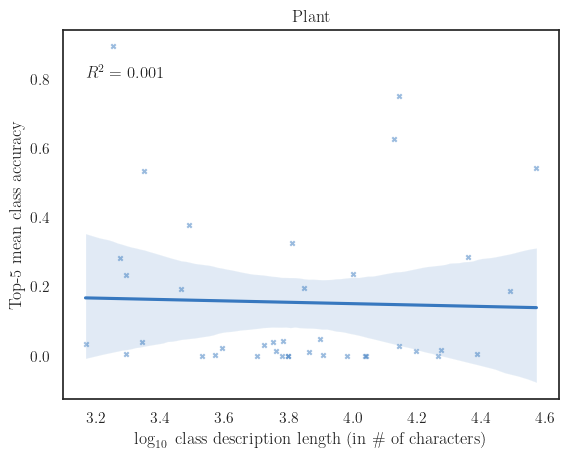

In [66]:
plt.title('Plant')
plot_fig(df, 'plants', save='simple_zsl_albert_outputs/class_accuracy_vs_description_length_plants')


2022-11-29 21:40:07,080 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:07,082 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:07,082 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:07,083 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:07,084 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:07,084 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:07,085 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:07,086 DEBUG              texmanager._get_font_preamble

2022-11-29 21:40:07,141 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:07,141 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:07,142 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:07,143 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:07,144 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/6a9fc2f080a9310f3ec0a78f57945c56.dvi
2022-11-29 21:40:07,145 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:07,145 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=

2022-11-29 21:40:07,216 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:07,217 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:07,218 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:07,219 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:07,220 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:07,220 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:07,221 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:07,222 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:40:07,335 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:07,336 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:07,337 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/4c7e23f3269338f8a486be734ebe2f02.dvi
2022-11-29 21:40:07,340 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:07,341 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:07,344 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:07,345 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:40:07,394 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:07,396 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:07,397 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:07,397 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:07,398 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:07,398 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:07,399 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:07,399 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:40:07,434 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:07,435 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:07,435 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:07,436 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:07,437 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:07,437 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:07,438 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:07,438 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:40:07,650 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:07,650 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:07,651 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:07,652 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:07,652 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:07,653 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:07,653 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:07,656 DEBUG              texm

2022-11-29 21:40:07,872 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:07,872 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:07,873 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:07,873 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:07,874 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:07,874 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:07,875 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:07,875 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:40:07,911 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/96541f16a204b22dd8db0b2e2e79c254.dvi
2022-11-29 21:40:07,912 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:07,912 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:07,914 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:07,915 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:07,915 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:07,916 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:07,9

2022-11-29 21:40:08,019 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:08,020 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:08,020 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:08,021 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:08,022 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:08,022 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,023 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,024 DEBUG              texmanager._get_font_preambl

2022-11-29 21:40:08,089 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:08,092 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:08,095 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:08,102 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:08,102 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:08,103 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:08,105 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:08,106 DEBUG              texmanager._

2022-11-29 21:40:08,148 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:08,149 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:08,149 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:08,150 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,151 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,153 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:08,154 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/2e439a728a78eaabe72993a7017eb59b.dvi
2022-11-29

2022-11-29 21:40:08,217 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:08,217 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:08,220 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:08,221 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:08,221 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:08,221 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:08,222 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:08,222 DEBUG              texmanager._

2022-11-29 21:40:08,268 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:08,269 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:08,270 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:08,270 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,272 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,272 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:08,273 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/350d68b13c92545c8bfb77070611ea0e.dvi
2022-11-29

2022-11-29 21:40:08,343 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:08,344 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:08,349 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:08,351 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:08,351 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:08,352 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:08,352 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:08,353 DEBUG              texmanager._

2022-11-29 21:40:08,396 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:08,397 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:08,397 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:08,398 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,398 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:08,399 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:08,400 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/c089d6a2afbc27e09192a23f714adff3.dvi
2022-11-29

2022-11-29 21:40:08,463 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:08,465 DEBUG             backend_pdf.          writeFonts -:- Embedding Type-1 font b'cmmi10' from dvi.
2022-11-29 21:40:08,466 DEBUG             backend_pdf.       _embedTeXFont -:- Embedding TeX font b'cmmi10' - fontinfo={'dvifont': <DviFont: b'cmmi10'>, 'pdfname': <Name b'F2'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmmi10.pfb', 'basefont': b'CMMI10', 'encodingfile': None, 'effects': {}}
2022-11-29 21:40:08,476 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 485: 'FontDirectory'
2022-11-29 21:40:08,476 DEBUG              _type1font.            __init__ -:- type1font._Token name at 498: '/CMMI10'
2022-11-29 21:40:08,477 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 506: 'known'
2022-11-29 21:40:08,479 DEBUG              _type1f

2022-11-29 21:40:08,529 DEBUG              _type1font.            __init__ -:- type1font._Token name at 760: '/FontBBox'
2022-11-29 21:40:08,531 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 770: '{'
2022-11-29 21:40:08,532 DEBUG              _type1font.            __init__ -:- type1font._Token number at 771: '-32'
2022-11-29 21:40:08,533 DEBUG              _type1font.            __init__ -:- type1font._Token number at 775: '-250'
2022-11-29 21:40:08,534 DEBUG              _type1font.            __init__ -:- type1font._Token number at 780: '1048'
2022-11-29 21:40:08,535 DEBUG              _type1font.            __init__ -:- type1font._Token number at 785: '750'
2022-11-29 21:40:08,536 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 789: '}'
2022-11-29 21:40:08,536 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 770: '{-32 -250 1048 750 }'
2022-11-29 21:40:08,537 DEBUG              _

2022-11-29 21:40:08,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1332: 'index'
2022-11-29 21:40:08,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1338: 'exch'
2022-11-29 21:40:08,604 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1343: '/.notdef'
2022-11-29 21:40:08,605 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1352: 'put'
2022-11-29 21:40:08,605 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 1355: '}'
2022-11-29 21:40:08,606 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1357: 'for'
2022-11-29 21:40:08,606 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1361: 'dup'
2022-11-29 21:40:08,607 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1365: '0'
2022-11-29 21:40:08,607 DEBUG              _ty

2022-11-29 21:40:08,653 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1634: 'dup'
2022-11-29 21:40:08,653 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1638: '16'
2022-11-29 21:40:08,654 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1641: '/zeta'
2022-11-29 21:40:08,654 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1647: 'put'
2022-11-29 21:40:08,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1651: 'dup'
2022-11-29 21:40:08,655 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1655: '17'
2022-11-29 21:40:08,656 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1658: '/eta'
2022-11-29 21:40:08,656 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1663: 'put'
2022-11-29 21:40:08,657 DEBUG              _type1font. 

2022-11-29 21:40:08,704 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1924: '/omega'
2022-11-29 21:40:08,704 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1931: 'put'
2022-11-29 21:40:08,705 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1935: 'dup'
2022-11-29 21:40:08,705 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1939: '34'
2022-11-29 21:40:08,706 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1942: '/epsilon'
2022-11-29 21:40:08,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1951: 'put'
2022-11-29 21:40:08,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1955: 'dup'
2022-11-29 21:40:08,707 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1959: '35'
2022-11-29 21:40:08,708 DEBUG              _type1f

2022-11-29 21:40:08,755 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2334: 'put'
2022-11-29 21:40:08,756 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2338: 'dup'
2022-11-29 21:40:08,757 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2342: '51'
2022-11-29 21:40:08,757 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2345: '/threeoldstyle'
2022-11-29 21:40:08,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2360: 'put'
2022-11-29 21:40:08,759 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2364: 'dup'
2022-11-29 21:40:08,759 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2368: '52'
2022-11-29 21:40:08,760 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2371: '/fouroldstyle'
2022-11-29 21:40:08,761 DEBUG        

2022-11-29 21:40:08,843 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2690: 'dup'
2022-11-29 21:40:08,845 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2694: '68'
2022-11-29 21:40:08,846 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2697: '/D'
2022-11-29 21:40:08,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2700: 'put'
2022-11-29 21:40:08,847 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2704: 'dup'
2022-11-29 21:40:08,847 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2708: '69'
2022-11-29 21:40:08,848 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2711: '/E'
2022-11-29 21:40:08,848 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2714: 'put'
2022-11-29 21:40:08,849 DEBUG              _type1font.      

2022-11-29 21:40:08,885 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2935: '/U'
2022-11-29 21:40:08,885 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2938: 'put'
2022-11-29 21:40:08,886 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2942: 'dup'
2022-11-29 21:40:08,886 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2946: '86'
2022-11-29 21:40:08,886 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2949: '/V'
2022-11-29 21:40:08,887 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2952: 'put'
2022-11-29 21:40:08,887 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2956: 'dup'
2022-11-29 21:40:08,893 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2960: '87'
2022-11-29 21:40:08,893 DEBUG              _type1font.      

2022-11-29 21:40:08,937 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3218: 'dup'
2022-11-29 21:40:08,938 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3222: '103'
2022-11-29 21:40:08,938 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3226: '/g'
2022-11-29 21:40:08,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3229: 'put'
2022-11-29 21:40:08,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3233: 'dup'
2022-11-29 21:40:08,939 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3237: '104'
2022-11-29 21:40:08,940 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3241: '/h'
2022-11-29 21:40:08,940 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3244: 'put'
2022-11-29 21:40:08,940 DEBUG              _type1font.    

2022-11-29 21:40:08,974 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3481: '/x'
2022-11-29 21:40:08,975 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3484: 'put'
2022-11-29 21:40:08,975 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3488: 'dup'
2022-11-29 21:40:08,976 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3492: '121'
2022-11-29 21:40:08,980 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3496: '/y'
2022-11-29 21:40:08,981 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3499: 'put'
2022-11-29 21:40:08,982 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3503: 'dup'
2022-11-29 21:40:08,982 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3507: '122'
2022-11-29 21:40:08,983 DEBUG              _type1font.    

2022-11-29 21:40:09,025 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3809: 'dup'
2022-11-29 21:40:09,025 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3813: '169'
2022-11-29 21:40:09,025 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3817: '/Phi'
2022-11-29 21:40:09,026 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3822: 'put'
2022-11-29 21:40:09,027 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3826: 'dup'
2022-11-29 21:40:09,027 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3830: '170'
2022-11-29 21:40:09,028 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3834: '/Psi'
2022-11-29 21:40:09,029 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3839: 'put'
2022-11-29 21:40:09,030 DEBUG              _type1font.

2022-11-29 21:40:09,101 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4126: '/pi'
2022-11-29 21:40:09,102 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4130: 'put'
2022-11-29 21:40:09,104 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4134: 'dup'
2022-11-29 21:40:09,104 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4138: '189'
2022-11-29 21:40:09,105 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4142: '/rho'
2022-11-29 21:40:09,105 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4147: 'put'
2022-11-29 21:40:09,106 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4151: 'dup'
2022-11-29 21:40:09,106 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4155: '190'
2022-11-29 21:40:09,106 DEBUG              _type1font. 

2022-11-29 21:40:09,135 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4462: '}'
2022-11-29 21:40:09,136 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4449: '{noaccess put}'
2022-11-29 21:40:09,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4463: 'executeonly'
2022-11-29 21:40:09,137 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4475: 'def'
2022-11-29 21:40:09,137 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4479: '/MinFeature'
2022-11-29 21:40:09,138 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4490: '{'
2022-11-29 21:40:09,138 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4491: '16'
2022-11-29 21:40:09,144 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4494: '16'
2022-11-29 21:40:09,147 DEBUG     

2022-11-29 21:40:09,198 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4912: '['
2022-11-29 21:40:09,199 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4914: 'systemdict'
2022-11-29 21:40:09,199 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4925: '/internaldict'
2022-11-29 21:40:09,200 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4939: 'known'
2022-11-29 21:40:09,201 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4945: '{'
2022-11-29 21:40:09,202 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4946: '1183615869'
2022-11-29 21:40:09,204 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4957: 'systemdict'
2022-11-29 21:40:09,204 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4968: '/internaldict'
2022-11-29 2

2022-11-29 21:40:09,293 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5319: '}'
2022-11-29 21:40:09,295 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5321: 'dup'
2022-11-29 21:40:09,296 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5325: '14'
2022-11-29 21:40:09,297 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5328: 'get'
2022-11-29 21:40:09,298 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5332: '1'
2022-11-29 21:40:09,299 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5334: '25'
2022-11-29 21:40:09,300 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5337: 'dict'
2022-11-29 21:40:09,301 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5342: 'put'
2022-11-29 21:40:09,302 DEBUG              _type1font.

2022-11-29 21:40:09,353 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5717: 'not'
2022-11-29 21:40:09,353 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5721: '{'
2022-11-29 21:40:09,354 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5723: 'dup'
2022-11-29 21:40:09,354 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5727: 'dup'
2022-11-29 21:40:09,355 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5731: 'length'
2022-11-29 21:40:09,355 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5738: 'exch'
2022-11-29 21:40:09,355 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5743: 'maxlength'
2022-11-29 21:40:09,356 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5753: 'eq'
2022-11-29 21:40:09,356 DEBUG          

2022-11-29 21:40:09,390 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6055: 'exdef'
2022-11-29 21:40:09,390 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6061: '/c4x2'
2022-11-29 21:40:09,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6067: 'exdef'
2022-11-29 21:40:09,391 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6073: '/c4y1'
2022-11-29 21:40:09,392 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6079: 'exdef'
2022-11-29 21:40:09,392 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6085: '/c4x1'
2022-11-29 21:40:09,392 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6091: 'exdef'
2022-11-29 21:40:09,393 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6097: '/c4y0'
2022-11-29 21:40:09,393 DEBUG              _

2022-11-29 21:40:09,428 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6414: 'c4x1'
2022-11-29 21:40:09,428 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6419: 'c4y1'
2022-11-29 21:40:09,429 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6424: 'c4x2'
2022-11-29 21:40:09,430 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6429: 'c4y2'
2022-11-29 21:40:09,430 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6433: '}'
2022-11-29 21:40:09,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6435: 'ifelse'
2022-11-29 21:40:09,431 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6442: '/y5'
2022-11-29 21:40:09,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6446: 'exdef'
2022-11-29 21:40:09,434 DEBUG             

2022-11-29 21:40:09,460 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6719: '1'
2022-11-29 21:40:09,460 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6721: 'def'
2022-11-29 21:40:09,461 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6724: '}'
2022-11-29 21:40:09,461 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6726: '{'
2022-11-29 21:40:09,462 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6727: '/flipXY'
2022-11-29 21:40:09,462 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6735: '0'
2022-11-29 21:40:09,463 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6737: 'def'
2022-11-29 21:40:09,464 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6740: '}'
2022-11-29 21:40:09,464 DEBUG              _type1font

2022-11-29 21:40:09,518 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7035: '}'
2022-11-29 21:40:09,518 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7037: 'ifelse'
2022-11-29 21:40:09,519 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7044: 'def'
2022-11-29 21:40:09,520 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7048: '/yshrink'
2022-11-29 21:40:09,520 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7057: '{'
2022-11-29 21:40:09,521 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7058: 'c4y2'
2022-11-29 21:40:09,521 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7063: 'sub'
2022-11-29 21:40:09,522 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7067: 'shrink'
2022-11-29 21:40:09,522 DEBUG          

2022-11-29 21:40:09,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7364: 'c1x2'
2022-11-29 21:40:09,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7369: 'c1y2'
2022-11-29 21:40:09,558 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7374: 'transform'
2022-11-29 21:40:09,558 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7384: 'flipXY'
2022-11-29 21:40:09,559 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7391: '1'
2022-11-29 21:40:09,559 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7393: 'eq'
2022-11-29 21:40:09,561 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7396: '{'
2022-11-29 21:40:09,565 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7397: 'exch'
2022-11-29 21:40:09,565 DEBUG           

2022-11-29 21:40:09,599 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7629: 'cy'
2022-11-29 21:40:09,600 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7632: '0.5'
2022-11-29 21:40:09,600 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7636: 'sub'
2022-11-29 21:40:09,600 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7640: 'def'
2022-11-29 21:40:09,602 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7643: '}'
2022-11-29 21:40:09,602 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7645: 'if'
2022-11-29 21:40:09,603 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7648: '/ey'
2022-11-29 21:40:09,603 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7652: 'cy'
2022-11-29 21:40:09,604 DEBUG              _type1font. 

2022-11-29 21:40:09,638 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7899: 'eq'
2022-11-29 21:40:09,639 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7902: 'c3x2'
2022-11-29 21:40:09,639 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7907: 'c4x2'
2022-11-29 21:40:09,640 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7912: 'eq'
2022-11-29 21:40:09,640 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7915: 'or'
2022-11-29 21:40:09,641 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7918: '{'
2022-11-29 21:40:09,641 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 7919: 'false'
2022-11-29 21:40:09,641 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7925: 'PickCoords'
2022-11-29 21:40:09,642 DEBUG           

2022-11-29 21:40:09,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8216: 'c1x2'
2022-11-29 21:40:09,687 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8221: 'sub'
2022-11-29 21:40:09,688 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8225: 'round'
2022-11-29 21:40:09,690 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8231: '0'
2022-11-29 21:40:09,692 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8233: 'dtransform'
2022-11-29 21:40:09,693 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8244: 'flipXY'
2022-11-29 21:40:09,694 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8251: '-1'
2022-11-29 21:40:09,694 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8254: 'eq'
2022-11-29 21:40:09,695 DEBUG            

2022-11-29 21:40:09,725 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8498: 'dX'
2022-11-29 21:40:09,726 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8501: '0'
2022-11-29 21:40:09,726 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8503: 'lt'
2022-11-29 21:40:09,726 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8506: '{'
2022-11-29 21:40:09,727 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8507: '-1'
2022-11-29 21:40:09,730 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8509: '}'
2022-11-29 21:40:09,731 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8510: '{'
2022-11-29 21:40:09,731 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8511: '1'
2022-11-29 21:40:09,732 DEBUG              _type1font.    

2022-11-29 21:40:09,762 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8757: 'exch'
2022-11-29 21:40:09,764 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8762: 'def'
2022-11-29 21:40:09,765 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8766: '/x1'
2022-11-29 21:40:09,765 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8770: 'x1'
2022-11-29 21:40:09,766 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8773: 'eShift'
2022-11-29 21:40:09,766 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8780: 'add'
2022-11-29 21:40:09,767 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8784: 'def'
2022-11-29 21:40:09,767 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8788: '/x2'
2022-11-29 21:40:09,768 DEBUG              _type1fo

2022-11-29 21:40:09,807 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9041: 'executeonly'
2022-11-29 21:40:09,807 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9053: 'exch'
2022-11-29 21:40:09,807 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9058: '{'
2022-11-29 21:40:09,808 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9059: 'pop'
2022-11-29 21:40:09,808 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9063: 'true'
2022-11-29 21:40:09,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9068: 'exch'
2022-11-29 21:40:09,811 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9073: 'restore'
2022-11-29 21:40:09,812 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9080: '}'
2022-11-29 21:40:09,812 DEBUG    

2022-11-29 21:40:09,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9461: 'get'
2022-11-29 21:40:09,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9465: 'exec'
2022-11-29 21:40:09,847 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9469: '}'
2022-11-29 21:40:09,847 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9470: '}'
2022-11-29 21:40:09,848 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9472: '{'
2022-11-29 21:40:09,849 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9473: '{'
2022-11-29 21:40:09,849 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9474: '1183615869'
2022-11-29 21:40:09,850 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9485: 'userdict'
2022-11-29 21:40:09,850 DEBUG       

2022-11-29 21:40:09,901 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9852: '{'
2022-11-29 21:40:09,901 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9853: 'pop'
2022-11-29 21:40:09,902 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9857: '3'
2022-11-29 21:40:09,902 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9858: '}'
2022-11-29 21:40:09,902 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9860: 'ifelse'
2022-11-29 21:40:09,903 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9866: '}'
2022-11-29 21:40:09,904 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9868: 'ifelse'
2022-11-29 21:40:09,904 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9874: '}'
2022-11-29 21:40:09,905 DEBUG              _t

2022-11-29 21:40:09,916 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9956: 'RD'
2022-11-29 21:40:09,916 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9958: b' \x10\xbf1py\xbc\xf6Uz'
2022-11-29 21:40:09,917 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9969: 'NP'
2022-11-29 21:40:09,917 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9972: 'dup'
2022-11-29 21:40:09,918 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9976: '2'
2022-11-29 21:40:09,918 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9978: '9'
2022-11-29 21:40:09,919 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9980: 'RD'
2022-11-29 21:40:09,919 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9982: b' \x10\xbf1py\xbd\xc4\x9ei'
2022-11-29 21:40

2022-11-29 21:40:09,942 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10605: '82'
2022-11-29 21:40:09,942 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10608: 'RD'
2022-11-29 21:40:09,942 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10610: b' \x10\xbf1pN}\xe8\xc4\xb3\x8b\xf5GW<\xfa\xb0\xcb\xde$n\xca\xc6\x19\xa8\x1c\x15\xda\xe8\xa3\xc5\xe5\xc7?\xe9;=C\xfa\x85\x9e\x91+\xec\x08\x9ce\xa0~X\xfc7-\x11\xdcl\x08x\x85\xc2N\xe2\xa3\x00\xd8\x98\xb4\x13yI\xbb_,H\xf0\xe2E\x045\x94i\n\xb6'
2022-11-29 21:40:09,943 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10694: 'ND'
2022-11-29 21:40:09,948 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10697: '/Theta'
2022-11-29 21:40:09,948 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10704: '184'
2022-11-29 21:40:09,949 DEBUG              _type1fo

2022-11-29 21:40:09,966 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12183: '/Phi'
2022-11-29 21:40:09,967 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12188: '320'
2022-11-29 21:40:09,967 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12192: 'RD'
2022-11-29 21:40:09,968 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12194: b' \x10\xbf1pP\xd8\xfd\x18O\x04I\x16\xb8N+\x0e\xa3<"\xcdc;\xef\xb1\x17\xcd\xca\xdc\xeaV\xac\xf5\xd2\xd5&\xc0{h\x8e\xf9\x8big\x98\'\x9f\xe1Q[\x8f\xd8\x07dH\xcaM\xee\xde\x887\xdb\xb3\xf7\xf2\xbe*\x18{\xe1@:\xb3\xa8\xbd\xf1\xfd\xbe\xf0W?2:\x08N\xfaY\x85\xfe\x8a^\r\xb7\xf0\x81\x88\xe6az\xf3\xf6/\xaf\xf6\xf2\xd1\xbe\x11\xbd_<\x0c\x08y\xa8\xae\xcb\t\x10\xf3\xa3\xcdy\xa32\xbb\xe8H_\x7f\xd3\x9e\xad\xd6]\xad\xe2\x7f+\xb2*\x8f\x96J\xdc\xc4b\x08\xdey=\x86\x0f\xf6\xf3{s[ d\x1f\xf9\x0cU\xcf-\x90\x8a\t\xae\xb0\xda\xa5\x8c|4\x9ca\xb9}\xf4\x

2022-11-29 21:40:09,989 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13925: 'ND'
2022-11-29 21:40:09,989 DEBUG              _type1font.            __init__ -:- type1font._Token name at 13928: '/epsilon1'
2022-11-29 21:40:09,989 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13938: '113'
2022-11-29 21:40:09,990 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13942: 'RD'
2022-11-29 21:40:09,990 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13944: b' \x10\xbf1pHUw\x13`\xf0\xedo\xb9@X\xf4\x8a\xc5Y\x9e#H\x94\xa1\xef\xbc\xb9\xd4382\x1a\xd9\xc1\x19\x80_\xfb\xf2\x14\xe4\x83\ngu6\xfe\x11\\\xa8\xb6\xd1\xc9:\xc5\xeb\x9e\x19!_{Zs\x0b-DZs%^\xb5\x99FM\xb5\xee\x0f\x91\x8a/%\xf7\x8fF\x02\xeb}\xc8q\xe3\xb6\xdf\xac\x19\x00\xbb0\xb9\x9f\x00\x15\xb6\xe1\xe6u\xac\x1e,\xa9\x04 \x00\xa7'
2022-11-29 21:40:09,990 DEBUG              _type1font.            __init__ -:- t

2022-11-29 21:40:10,008 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15389: 'ND'
2022-11-29 21:40:10,008 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15392: '/nu'
2022-11-29 21:40:10,009 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15396: '117'
2022-11-29 21:40:10,009 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15400: 'RD'
2022-11-29 21:40:10,009 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15402: b' \x10\xbf1p2\x08\x83/\x08\x0b\xfe\xf8\xc9\xa2\xfb\xb2P\x1b\xe90O7\x1ck\xf8\xea\xe1\x83\xa8\x88\x1c_\x87\x9eb\xa3K\x84\x18(\xb6\xa8\x82$\x00\x82\x9d\xc3\xb9\xd4>\x0cWT\xe0\xebV\xa8\xbeup\x0c\x16\xa9\x88\x9d\x1c\xea\xa5mL"b\xe1\x89\xd4\x94\x81r\xc1\xcc\xf30\xc3\x17\x06\xc3f\x1d\xaf6>)-\x0fZi)\x0e\x84\xb5\xbd\xcdE\x80\\B\xaa\x13h\xd0mD\x01s^r'
2022-11-29 21:40:10,010 DEBUG              _type1font.            __

2022-11-29 21:40:10,027 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16884: 'ND'
2022-11-29 21:40:10,027 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16887: '/chi'
2022-11-29 21:40:10,028 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16892: '183'
2022-11-29 21:40:10,029 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16896: 'RD'
2022-11-29 21:40:10,029 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16898: b' \x10\xbf1pXmZ\x0c\xa4\x1b\xc6\x15\xc6\xd8\xb9)\xd8(6l\x13\xec\xec,4\xbb\xe3\xce\xe3A\xe1\xc1\xd3\x07\x9c\xd2{4t\xa4=\x8dT\xba9\xfdv\xf8\xbfT\x10Xg\x02?n\xc4\xc5\xd1@\x8b5\x04&:\x86f#Oqk1\nhc\xe7;\x9a\x83\x05\x181\x9b\xdd.2tU\xd7r\x86\x82b\xf2\x93\x83\xcd=\xc5\x89\xc9\x854\x00\xe7}\xb7"\xf3\xca\xc9\xabC5\x0ehB7Co\x98\xf0}>\x88\x9d\xccD/=l\xcb*\x85\x83\x1fL\xe1\x8c1\xe5\xa2\x1b\xbd\x15.\xad\x99\x07\xa5\xe6\x

2022-11-29 21:40:10,056 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18415: '/sigma1'
2022-11-29 21:40:10,056 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18423: '134'
2022-11-29 21:40:10,056 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18427: 'RD'
2022-11-29 21:40:10,057 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18429: b" \x10\xbf1pXc\xb1-\xed\xea(\xd4F\xad'[(+]\xe8m/@\xc9\xf7\xb0\x82\x9f\xedX\xe4Ih\xec\xdd<\x12<\xed\xca2\xaa\xae\xa3\xabH\x1d\x7f\x80\x0f\x1d \x9d\xc0c\r(\xe7\x12v\xb7Z\x11m\x84\xfd*xq{~\xf9 \xb1\xee~}\xef\x12\xe0\x83\x84S\x05B:{\x9b\xd0\r\xaet\x98\xa8\x82\xae\x8d+\xea\x04P\x18?\xf1\x02j\xe2\x1f\x96\xc7\xd9\xe8&\x88;\xc9\xecb\xbf\x1a\xd7\xf59\xa5V\x8b\x15\x10\xd8i\r\xa1\xf3\x0b"
2022-11-29 21:40:10,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18565: 'ND'
2022-11-29 21:40:10,058 DEB

2022-11-29 21:40:10,082 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19546: 'RD'
2022-11-29 21:40:10,082 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19548: b' \x10\xbf1pW>V<\x82T\'\x10\xf98\x15\x00b\x90s\xa1(s\x8d\xd5\xd2x|\xfaFq\xcf\xda\xad\x0c\xf0\xb2\xb8,D\xed\xd1\x0f\x10\xe4\xb2\xcf\x8d\x10r\xd5\x16\xd6\xf3\xab\xb2\x9f\x93`,\x0c\xacY\x08\x1d"\xf2\xaa\xe4\xa2\x02\xfe\xcd\x8d\x9715\x97\x1d\xf6K\x16\x87\x11\xa0\xb3'
2022-11-29 21:40:10,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19635: 'ND'
2022-11-29 21:40:10,093 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19638: '/zerooldstyle'
2022-11-29 21:40:10,094 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19652: '115'
2022-11-29 21:40:10,096 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19656: 'RD'
2022-11-29 21:40:10

2022-11-29 21:40:10,114 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20945: 'RD'
2022-11-29 21:40:10,115 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20947: b' \x10\xbf1p0\xab\xb5F\x1bb\x11\xc5C\xcb&\x89\x95\x18\xff\xed\x03\xc2\xe1"\x9c\x05*\x1a\xa2GF\x04U\tP\xad\x19\xc5\x7fD\xe7\x1f\xe4\x9e\x1d\x04\xebdF\xa4\x92\x00j\xa8\xbb\xb7sI9M\x1f\x80K\x06Dd"\x0cU\x8e\x0b\x0c\xb0\x99\xb3?3\xd2\x83\xadTG\xd6\xb60!X-\xb1\xe3\xc5A2p\xa1\xa7cd\xb2\xae\x97Pd\xc8\xa1\xfd\xb6Q\x86\xa2\xe4?[\xf7\x8b\x87y\x8b\xc1m\xc6\xe6N\xc4\n\xb7\x05\xb7\x82\xeb>vR\xeb\x87g\'(\xf2\x0bY\x1d\x01\x17j$\xcc\xa0x\xf2>\x15'
2022-11-29 21:40:10,115 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21101: 'ND'
2022-11-29 21:40:10,115 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21104: '/eightoldstyle'
2022-11-29 21:40:10,116 DEBUG              _type1font.            __init__ -:- type1f

2022-11-29 21:40:10,135 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22152: 'RD'
2022-11-29 21:40:10,135 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22154: b" \x10\xbf1pA\xf0\x87\xd7\xaf\xd9Iz\xbb\xc1x\xee\xe6S|cz\x84\xe3R8\xf7\x15W\x90\xdaDYm\xdc'\x9bT\xcc\xe94\xecj\x15\x12\x18\xff:\xa7(\xbc\xac\xdf\x15\x81L\xc6\xab3~\x1e\xee1<\x06\x8e-\x96\x18N\x8dT\xcc\xe2H\xc3M\x87t0\xf7\xe0\xf6\xcdI\xa7\xb5=Y\x1e\x02z\x7f\nQ\xcc\xbeh\xec\xd94\x1c\xdf\xdb\xa7\x8b\xeaJ.\xb2=\xb1\x83n\x1e&\xafs$\x890\xd7\xed\xe7eo\xb9,\xed[\xaex*6\xd5\x84\x02M\x00\xad\xa7\x05\x17C\xb9\x05\x05\x16\xe7\x07v*<q/R\xad\xcf\x8f\xca\x04\xbaP:\xcb]\xfb\xad"
2022-11-29 21:40:10,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22323: 'ND'
2022-11-29 21:40:10,136 DEBUG              _type1font.            __init__ -:- type1font._Token name at 22326: '/A'
2022-11-29 21:40:10,136 DEBUG              _type1font.         

2022-11-29 21:40:10,155 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23681: 'RD'
2022-11-29 21:40:10,156 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23683: b" \x10\xbf1pO\xabI\x82\xf5\x01<\x8bo\x86Ak\xc7\x9a\x91\x13\x02\xe3\xcfU\x00\xad\n\xfc\xedb\xdc\xe4\\\xa0\x18s\xf8a%\xb3\x81)b\x01,\\\x1e\x07\x9fl\x80\xa6\x07w)oq'\x1f\x9d\xbe\x8394\x8fx\xa9\xc6\x05/\x17\xa51\xcc@\x97\xe0\x9c \x84{\xe1}1\xd0\xe2F.8P\x8c6+F\x93\x94<\xa9\x13}\x97\x80\xe8\xd3H\x1fS\x86\xb6E\xd3\xb7\x95>\xd3\x8e\xdb\xe1\xf6l3\xda\xb9\x82\xdd\xc50\x04\x86\xfe\xcb_.#~:\xa37\xd1N\xf1\xe10\xda\xbf\xda\xa5\x7f}\xd9\x90\xf0F\x12S\xd6\xe3H\xbc\x1cf\xa2@\x10\xde1\xba\x82K\x0b\xb4\xd2m`\xf3H\xab\xb8\x9a\xf4\xcd\x9a\x9b\x0e\x14i\xfb\tY\x1fB\xb9\xfc \xec\xcd6\x84\xe3&\xda\x9b&\xa4Q\x89|\xc5>\x19\x17:`\x0e[%\xee4\xe5\xabe\xab\xa9\xfa\xdbk\x06\xd2,\x00y\xd7.\n\x89\xcb\xceJ\x0b\xee\xe5\x96@\xeb\x1d\xc2\x93\x00Q\xc5\x8c\xcb>\xe8\xd6\xdf<\x96SZ\x04"
2022-11-29 

2022-11-29 21:40:10,179 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25370: b' \x10\xbf1pG%QG\x8aD$x0|\xeb\x10\xa3\x04\x14\xab\xf5\xe8?\xa1\x9c\xb50\x90\x17\x95\x86@v\xfa\xd5\xa0"\xb1\xc3\xb1S\xf9#:~j\x07\x9c\xff\xe6\x90\x11j\xf3^J\x9axmn\xdc\x1b]*\x05\xf0\x9cPz\xac\x1f\xeeM\x9a\x8d\xbc\xaf\xab;\x9a"p\x07\xcc\xe8<<\x08\xab\xa2t\xeb\x05V\xac\xfd\xe2\x18{\xf8\x1c\xb4\xda\xd8\x8a}\xb2\xb8\xf9\xd9\xa5\x1b{!\xf8w\xe4q\xa9\xd1\x05\xc7Q\xdd~\xf0G\x0f \xbf\xb2\xaf\xcd\xee\xf5~\x8ai=\xbe\x87\xa6\x00$k\xaf \xe9\x9d\xd4\x93]\xee\xf2P\x7f\xdfJ\x92\xd4\xa0n\xb0\x97\xac\xe5\x95\x1e\xd5mr$Wy\xc9\x1f8>\xcbn\xd6]M\x8e\x9b\xcac!\x98b\r\x9cr\xbd\x17\xceVr&I\x0f\xf4\x8a\xfd\x9fEO\xafT\xfb\xd8\x89m\xbc\x9a\xa6\xc3K\'\x1b\xde\xb1\xfd\xe0r\xaf\x17)\x87\xa5\x9d:K\x07\'"[\xf2\xcboF\xf1N\x8f|h\x18\xad\xee:\xac\x12r\xaf\x91\xd0!\xc8/Bk\xb7h\xbf\xda\x85%a3\xd0\x00\xcdgc\n\x81\x8fV\xe2\x15;qcPw\x9b\x96\xebT|fcz,FWe\x1c=,\xcb\x0f\x13|\xd90\xe8^'
2022-11-29 21:40:10,179 DEBUG    

2022-11-29 21:40:10,201 DEBUG              _type1font.            __init__ -:- type1font._Token number at 27028: '249'
2022-11-29 21:40:10,201 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27032: 'RD'
2022-11-29 21:40:10,202 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27034: b' \x10\xbf1pQ\x17\x11\x91<\xf7\xb5\x06\x7f\xbf\xd0/B\x83\x7f\xa7\xbfcX\x89\x82)&\xc0\xbb\xc6UOa\xa3\x0c\xe1Y\xf3\xd57K\x01!\x8f\xc1\xbb\xc4\xae\xe5d\xd39\x16\x94+\xb7\x84e\x01\x8fx\xe8\xbfIB,;On\xac\x0c\xbe&\x8a01\xe3\xab\x8b\x11fX\xf1\xcf\x01\xb0\xea}\x14nE\x08\xf3\x15\xbd\x1d\xdd\xeeAG*i\xd8ad\x80\x0b\x96\xff<\xd2~8W\xfe\x9ajy4\xc1-\x92\x0c\x987o<\xf5"\xc0\xcf\xf8A|\xecy\xe1oU\r`\x1c\xa2\xcb\x1f\xc5\x80v\xca\x8b\x95\x9dt\x12\x89\xbd!kE\tE\xba7\xc5\xbb\xa1l\x89\xa4\xd5\x0f\xa9\x8c\x1c\xda\xbb\xd1\xc2\xae\x13\x04\xedGZ\xe3\xfd\x8bc\x0c\x98\xe8\xa6\xc6\x16\xeb\x98\xad\rz6\x05\x14zn+*\x8f\xa5%\x0f\xb5\x02)Q\xbel\xa5|\xf3\xb0\xca\xafI#\xfc\xc1

2022-11-29 21:40:10,215 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28884: 'ND'
2022-11-29 21:40:10,216 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28887: '/Z'
2022-11-29 21:40:10,217 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28890: '141'
2022-11-29 21:40:10,218 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28894: 'RD'
2022-11-29 21:40:10,219 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28896: b' \x10\xbf1p7\x01_\x1c\xc7\xb3\x8b\xfc\xe9\xe5\x1dU^\xe2\xb8`+\xb4*?\xa8\r\x03\xe3y:\x0f\x87\x07\xc2\xa9\x10U\xc8{\xa5\x1f\xfe\x10x\xe71u^\xc2Q$4hq8Dlc\x1e\x19fN\x04\xffZ\xc8\x18{\x0c\x08n\xd9 \x04\xcb\x97\xda\xfb\x98\xba\x9a\\kg\xdci\x10E\xcc\xdd&$\x95H_4\xf5\x88\xb7\xbal\x97\xf7\ni\x0c\x19\r\xc8\xb3\x8b\x06!\x98w\xdb\xf6\xc5*\x1ausw\xd4|\xc4VmT\xf8\xbem\xf9\x88\xa1T\xdd\xf8\x85\x08\xd7'
2022-11-29 21:40:10,2

2022-11-29 21:40:10,237 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30143: 'RD'
2022-11-29 21:40:10,237 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30145: b' \x10\xbf1pHU\x1f$\x01\xb8\xd3\x16\xc4\x82\x0e\xa6\xe1\xf9[mb{\xa6\x9f;\x7f\x80\xfc\xf7\xf6m\xe1\xcf\x95\xfd\x9dK@ \xb2r\xac\x8a\xad\xf6\x08gm\\\xf2\xd2B\x8f\xf8\x05\xe5\x13\xbd\xd4P\xf0\x9e\xa9T6)\x8d\x06\xdd\xd5\xd1\xf2v\x9cjBl\xc4\x83k\x84\xbe\xf5\x8eS\xcf`\x9b\xf1\xb8\x0b\x06\xd0\xbfBPf\xf9\xab\x11\\?*\xdd\x9d,Ym\x083\x00\x8bc\xe4\xad\xca\xd0\r\xf2C\xfaf\x1b\xdc\x137\x86\xa1\x06O\x05\xc0\x81P\xb8\xeev\x81E\xea\xab\x140\xe4\xaf1\xfd\x9f0\x00!\xd9:\x13%\x17'
2022-11-29 21:40:10,238 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30303: 'ND'
2022-11-29 21:40:10,238 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30306: '/c'
2022-11-29 21:40:10,239 DEBUG              _type1font.            

2022-11-29 21:40:10,267 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31453: b' \x10\xbf1p\x8cz\x17*\xf0yN\xdb\xf8\xfc\xfe\xe6\xee\xc1\x95\xb9\xa0\xa0\xe8\n\x11E\xca\xd8\x17,c\\\x1f\x1fX\x84\x1b\x1eZN\x195\xa1Fd\xe7\x96]\x92"\xb06\xbfw\xaad\xc2\t[\x9faQ%\xdd*W\xe6\xd1\xd4\x90\xbf\xe0\x02\x1e\xd13)\xf52t\x02\xe9k\x1b\x01\x11\x94!b\x01\x19\x8a\xd5\x17! $\xc2*\xc5\xfa\x83\x0e_\x81\xcf\x802\x8cq\xbd\xc5\xef\xf73\x891\x02SC\xee\xf9I\xa6\xa1\x91\xecG\x8a\xcb\xa3\x1e\x10\x88%\x0e\x9b\x87\xde\xebUq\xe9\xb1\xbe\x84\xc8{\xc5\xe0\xedM0\xb7\xf4\xc6Bo\x88\xbe'
2022-11-29 21:40:10,268 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31615: 'ND'
2022-11-29 21:40:10,268 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31618: '/k'
2022-11-29 21:40:10,269 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31621: '258'
2022-11-29 21:40:10,269 DEBUG              _type1font.  

2022-11-29 21:40:10,293 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33141: 'ND'
2022-11-29 21:40:10,294 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33144: '/r'
2022-11-29 21:40:10,299 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33147: '164'
2022-11-29 21:40:10,300 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33151: 'RD'
2022-11-29 21:40:10,301 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33153: b' \x10\xbf1pZ\xc9\x94\xb0\xe8\x96\xec\xe6\xb7u\x18\xd0\xf0\xfa\x90w\x0c4\xe2\x92\xc0\xe1_\xb26\xb3\xef\x83\x8d\xb2.\xa7\xf9\xf2lj\xda\x1c\x91\t\xf6kmX\x0f\xb6\x9f\xf0\x84\x83\x8e\xe7\xfb\xa0fxf\xa7\xbd\xd4\x07\xf08>\x1c J\xa8\xb2\x95\xa9\x14\x14\xc6n\xe9\x93U\xab\x0c\x82\x0f\xa8\xc0\xeav\xf2\x03t-L\x95\xec\x17@\xf1\x95\x13\xdf\xee\xd0_[\x97\x0f@\t-&A\xf9`\x19:\xeb_O\x8a\xd8\x8c\xf6R\xe7\xe7\x0c\xb3+\xd5S\xb7\x

2022-11-29 21:40:10,328 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34721: 'ND'
2022-11-29 21:40:10,329 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34724: '/z'
2022-11-29 21:40:10,330 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34727: '215'
2022-11-29 21:40:10,331 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34731: 'RD'
2022-11-29 21:40:10,331 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34733: b' \x10\xbf1pD\x8b\x1a\xcd\x15h\xd4\xbe .X\xcd\x9c\x12\xdb\xd7\x0e\x02\xbc\xb78\x0e\xfc\x9b\n2\xab\n`\x08\xf1/\xecA-(\x14\x85|\x03q\xf7FMT\xc8\xba\xc2\xa7\xc6x\x94\x13\x93\xf5\x9c\xa7\x1bNc\x7f\xdb\xf9\x01\xd1\x1d\x03\x96?\x8b\xff\xf42y/\xb7\xcao\xb3\xe0\x0eg\x92\x82\\s\x85\xc7\x16\x01U\xf6g \x03[\x10\x8e`S\xa0\x08\x10Md8m\xf0g\x9c\x84A#\x0fh\xc5\x19A@Y\xac\xd9/izq)ii\xa1\xf4>I\xacYd&\xaa\x84\xf7]}\xc9\xff &nB2

2022-11-29 21:40:10,372 DEBUG             backend_pdf.          writeFonts -:- Embedding Type-1 font b'cmmi12' from dvi.
2022-11-29 21:40:10,373 DEBUG             backend_pdf.       _embedTeXFont -:- Embedding TeX font b'cmmi12' - fontinfo={'dvifont': <DviFont: b'cmmi12'>, 'pdfname': <Name b'F5'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmmi12.pfb', 'basefont': b'CMMI12', 'encodingfile': None, 'effects': {}}
2022-11-29 21:40:10,389 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 485: 'FontDirectory'
2022-11-29 21:40:10,391 DEBUG              _type1font.            __init__ -:- type1font._Token name at 498: '/CMMI12'
2022-11-29 21:40:10,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 506: 'known'
2022-11-29 21:40:10,392 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 511: '{'
2022-11-29 21:40:10,393 DEBUG              _type1font.            __i

2022-11-29 21:40:10,433 DEBUG              _type1font.            __init__ -:- type1font._Token number at 771: '-31'
2022-11-29 21:40:10,434 DEBUG              _type1font.            __init__ -:- type1font._Token number at 775: '-250'
2022-11-29 21:40:10,434 DEBUG              _type1font.            __init__ -:- type1font._Token number at 780: '1026'
2022-11-29 21:40:10,435 DEBUG              _type1font.            __init__ -:- type1font._Token number at 785: '750'
2022-11-29 21:40:10,435 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 789: '}'
2022-11-29 21:40:10,436 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 770: '{-31 -250 1026 750 }'
2022-11-29 21:40:10,436 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 790: 'readonly'
2022-11-29 21:40:10,437 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 799: 'def'
2022-11-29 21:40:10,438 DEBUG             

2022-11-29 21:40:10,489 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1343: '/.notdef'
2022-11-29 21:40:10,489 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1352: 'put'
2022-11-29 21:40:10,489 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 1355: '}'
2022-11-29 21:40:10,490 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1357: 'for'
2022-11-29 21:40:10,490 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1361: 'dup'
2022-11-29 21:40:10,491 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1365: '0'
2022-11-29 21:40:10,491 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1367: '/Gamma'
2022-11-29 21:40:10,491 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1374: 'put'
2022-11-29 21:40:10,492 DEBUG              _type1

2022-11-29 21:40:10,545 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1641: '/zeta'
2022-11-29 21:40:10,546 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1647: 'put'
2022-11-29 21:40:10,546 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1651: 'dup'
2022-11-29 21:40:10,547 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1655: '17'
2022-11-29 21:40:10,547 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1658: '/eta'
2022-11-29 21:40:10,548 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1663: 'put'
2022-11-29 21:40:10,548 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1667: 'dup'
2022-11-29 21:40:10,549 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1671: '18'
2022-11-29 21:40:10,549 DEBUG              _type1font. 

2022-11-29 21:40:10,590 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1935: 'dup'
2022-11-29 21:40:10,590 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1939: '34'
2022-11-29 21:40:10,591 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1942: '/epsilon'
2022-11-29 21:40:10,591 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1951: 'put'
2022-11-29 21:40:10,592 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1955: 'dup'
2022-11-29 21:40:10,592 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1959: '35'
2022-11-29 21:40:10,592 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1962: '/theta1'
2022-11-29 21:40:10,593 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1970: 'put'
2022-11-29 21:40:10,593 DEBUG              _type1

2022-11-29 21:40:10,629 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2342: '51'
2022-11-29 21:40:10,630 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2345: '/threeoldstyle'
2022-11-29 21:40:10,631 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2360: 'put'
2022-11-29 21:40:10,632 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2364: 'dup'
2022-11-29 21:40:10,633 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2368: '52'
2022-11-29 21:40:10,636 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2371: '/fouroldstyle'
2022-11-29 21:40:10,637 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2385: 'put'
2022-11-29 21:40:10,637 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2389: 'dup'
2022-11-29 21:40:10,638 DEBUG        

2022-11-29 21:40:10,675 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2697: '/D'
2022-11-29 21:40:10,675 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2700: 'put'
2022-11-29 21:40:10,676 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2704: 'dup'
2022-11-29 21:40:10,676 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2708: '69'
2022-11-29 21:40:10,676 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2711: '/E'
2022-11-29 21:40:10,677 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2714: 'put'
2022-11-29 21:40:10,677 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2718: 'dup'
2022-11-29 21:40:10,678 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2722: '70'
2022-11-29 21:40:10,679 DEBUG              _type1font.      

2022-11-29 21:40:10,722 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2942: 'dup'
2022-11-29 21:40:10,723 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2946: '86'
2022-11-29 21:40:10,723 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2949: '/V'
2022-11-29 21:40:10,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2952: 'put'
2022-11-29 21:40:10,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2956: 'dup'
2022-11-29 21:40:10,724 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2960: '87'
2022-11-29 21:40:10,725 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2963: '/W'
2022-11-29 21:40:10,725 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2966: 'put'
2022-11-29 21:40:10,725 DEBUG              _type1font.      

2022-11-29 21:40:10,783 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3226: '/g'
2022-11-29 21:40:10,783 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3229: 'put'
2022-11-29 21:40:10,784 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3233: 'dup'
2022-11-29 21:40:10,784 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3237: '104'
2022-11-29 21:40:10,785 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3241: '/h'
2022-11-29 21:40:10,785 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3244: 'put'
2022-11-29 21:40:10,786 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3248: 'dup'
2022-11-29 21:40:10,787 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3252: '105'
2022-11-29 21:40:10,795 DEBUG              _type1font.    

2022-11-29 21:40:10,851 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3488: 'dup'
2022-11-29 21:40:10,851 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3492: '121'
2022-11-29 21:40:10,852 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3496: '/y'
2022-11-29 21:40:10,852 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3499: 'put'
2022-11-29 21:40:10,853 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3503: 'dup'
2022-11-29 21:40:10,853 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3507: '122'
2022-11-29 21:40:10,854 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3511: '/z'
2022-11-29 21:40:10,854 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3514: 'put'
2022-11-29 21:40:10,855 DEBUG              _type1font.    

2022-11-29 21:40:10,889 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3817: '/Phi'
2022-11-29 21:40:10,890 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3822: 'put'
2022-11-29 21:40:10,890 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3826: 'dup'
2022-11-29 21:40:10,891 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3830: '170'
2022-11-29 21:40:10,891 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3834: '/Psi'
2022-11-29 21:40:10,891 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3839: 'put'
2022-11-29 21:40:10,892 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3843: 'dup'
2022-11-29 21:40:10,892 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3847: '173'
2022-11-29 21:40:10,893 DEBUG              _type1font.

2022-11-29 21:40:10,951 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4134: 'dup'
2022-11-29 21:40:10,951 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4138: '189'
2022-11-29 21:40:10,952 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4142: '/rho'
2022-11-29 21:40:10,953 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4147: 'put'
2022-11-29 21:40:10,953 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4151: 'dup'
2022-11-29 21:40:10,954 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4155: '190'
2022-11-29 21:40:10,954 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4159: '/sigma'
2022-11-29 21:40:10,955 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4166: 'put'
2022-11-29 21:40:10,955 DEBUG              _type1fon

2022-11-29 21:40:11,016 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4463: 'executeonly'
2022-11-29 21:40:11,017 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4475: 'def'
2022-11-29 21:40:11,017 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4479: '/MinFeature'
2022-11-29 21:40:11,018 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4490: '{'
2022-11-29 21:40:11,019 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4491: '16'
2022-11-29 21:40:11,019 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4494: '16'
2022-11-29 21:40:11,019 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4496: '}'
2022-11-29 21:40:11,020 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4490: '{16 16}'
2022-11-29 21:40:11,020 DEBUG            

2022-11-29 21:40:11,048 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4925: '/internaldict'
2022-11-29 21:40:11,048 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4939: 'known'
2022-11-29 21:40:11,048 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4945: '{'
2022-11-29 21:40:11,049 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4946: '1183615869'
2022-11-29 21:40:11,060 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4957: 'systemdict'
2022-11-29 21:40:11,060 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4968: '/internaldict'
2022-11-29 21:40:11,061 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4982: 'get'
2022-11-29 21:40:11,061 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4986: 'exec'
2022-11-29 21:40:1

2022-11-29 21:40:11,097 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5325: '14'
2022-11-29 21:40:11,098 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5328: 'get'
2022-11-29 21:40:11,098 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5332: '1'
2022-11-29 21:40:11,099 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5334: '25'
2022-11-29 21:40:11,100 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5337: 'dict'
2022-11-29 21:40:11,100 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5342: 'put'
2022-11-29 21:40:11,101 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5346: 'bind'
2022-11-29 21:40:11,101 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5351: 'executeonly'
2022-11-29 21:40:11,102 DEBUG              _t

2022-11-29 21:40:11,130 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5723: 'dup'
2022-11-29 21:40:11,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5727: 'dup'
2022-11-29 21:40:11,132 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5731: 'length'
2022-11-29 21:40:11,132 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5738: 'exch'
2022-11-29 21:40:11,133 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5743: 'maxlength'
2022-11-29 21:40:11,133 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5753: 'eq'
2022-11-29 21:40:11,134 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5756: '{'
2022-11-29 21:40:11,134 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5757: 'pop'
2022-11-29 21:40:11,135 DEBUG          

2022-11-29 21:40:11,173 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6067: 'exdef'
2022-11-29 21:40:11,173 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6073: '/c4y1'
2022-11-29 21:40:11,174 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6079: 'exdef'
2022-11-29 21:40:11,174 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6085: '/c4x1'
2022-11-29 21:40:11,175 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6091: 'exdef'
2022-11-29 21:40:11,175 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6097: '/c4y0'
2022-11-29 21:40:11,175 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6103: 'exdef'
2022-11-29 21:40:11,176 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6109: '/c4x0'
2022-11-29 21:40:11,176 DEBUG              _

2022-11-29 21:40:11,213 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6424: 'c4x2'
2022-11-29 21:40:11,214 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6429: 'c4y2'
2022-11-29 21:40:11,215 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6433: '}'
2022-11-29 21:40:11,215 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6435: 'ifelse'
2022-11-29 21:40:11,216 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6442: '/y5'
2022-11-29 21:40:11,216 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6446: 'exdef'
2022-11-29 21:40:11,217 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6452: '/x5'
2022-11-29 21:40:11,217 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6456: 'exdef'
2022-11-29 21:40:11,218 DEBUG              _t

2022-11-29 21:40:11,260 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6724: '}'
2022-11-29 21:40:11,260 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6726: '{'
2022-11-29 21:40:11,262 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6727: '/flipXY'
2022-11-29 21:40:11,262 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6735: '0'
2022-11-29 21:40:11,263 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6737: 'def'
2022-11-29 21:40:11,264 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6740: '}'
2022-11-29 21:40:11,264 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6742: 'ifelse'
2022-11-29 21:40:11,265 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6748: '}'
2022-11-29 21:40:11,265 DEBUG              _typ

2022-11-29 21:40:11,304 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7044: 'def'
2022-11-29 21:40:11,304 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7048: '/yshrink'
2022-11-29 21:40:11,305 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7057: '{'
2022-11-29 21:40:11,306 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7058: 'c4y2'
2022-11-29 21:40:11,306 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7063: 'sub'
2022-11-29 21:40:11,307 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7067: 'shrink'
2022-11-29 21:40:11,308 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7074: 'mul'
2022-11-29 21:40:11,308 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7078: 'c4y2'
2022-11-29 21:40:11,309 DEBUG            

2022-11-29 21:40:11,341 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7374: 'transform'
2022-11-29 21:40:11,341 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7384: 'flipXY'
2022-11-29 21:40:11,342 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7391: '1'
2022-11-29 21:40:11,342 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7393: 'eq'
2022-11-29 21:40:11,343 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7396: '{'
2022-11-29 21:40:11,344 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7397: 'exch'
2022-11-29 21:40:11,344 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7401: '}'
2022-11-29 21:40:11,345 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7403: 'if'
2022-11-29 21:40:11,346 DEBUG              

2022-11-29 21:40:11,390 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7636: 'sub'
2022-11-29 21:40:11,390 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7640: 'def'
2022-11-29 21:40:11,391 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7643: '}'
2022-11-29 21:40:11,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7645: 'if'
2022-11-29 21:40:11,392 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7648: '/ey'
2022-11-29 21:40:11,397 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7652: 'cy'
2022-11-29 21:40:11,398 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7655: 'dY'
2022-11-29 21:40:11,399 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7658: 'add'
2022-11-29 21:40:11,400 DEBUG              _type1font.

2022-11-29 21:40:11,452 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7907: 'c4x2'
2022-11-29 21:40:11,452 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7912: 'eq'
2022-11-29 21:40:11,453 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7915: 'or'
2022-11-29 21:40:11,453 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7918: '{'
2022-11-29 21:40:11,453 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 7919: 'false'
2022-11-29 21:40:11,454 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7925: 'PickCoords'
2022-11-29 21:40:11,454 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7935: '}'
2022-11-29 21:40:11,454 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7937: '{'
2022-11-29 21:40:11,455 DEBUG           

2022-11-29 21:40:11,491 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8225: 'round'
2022-11-29 21:40:11,492 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8231: '0'
2022-11-29 21:40:11,492 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8233: 'dtransform'
2022-11-29 21:40:11,492 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8244: 'flipXY'
2022-11-29 21:40:11,493 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8251: '-1'
2022-11-29 21:40:11,493 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8254: 'eq'
2022-11-29 21:40:11,494 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8257: '{'
2022-11-29 21:40:11,494 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8258: 'exch'
2022-11-29 21:40:11,495 DEBUG            

2022-11-29 21:40:11,531 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8503: 'lt'
2022-11-29 21:40:11,532 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8506: '{'
2022-11-29 21:40:11,532 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8507: '-1'
2022-11-29 21:40:11,533 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8509: '}'
2022-11-29 21:40:11,533 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8510: '{'
2022-11-29 21:40:11,534 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8511: '1'
2022-11-29 21:40:11,534 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8512: '}'
2022-11-29 21:40:11,534 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8514: 'ifelse'
2022-11-29 21:40:11,535 DEBUG              _type1fo

2022-11-29 21:40:11,570 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8766: '/x1'
2022-11-29 21:40:11,570 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8770: 'x1'
2022-11-29 21:40:11,571 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8773: 'eShift'
2022-11-29 21:40:11,571 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8780: 'add'
2022-11-29 21:40:11,571 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8784: 'def'
2022-11-29 21:40:11,572 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8788: '/x2'
2022-11-29 21:40:11,572 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8792: 'x2'
2022-11-29 21:40:11,573 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8795: 'eShift'
2022-11-29 21:40:11,573 DEBUG              _type1f

2022-11-29 21:40:11,614 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9058: '{'
2022-11-29 21:40:11,615 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9059: 'pop'
2022-11-29 21:40:11,615 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9063: 'true'
2022-11-29 21:40:11,616 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9068: 'exch'
2022-11-29 21:40:11,617 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9073: 'restore'
2022-11-29 21:40:11,617 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9080: '}'
2022-11-29 21:40:11,618 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9082: '{'
2022-11-29 21:40:11,619 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9084: 'systemdict'
2022-11-29 21:40:11,619 DEBUG      

2022-11-29 21:40:11,665 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9469: '}'
2022-11-29 21:40:11,665 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9470: '}'
2022-11-29 21:40:11,666 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9472: '{'
2022-11-29 21:40:11,666 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9473: '{'
2022-11-29 21:40:11,667 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9474: '1183615869'
2022-11-29 21:40:11,667 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9485: 'userdict'
2022-11-29 21:40:11,668 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9494: '/internaldict'
2022-11-29 21:40:11,668 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9508: 'get'
2022-11-29 21:40:11,669 DEBUG 

2022-11-29 21:40:11,705 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9857: '3'
2022-11-29 21:40:11,705 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9858: '}'
2022-11-29 21:40:11,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9860: 'ifelse'
2022-11-29 21:40:11,706 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9866: '}'
2022-11-29 21:40:11,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9868: 'ifelse'
2022-11-29 21:40:11,707 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9874: '}'
2022-11-29 21:40:11,708 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9876: 'ifelse'
2022-11-29 21:40:11,708 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9883: '}'
2022-11-29 21:40:11,709 DEBUG             

2022-11-29 21:40:11,720 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9970: 'NP'
2022-11-29 21:40:11,721 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9973: 'dup'
2022-11-29 21:40:11,721 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9977: '2'
2022-11-29 21:40:11,722 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9979: '9'
2022-11-29 21:40:11,722 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9981: 'RD'
2022-11-29 21:40:11,722 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9983: b' \x10\xbf1py\xbd\xc4\x9ei'
2022-11-29 21:40:11,723 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9994: 'NP'
2022-11-29 21:40:11,723 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9997: 'dup'
2022-11-29 21:40:11,724 DEBUG      

2022-11-29 21:40:11,753 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10351: b' \x10\xbf1p\t\x8bI\xa9\x1f`\xef\xf1\xa2\xf1\x82\xfco\xe7v\xec\x16\x97\x83'
2022-11-29 21:40:11,757 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10376: 'NP'
2022-11-29 21:40:11,758 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10379: 'dup'
2022-11-29 21:40:11,758 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10383: '13'
2022-11-29 21:40:11,759 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10386: '23'
2022-11-29 21:40:11,760 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10389: 'RD'
2022-11-29 21:40:11,760 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10391: b' \x10\xbf1p\t\x8bI\xa9\x1f`\xef\xf1\xb4n\xbd(\xed\xa8\x98\xfb\xea\x97\xf1'
2022-11-29 21:40:11,761 DE

2022-11-29 21:40:11,798 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10782: '23'
2022-11-29 21:40:11,799 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10785: 'RD'
2022-11-29 21:40:11,799 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10787: b' \x10\xbf1p\t\xb6=\xeavr\x02\xeb.d\xeb\x15\xff\xe8TW\xc1\xd0\xc9'
2022-11-29 21:40:11,800 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10812: 'NP'
2022-11-29 21:40:11,801 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10815: 'dup'
2022-11-29 21:40:11,802 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10819: '24'
2022-11-29 21:40:11,802 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10822: '31'
2022-11-29 21:40:11,805 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 

2022-11-29 21:40:11,852 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11230: 'NP'
2022-11-29 21:40:11,852 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11233: 'dup'
2022-11-29 21:40:11,852 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11237: '34'
2022-11-29 21:40:11,853 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11240: '19'
2022-11-29 21:40:11,853 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11243: 'RD'
2022-11-29 21:40:11,854 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11245: b' \x10\xbf1ps\xc6m\x91\xaclf\xa8M\xb1(\x9aJ+2'
2022-11-29 21:40:11,854 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11266: 'NP'
2022-11-29 21:40:11,854 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11269: 'dup'
2022-1

2022-11-29 21:40:11,881 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11631: b' \x10\xbf1ps\xc6m\x91\xba\xa2e\xe0\x16\xa7\x80\xc0\x03\x06!'
2022-11-29 21:40:11,881 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11652: 'NP'
2022-11-29 21:40:11,882 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11655: 'dup'
2022-11-29 21:40:11,882 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11659: '45'
2022-11-29 21:40:11,883 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11662: '19'
2022-11-29 21:40:11,883 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11665: 'RD'
2022-11-29 21:40:11,883 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11667: b' \x10\xbf1ps\xc6m\x91\xaclf\xfafR<N\x9f-\xe9'
2022-11-29 21:40:11,884 DEBUG              _type1font.            __i

2022-11-29 21:40:11,910 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12211: 'NP'
2022-11-29 21:40:11,911 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12214: 'ND'
2022-11-29 21:40:11,912 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12217: '2'
2022-11-29 21:40:11,912 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12219: 'index'
2022-11-29 21:40:11,913 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12225: '/CharStrings'
2022-11-29 21:40:11,913 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12238: '130'
2022-11-29 21:40:11,914 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12242: 'dict'
2022-11-29 21:40:11,914 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12247: 'dup'
2022-11-29 21:40:11,915 DEBUG        

2022-11-29 21:40:11,938 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13518: 'ND'
2022-11-29 21:40:11,939 DEBUG              _type1font.            __init__ -:- type1font._Token name at 13521: '/Sigma'
2022-11-29 21:40:11,939 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13528: '157'
2022-11-29 21:40:11,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13532: 'RD'
2022-11-29 21:40:11,940 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13534: b' \x10\xbf1p6\xd0 \xee\xb2nU\xdc\xdc\x8cj)\xda\xe5\xb3\xc5\xad:O;yR\x0fl\x94\x9a\xccFz"\xadE\xb3-q\x18H1\xd7T\xb2\x0b\x94U\xc8O\x0bH\'\xb5\xa5\xefp/2Fd\x81\xe2\xd5p\xcac\xbc\xf7#\x94j\x8a\xa2\xc8\xbb\xc1v8\xb2\xc8Z\tAl\xfe\xa12\x8f\xd5\x8c\xcb3\xa2G\x11\xf0\xd7\x16cg-E8\xe3:\x98\xdf\x1d\xdc\xbf]\xa4gRW\xa8\xdb+"\x97LW\xe3\xd9K\x0cq\xee\x1e\x85O\x9cl\x0b\xf7\xb3\x80\xfdG\xf1\x14\x04\xb4y% \xe7\x1b8)w+Z\xf4\

2022-11-29 21:40:11,954 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15188: 'ND'
2022-11-29 21:40:11,954 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15191: '/gamma'
2022-11-29 21:40:11,955 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15198: '147'
2022-11-29 21:40:11,955 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15202: 'RD'
2022-11-29 21:40:11,955 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15204: b" \x10\xbf1plL\\y\x01\ts\x83\x1a\x07)7\xd5wI\xe4\xd4\x84v?\x02\xbeh\x98i\x18e\x80T;\x88\x85\x8eG#\xa5\xe6}3\xdf&\x14\xde\x81\x13\xe2le\xc7\xab\\0\xe3Wb\xd7\xc6\xa3\xf4%\x04\xba4\x8f\xed\xb2\xc2D\x94\xa6n\\Y\x812\x04(\x83\xc7\x03'\x11\xf5\x13\x83?\xf7\xdfJ\xcb\x86\xfdH\x7f\xb1\x84\x17\x16\xe5\x17K*ca0\x1e\x8b\x0c\xdcC\xdb\x7f\xa4\xf8E}\x10\xc0\xcd\x11\xa2\xaf'=\x12\xa9B\xd7\x0ez\x1c\x13\xca\x95-*\xd6\xfa8-$

2022-11-29 21:40:11,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16610: 'ND'
2022-11-29 21:40:11,979 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16613: '/lambda'
2022-11-29 21:40:11,980 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16621: '143'
2022-11-29 21:40:11,980 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16625: 'RD'
2022-11-29 21:40:11,980 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16627: b' \x10\xbf1p2\x08\xcd\xc3\xfd\xaa\xceZ%\x0b\x0e\xa0\xa8-\x1a@T;-\xea\xc4_\xd3\xcd\xa8\xae\xb6\x7fS\x10\xe0\xbb@\x02R\x10\xfc\xae\xaa%\r\xbbT\x82\x02\xbd\xfc;\xac\xf0\x9bkW\x0f\x86Z\x9d\xb0\x1d`WW\xb6\xda\xb7\xcaa=\x15\x9a \x12\xc7]g\x82\xac7\xe1B\xe0\x031\xf2\xb7\x1f\xf8\xb5\xe0\xa8\x06;\x0f\xa1\xc7\x8b\x15\xa2\xb8\xbd\xcb#\xe8w\xdc#\xa6\xb8]K\x05)H\x99Dc\x18\xd9<\xd7\xa1\x03o\x1e\xaf\xd8\xc7\xba*\xce\xb0

2022-11-29 21:40:11,999 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18041: 'ND'
2022-11-29 21:40:11,999 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18044: '/upsilon'
2022-11-29 21:40:11,999 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18053: '162'
2022-11-29 21:40:12,000 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18057: 'RD'
2022-11-29 21:40:12,000 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18059: b' \x10\xbf1pT\xa2\x11$\xc7\x94\x9f\\\xd5\x9bgj\x8c\xce\x82\x08\xb7[\x9a6\x99\x03 \x83\xed=\xa5\xfaD1\xc6\xd0\xc3\xe7\x1f5&\xe6\xee4lF|\xb6\x0c\x18n\x9d\x04\xbf\xb3\xd6\xd2\x93h:\xc8\x98e\xfc\x1b^L\xdc\xb0\xf9d$\x11L\xaf\x01J\xa6\t\xab\x0f\\\xa07\xed\x9c(\x8fc\x98\x80+/\x9e+\xe5\xa4\xcc\xa3\xb1*\xfb\xb1\x89\x06I\xdc,%\x9f\xe1X\'\xd3\x9c\xf6/-\x12\x01\xd7"\x06\xe4y1 \xa7\x04\xbdWhG\x1a\xe9\xe0#\xfaM.\xd3\x

2022-11-29 21:40:12,025 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19566: '/pi1'
2022-11-29 21:40:12,028 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19571: '212'
2022-11-29 21:40:12,031 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19575: 'RD'
2022-11-29 21:40:12,033 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19577: b' \x10\xbf1pW?\x11%\x99\x02\xfb6\x11\xe6\xebl\x18\x14\x90\xa5\xbazd\x06\x10\x07\xa5F\x07\x8b/\xa5\x06\x8db\xdc\x1eZ\x17(/\x1d\xf4\xa3a@8EE\x92\xebn\xa7\x1cuJ\x16\xe0\x9d\xbe\xba\x9f\xe7\xdb\xa9\x083\x92_\xa7n\xd7\xe5\x18txRl:\xa7\x9b\xb2\xdf\xe9>t\x10r\x1a\xa1\xcc\xb6%\xae\x97N\x1b\xdaO\x9e~\xd2\xd0)Y.\n\x0f\xdb\xd3q\xc68)\x1d b\xec\xbf]>1\xc5\xbb8\xb8~\xc1\x89\xd9a/\x80\x19\xdb[\xfc\x9df\xc6\xac\nZ\xab\xcf\xc82\x07MN}\xe9\xe1\x888[\x1b\xee\x8b\xd9e\xa7\x1d\xed\xa2\x144;\x9d\xb8\xe4\xd7\xd9mP\xa1\xfe\t\xcc\xc4\xf0A\xa2\xe8\x

2022-11-29 21:40:12,053 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20848: 'ND'
2022-11-29 21:40:12,053 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20851: '/arrowhookright'
2022-11-29 21:40:12,054 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20867: '73'
2022-11-29 21:40:12,054 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20870: 'RD'
2022-11-29 21:40:12,054 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20872: b' \x10\xbf1p3I\xa5\xf3\x0e\xae(9\x11\xc394\xa7+a\xba\xa5l`\x02\x14}qX\xd6a\xdd\x856\x01\xe5\x83y&,\xce\xe7R\xd7\xb5\x8ay\xf2:\xae\xc6\x8c_\xcd\xbf\x90\xaaG\x1b\xee\xe5\x8e"]tK\xb6{Q\x19\x1e\xc9\x91!'
2022-11-29 21:40:12,055 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20947: 'ND'
2022-11-29 21:40:12,055 DEBUG              _type1font.            __init__ -:- typ

2022-11-29 21:40:12,082 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22181: 'ND'
2022-11-29 21:40:12,083 DEBUG              _type1font.            __init__ -:- type1font._Token name at 22184: '/sixoldstyle'
2022-11-29 21:40:12,083 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22197: '168'
2022-11-29 21:40:12,084 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22201: 'RD'
2022-11-29 21:40:12,084 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22203: b' \x10\xbf1pG\'\xd1\xb8h\x8a\xf0\xd7\x82\tF\xf8I\xd0:\xe4\x86\xc9\xe5g#\xff$\x11E\xbe=\xd5\x04y\x85\xfa1\xbdArj@?\xc2\xee\x04K\x01\xae \xdb\xb1\xab"\xf7\xe3\xa3U\xb3\x93\x8d\xf14\xb3R\xedk\x18\xcc\xe4:\xc1O\xd1\x1b\x8c\x0cv\xf5M\x119k\xbd\xffY_2\x04"\x0e\x0b\xa9\xbf\r\x9eg\xb4\xf1\xe9c\xc3dh\x11c\xb5\xf5\xa1\xd2\xba\xf5M\xd7\xe7\x9a\xf5\xa5\xdc\xcb\x8b\x8e{\x14*\xb7\xc3AW\xa4\tS\x8c\xeb\xd0NT\x86 \xa

2022-11-29 21:40:12,106 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23381: 'ND'
2022-11-29 21:40:12,106 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23384: '/star'
2022-11-29 21:40:12,112 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23390: '139'
2022-11-29 21:40:12,113 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23394: 'RD'
2022-11-29 21:40:12,113 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23396: b' \x10\xbf1py\xc8\xda\xe3{\xce\n\xf1&x\xc6\x80\xa8\x95\xab\x9f\xc6Z\x99\x06\xa2\x85R\xd5\xb9\x94\\o\x17\xc4\x16\xf6\x01\xca\xb4\xc7\xc5\x8d\xd2\xd1\x8b\xadN\xb1*\x1c\x91Z\xff@/\xb1\xd3\xc4KD\x03\xdb\xd9\x192\x82\x07\x9a\xd91\x1e\x10\xaeM\xe0n\xd4\xfaL\xd0B\xd4\xca\x8f#|\xac/s\xfd\x10\x1a\xc1\x0b\xdf\xeaI\xd42\x89\xf4eMCt\xc0\xccOL3\xfe\x9a\xd0q\x03Z\xd3T\xfao.\x15\x07\xdc\xde\x81E^#\xbf\x19W\x87\x94/\xae\xd

2022-11-29 21:40:12,130 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24764: b' \x10\xbf1pK\xe1\x1c\xe8\xe6\xb1\xd2M\xdd\xdd\x90\xc3;/Wb\x07\xb2\x92\t@\x8f\x0ex\xe7\x8d5\xc8\xd4\x8a,\xe3\xd6\x87\x04A\x19r\xb0\xa2\xb9\x00M\xff\xd4\x9e\x15\xb0\xd3[\xf1\xbb%l7&\xcb^i3\xe09\xf9\x1e2Hc\x9dp\xb6\x98q\n<\x86\xc7h\x04vL\xa3b\x88\xe4\xe4\xfd.\xc3\xf2~\x18i\xf6F?\xdeb\xd7\x84\x99I\xed\xc0\xad\xd83\x9e\x99\x96\xeb\xb30\x04\xc4?\xf6\x1fK3\x9a\xef\x0eBXG\x8f\x83\xb5C\xf6\xa6\xdc\xae2/T\x8e[\xaaa\xea\x1a\xcer\x1f\x8b[\x84\xd5\x9f\x01\xa2\x85v\x03\x9f,\xd6\x82K\x82\x81\xf2cu\x7f\xd0^\xdf\x00\xda{u\x19o\xe3\r\x9d\xb4;\x94\x12X\xb4\x94\xd7\xf6\xd8-K\x04\xf0\x0e\xe0O|\xd2\xb6K\xbb\x96qC\xba\x00R\x98\x1f*\xfa]\x92\x19w\xea{\x93d%\xc4<l\xba\xf0N\xda\tu\xe4\xd2\x9f\x81'
2022-11-29 21:40:12,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25002: 'ND'
2022-11-29 21:40:12,131 DEBUG              _type1font.            __init__ -:- type1f

2022-11-29 21:40:12,158 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26372: 'RD'
2022-11-29 21:40:12,159 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26374: b' \x10\xbf1pN~K\xc7\xa5\x8aD\xd98m)\xd1\xa2\xb5\x9e~\x93\x8e\xae[\x9f\x86%\x0c\x0c\xaed\xfbM;\xd9|\xb1\x97\xd2\xb7\xc1\x890p\xc9T\xbf\xa3\x05\xae\x14\xbcdI\xe4\x1f\xeaK\x80\xebl\xcfQ\xf5\xaa\xdb\xbb\xd0\xce\xc0\xde\x89\xbbL\x85\x0e\xa6\x8fN\x93]-w\xbc-\xd4\xc9u\x9b\x9e\xc5\x90\xa0\xfa\xa7\x98\x93\x8b\xe8v\x9fK\x106\x12L\x97\xdbX\x82]0\xcaB6\'^\xba%m\x1e\xfa\x04\x19I"\n\xbe\xf1?\xfe{\x8b1\x84\xa3D]\x84\x98/\xdd\xd1\xc0Y4\x14\x08i\x7f\xaa\x05?\x12]\x1f1\xfa\xee\xfd\xd0\x16\x82\x15\x91\x95\xff\xf4R\xca\xe7\xcd\xc1\xe3\xcb\x1bG2\xbd\xdf\x00|\xdc\xe7\xc1\x84@4\xe7Q\x0bJ\x12|\xae$\xb6\xcb\xb9\xaa\x1d\xfaV\xc8\xbez\xd9w\xab\xa3\xa8\xdc\xdd\xd7\x16\xbb\xc4\xb7\xaeU\x90\xfd\xbb9\xa0\xdc\xb3yTt\x19H\x14\x0c\x03\xf7\x10\x9fH\xaa\x1f\x87\xb1P\xc5ys&N'
2022-11-29 21:40:

2022-11-29 21:40:12,184 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27888: 'RD'
2022-11-29 21:40:12,184 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27890: b' \x10\xbf1pQ\x17\x1cw\xe8TO\x12\xab\xf7~\xd1\xe2\xd4\xa8\xff\x99\xd1EF\xce\xbd~*\x9c3\xb2\xb20\x0e\xaf\x91 }\x87_\xec4\x1e\xe7(\x94e;\x7fB/\x06C\xe5\rT\xc6\xd1M\xb9\xe4\xbeV\x03i\x1a\xee+[\x90\xca\x02w\xd9;\x869\x14\xc2\xcc\xf4\xd9t\x97\x82\xd7\x8c9\xba\'\xc7\x8a#\xe1\xbc\x01\xb0E"+\x12\xb2=\xeaj\xde5R\xb0\xf8\x97`\xc5)g$\\\x98\xd9V\x13K\x9c\xfb#n\xcf\xc3\xfcz\xa4G\xa6(\xca\xc7\x1c]\xcaj\x8bc\xac>E\x8aE\xd0\x9cg\x8f\r\xa6\xe6\xcap>\xbc\xa3\x18P\xdcn\xe7\xb1\xc6\x03\xf8\xc7\x81\x96\xd0\xe5\x95\xc7\xdc\xb1\x87\xa8#\xc6-\x85\xee\xfe\xe94\xda\x00q\xa6\r\x9b\xbc\x85>!\xd0u\x02'
2022-11-29 21:40:12,185 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28092: 'ND'
2022-11-29 21:40:12,186 DEBUG              _type1font.            _

2022-11-29 21:40:12,208 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29538: 'ND'
2022-11-29 21:40:12,208 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29541: '/flat'
2022-11-29 21:40:12,208 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29547: '109'
2022-11-29 21:40:12,209 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29551: 'RD'
2022-11-29 21:40:12,209 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29553: b" \x10\xbf1p3F\x8b5)\xf9\r\x92\xb0\xd9\xde\xeaDO?c\xd7R\x9f\xd1\xfeGJ\xcb\x97le\xf8\x833\n\xf7\x0b'\xbf\x05\x19\x81c_\xfefD\xfe7\xc6\xdcQ\xcf\xa3}\xe5\xd14\xd4\xe1\xa6\xd5\x1a\x13\xc5\xde5\xbd\x16\xccv\x9f\x8e\xb9\xd0\xd8xG!\xf2\xa5f'Sl\xb0t-F}\xefU3\xa9n\xde\xdd\xf37S9>\x1d\x1a\x88\x01\x9a\x84\x1f"
2022-11-29 21:40:12,210 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29

2022-11-29 21:40:12,244 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30810: 'RD'
2022-11-29 21:40:12,245 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30812: b' \x10\xbf1pA\xf0\x18U\x92\xff\x83\x0e\x10\xc72\xb3!+\x9d!\xb9\xb1\xc4P&&N\xbcI\xa9\xbf\xf3\x8a\x8eq.`\xeeh^l\x14(\xdf63\xbe\xa8\x94\xcc\x98\x8eg\x1c\xae\x81\xc4\r\xd35&\x15\xed%}\xb17\x11\x85\xbb>\x1b\xc2\nj\xe6\xcd.\x15\xb5\xe2\xbaa\xad\xd8\x90\xd4\xbd\xc7R\xdcL\xfeY\xdca\xce\xe1\x17\x82\x0f\x1e\x9fp\xc2\xfdMs\x17\x1dPPE*\x89!\xab\x87\x02\x98a\\\x9dr\x89\xb3='
2022-11-29 21:40:12,245 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30941: 'ND'
2022-11-29 21:40:12,246 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30944: '/d'
2022-11-29 21:40:12,246 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30947: '172'
2022-11-29 21:40:12,246 DEBUG              _type

2022-11-29 21:40:12,269 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 32110: b' \x10\xbf1p0\xab\xac\x04\xbb\xbeB\x1e\xc6\xb3\x07yLP\xd9\xefNL\xbc&\x87\xf2\x1eJb\x1bD`\xe6\x02r\xf9\x108[KU\xfe\x1b\xe0\xdb\xf4\x08*\xcf\x04\xcc\xc2%\xcaXUI\xee\xe3\xca\xc1\x80\x9e{,\nc\x9a5\x17\x93\x9d8|\x17\xd7r\xca%\xc0\x17r"\xd4\x9d\x19C\xe9/\xe5\'\x98\xd3x\x95vn\x16\xba\x12\xaa\xfa\xf0\x04\xfa\xc0\xca\xff\xd7\x99\x90\x03t!B_\xcb\x0f9>\x86c\xbbe\xb7}\x99\xbb\xda(<\x89?\x8eh0J[\x95\x9c\xd8\xa3:\xa9:\xe0\x05Zw\x85\x8c\x96WPa\xb5\xb1-xv8\x9d\xb3j\xf0\x08\x96\t\xafM\xf2Gx1L\x9f\x94\xc9\x80\x9e\x89t\xf2\xbc\xe9K\xf8o\x8a\x15\xf6\x1av\xf9\x12\x96\x94$0\xcf wH\x1b\xd1W\xb8Q\x08\x0e\xe2\x08\xbe,\x97V\xb0\x95[_\r\x86\x17\xc2R\xf6\xe8oagX\xb4\x15f\xc7\xcbE\x9c\xf4\xb5\x10\xca\xf7\xd0\x10%D\xb9i&\xa4\xbb\x05\xbbK\xe5\xb0F'
2022-11-29 21:40:12,269 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32370: 'ND'
2022-11-29 21:40:12,270 DEBUG          

2022-11-29 21:40:12,287 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33765: 'ND'
2022-11-29 21:40:12,287 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33768: '/s'
2022-11-29 21:40:12,288 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33771: '146'
2022-11-29 21:40:12,288 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33775: 'RD'
2022-11-29 21:40:12,288 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33777: b' \x10\xbf1pL\x1f\\\xb4"\xd4\xd7;\x974ls\\\xe6\xa730\xcc7v\xb5\x87\x1e\xcf\x08\x9c\x04\x95\xf4\xa9\x97\x87)\xf05\xc9z\x83h\xac\r\'\xcb0\x86Wh\x0f\x10l\xcd\xc4\xc4Dc>[\x84\xac\xf3\xf5\xacM\xd9\xb6A\xd4\x00\xb3Jk\xc1\xb6w\xe6\x12\xa3\xa0\xf1M\xaf=|E\xa8\xdf\xe6\x97J\xcc\xf0dR|\xb8\x80dZ#\x8ba\xabpx\x01\x008\xda\x15\xe3\xb7Mxs\x94L\x99\x03V\xedm\xe73V{\xf4\x97Gb\x04\x94 \x919\x1ccqFV\xc0\xed\x00'
2022-11-29 21:40

2022-11-29 21:40:12,306 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 35171: 'RD'
2022-11-29 21:40:12,306 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 35173: b' \x10\xbf1pD\x8b%\x92%Z\xa8j\xe3\xae\xb5c2\x04|\xc7v;\x0f\x0b\xe3\xf0\x9bF\x08\x95\xabRM\xbci(!\x1f\xf0\xa6\xb47\xe3\xb0g\xe2\xaa\xfbP]s3E\xe0\xa9\xb6\x8a\x11\x89:\x89\xdd\xa4\r\xb0{\xf7\x07E\xb4\xcf\xf7J\x15G\xc8\xda\x9b\xca(\x0e\x82\x80\xc3\xa7\x8e.`\xa3\n\xac\x1b/\xe6c\x08\xb6xD\xb3\xd9\x94\x95<\xa1\r\x97\x089\x1e\x86as\x8ej\xcb\xf9\xf9\x83\xbc\x1045A\x07%\x03SA\xa9\xc9\x84m@A\x11k\x9b\x95(R\xd0\x9f^\xe3G`nc\x81)\xdd\x89s\x83|\xc9\xed\xf8\xd0F@\xa3\xc7\x16\xa5\x8d@\x0c\xbaZ\xa3\xbd\xdb~R\xddy\xd9\xc5\x0f\x17\xf6A\x91\xf3H\x81\x8a\x9dl?~\x83\xa1<\xd3\xfc\xf2\xd1>qb\t\xd5\xaf\xff\xee\x84F\xd7\xc7\xe6W\x8a\xc6\xec\x94\xe3p\xd3\x1e\x06\x96\x99\x9c'
2022-11-29 21:40:12,307 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 354

2022-11-29 21:40:12,350 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 482: 'FontDirectory'
2022-11-29 21:40:12,351 DEBUG              _type1font.            __init__ -:- type1font._Token name at 495: '/CMR10'
2022-11-29 21:40:12,351 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 502: 'known'
2022-11-29 21:40:12,352 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 507: '{'
2022-11-29 21:40:12,352 DEBUG              _type1font.            __init__ -:- type1font._Token name at 508: '/CMR10'
2022-11-29 21:40:12,352 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 515: 'findfont'
2022-11-29 21:40:12,353 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 524: 'dup'
2022-11-29 21:40:12,353 DEBUG              _type1font.            __init__ -:- type1font._Token name at 527: '/UniqueID'
2022-11-29 21:40:12,354 DEBUG       

2022-11-29 21:40:12,388 DEBUG              _type1font.            __init__ -:- type1font._Token number at 779: '750'
2022-11-29 21:40:12,388 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 783: '}'
2022-11-29 21:40:12,389 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 764: '{-40 -250 1009 750 }'
2022-11-29 21:40:12,389 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 784: 'readonly'
2022-11-29 21:40:12,390 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 793: 'def'
2022-11-29 21:40:12,390 DEBUG              _type1font.            __init__ -:- type1font._Token name at 797: '/UniqueID'
2022-11-29 21:40:12,390 DEBUG              _type1font.            __init__ -:- type1font._Token number at 807: '5000793'
2022-11-29 21:40:12,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 815: 'def'
2022-11-29 21:40:12,391 DEBUG      

2022-11-29 21:40:12,431 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1336: '/Gamma'
2022-11-29 21:40:12,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1343: 'put'
2022-11-29 21:40:12,432 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1347: 'dup'
2022-11-29 21:40:12,433 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1351: '1'
2022-11-29 21:40:12,433 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1353: '/Delta'
2022-11-29 21:40:12,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1360: 'put'
2022-11-29 21:40:12,434 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1364: 'dup'
2022-11-29 21:40:12,435 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1368: '2'
2022-11-29 21:40:12,435 DEBUG              _type1font.

2022-11-29 21:40:12,466 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1630: 'dup'
2022-11-29 21:40:12,466 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1634: '18'
2022-11-29 21:40:12,467 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1637: '/grave'
2022-11-29 21:40:12,467 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1644: 'put'
2022-11-29 21:40:12,468 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1648: 'dup'
2022-11-29 21:40:12,468 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1652: '19'
2022-11-29 21:40:12,468 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1655: '/acute'
2022-11-29 21:40:12,469 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1662: 'put'
2022-11-29 21:40:12,469 DEBUG              _type1fon

2022-11-29 21:40:12,505 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1952: '/numbersign'
2022-11-29 21:40:12,505 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1964: 'put'
2022-11-29 21:40:12,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1968: 'dup'
2022-11-29 21:40:12,506 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1972: '36'
2022-11-29 21:40:12,506 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1975: '/dollar'
2022-11-29 21:40:12,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1983: 'put'
2022-11-29 21:40:12,507 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1987: 'dup'
2022-11-29 21:40:12,507 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1991: '37'
2022-11-29 21:40:12,507 DEBUG              _ty

2022-11-29 21:40:12,542 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2289: 'put'
2022-11-29 21:40:12,542 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2293: 'dup'
2022-11-29 21:40:12,542 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2297: '53'
2022-11-29 21:40:12,543 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2300: '/five'
2022-11-29 21:40:12,543 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2306: 'put'
2022-11-29 21:40:12,544 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2310: 'dup'
2022-11-29 21:40:12,546 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2314: '54'
2022-11-29 21:40:12,547 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2317: '/six'
2022-11-29 21:40:12,547 DEBUG              _type1font. 

2022-11-29 21:40:12,576 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2595: '70'
2022-11-29 21:40:12,577 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2598: '/F'
2022-11-29 21:40:12,580 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2601: 'put'
2022-11-29 21:40:12,580 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2605: 'dup'
2022-11-29 21:40:12,581 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2609: '71'
2022-11-29 21:40:12,581 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2612: '/G'
2022-11-29 21:40:12,582 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2615: 'put'
2022-11-29 21:40:12,582 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2619: 'dup'
2022-11-29 21:40:12,583 DEBUG              _type1font.      

2022-11-29 21:40:12,615 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2839: 'put'
2022-11-29 21:40:12,616 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2843: 'dup'
2022-11-29 21:40:12,617 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2847: '88'
2022-11-29 21:40:12,617 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2850: '/X'
2022-11-29 21:40:12,618 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2853: 'put'
2022-11-29 21:40:12,618 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2857: 'dup'
2022-11-29 21:40:12,619 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2861: '89'
2022-11-29 21:40:12,619 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2864: '/Y'
2022-11-29 21:40:12,620 DEBUG              _type1font.      

2022-11-29 21:40:12,661 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3147: '105'
2022-11-29 21:40:12,662 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3151: '/i'
2022-11-29 21:40:12,662 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3154: 'put'
2022-11-29 21:40:12,663 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3158: 'dup'
2022-11-29 21:40:12,663 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3162: '106'
2022-11-29 21:40:12,664 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3166: '/j'
2022-11-29 21:40:12,668 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3169: 'put'
2022-11-29 21:40:12,670 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3173: 'dup'
2022-11-29 21:40:12,670 DEBUG              _type1font.    

2022-11-29 21:40:12,713 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3409: 'put'
2022-11-29 21:40:12,714 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3413: 'dup'
2022-11-29 21:40:12,714 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3417: '123'
2022-11-29 21:40:12,715 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3421: '/endash'
2022-11-29 21:40:12,715 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3429: 'put'
2022-11-29 21:40:12,715 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3433: 'dup'
2022-11-29 21:40:12,716 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3437: '124'
2022-11-29 21:40:12,716 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3441: '/emdash'
2022-11-29 21:40:12,717 DEBUG              _type

2022-11-29 21:40:12,750 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3744: 'dup'
2022-11-29 21:40:12,750 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3748: '171'
2022-11-29 21:40:12,751 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3752: '/sfthyphen'
2022-11-29 21:40:12,751 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3763: 'put'
2022-11-29 21:40:12,751 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3767: 'dup'
2022-11-29 21:40:12,752 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3771: '172'
2022-11-29 21:40:12,752 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3775: '/nbspace'
2022-11-29 21:40:12,752 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3784: 'put'
2022-11-29 21:40:12,753 DEBUG              _

2022-11-29 21:40:12,798 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4072: '188'
2022-11-29 21:40:12,799 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4076: '/germandbls'
2022-11-29 21:40:12,799 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4088: 'put'
2022-11-29 21:40:12,800 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4092: 'dup'
2022-11-29 21:40:12,800 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4096: '189'
2022-11-29 21:40:12,801 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4100: '/ae'
2022-11-29 21:40:12,801 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4104: 'put'
2022-11-29 21:40:12,802 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4108: 'dup'
2022-11-29 21:40:12,803 DEBUG              _type

2022-11-29 21:40:12,873 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4423: 'put'
2022-11-29 21:40:12,874 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4426: '}'
2022-11-29 21:40:12,875 DEBUG              _type1font.            __init__ -:- type1font._Token ? at 4413: '{noaccess put}'
2022-11-29 21:40:12,876 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4427: 'executeonly'
2022-11-29 21:40:12,876 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4439: 'def'
2022-11-29 21:40:12,877 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4443: '/MinFeature'
2022-11-29 21:40:12,880 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4454: '{'
2022-11-29 21:40:12,881 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4455: '16'
2022-11-29 21:40:12,883 DEBUG   

2022-11-29 21:40:12,976 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4693: 'def'
2022-11-29 21:40:12,977 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4697: '/OtherSubrs'
2022-11-29 21:40:12,977 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4855: '['
2022-11-29 21:40:12,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4857: 'systemdict'
2022-11-29 21:40:12,979 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4868: '/internaldict'
2022-11-29 21:40:12,980 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4882: 'known'
2022-11-29 21:40:12,981 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4888: '{'
2022-11-29 21:40:12,981 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4889: '1183615869'
2022-11-29 21:40:12,9

2022-11-29 21:40:13,009 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5253: '}'
2022-11-29 21:40:13,009 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5255: 'ifelse'
2022-11-29 21:40:13,010 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5262: '}'
2022-11-29 21:40:13,011 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5264: 'dup'
2022-11-29 21:40:13,012 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5268: '14'
2022-11-29 21:40:13,013 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5271: 'get'
2022-11-29 21:40:13,013 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5275: '1'
2022-11-29 21:40:13,014 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5277: '25'
2022-11-29 21:40:13,014 DEBUG              _type1fon

2022-11-29 21:40:13,050 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5644: '/$FlxDict'
2022-11-29 21:40:13,051 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5654: 'known'
2022-11-29 21:40:13,051 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5660: 'not'
2022-11-29 21:40:13,052 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5664: '{'
2022-11-29 21:40:13,052 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5666: 'dup'
2022-11-29 21:40:13,053 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5670: 'dup'
2022-11-29 21:40:13,053 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5674: 'length'
2022-11-29 21:40:13,053 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5681: 'exch'
2022-11-29 21:40:13,054 DEBUG          

2022-11-29 21:40:13,096 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5986: 'exdef'
2022-11-29 21:40:13,096 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5992: '/c4y2'
2022-11-29 21:40:13,097 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5998: 'exdef'
2022-11-29 21:40:13,097 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6004: '/c4x2'
2022-11-29 21:40:13,098 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6010: 'exdef'
2022-11-29 21:40:13,098 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6016: '/c4y1'
2022-11-29 21:40:13,099 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6022: 'exdef'
2022-11-29 21:40:13,099 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6028: '/c4x1'
2022-11-29 21:40:13,100 DEBUG              _

2022-11-29 21:40:13,139 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6347: 'c4x0'
2022-11-29 21:40:13,139 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6352: 'c4y0'
2022-11-29 21:40:13,140 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6357: 'c4x1'
2022-11-29 21:40:13,141 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6362: 'c4y1'
2022-11-29 21:40:13,142 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6367: 'c4x2'
2022-11-29 21:40:13,143 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6372: 'c4y2'
2022-11-29 21:40:13,144 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6376: '}'
2022-11-29 21:40:13,145 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6378: 'ifelse'
2022-11-29 21:40:13,146 DEBUG          

2022-11-29 21:40:13,199 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6653: '{'
2022-11-29 21:40:13,200 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6654: '/flipXY'
2022-11-29 21:40:13,200 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6662: '1'
2022-11-29 21:40:13,201 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6664: 'def'
2022-11-29 21:40:13,201 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6667: '}'
2022-11-29 21:40:13,205 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6669: '{'
2022-11-29 21:40:13,205 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6670: '/flipXY'
2022-11-29 21:40:13,206 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6678: '0'
2022-11-29 21:40:13,206 DEBUG              _type1fon

2022-11-29 21:40:13,244 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6971: 'div'
2022-11-29 21:40:13,244 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6975: 'abs'
2022-11-29 21:40:13,245 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6978: '}'
2022-11-29 21:40:13,245 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6980: 'ifelse'
2022-11-29 21:40:13,245 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6987: 'def'
2022-11-29 21:40:13,246 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6991: '/yshrink'
2022-11-29 21:40:13,246 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7000: '{'
2022-11-29 21:40:13,246 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7001: 'c4y2'
2022-11-29 21:40:13,247 DEBUG             

2022-11-29 21:40:13,271 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7302: 'gt'
2022-11-29 21:40:13,272 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7305: '{'
2022-11-29 21:40:13,272 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7307: 'c1x2'
2022-11-29 21:40:13,273 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7312: 'c1y2'
2022-11-29 21:40:13,273 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7317: 'transform'
2022-11-29 21:40:13,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7327: 'flipXY'
2022-11-29 21:40:13,274 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7334: '1'
2022-11-29 21:40:13,275 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7336: 'eq'
2022-11-29 21:40:13,276 DEBUG             

2022-11-29 21:40:13,333 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7567: '{'
2022-11-29 21:40:13,334 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7568: '/cy'
2022-11-29 21:40:13,334 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7572: 'cy'
2022-11-29 21:40:13,335 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7575: '0.5'
2022-11-29 21:40:13,335 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7579: 'sub'
2022-11-29 21:40:13,336 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7583: 'def'
2022-11-29 21:40:13,336 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7586: '}'
2022-11-29 21:40:13,337 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7588: 'if'
2022-11-29 21:40:13,337 DEBUG              _type1font.

2022-11-29 21:40:13,375 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7833: 'flipXY'
2022-11-29 21:40:13,375 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7840: '0'
2022-11-29 21:40:13,376 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7842: 'eq'
2022-11-29 21:40:13,377 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7845: 'c3x2'
2022-11-29 21:40:13,382 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7850: 'c4x2'
2022-11-29 21:40:13,386 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7855: 'eq'
2022-11-29 21:40:13,387 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7858: 'or'
2022-11-29 21:40:13,388 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7861: '{'
2022-11-29 21:40:13,389 DEBUG              _type1

2022-11-29 21:40:13,417 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8150: '/dX'
2022-11-29 21:40:13,417 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8154: 'c3x2'
2022-11-29 21:40:13,418 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8159: 'c1x2'
2022-11-29 21:40:13,418 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8164: 'sub'
2022-11-29 21:40:13,419 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8168: 'round'
2022-11-29 21:40:13,419 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8174: '0'
2022-11-29 21:40:13,420 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8176: 'dtransform'
2022-11-29 21:40:13,420 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8187: 'flipXY'
2022-11-29 21:40:13,420 DEBUG           

2022-11-29 21:40:13,458 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8436: '{'
2022-11-29 21:40:13,459 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8437: 'pop'
2022-11-29 21:40:13,459 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8441: 'dX'
2022-11-29 21:40:13,460 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8444: '0'
2022-11-29 21:40:13,460 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8446: 'lt'
2022-11-29 21:40:13,461 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8449: '{'
2022-11-29 21:40:13,461 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8450: '-1'
2022-11-29 21:40:13,462 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8452: '}'
2022-11-29 21:40:13,462 DEBUG              _type1font. 

2022-11-29 21:40:13,503 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8688: 'sub'
2022-11-29 21:40:13,503 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8692: '/eShift'
2022-11-29 21:40:13,504 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8700: 'exch'
2022-11-29 21:40:13,504 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8705: 'def'
2022-11-29 21:40:13,505 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8709: '/x1'
2022-11-29 21:40:13,505 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8713: 'x1'
2022-11-29 21:40:13,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8716: 'eShift'
2022-11-29 21:40:13,506 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8723: 'add'
2022-11-29 21:40:13,507 DEBUG              _typ

2022-11-29 21:40:13,543 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8978: ']'
2022-11-29 21:40:13,544 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8980: 'cvx'
2022-11-29 21:40:13,544 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8984: 'executeonly'
2022-11-29 21:40:13,545 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8996: 'exch'
2022-11-29 21:40:13,546 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9001: '{'
2022-11-29 21:40:13,547 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9002: 'pop'
2022-11-29 21:40:13,547 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9006: 'true'
2022-11-29 21:40:13,548 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9011: 'exch'
2022-11-29 21:40:13,553 DEBUG        

2022-11-29 21:40:13,592 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9390: 'exec'
2022-11-29 21:40:13,593 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9395: '/FlxProc'
2022-11-29 21:40:13,594 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9404: 'get'
2022-11-29 21:40:13,595 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9408: 'exec'
2022-11-29 21:40:13,596 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9412: '}'
2022-11-29 21:40:13,597 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9413: '}'
2022-11-29 21:40:13,598 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9415: '{'
2022-11-29 21:40:13,599 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9416: '{'
2022-11-29 21:40:13,599 DEBUG              _

2022-11-29 21:40:13,654 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9789: 'exec'
2022-11-29 21:40:13,654 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9793: '}'
2022-11-29 21:40:13,655 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9795: '{'
2022-11-29 21:40:13,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9796: 'pop'
2022-11-29 21:40:13,655 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9800: '3'
2022-11-29 21:40:13,656 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9801: '}'
2022-11-29 21:40:13,656 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9803: 'ifelse'
2022-11-29 21:40:13,656 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9809: '}'
2022-11-29 21:40:13,657 DEBUG              _typ

2022-11-29 21:40:13,665 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9897: '1'
2022-11-29 21:40:13,666 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9899: '9'
2022-11-29 21:40:13,666 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9901: 'RD'
2022-11-29 21:40:13,666 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 9903: b' \x10\xbf1py\xbc\xf6Uz'
2022-11-29 21:40:13,667 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9914: 'NP'
2022-11-29 21:40:13,667 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9917: 'dup'
2022-11-29 21:40:13,667 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9921: '2'
2022-11-29 21:40:13,668 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9923: '9'
2022-11-29 21:40:13,668 DEBUG              

2022-11-29 21:40:13,705 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10291: 'dup'
2022-11-29 21:40:13,705 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10295: '12'
2022-11-29 21:40:13,706 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10298: '26'
2022-11-29 21:40:13,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10301: 'RD'
2022-11-29 21:40:13,707 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10303: b' \x10\xbf1py\x9a\x8e\x1f?S\x7f\x95b\xd7\x7fO\xcd\x85@L\xec0S\x13\x9b\xff'
2022-11-29 21:40:13,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10331: 'NP'
2022-11-29 21:40:13,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10334: 'dup'
2022-11-29 21:40:13,708 DEBUG              _type1font.            __init__ -:- type1font._Token n

2022-11-29 21:40:13,749 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10764: 'RD'
2022-11-29 21:40:13,749 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10766: b' \x10\xbf1p\xa1\xd1\x08\x02f\xbf\x8d\xd9\xf3\xb3V~}h\x1f)#yT\x0b \xc1)$\xd4D\xf8\x1c\xa9\xdem\xb6^.'
2022-11-29 21:40:13,750 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10806: 'NP'
2022-11-29 21:40:13,751 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10809: 'dup'
2022-11-29 21:40:13,751 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10813: '23'
2022-11-29 21:40:13,752 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10816: '25'
2022-11-29 21:40:13,752 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10819: 'RD'
2022-11-29 21:40:13,753 DEBUG              _type1font.            __ini

2022-11-29 21:40:13,785 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11253: 'NP'
2022-11-29 21:40:13,785 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11256: 'dup'
2022-11-29 21:40:13,786 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11260: '33'
2022-11-29 21:40:13,787 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11263: '27'
2022-11-29 21:40:13,788 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11266: 'RD'
2022-11-29 21:40:13,789 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11268: b' \x10\xbf1p\x87\xdd\t\x9c\xacLq\xae\x97\xaf\xe5\x8d\xd5\xf9\xb1\x1a4\xe6\x93T\xaf\x06\xf4'
2022-11-29 21:40:13,790 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11297: 'NP'
2022-11-29 21:40:13,791 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:40:13,843 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11686: 'RD'
2022-11-29 21:40:13,845 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 11688: b' \x10\xbf1py\xc5=q\xdegdr\xe5%\x95w\xde\xa2\x13ml\xe1J\x02\x18Y?\xcd\xeb(5'
2022-11-29 21:40:13,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11721: 'NP'
2022-11-29 21:40:13,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11724: 'dup'
2022-11-29 21:40:13,847 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11728: '44'
2022-11-29 21:40:13,847 DEBUG              _type1font.            __init__ -:- type1font._Token number at 11731: '31'
2022-11-29 21:40:13,848 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11734: 'RD'
2022-11-29 21:40:13,848 DEBUG              _type1font.            __init__ -:- type1font._Token 

2022-11-29 21:40:13,870 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12151: 'dup'
2022-11-29 21:40:13,871 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12155: '54'
2022-11-29 21:40:13,871 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12158: '31'
2022-11-29 21:40:13,871 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12161: 'RD'
2022-11-29 21:40:13,872 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12163: b' \x10\xbf1p\x87\xdbj\xedw\x0e\xb3$7\x1a\xa4\xba\xcb\xb7\xc61\xb9\xe7\xd5C$B\xfb\x9f\xb2v\x9a'
2022-11-29 21:40:13,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12196: 'NP'
2022-11-29 21:40:13,872 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12199: 'dup'
2022-11-29 21:40:13,873 DEBUG              _type1font.            __init__ -:

2022-11-29 21:40:13,911 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12592: b' \x10\xbf1pr/\x0e\x89=\xbb\xa7\x1bR\xe6\xf5?\xd7\x88*\xa7\x96\xbd\xf6'
2022-11-29 21:40:13,911 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12617: 'NP'
2022-11-29 21:40:13,912 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12620: 'dup'
2022-11-29 21:40:13,912 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12624: '65'
2022-11-29 21:40:13,913 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12627: '23'
2022-11-29 21:40:13,913 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12630: 'RD'
2022-11-29 21:40:13,914 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12632: b' \x10\xbf1pr>&\x1c\x93\xb8\xe6\xe1E\xe7\xcc\r\xfc\xa4\xf1\xd3\xb4\xef\x84'
2022-11-29 21:40:13,914 DEBUG 

2022-11-29 21:40:13,945 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13035: '75'
2022-11-29 21:40:13,946 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13038: '22'
2022-11-29 21:40:13,946 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13041: 'RD'
2022-11-29 21:40:13,947 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13043: b' \x10\xbf1py\x9a\x8e\x1f#\xc7%\xf7f\xd6?\x89#\xcf\x90%\x99\x17'
2022-11-29 21:40:13,947 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13067: 'NP'
2022-11-29 21:40:13,948 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13070: 'dup'
2022-11-29 21:40:13,948 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13074: '76'
2022-11-29 21:40:13,949 DEBUG              _type1font.            __init__ -:- type1font._Token number at 130

2022-11-29 21:40:13,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13446: 'NP'
2022-11-29 21:40:13,978 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13449: 'dup'
2022-11-29 21:40:13,979 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13453: '86'
2022-11-29 21:40:13,980 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13456: '19'
2022-11-29 21:40:13,980 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13459: 'RD'
2022-11-29 21:40:13,981 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13461: b' \x10\xbf1pr*\x06\xfe\x9dh\x7f\xe5|\xa3\xf9\x10^8z'
2022-11-29 21:40:13,981 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13482: 'NP'
2022-11-29 21:40:13,982 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13485: 'dup'


2022-11-29 21:40:14,021 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13962: '96'
2022-11-29 21:40:14,022 DEBUG              _type1font.            __init__ -:- type1font._Token number at 13965: '65'
2022-11-29 21:40:14,022 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 13968: 'RD'
2022-11-29 21:40:14,023 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13970: b" \x10\xbf1p5('\x969\xdf+\x8cmvy\xc5\xd8\xad\x86\xfa\x94y\xec\xe8\xff\xc9\xc1@)\xf6\x963\x99j\x1ff!\x03\xf2f\xb5\xe9\xa2c\x97\x9at$\xf7\x9c\xdfh\xadh\xa8\xac\x16\xe7\xc0oUm\x1e\x99\xbf"
2022-11-29 21:40:14,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14037: 'NP'
2022-11-29 21:40:14,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14040: 'dup'
2022-11-29 21:40:14,024 DEBUG              _type1font.            __init__ -:- type1font._Token number at 

2022-11-29 21:40:14,057 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14609: '107'
2022-11-29 21:40:14,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14613: 'RD'
2022-11-29 21:40:14,057 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14615: b' \x10\xbf1p1\xd8\xbd\x12\x85\x8c\xac\x03\xa4\xbd\xfe\xbf\xd9_\x9fq?x\xda\xe4\\]\xc7\x18\x9c\xff\xe4\x91\xab\x85\xe9\x9e\xf8vd\xe6\x16\x0b1e3\xe3\xd6\xc7\xa0Mx\xc3i\xe8b\xa8\x18\x97\xf4\xbaaC9M\xca\xf5\xb4u\xdddZ\x03\xa1\xae>[B\x11\xd6{\xa2\x90\xa3\xabClCu\xe9\xbc\xca\x83\r\xfb#\x8aB\\g\x10\xfd\xaa\xbd\nt4\xf3'
2022-11-29 21:40:14,058 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14724: 'ND'
2022-11-29 21:40:14,058 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14727: '/Lambda'
2022-11-29 21:40:14,064 DEBUG              _type1font.            __init__ -:- type1font._Token

2022-11-29 21:40:14,079 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16206: 'ND'
2022-11-29 21:40:14,079 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16209: '/Omega'
2022-11-29 21:40:14,080 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16216: '180'
2022-11-29 21:40:14,080 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16220: 'RD'
2022-11-29 21:40:14,081 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16222: b' \x10\xbf1pE\xbb\xa8|@s\xcc\xff\xd3(\xd2\x11\xaas5\xc1/h\x8c\xf5<y\xb9"\xcd\xae\x12*\xb6\x0c\xd1\x95V\x99\xac6\xfdZ6\xb5\x13#\xb5\xcb\xbb8c\xbb5\x11r\x8f\xe1\xf9\x9d\xdcb\x03\xc9\xb7r\x9d`\xa8\x9a@\xd9\x11\x90\x16\xce.\x82\x88\xbc\x10o\x03V\x9b\xf3\xf6\x8aD\xb2]}(\xb4Jy\t\x00>\x83\xce\xafNR\xd8\xdap$\xe9w\t\xabS\xd0\\\xeb\x9b~\x8a\x1bm\xec\xb5\x7f\x80\xa7\x01\x0e\x96\xedp\xc62\xa9iY\x0e\xac\xb1\x07t\xae\x

2022-11-29 21:40:14,101 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17857: 'RD'
2022-11-29 21:40:14,102 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17859: b' \x10\xbf1p^\x9d\x1b\x99\xe6\xf81\xf0\xb4\x92\xa8\x01\xfa\xaau2wH\xfbU%p'
2022-11-29 21:40:14,102 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17887: 'ND'
2022-11-29 21:40:14,102 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17890: '/dotlessj'
2022-11-29 21:40:14,103 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17900: '35'
2022-11-29 21:40:14,103 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17903: 'RD'
2022-11-29 21:40:14,103 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17905: b' \x10\xbf1p\x91}b\x92\xae\xab\xc7\\X\xc1\xe6\x8b\x05\xbe\xcd\xc5~\x02\xf2U?\xef\xd1\xbb89\xd6n\x88

2022-11-29 21:40:14,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18872: 'ND'
2022-11-29 21:40:14,136 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18875: '/oe'
2022-11-29 21:40:14,136 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18879: '150'
2022-11-29 21:40:14,137 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18883: 'RD'
2022-11-29 21:40:14,137 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18885: b' \x10\xbf1pU\xd0\xf9:\xc6\xac\x1aP\x9b\x9br\xff\rQ\x04\xa4)\xce\xfc\x18h\x07>\xe1\x93\x8f\x9e\x920\x1a\tdiB\xfa\x7f\x10iF\xff@\xdb@z\xf8\x17\x81"\xca\x89\x10\x00:.\x11\xf1\x06\xbe\xca)@\xb3l\xca\xc1\xcf\xbf\x9aUX4\x7f\xa9\x9a\x0cl\xec\x82\xf4\xaa\xc8\xc1\xafJ^\r\xefQ(D\x18\xe7\xfc\xac\xda\xcb\xbc\xbb\x9b\xb2|\x13\x07\xccj\xf4\tP\xaa~\xcbP\xdf\x96\x8d\x94\x13\xef\xb2\x19C\xf0;\x11x\x9c\x01\t[\x92\xcdw^[D\x9e\

2022-11-29 21:40:14,160 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20127: 'RD'
2022-11-29 21:40:14,161 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20129: b' \x10\xbf1p1\xd8\xf5J$S\xe8\x8c\x9c\x088\x08\xc9{\xf4\xcc#\x0b\x94>\xa8\xe486t\x08Lq\x85F\xd2\x00p\x1eI!\xab\xc0\x8e\xcd\xadCmr\xee\x9b\x0c\x1b\xa17k\xd9\xcc+\xdcK\x85\x817\x19\x06\xcb)\x89\x981b\xdb\xc5JE\xd9\xe3\x1e^{u\xbb\xb5\x82z\x11\xc0)\xac\xd96)}\x048H\x01?e%\x9f\xa1$\xe8X\x83\xc3`\xc5=A\x88\xb2\xd4\xb6\x93qd\xd4jMZ\x03t\x93\x88$\x1a?\xd7`.:\xf3\x05\xb7\xe9,\x00\xf4\x8aN5\xeb\xde\x93\x17\x19\xf7k)\xbe\xaf\x15jk\x83w\xed\xd8\xc6\xdd\xd6\xbeu\xe4`\tZ\x03\xa8]p\x01u~\xc2\xdc\xa8$\xa1\xe5\x91\xe8t\x15 c\xcb\xec `\xe6R\xd2% D\xda\\j,RH3\xf7\x8e\xb0\xe9\xcc\xf7\xee\x9e\x06\x8f\xdc\xc9D\x9c\xe8\x1f<\xe1&\xf6\xdd)S\xd4}F\xd0\xc7\xac'
2022-11-29 21:40:14,161 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20365: 'ND'
2022-1

2022-11-29 21:40:14,180 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21587: 'RD'
2022-11-29 21:40:14,180 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21589: b' \x10\xbf1p1\xd8\xbd\x12\xc8\x95Y\xaf\x1f\xa8~X\xbd\xeb\xbd:Vda\xb1K\x9e\xad:$\xdcH\xf6&\x07\xc1\x0bQ\x92\xf2\x81\xf0\xdc\xd2\x9bj,\xf3\x1f\x81$\xc0\x9b<\xbc^\xd1\xcf\xb6\xe6\xf5\x81u\xfa\xd9\xa4\xf2\xd7\xfa\x04g\x9f\x9c\xfb\x96\xbd\xd7\x80\r\x9aO\xb2\xd0G\xe9\x80\xcb\xb0\xe5\xcd\x8f\xfc'
2022-11-29 21:40:14,181 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21682: 'ND'
2022-11-29 21:40:14,182 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21685: '/comma'
2022-11-29 21:40:14,182 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21692: '72'
2022-11-29 21:40:14,183 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21695: 'RD'


2022-11-29 21:40:14,224 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22601: '137'
2022-11-29 21:40:14,225 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22605: 'RD'
2022-11-29 21:40:14,225 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22607: b' \x10\xbf1pU\xd1\xba\x08\xcd\x84\xb1\xc5RX\x96Zqb\x8b\xa7`RZ\xcf\xf1\xafW\x81\x9d~`\xb7\xeb\xefO\x7fr\xc2o\xc5\xc9u\x05w~!D\xda\x0c!\x8f3\x91D\xd6Y\xb8\xff\xb1i\r5\xa5\xfd\x1eZ\x177\x8a=gK0\xb5I,\x92M\xc9z\x8d\xe2\x19\x83\x04\xb3\x97\xb5hj\x9c\x11:\x9c\x1bf\xc6\xdc\xb2@H\xcb9\xc8\xb2\xca \xe2\xa0.q\xbe\x971\xca\xfb-\xe4\xeb\xbe\xc7\xa4\x02\xa0M\xa5q(6\xfb\xf2\xbc-F\x97\xce}'
2022-11-29 21:40:14,226 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22746: 'ND'
2022-11-29 21:40:14,226 DEBUG              _type1font.            __init__ -:- type1font._Token name at 22749: '/five'
2022-11-29 21:40:14,227 DEBUG  

2022-11-29 21:40:14,249 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23806: '/equal'
2022-11-29 21:40:14,250 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23813: '79'
2022-11-29 21:40:14,250 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23816: 'RD'
2022-11-29 21:40:14,250 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23818: b' \x10\xbf1p1\xd8\xbd\x12\x07\x8c\x1e\x92\x89pse\x9b\xe1\xe5"\x05$>\x14)\xd9-\x8b\xa0b\xba\x8e\x03 \xe9\nS\xad\xd3Rq/\xa28\xa1\x9e\x05n+\xee\\\xf3\x86\xf6\xfa\x03?\x0cr\xe3\x88\x80{\x9a\x04\xe9.\xae\xba{\xdc\xbem\xc5\x17C\xe4B5'
2022-11-29 21:40:14,251 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23899: 'ND'
2022-11-29 21:40:14,251 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23902: '/questiondown'
2022-11-29 21:40:14,252 DEBUG              _type1font.

2022-11-29 21:40:14,273 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25073: '136'
2022-11-29 21:40:14,273 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25077: 'RD'
2022-11-29 21:40:14,273 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25079: b' \x10\xbf1p^\x93\x9dR\xbc\xd4\xb02\x9e\xea\xee\xb8\n\x82O\x08\x85d\xfe\xe5X\xb6\x00\xeef\xae\xe9\x82\x9e\xe6\xc6;x\x0e{\x9f||\xaa\xfb\xd2-\x87^\x7fe\xe5\xba\x97a\x9d\xf2f\xa0\xea\xea\x14\t\x8b+c\xfbY\x15\xa29\r\xb0eyX\xcf\xfb?\xbd(g\x8a\xdb\x13\xb37\xb8\xc9\xfe\x96X\xc3\xdbK\x8d\x13D\xfe0\xf8\x86#-\x93.\x00at\x07\x94\x85z\xa3i\xb9/{p\xf9C\xa4\xec@\xe8n>\x81!\xa0{\xc1\xfb\x9d\x85\x8a\xf9'
2022-11-29 21:40:14,274 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25217: 'ND'
2022-11-29 21:40:14,274 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25220: '/F'
2022-11-29 21:40:14,2

2022-11-29 21:40:14,299 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26587: 'RD'
2022-11-29 21:40:14,300 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26589: b' \x10\xbf1p^\x93\xa4\t\x18H\r\xc9\x1c[.5\xe3\xfb\xc4\xfd\x17\x04\x7f\xc7(1V^W\xea\xb02\xa3\x89o\xe9*\xc2\x97\xfb\x8d^_T\x18\xe3\x0f\xf1\xc92S\x03\x9f\x07L\xfb\x87p\xe6Y)\x05^Xq\xcd]ir\x8a\xc0\xaf3)\xabW\xcf\x11\x18v\x12\xb4\x08=D\x916\r\x9c\x16\xa7(\xa1\xc5\x87\x0b\xaf\x9af\xd4\x8d\xa5\x9b%TS41\x82\xe3\x18L\xc9\xd8\x07\xc5Pf\xdd\xd3\xf6A\xfaP\xb2O\xd3z\x1d\xd2.-'
2022-11-29 21:40:14,300 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26723: 'ND'
2022-11-29 21:40:14,301 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26726: '/M'
2022-11-29 21:40:14,301 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26729: '232'
2022-11-29 21:40:14,302 DEBUG              _ty

2022-11-29 21:40:14,322 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28083: 'ND'
2022-11-29 21:40:14,323 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28086: '/T'
2022-11-29 21:40:14,323 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28089: '162'
2022-11-29 21:40:14,324 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28093: 'RD'
2022-11-29 21:40:14,324 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28095: b' \x10\xbf1p]e\x89N\r7VF5\\o\x85\xcc\x8a\x8fL\x06\xaa\xe9\r\x9f$yH\xa2d\xac\xf36\xf3f\x8eC\xb0\x82\x82\xeb\x86Wa\xcc\xfc\xf8\xf2\xc3\xc43&3v\xc9\xaez8\x88\x8eL\x8aFp\xc2I$\x03bUd\x80\xca\x06\xae\x9e\xdc\xfd\x9c\x1d\xd5\xe7\xf0\xfe\x9b\x03\xfc\xa3-u0\x1ay\x00O+\xed7\x80\xf3g\xdf\x06\xcc\x84\xf7\xd7q\xb2z\xee~z\xe1\x93\x82\x00\x86I\xf6j\x85\x96\x86.\xadw\xe1\x05\x9f\xbb\xc29_\x98(.\xd3x\x9eWY\xea\x02h+d\x81\xe0w

2022-11-29 21:40:14,352 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29719: 'ND'
2022-11-29 21:40:14,352 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29722: '/bracketleft'
2022-11-29 21:40:14,352 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29735: '44'
2022-11-29 21:40:14,353 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29738: 'RD'
2022-11-29 21:40:14,353 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29740: b' \x10\xbf1p\x05\xad\x1d\x14\x0frY\x9a\x1e\xb3\x9a\xd5I\xf2\xddU\xb5\x05\x88\xf4y\xaa(\x90\x87\xa0fa\xa8\x94M\xa4*34Y\x94\x10J\xbf'
2022-11-29 21:40:14,354 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29786: 'ND'
2022-11-29 21:40:14,354 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29789: '/quotedblleft'
2022-11-29 21:40:14,355 DE

2022-11-29 21:40:14,380 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30678: '/e'
2022-11-29 21:40:14,380 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30681: '107'
2022-11-29 21:40:14,381 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30685: 'RD'
2022-11-29 21:40:14,381 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30687: b' \x10\xbf1pU\xd1b\x02\x95\x06?\xf1p#O\xc6Ul\xe4I3\x02o\xbap\x92\xc7\x91_\xbf\t~\xd9\x00\xf4\xebDQ)B\x95\xeb\x14\x19+`)\x1e\x18\xc8\x82\xb3g\x08\xbf\xa6\x1c\xe4\xa69\xa0\x96R\xe6\x9e\xbd\xfc\xa7A\xa1asY\xbbF\x0c\xc6\xd9\xda\xd1\xa4\x8d^\xcd\xbd\xca\xe1\x02\xf7&G\xf6\xb5h\xde\xde\xc8\x1f\xb0\x86\xbc\x043\xd3*\xac\x9d'
2022-11-29 21:40:14,381 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30796: 'ND'
2022-11-29 21:40:14,382 DEBUG              _type1font.            __init__ -:- type1font._Toke

2022-11-29 21:40:14,427 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31942: 'RD'
2022-11-29 21:40:14,428 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31944: b' \x10\xbf1pY\x9b\xc4{\xe1\xd1<ww$G\x10j)x\xc42:\xc88\x11\x1f\x99\x9e\xc7\xc5F\xb3C\xb1x\xa0\x03\x04o,\x06\x1b\xd4\xca\xb64v\n\xf1-\x9d\xfb\xe2!\x80OC\x03\r\x0cT(-\xfe\xc6\x8aJ\x96\\ya\x82\x7f\x8b\xef\xef\x91\xc84K!a\x19\xd9u\xfao\xab5K?a\xc8\xa3\x00r\x02\xb0\xa7\xdeC\x12\x98\x8b\xf2\x87\xb87\xae\x8c\xb2\xe9\n\x7f1\xd2L:\x82\xed:9u\x1b\x1c\xd6\xfd\xa8\xf4;m"\xc2\x92,\x19\xb5D^3\x8e\xf8z\xc4\x86\x89\x8b_H\xf9M_e\xcf\x82\x9c\x04\'\xb8\x01\x02T\x90\xda\xe1\xf9^\x8e\x1f\xc8\x0f\xe4\x82H\x8d\xb0\xf5i\x0fvX\x92\x15\xdb\x8a\xeb\x14\xe8\xe0J\xdc\x9f\xbbS\xa2q^\x91\xc3[\x9a\x9f\xe7\xe7i\xb9l3|0\xb7\xe3v^\xd5\x05\xed\x93\x97t}\xa7\x7fK D_G\xfc:\x9b\xef\x91o\xc9\r \xbc\xab\xcb\x168\xd5\xc4\xfc\x8d\xa1kSx\x1e\x8fZ\xd1\xe0\x06\xd0+\xa8\xdc\xd4\xdd$\x11\x05\xae5\x03\x85\

2022-11-29 21:40:14,456 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33386: 'ND'
2022-11-29 21:40:14,457 DEBUG              _type1font.            __init__ -:- type1font._Token name at 33389: '/u'
2022-11-29 21:40:14,457 DEBUG              _type1font.            __init__ -:- type1font._Token number at 33392: '93'
2022-11-29 21:40:14,458 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33395: 'RD'
2022-11-29 21:40:14,458 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 33397: b" \x10\xbf1pY\x9a\xfd\xdf\x1cU\x95'\x83\xfc\xd9c|yR\xc6\xf7l\xf1\xa9\xd3\x08\xc0\xd4\x97\x9a~On8x'\xbdC\xc9\xaeX\x8e\xa7\xc0f\xaa\x1d6c0\xaa\xa5\x84\x9eqG\x1fA\xc0\x8c\xb4v[}\xb62.\x07\x15u\xc7\x9eXJ\x16\x14Z[\xe5 \xbf\xbb\xf6\xbf\xa0!\xb1\xf5\\\xab\xffk\x02"
2022-11-29 21:40:14,459 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 33492: 'ND'
2022-11-29 21:40:14,460 DEBUG      

2022-11-29 21:40:14,490 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34762: b' \x10\xbf1py\xca8\x8f\x19\xc1\x11\xe0\xde\x13\xe3Y\x9a\x02T\xea{\xf1\xf7\xd5/\x9f\xd4\xcc\xbd1'
2022-11-29 21:40:14,491 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34794: 'ND'
2022-11-29 21:40:14,491 DEBUG              _type1font.            __init__ -:- type1font._Token name at 34797: '/hungarumlaut'
2022-11-29 21:40:14,492 DEBUG              _type1font.            __init__ -:- type1font._Token number at 34811: '38'
2022-11-29 21:40:14,493 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 34814: 'RD'
2022-11-29 21:40:14,493 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 34816: b' \x10\xbf1p\x05\xb39g2\x88b\xd1\xb5}\xbf\x9a\x8b\xd5\xc3 3\xd8-Z&0;\x9b\xeb\xe2\x80\xe1a1\x8a\xfbe\x1a'
2022-11-29 21:40:14,494 DEBUG              _type1font.            __init__ -:- type1fon

2022-11-29 21:40:14,553 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 592: 'eq'
2022-11-29 21:40:14,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 595: 'and'
2022-11-29 21:40:14,555 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 598: '}'
2022-11-29 21:40:14,555 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 599: '{'
2022-11-29 21:40:14,556 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 600: 'pop'
2022-11-29 21:40:14,556 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 604: 'false'
2022-11-29 21:40:14,557 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 609: '}'
2022-11-29 21:40:14,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 610: 'ifelse'
2022-11-29 21:40:14,558 DEBUG              _type1fon

2022-11-29 21:40:14,602 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 891: 'def'
2022-11-29 21:40:14,603 DEBUG              _type1font.            __init__ -:- type1font._Token name at 896: '/Notice'
2022-11-29 21:40:14,603 DEBUG              _type1font.            __init__ -:- type1font._Token string at 904: '(Copyright \\050c\\051 1997, 2009 American Mathematical Society \\050<http://www.ams.org>\\051, with Reserved Font Name CMR12.)'
2022-11-29 21:40:14,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1028: 'readonly'
2022-11-29 21:40:14,604 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1037: 'def'
2022-11-29 21:40:14,605 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1042: '/FullName'
2022-11-29 21:40:14,605 DEBUG              _type1font.            __init__ -:- type1font._Token string at 1052: '(CMR12)'
2022-11-29 21:40:14,606 DEBUG      

2022-11-29 21:40:14,655 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1418: '/Pi'
2022-11-29 21:40:14,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1422: 'put'
2022-11-29 21:40:14,655 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1426: 'dup'
2022-11-29 21:40:14,656 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1430: '6'
2022-11-29 21:40:14,656 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1432: '/Sigma'
2022-11-29 21:40:14,657 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1439: 'put'
2022-11-29 21:40:14,657 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1443: 'dup'
2022-11-29 21:40:14,658 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1447: '7'
2022-11-29 21:40:14,661 DEBUG              _type1font.   

2022-11-29 21:40:14,700 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1720: 'dup'
2022-11-29 21:40:14,700 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1724: '23'
2022-11-29 21:40:14,701 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1727: '/ring'
2022-11-29 21:40:14,701 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1733: 'put'
2022-11-29 21:40:14,702 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1737: 'dup'
2022-11-29 21:40:14,702 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1741: '24'
2022-11-29 21:40:14,703 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1744: '/cedilla'
2022-11-29 21:40:14,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1753: 'put'
2022-11-29 21:40:14,708 DEBUG              _type1fo

2022-11-29 21:40:14,749 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2055: '40'
2022-11-29 21:40:14,750 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2058: '/parenleft'
2022-11-29 21:40:14,750 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2069: 'put'
2022-11-29 21:40:14,751 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2073: 'dup'
2022-11-29 21:40:14,751 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2077: '41'
2022-11-29 21:40:14,752 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2080: '/parenright'
2022-11-29 21:40:14,752 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2092: 'put'
2022-11-29 21:40:14,753 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2096: 'dup'
2022-11-29 21:40:14,753 DEBUG              

2022-11-29 21:40:14,788 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2374: 'put'
2022-11-29 21:40:14,788 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2378: 'dup'
2022-11-29 21:40:14,789 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2382: '58'
2022-11-29 21:40:14,789 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2385: '/colon'
2022-11-29 21:40:14,790 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2392: 'put'
2022-11-29 21:40:14,797 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2396: 'dup'
2022-11-29 21:40:14,798 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2400: '59'
2022-11-29 21:40:14,799 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2403: '/semicolon'
2022-11-29 21:40:14,800 DEBUG              _type

2022-11-29 21:40:14,868 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2664: '75'
2022-11-29 21:40:14,869 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2667: '/K'
2022-11-29 21:40:14,876 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2670: 'put'
2022-11-29 21:40:14,878 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2674: 'dup'
2022-11-29 21:40:14,881 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2678: '76'
2022-11-29 21:40:14,882 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2681: '/L'
2022-11-29 21:40:14,884 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2684: 'put'
2022-11-29 21:40:14,885 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2688: 'dup'
2022-11-29 21:40:14,886 DEBUG              _type1font.      

2022-11-29 21:40:14,938 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2929: 'put'
2022-11-29 21:40:14,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2933: 'dup'
2022-11-29 21:40:14,940 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2937: '93'
2022-11-29 21:40:14,940 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2940: '/bracketright'
2022-11-29 21:40:14,941 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2954: 'put'
2022-11-29 21:40:14,941 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2958: 'dup'
2022-11-29 21:40:14,942 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2962: '94'
2022-11-29 21:40:14,942 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2965: '/circumflex'
2022-11-29 21:40:14,943 DEBUG           

2022-11-29 21:40:14,982 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3221: '110'
2022-11-29 21:40:14,983 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3225: '/n'
2022-11-29 21:40:14,983 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3228: 'put'
2022-11-29 21:40:14,984 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3232: 'dup'
2022-11-29 21:40:14,985 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3236: '111'
2022-11-29 21:40:14,985 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3240: '/o'
2022-11-29 21:40:14,986 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3243: 'put'
2022-11-29 21:40:14,986 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3247: 'dup'
2022-11-29 21:40:14,987 DEBUG              _type1font.    

2022-11-29 21:40:15,021 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3515: 'put'
2022-11-29 21:40:15,021 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3519: 'dup'
2022-11-29 21:40:15,022 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3523: '128'
2022-11-29 21:40:15,022 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3527: '/suppress'
2022-11-29 21:40:15,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3537: 'put'
2022-11-29 21:40:15,023 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3541: 'dup'
2022-11-29 21:40:15,024 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3545: '160'
2022-11-29 21:40:15,024 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3549: '/space'
2022-11-29 21:40:15,024 DEBUG              _typ

2022-11-29 21:40:15,064 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3842: '176'
2022-11-29 21:40:15,065 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3846: '/fl'
2022-11-29 21:40:15,066 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3850: 'put'
2022-11-29 21:40:15,067 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3854: 'dup'
2022-11-29 21:40:15,067 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3858: '177'
2022-11-29 21:40:15,068 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3862: '/ffi'
2022-11-29 21:40:15,069 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3867: 'put'
2022-11-29 21:40:15,069 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3871: 'dup'
2022-11-29 21:40:15,070 DEBUG              _type1font. 

2022-11-29 21:40:15,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4171: 'put'
2022-11-29 21:40:15,136 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4175: 'dup'
2022-11-29 21:40:15,137 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4179: '194'
2022-11-29 21:40:15,137 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4183: '/Oslash'
2022-11-29 21:40:15,137 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4191: 'put'
2022-11-29 21:40:15,138 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4195: 'dup'
2022-11-29 21:40:15,138 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4199: '195'
2022-11-29 21:40:15,138 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4203: '/suppress'
2022-11-29 21:40:15,139 DEBUG              _ty

2022-11-29 21:40:15,171 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4521: '0'
2022-11-29 21:40:15,171 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4523: '431'
2022-11-29 21:40:15,171 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4527: '446'
2022-11-29 21:40:15,172 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4531: '665'
2022-11-29 21:40:15,172 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4535: '675'
2022-11-29 21:40:15,173 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4539: '683'
2022-11-29 21:40:15,173 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4543: '704'
2022-11-29 21:40:15,173 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4546: ']'
2022-11-29 21:40:15,174 DEBUG              _type1font.   

2022-11-29 21:40:15,217 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4968: 'ifelse'
2022-11-29 21:40:15,218 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4974: '}'
2022-11-29 21:40:15,219 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4976: '{'
2022-11-29 21:40:15,219 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4977: 'userdict'
2022-11-29 21:40:15,220 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4986: '/internaldict'
2022-11-29 21:40:15,220 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5000: 'known'
2022-11-29 21:40:15,221 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5006: 'not'
2022-11-29 21:40:15,221 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5010: '{'
2022-11-29 21:40:15,222 DEBUG  

2022-11-29 21:40:15,281 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5366: 'known'
2022-11-29 21:40:15,282 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5372: '{'
2022-11-29 21:40:15,283 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5373: 'save'
2022-11-29 21:40:15,284 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5378: 'true'
2022-11-29 21:40:15,284 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5382: '}'
2022-11-29 21:40:15,285 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5384: '{'
2022-11-29 21:40:15,286 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 5385: 'false'
2022-11-29 21:40:15,287 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5390: '}'
2022-11-29 21:40:15,287 DEBUG             

2022-11-29 21:40:15,360 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5752: '/mtx'
2022-11-29 21:40:15,371 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5757: 'matrix'
2022-11-29 21:40:15,372 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5764: 'def'
2022-11-29 21:40:15,373 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5768: 'dup'
2022-11-29 21:40:15,374 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5772: '/$FlxDict'
2022-11-29 21:40:15,375 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5782: 'currentdict'
2022-11-29 21:40:15,376 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5794: 'put'
2022-11-29 21:40:15,391 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5798: 'end'
2022-11-29 21:40:15,392 DEBUG       

2022-11-29 21:40:15,449 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6111: '/c3y0'
2022-11-29 21:40:15,449 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6117: 'exdef'
2022-11-29 21:40:15,450 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6123: '/c3x0'
2022-11-29 21:40:15,450 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6129: 'exdef'
2022-11-29 21:40:15,451 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6135: '/c1y2'
2022-11-29 21:40:15,452 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6141: 'exdef'
2022-11-29 21:40:15,452 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6147: '/c1x2'
2022-11-29 21:40:15,453 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6153: 'exdef'
2022-11-29 21:40:15,453 DEBUG              _

2022-11-29 21:40:15,496 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6448: 'exdef'
2022-11-29 21:40:15,496 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6454: '/x2'
2022-11-29 21:40:15,497 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6458: 'exdef'
2022-11-29 21:40:15,498 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6464: '/y1'
2022-11-29 21:40:15,498 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6468: 'exdef'
2022-11-29 21:40:15,499 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6474: '/x1'
2022-11-29 21:40:15,500 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6478: 'exdef'
2022-11-29 21:40:15,500 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6484: '/y0'
2022-11-29 21:40:15,501 DEBUG              _type1fon

2022-11-29 21:40:15,538 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6758: 'systemdict'
2022-11-29 21:40:15,539 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6769: '/internaldict'
2022-11-29 21:40:15,539 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6783: 'get'
2022-11-29 21:40:15,540 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6787: 'exec'
2022-11-29 21:40:15,540 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6792: 'dup'
2022-11-29 21:40:15,541 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6796: '/erosion'
2022-11-29 21:40:15,541 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6805: 'known'
2022-11-29 21:40:15,542 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6811: '{'
2022-11-29 21:40:15,543 DEBUG

2022-11-29 21:40:15,586 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7068: 'yshrink'
2022-11-29 21:40:15,587 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7076: 'def'
2022-11-29 21:40:15,588 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7080: '/c2y0'
2022-11-29 21:40:15,588 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7086: 'c4y0'
2022-11-29 21:40:15,589 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7091: 'yshrink'
2022-11-29 21:40:15,590 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7099: 'def'
2022-11-29 21:40:15,590 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7103: '/c2y1'
2022-11-29 21:40:15,591 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7109: 'c4y1'
2022-11-29 21:40:15,592 DEBUG           

2022-11-29 21:40:15,639 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7383: 'c1y2'
2022-11-29 21:40:15,639 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7388: 'sub'
2022-11-29 21:40:15,639 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7392: 'round'
2022-11-29 21:40:15,640 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7398: 'dtransform'
2022-11-29 21:40:15,640 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7409: 'flipXY'
2022-11-29 21:40:15,640 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7416: '1'
2022-11-29 21:40:15,641 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7418: 'eq'
2022-11-29 21:40:15,641 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7421: '{'
2022-11-29 21:40:15,641 DEBUG          

2022-11-29 21:40:15,682 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7643: 'def'
2022-11-29 21:40:15,682 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7647: 'erode'
2022-11-29 21:40:15,684 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7653: '{'
2022-11-29 21:40:15,684 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7654: '/ey'
2022-11-29 21:40:15,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7658: 'ey'
2022-11-29 21:40:15,685 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7661: '0.5'
2022-11-29 21:40:15,686 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7665: 'add'
2022-11-29 21:40:15,687 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7669: 'def'
2022-11-29 21:40:15,687 DEBUG              _type1fo

2022-11-29 21:40:15,722 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7910: 'c4x2'
2022-11-29 21:40:15,722 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7915: 'sub'
2022-11-29 21:40:15,722 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7919: 'c3x2'
2022-11-29 21:40:15,723 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7924: 'c4x2'
2022-11-29 21:40:15,723 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7929: 'sub'
2022-11-29 21:40:15,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7933: 'div'
2022-11-29 21:40:15,724 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7937: 'abs'
2022-11-29 21:40:15,725 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7940: '}'
2022-11-29 21:40:15,726 DEBUG              _t

2022-11-29 21:40:15,757 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8243: 'x2'
2022-11-29 21:40:15,757 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8246: 'c1x2'
2022-11-29 21:40:15,766 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8251: 'sub'
2022-11-29 21:40:15,767 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8255: 'abs'
2022-11-29 21:40:15,767 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8259: '0.001'
2022-11-29 21:40:15,768 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8265: 'gt'
2022-11-29 21:40:15,769 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8268: '{'
2022-11-29 21:40:15,769 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8270: 'c1x2'
2022-11-29 21:40:15,770 DEBUG              _typ

2022-11-29 21:40:15,813 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8511: '.5'
2022-11-29 21:40:15,814 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8514: 'ge'
2022-11-29 21:40:15,814 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8517: 'and'
2022-11-29 21:40:15,815 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8521: 'def'
2022-11-29 21:40:15,815 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8525: 'erode'
2022-11-29 21:40:15,816 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8531: '{'
2022-11-29 21:40:15,817 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8532: '/cx'
2022-11-29 21:40:15,817 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8536: 'cx'
2022-11-29 21:40:15,818 DEBUG              _type1font

2022-11-29 21:40:15,867 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8779: '}'
2022-11-29 21:40:15,867 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8781: 'ifelse'
2022-11-29 21:40:15,868 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8788: '}'
2022-11-29 21:40:15,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8790: 'ifelse'
2022-11-29 21:40:15,868 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8797: 'x2'
2022-11-29 21:40:15,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8800: 'x5'
2022-11-29 21:40:15,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8803: 'eq'
2022-11-29 21:40:15,869 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8806: 'y2'
2022-11-29 21:40:15,870 DEBUG              _ty

2022-11-29 21:40:15,901 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9105: 'exch'
2022-11-29 21:40:15,901 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9110: '/FlxProc'
2022-11-29 21:40:15,901 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9119: 'exch'
2022-11-29 21:40:15,902 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9124: 'put'
2022-11-29 21:40:15,902 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 9128: 'true'
2022-11-29 21:40:15,903 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9132: '}'
2022-11-29 21:40:15,903 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9134: '{'
2022-11-29 21:40:15,903 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9135: '1183615869'
2022-11-29 21:40:15,904 DEBUG        

2022-11-29 21:40:15,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9500: 'if'
2022-11-29 21:40:15,939 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9503: '{'
2022-11-29 21:40:15,939 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9504: 'gsave'
2022-11-29 21:40:15,940 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9510: 'currentpoint'
2022-11-29 21:40:15,940 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9523: 'newpath'
2022-11-29 21:40:15,941 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9531: 'moveto'
2022-11-29 21:40:15,942 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9537: '}'
2022-11-29 21:40:15,942 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9539: 'executeonly'
2022-11-29 21:40:15,943

2022-11-29 21:40:15,972 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9841: 'ND'
2022-11-29 21:40:15,972 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9844: '/Subrs'
2022-11-29 21:40:15,972 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9851: '16'
2022-11-29 21:40:15,973 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9854: 'array'
2022-11-29 21:40:15,973 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9860: 'dup'
2022-11-29 21:40:15,973 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9864: '0'
2022-11-29 21:40:15,974 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9866: '15'
2022-11-29 21:40:15,974 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9869: 'RD'
2022-11-29 21:40:15,977 DEBUG              _type1font. 

2022-11-29 21:40:16,008 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '10'
2022-11-29 21:40:16,009 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256: '13'
2022-11-29 21:40:16,010 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10259: 'RD'
2022-11-29 21:40:16,010 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10261: b' \x10\xbf1p3\xb9\xadg~e\xae\x07H'
2022-11-29 21:40:16,011 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10276: 'NP'
2022-11-29 21:40:16,012 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10279: 'dup'
2022-11-29 21:40:16,012 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10283: '11'
2022-11-29 21:40:16,013 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10286: '26'
2022-11-29 21:40:16,0

2022-11-29 21:40:16,044 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10861: '107'
2022-11-29 21:40:16,045 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10865: 'RD'
2022-11-29 21:40:16,047 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10867: b' \x10\xbf1p3G\xe4\x9b\xfc<\x0e/\xa6\xbf\xc6\xb2\x89\x9df\xf4=\xa3\xefd\x88\x19\xdeW\xda\xf5\xf5a\xa0>\x02\\\x12KB>R\xd6\x06c \xc1\xaf \xa8\xb6\x10x\x91\xbd\xc3}\x06\x1dNG\x02;\xc4\x83\x7fI\xcb\x15\xa2\x7f\x87h\xf9\xcd\xfc-\xfa\x1c\x1f\x10}\xc6\x1fF\xfb\xc5i\xe4\xba8Q[\x9c\x88+nk\xf7\xafC\xa6\x03vtJ\x9f\x02'
2022-11-29 21:40:16,049 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10976: 'ND'
2022-11-29 21:40:16,050 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10979: '/Lambda'
2022-11-29 21:40:16,051 DEBUG              _type1font.            __init__ -:- type1font._Token nu

2022-11-29 21:40:16,068 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12454: 'ND'
2022-11-29 21:40:16,068 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12457: '/Omega'
2022-11-29 21:40:16,069 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12464: '171'
2022-11-29 21:40:16,069 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12468: 'RD'
2022-11-29 21:40:16,069 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12470: b' \x10\xbf1pE\xbb\x99U\xc6~\xcc\xa1\xd6\\\xb4\x089HW\xcfA\x8e\x80\xae\xbe%\xaf\x0c!\x04Q\xaa$:6?)\x93!\xc1\xdd\xf9\xce\x1e\x17\x1d50\xd9\xfa$\xdc\r\xe2\xf27\x02\x0eN@\xcdj\x10\xe5=b\x83\xf2D\xa0\x88Gp\xeeqQ<\xee\xcef\x98\x87E\x01\xbb\x92\xea\xa6\x8aJ\xf6\x82\\`\xbd(\xcd\x9cL\x9c\x0f\xcaZ\xb8 Sm\x96*\xc9\x1c\x7f\xe7\xd2\x0cJ\xc1\xcf7\xfe:2\xbcClB\xf7Z{\x1a\x1f\x03\x9c\x1b\xcb\x01\x9br&]"\x0bm,\x90\x80\xcf\x

2022-11-29 21:40:16,082 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14213: 'ND'
2022-11-29 21:40:16,082 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14216: '/dotlessi'
2022-11-29 21:40:16,083 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14226: '96'
2022-11-29 21:40:16,083 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14229: 'RD'
2022-11-29 21:40:16,083 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14231: b' \x10\xbf1p^\x9d\x11\x89\xf4>\xe5rI\xc1\xe9E\x1dv\xd3:\x06\xdbM6]\xcf\xddG\xe3\xean\xba\x9c\xde\x04\xd6\x0e\x06\xd6\xb6]\x00\x1d\xe6\xfc\x04\xedO\xbe\x834I\x19oi\x82\xd0\xc4N8\xdaq\r\xdb#\xac$\x19\x89YG\x03\x87\x82\x07\x07\x92\x18\xa2|c\xeeJ/\xfc2>\x8d@5\xa2\xde/;\xf1\xf6'
2022-11-29 21:40:16,084 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14329: 'ND'
2022-11-29 21

2022-11-29 21:40:16,122 DEBUG              _type1font.            __init__ -:- type1font._Token name at 15166: '/ae'
2022-11-29 21:40:16,123 DEBUG              _type1font.            __init__ -:- type1font._Token number at 15170: '231'
2022-11-29 21:40:16,123 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 15174: 'RD'
2022-11-29 21:40:16,124 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 15176: b' \x10\xbf1pK\xe1F\xceJ\t\xf3\x024\x93\xb6\xcdnd\xa5),`h\x8e\xb2\r\x08c\xbbU\x17!Z\xc0\xa2\xa6\xf2\x85b\x01(\xc1Az\xa7\x98\xe5h\x04f*j\xec\x1d;\xcb\xa1\x9e.D\xceY\xdeZJ\xcd\x93\x86\x1c\x1e\xe9z\x9a\xac\x14\xff\xcf\x8f\xe6z\x96\xd5\xfe\x147\xddSy\xfe3\x9b\xc7\x17n\xe6\xb15\xdf\x9a\xd7\xf5Pz\xfd\xcf \x952\xf1e/\xf4\x08\xef\x96\xc4\xffL\xcdx\x1c\x9dK\xf94\x8f\x10W\xbe/\xbf\xba|\xb0\xdb`\xfc\xa24+y\xdfi\x0c\xcc\x8b\xa254^\xeaI?\x9b{\xd4\xb6\x01\xdb\xb6\xca\x1a\xdd\xb8\x04L\x12Y]\xe44\xd3\x00\xc3\xc5\x06\xefX{\xdb\xc6sQ\x12\xa9q\x

2022-11-29 21:40:16,139 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16604: 'ND'
2022-11-29 21:40:16,140 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16607: '/quotedblright'
2022-11-29 21:40:16,140 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16622: '35'
2022-11-29 21:40:16,140 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16625: 'RD'
2022-11-29 21:40:16,141 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16627: b' \x10\xbf1p^\x92\xaew\xe9\x8a8\\L\xbc\xf3\x1ex\xa2\x12\x7f\xcc\xb5\xbb\xac\x9aD\xb8\xe7\x98\xbe\xd2\x1f\xf9\xe1W'
2022-11-29 21:40:16,141 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16664: 'ND'
2022-11-29 21:40:16,142 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16667: '/numbersign'
2022-11-29 21:40:16,143 DEBUG              

2022-11-29 21:40:16,167 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17980: 'ND'
2022-11-29 21:40:16,168 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17983: '/asterisk'
2022-11-29 21:40:16,168 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17993: '179'
2022-11-29 21:40:16,169 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17997: 'RD'
2022-11-29 21:40:16,169 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17999: b' \x10\xbf1p9m\xd1\x91\xf6\x19\x93\xbd\xed@\x87\xef\x99l\x03\xa7 j\x8b\x02O\xf5\xceLW%\x1e\xcfO\xc9\x9a\xe2\xff\xac\xed\xcd}\x8a3O\xf1\xc6\x88\x1b\x05\x983\x19Rr25T\xe1\xd0\x0fDM\xed,\xefen\'T\xa2\xc4\x96Q\xaf\x0f-\x9a*\xdcD\x9bn\x021\xf2\xa4\x90\xfa\x18b\xd2{-\xda5\x99\xd55\xe8~"\xea\xff:\xc0j\x82\xd7\x073\x85\xed(\xab~/\xe6IJ\xd1\xc5\x91\xc1\x15t>\x8a\x98\xfb0,I\x13\xc4AYc\x19\xbe\xdd\xe5A,\nyV\xe3D\x

2022-11-29 21:40:16,199 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19047: 'ND'
2022-11-29 21:40:16,200 DEBUG              _type1font.            __init__ -:- type1font._Token name at 19050: '/three'
2022-11-29 21:40:16,200 DEBUG              _type1font.            __init__ -:- type1font._Token number at 19057: '173'
2022-11-29 21:40:16,201 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19061: 'RD'
2022-11-29 21:40:16,201 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19063: b' \x10\xbf1pF\xe8\xcfI+\xcd\x82\xc9\xc9\x01\x81R\x97\xedk\xb1\x90\x0f^(\xfd\xac\xf5\x99&\xa6dZ\x18\x8f\xcf;\xd5\xc3\x98s\xc7\x05A)\x90~\xffo/3YS5\xc8\x82\xfd\x97\x05\xff\x92\xc1\xb7\xcec\x0eKh\x0b\xbal0\xe5\xee\xa6f\xaf\x0c\x8a\x95m\x90y\xa0B\xb6N\xd9\xd5y\xf0\x92I|p\xc9\x13)`\xb2\xb1z\xd2m\xb6\xe3\xe1\xf5N~\x1c\x11\xeeHO\xab\x94\x8cl\xe9\xadh\xe6\xa4\x7f*\xfdA\xbb0@\xaf[]\xa9\xfev=\xbe\x7fE\n\t\xc6?\x1f(\

2022-11-29 21:40:16,235 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20304: 'RD'
2022-11-29 21:40:16,236 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 20306: b" \x10\xbf1p\x10rZ\xff8u\x00\x12\x1a\xac\xad'4\xceYtJ%nb\r\xd3\xf3\xd0\xe5\xf9a\xd7\xbd\xbc\x885\xd4\xf1\xe0;\x93\x92\xebsE\x94\xf7z*'\xd7\x91\xd6?`ce\xc0T!G\x19\xe5Q_\xd1Xs`\xb5\xcbvH\xfa\xf2\xe6q\x9aI@\x11"
2022-11-29 21:40:16,236 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20389: 'ND'
2022-11-29 21:40:16,237 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20392: '/exclamdown'
2022-11-29 21:40:16,238 DEBUG              _type1font.            __init__ -:- type1font._Token number at 20404: '84'
2022-11-29 21:40:16,239 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20407: 'RD'
2022-11-29 21:40:16,239 DEBUG              _type1font.            __init__ -:

2022-11-29 21:40:16,275 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21661: 'ND'
2022-11-29 21:40:16,276 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21664: '/D'
2022-11-29 21:40:16,276 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21667: '118'
2022-11-29 21:40:16,277 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21671: 'RD'
2022-11-29 21:40:16,277 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21673: b" \x10\xbf1pG&\xa1k\r\xf9\xbbm\x82\xca1Z\xd3\xa2\x00\x08\x8a\x96\xca9g\x15\xdcn\x83|eG\x14\xc2\x1b_\xc8\x14\x01\xb6\xfdY\xa1y\x12q\x01l+\xe3\xd2\xd8\x89\x96`\xc9ANZ\xdf\xbf\xc9\xb7k\x06\xc5\xceM\xb5R\x83\x9cmP\xd5\xe0\x92|\x8e(\xe4\xb1B\x8a\x82\xa9\xd7)\xeb\xe0\xbd\xa4'w\\V+\x1cJ`\xc3\x87KOCS\xb2\xa1D\x01\xc8\x8d&\x06\x11\x0f\xad\x03"
2022-11-29 21:40:16,278 DEBUG              _type1font.            __init__ -

2022-11-29 21:40:16,298 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23292: 'ND'
2022-11-29 21:40:16,298 DEBUG              _type1font.            __init__ -:- type1font._Token name at 23295: '/L'
2022-11-29 21:40:16,298 DEBUG              _type1font.            __init__ -:- type1font._Token number at 23298: '124'
2022-11-29 21:40:16,299 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 23302: 'RD'
2022-11-29 21:40:16,299 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 23304: b' \x10\xbf1pF\xe8E\xf3\xbf:\x11\x1dRP<\xac\x8d\xe9\x80\xd0d3sO6\x89\xa5\x90o\xed]\x86^[6*F\xa9\xc0]Ul\xabu/p\xa2\x9c\x95zD\x8bk\x80t\x1cz\xcf\xbf\xe47\xff]\x9d\xc8\x14U\xc5\xd9\x10\xfdN\xc4\xd2\xa5k\xc6\xf9V\x93\x068a\xc0\x82z8R\r\xde\x0f\x81\r\xd2\xcd\x92r\xba\xdc\x9a\x13W\x1b?@&\xe1\xc8 \xe7,\xa1\xc0\n\x8a\xf2\xb8\xd4\x8d71p\xeaL'
2022-11-29 21:40:16,300 DEBUG              _type1font.            __init__ -:-

2022-11-29 21:40:16,316 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24843: 'ND'
2022-11-29 21:40:16,316 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24846: '/T'
2022-11-29 21:40:16,317 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24849: '152'
2022-11-29 21:40:16,317 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24853: 'RD'
2022-11-29 21:40:16,318 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24855: b" \x10\xbf1p\\7jE\xa1'\xdc\x1d}1\xcf\xaf8\x06\x1d\xe1>\xdf\xbf\xc7\xec\x04\xcf\xd9l\x8d>V\xbeh\xb0?:B\x82\x1b\xc3dP\xcf\x83\xcft\x04\x97\xc9T\xa2n\xd7\xb4\xb0f\xce\xf7\\$\x9d+\xcf9\xd5\xe1e\x9b\xda\xbf-#s\xb4Y}eI\xf2\xc3\x16\xfa\x1e\x17\x14\xccY\xa9\xcf\xeb\xb5W1\xd8\x89\xd4\xca\xb6\x07zV\xaaA\x98\xb2\x8f\x98\xc2\xdb\xde\xf0\xc2\xa2t\x9b1\xd2\xb1\xfeb\xad\x97Y\xce\xb9b-|\x94 J\xd5\x9d\x18\x90\xa3\x83]\xbe \xf6

2022-11-29 21:40:16,343 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26440: 'ND'
2022-11-29 21:40:16,344 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26443: '/bracketleft'
2022-11-29 21:40:16,345 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26456: '44'
2022-11-29 21:40:16,345 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26459: 'RD'
2022-11-29 21:40:16,346 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26461: b' \x10\xbf1p\x05\xafp|e\xb20\xe3\xa2\x01\xc4\xb4\xc8?\x17\x8b\xc8_\x10\xe2W\xe6\xca\xb3<\x17|\x8cl3d\\-\x1b\xf7N\x92D\x7f\xc0'
2022-11-29 21:40:16,347 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26507: 'ND'
2022-11-29 21:40:16,347 DEBUG              _type1font.            __init__ -:- type1font._Token name at 26510: '/quotedblleft'
2022-11-29 21:40:16,348 DEBUG  

2022-11-29 21:40:16,368 DEBUG              _type1font.            __init__ -:- type1font._Token name at 27401: '/e'
2022-11-29 21:40:16,368 DEBUG              _type1font.            __init__ -:- type1font._Token number at 27404: '112'
2022-11-29 21:40:16,369 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27408: 'RD'
2022-11-29 21:40:16,369 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 27410: b' \x10\xbf1p[\x07\xa8\x1bQq4\x9c3\xbdi\x15\xfd\xd47\xc6\xd41-\xeeA\xbd\x849\xeeTk\nC[\xe7\t"\xd0+q\xe4\xfe\x0c\x9eR\x01?2\x9f~\xc4a\x0c\xf5\xccF\xc3\xf8\x91aY\xb5,\xe8\x800\xb3\r\xef\xaa\xba"\xd0\xe0\x0f\x935\xdbT\x93\x99\x91\x8dl\xd7\xff \x80\xf7\xe3\x84[Z\xc4\x81\x7fQM\x98*p\xf00\x1b;\xeb"aP\x8e\xfc\x1f'
2022-11-29 21:40:16,378 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27524: 'ND'
2022-11-29 21:40:16,378 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2

2022-11-29 21:40:16,404 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28830: 'ND'
2022-11-29 21:40:16,404 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28833: '/m'
2022-11-29 21:40:16,404 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28836: '293'
2022-11-29 21:40:16,405 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28840: 'RD'
2022-11-29 21:40:16,405 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28842: b' \x10\xbf1pY\x9b\xd2\xcdC\x16\x85\x08\x0c\xb1\x9e]\xd8\xd8\x06\xf1q*\x98H\x1d\xb7<*\x85s\xeb\xcfC(\xfe .\xd3p\xb1\x93bo\x9a\x8a\xf2\\v\x89n\xe0\xfdK\x88x\xc4\xce\x8d\xae\xcb+8\xb1\x17.\xd1\xf2\xa3\xe7\xc7\x19(WuT\xb6\xf8c\xd0\xf6\x9f\x9b\xd8\x90u\xc4\xabh\xbd9NQjb\xddT\x19f\xbbA \x17\x84\xcd\xc1\xa5\x07\x1f:\xce\x84\xf1\xab\x1e\x04<aX\xc7\x106)\xa9\xc0\x8fk{\xa1\x01\x02\xb6\x85\x9b^\xd0\x13\xb0\x17\xe1\x0c{\x

2022-11-29 21:40:16,424 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30239: 'RD'
2022-11-29 21:40:16,425 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 30241: b' \x10\xbf1po\xd8\x96lB\x11^\xb9\x94j\xb9#\xd5\x9d7a\x13\r\xd0b3H\xb5G\xf1ABx\xaf_\x95~\xc3Y\x1f\x8f\xa2\x19\x9e\x8fhVx}\x8b\xa2\xd2\x08\t\x9d\xae,N3\\Q\x90\x0e$\xfb\x95\xf7\x9e\xc0g9)CD\x10\x9c\x80\x02\x90\x16\x90\x12.\xe1\xa3\x89\xad\x9e'
2022-11-29 21:40:16,426 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30330: 'ND'
2022-11-29 21:40:16,426 DEBUG              _type1font.            __init__ -:- type1font._Token name at 30333: '/u'
2022-11-29 21:40:16,427 DEBUG              _type1font.            __init__ -:- type1font._Token number at 30336: '110'
2022-11-29 21:40:16,427 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 30340: 'RD'
2022-11-29 21:40:16,428 DEBUG              _type1font

2022-11-29 21:40:16,443 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31707: 'ND'
2022-11-29 21:40:16,444 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31710: '/emdash'
2022-11-29 21:40:16,445 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31718: '30'
2022-11-29 21:40:16,445 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31721: 'RD'
2022-11-29 21:40:16,446 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31723: b" \x10\xbf1py\xca#\x9e\xacx\x00\x04Q\xeed\x8bH\x84\x85'\x9f\xc8V\x14bw\xa6\x1c`E"
2022-11-29 21:40:16,446 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31755: 'ND'
2022-11-29 21:40:16,446 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31758: '/hungarumlaut'
2022-11-29 21:40:16,447 DEBUG              _type1font.            __init__ -:- ty

2022-11-29 21:40:16,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 564: 'eq'
2022-11-29 21:40:16,509 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 567: 'exch'
2022-11-29 21:40:16,510 DEBUG              _type1font.            __init__ -:- type1font._Token name at 571: '/FontType'
2022-11-29 21:40:16,510 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 581: 'get'
2022-11-29 21:40:16,511 DEBUG              _type1font.            __init__ -:- type1font._Token number at 585: '1'
2022-11-29 21:40:16,512 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 587: 'eq'
2022-11-29 21:40:16,512 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 590: 'and'
2022-11-29 21:40:16,513 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 593: '}'
2022-11-29 21:40:16,513 DEBUG              _type1font.   

2022-11-29 21:40:16,552 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 847: 'dup'
2022-11-29 21:40:16,552 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 851: 'begin'
2022-11-29 21:40:16,553 DEBUG              _type1font.            __init__ -:- type1font._Token name at 858: '/version'
2022-11-29 21:40:16,553 DEBUG              _type1font.            __init__ -:- type1font._Token string at 867: '(003.002)'
2022-11-29 21:40:16,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 877: 'readonly'
2022-11-29 21:40:16,554 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 886: 'def'
2022-11-29 21:40:16,555 DEBUG              _type1font.            __init__ -:- type1font._Token name at 891: '/Notice'
2022-11-29 21:40:16,555 DEBUG              _type1font.            __init__ -:- type1font._Token string at 899: '(Copyright \\050c\\051 1997, 2009 American Math

2022-11-29 21:40:16,596 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1395: '4'
2022-11-29 21:40:16,596 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1397: '/Xi'
2022-11-29 21:40:16,596 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1401: 'put'
2022-11-29 21:40:16,597 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1405: 'dup'
2022-11-29 21:40:16,598 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1409: '5'
2022-11-29 21:40:16,599 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1411: '/Pi'
2022-11-29 21:40:16,600 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1415: 'put'
2022-11-29 21:40:16,601 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1419: 'dup'
2022-11-29 21:40:16,601 DEBUG              _type1font.      

2022-11-29 21:40:16,648 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1690: 'put'
2022-11-29 21:40:16,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1694: 'dup'
2022-11-29 21:40:16,649 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1698: '22'
2022-11-29 21:40:16,650 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1701: '/macron'
2022-11-29 21:40:16,650 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1709: 'put'
2022-11-29 21:40:16,651 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 1713: 'dup'
2022-11-29 21:40:16,651 DEBUG              _type1font.            __init__ -:- type1font._Token number at 1717: '23'
2022-11-29 21:40:16,652 DEBUG              _type1font.            __init__ -:- type1font._Token name at 1720: '/ring'
2022-11-29 21:40:16,652 DEBUG              _type1fon

2022-11-29 21:40:16,706 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2021: 'dup'
2022-11-29 21:40:16,707 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2025: '39'
2022-11-29 21:40:16,707 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2028: '/quoteright'
2022-11-29 21:40:16,707 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2040: 'put'
2022-11-29 21:40:16,708 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2044: 'dup'
2022-11-29 21:40:16,708 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2048: '40'
2022-11-29 21:40:16,710 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2051: '/parenleft'
2022-11-29 21:40:16,710 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2062: 'put'
2022-11-29 21:40:16,711 DEBUG              

2022-11-29 21:40:16,742 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2343: '/eight'
2022-11-29 21:40:16,742 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2350: 'put'
2022-11-29 21:40:16,743 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2354: 'dup'
2022-11-29 21:40:16,743 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2358: '57'
2022-11-29 21:40:16,743 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2361: '/nine'
2022-11-29 21:40:16,744 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2367: 'put'
2022-11-29 21:40:16,744 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2371: 'dup'
2022-11-29 21:40:16,745 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2375: '58'
2022-11-29 21:40:16,745 DEBUG              _type1font

2022-11-29 21:40:16,784 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2639: 'dup'
2022-11-29 21:40:16,784 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2643: '74'
2022-11-29 21:40:16,785 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2646: '/J'
2022-11-29 21:40:16,785 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2649: 'put'
2022-11-29 21:40:16,786 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2653: 'dup'
2022-11-29 21:40:16,786 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2657: '75'
2022-11-29 21:40:16,787 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2660: '/K'
2022-11-29 21:40:16,787 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2663: 'put'
2022-11-29 21:40:16,788 DEBUG              _type1font.      

2022-11-29 21:40:16,842 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2884: '/bracketleft'
2022-11-29 21:40:16,844 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2897: 'put'
2022-11-29 21:40:16,845 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2901: 'dup'
2022-11-29 21:40:16,846 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2905: '92'
2022-11-29 21:40:16,848 DEBUG              _type1font.            __init__ -:- type1font._Token name at 2908: '/quotedblleft'
2022-11-29 21:40:16,849 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2922: 'put'
2022-11-29 21:40:16,850 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 2926: 'dup'
2022-11-29 21:40:16,850 DEBUG              _type1font.            __init__ -:- type1font._Token number at 2930: '93'
2022-11-29 21:40:16,851 DEBUG          

2022-11-29 21:40:16,941 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3195: 'dup'
2022-11-29 21:40:16,943 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3199: '109'
2022-11-29 21:40:16,949 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3203: '/m'
2022-11-29 21:40:16,952 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3206: 'put'
2022-11-29 21:40:16,952 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3210: 'dup'
2022-11-29 21:40:16,953 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3214: '110'
2022-11-29 21:40:16,954 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3218: '/n'
2022-11-29 21:40:16,954 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3221: 'put'
2022-11-29 21:40:16,955 DEBUG              _type1font.    

2022-11-29 21:40:17,000 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3479: '/tilde'
2022-11-29 21:40:17,000 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3486: 'put'
2022-11-29 21:40:17,001 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3490: 'dup'
2022-11-29 21:40:17,001 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3494: '127'
2022-11-29 21:40:17,002 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3498: '/dieresis'
2022-11-29 21:40:17,002 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3508: 'put'
2022-11-29 21:40:17,003 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3512: 'dup'
2022-11-29 21:40:17,003 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3516: '128'
2022-11-29 21:40:17,004 DEBUG              _typ

2022-11-29 21:40:17,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3811: 'put'
2022-11-29 21:40:17,057 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3815: 'dup'
2022-11-29 21:40:17,058 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3819: '175'
2022-11-29 21:40:17,059 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3823: '/fi'
2022-11-29 21:40:17,059 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3827: 'put'
2022-11-29 21:40:17,060 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 3831: 'dup'
2022-11-29 21:40:17,060 DEBUG              _type1font.            __init__ -:- type1font._Token number at 3835: '176'
2022-11-29 21:40:17,061 DEBUG              _type1font.            __init__ -:- type1font._Token name at 3839: '/fl'
2022-11-29 21:40:17,061 DEBUG              _type1font.  

2022-11-29 21:40:17,099 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4140: '192'
2022-11-29 21:40:17,100 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4144: '/AE'
2022-11-29 21:40:17,100 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4148: 'put'
2022-11-29 21:40:17,101 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4152: 'dup'
2022-11-29 21:40:17,101 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4156: '193'
2022-11-29 21:40:17,102 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4160: '/OE'
2022-11-29 21:40:17,102 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4164: 'put'
2022-11-29 21:40:17,103 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4168: 'dup'
2022-11-29 21:40:17,104 DEBUG              _type1font.  

2022-11-29 21:40:17,139 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4475: '/UniqueID'
2022-11-29 21:40:17,140 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4485: '5000791'
2022-11-29 21:40:17,140 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4493: 'def'
2022-11-29 21:40:17,140 DEBUG              _type1font.            __init__ -:- type1font._Token name at 4497: '/BlueValues'
2022-11-29 21:40:17,141 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4509: '['
2022-11-29 21:40:17,141 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4510: '-21'
2022-11-29 21:40:17,142 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4514: '0'
2022-11-29 21:40:17,142 DEBUG              _type1font.            __init__ -:- type1font._Token number at 4516: '431'
2022-11-29 21:40:17,143 DEBUG             

2022-11-29 21:40:17,185 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4942: 'save'
2022-11-29 21:40:17,185 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4947: 'true'
2022-11-29 21:40:17,186 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4951: '}'
2022-11-29 21:40:17,187 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4953: '{'
2022-11-29 21:40:17,187 DEBUG              _type1font.            __init__ -:- type1font._Token boolean at 4954: 'false'
2022-11-29 21:40:17,188 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4959: '}'
2022-11-29 21:40:17,188 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 4961: 'ifelse'
2022-11-29 21:40:17,188 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 4967: '}'
2022-11-29 21:40:17,189 DEBUG            

2022-11-29 21:40:17,221 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5307: '1183615869'
2022-11-29 21:40:17,222 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5318: 'userdict'
2022-11-29 21:40:17,222 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5327: '/internaldict'
2022-11-29 21:40:17,222 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5341: 'get'
2022-11-29 21:40:17,222 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5345: 'exec'
2022-11-29 21:40:17,223 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5350: '/FlxProc'
2022-11-29 21:40:17,223 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5359: 'known'
2022-11-29 21:40:17,223 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5365: '{'
2022-11-29 21:40:17,224 D

2022-11-29 21:40:17,256 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5719: 'known'
2022-11-29 21:40:17,256 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5725: 'not'
2022-11-29 21:40:17,257 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 5729: '{'
2022-11-29 21:40:17,258 DEBUG              _type1font.            __init__ -:- type1font._Token number at 5730: '100'
2022-11-29 21:40:17,259 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5734: 'dict'
2022-11-29 21:40:17,260 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5739: 'begin'
2022-11-29 21:40:17,260 DEBUG              _type1font.            __init__ -:- type1font._Token name at 5745: '/mtx'
2022-11-29 21:40:17,261 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 5750: 'matrix'
2022-11-29 21:40:17,262 DEBUG              

2022-11-29 21:40:17,309 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6068: '/c3x2'
2022-11-29 21:40:17,313 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6074: 'exdef'
2022-11-29 21:40:17,313 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6080: '/c3y1'
2022-11-29 21:40:17,314 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6086: 'exdef'
2022-11-29 21:40:17,314 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6092: '/c3x1'
2022-11-29 21:40:17,315 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6098: 'exdef'
2022-11-29 21:40:17,315 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6104: '/c3y0'
2022-11-29 21:40:17,316 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6110: 'exdef'
2022-11-29 21:40:17,316 DEBUG              _

2022-11-29 21:40:17,375 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6411: 'exdef'
2022-11-29 21:40:17,376 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6417: '/y3'
2022-11-29 21:40:17,377 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6421: 'exdef'
2022-11-29 21:40:17,378 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6427: '/x3'
2022-11-29 21:40:17,380 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6431: 'exdef'
2022-11-29 21:40:17,381 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6437: '/y2'
2022-11-29 21:40:17,382 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6441: 'exdef'
2022-11-29 21:40:17,383 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6447: '/x2'
2022-11-29 21:40:17,384 DEBUG              _type1fon

2022-11-29 21:40:17,427 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6703: 'def'
2022-11-29 21:40:17,428 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6707: 'systemdict'
2022-11-29 21:40:17,428 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6718: '/internaldict'
2022-11-29 21:40:17,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6732: 'known'
2022-11-29 21:40:17,434 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 6738: '{'
2022-11-29 21:40:17,434 DEBUG              _type1font.            __init__ -:- type1font._Token number at 6740: '1183615869'
2022-11-29 21:40:17,435 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 6751: 'systemdict'
2022-11-29 21:40:17,435 DEBUG              _type1font.            __init__ -:- type1font._Token name at 6762: '/internaldict'
2022-11-29 2

2022-11-29 21:40:17,481 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7027: '/c1y0'
2022-11-29 21:40:17,481 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7033: 'c3y0'
2022-11-29 21:40:17,482 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7038: 'yshrink'
2022-11-29 21:40:17,482 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7046: 'def'
2022-11-29 21:40:17,482 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7050: '/c1y1'
2022-11-29 21:40:17,483 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7056: 'c3y1'
2022-11-29 21:40:17,483 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7061: 'yshrink'
2022-11-29 21:40:17,484 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7069: 'def'
2022-11-29 21:40:17,484 DEBUG           

2022-11-29 21:40:17,510 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7354: '/cy'
2022-11-29 21:40:17,510 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7358: 'exch'
2022-11-29 21:40:17,511 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7363: 'def'
2022-11-29 21:40:17,511 DEBUG              _type1font.            __init__ -:- type1font._Token name at 7367: '/dY'
2022-11-29 21:40:17,512 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7371: '0'
2022-11-29 21:40:17,512 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7373: 'y2'
2022-11-29 21:40:17,512 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7376: 'c1y2'
2022-11-29 21:40:17,513 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7381: 'sub'
2022-11-29 21:40:17,513 DEBUG              _type1font.  

2022-11-29 21:40:17,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7608: 'ceiling'
2022-11-29 21:40:17,557 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7616: 'ey'
2022-11-29 21:40:17,558 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7619: 'sub'
2022-11-29 21:40:17,559 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7623: 'ey'
2022-11-29 21:40:17,559 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7626: 'floor'
2022-11-29 21:40:17,560 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7632: 'add'
2022-11-29 21:40:17,560 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7636: 'def'
2022-11-29 21:40:17,561 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7640: 'erode'
2022-11-29 21:40:17,561 DEBUG             

2022-11-29 21:40:17,586 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7891: 'eq'
2022-11-29 21:40:17,587 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7894: '{'
2022-11-29 21:40:17,588 DEBUG              _type1font.            __init__ -:- type1font._Token number at 7895: '0'
2022-11-29 21:40:17,589 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7896: '}'
2022-11-29 21:40:17,589 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 7897: '{'
2022-11-29 21:40:17,590 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7898: 'c1x2'
2022-11-29 21:40:17,590 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7903: 'c4x2'
2022-11-29 21:40:17,591 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 7908: 'sub'
2022-11-29 21:40:17,591 DEBUG              _type1f

2022-11-29 21:40:17,647 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8206: 'abs'
2022-11-29 21:40:17,647 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8210: 'def'
2022-11-29 21:40:17,648 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8214: 'dX'
2022-11-29 21:40:17,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8217: 'dmin'
2022-11-29 21:40:17,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8222: 'lt'
2022-11-29 21:40:17,649 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8225: 'PickCoords'
2022-11-29 21:40:17,650 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8236: 'x2'
2022-11-29 21:40:17,650 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8239: 'c1x2'
2022-11-29 21:40:17,650 DEBUG             

2022-11-29 21:40:17,682 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8467: 'ifelse'
2022-11-29 21:40:17,683 DEBUG              _type1font.            __init__ -:- type1font._Token name at 8474: '/erode'
2022-11-29 21:40:17,683 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8481: 'PaintType'
2022-11-29 21:40:17,684 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8491: '2'
2022-11-29 21:40:17,684 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8493: 'ne'
2022-11-29 21:40:17,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8496: 'erosion'
2022-11-29 21:40:17,685 DEBUG              _type1font.            __init__ -:- type1font._Token number at 8504: '.5'
2022-11-29 21:40:17,685 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8507: 'ge'
2022-11-29 21:40:17,686 DEBUG             

2022-11-29 21:40:17,736 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8749: 'x3'
2022-11-29 21:40:17,736 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8752: 'eShift'
2022-11-29 21:40:17,737 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8759: 'add'
2022-11-29 21:40:17,737 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8763: 'def'
2022-11-29 21:40:17,738 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8767: '}'
2022-11-29 21:40:17,738 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8769: 'if'
2022-11-29 21:40:17,739 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 8772: '}'
2022-11-29 21:40:17,739 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 8774: 'ifelse'
2022-11-29 21:40:17,740 DEBUG              _

2022-11-29 21:40:17,773 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9054: '{'
2022-11-29 21:40:17,774 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9055: '1183615869'
2022-11-29 21:40:17,774 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9066: 'userdict'
2022-11-29 21:40:17,775 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9075: '/internaldict'
2022-11-29 21:40:17,775 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9089: 'get'
2022-11-29 21:40:17,776 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9093: 'exec'
2022-11-29 21:40:17,776 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9098: 'exch'
2022-11-29 21:40:17,777 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9103: '/FlxProc'
2022-11-29 21:40:17,777 DE

2022-11-29 21:40:17,846 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9465: 'exec'
2022-11-29 21:40:17,847 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9469: '}'
2022-11-29 21:40:17,853 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9470: '}'
2022-11-29 21:40:17,854 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9472: 'ifelse'
2022-11-29 21:40:17,855 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9479: 'executeonly'
2022-11-29 21:40:17,856 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9491: '}'
2022-11-29 21:40:17,856 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9493: 'if'
2022-11-29 21:40:17,857 DEBUG              _type1font.            __init__ -:- type1font._Token delimiter at 9496: '{'
2022-11-29 21:40:17,858 DEBUG        

2022-11-29 21:40:17,886 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9834: 'ND'
2022-11-29 21:40:17,886 DEBUG              _type1font.            __init__ -:- type1font._Token name at 9837: '/Subrs'
2022-11-29 21:40:17,893 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9844: '19'
2022-11-29 21:40:17,893 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9847: 'array'
2022-11-29 21:40:17,894 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9853: 'dup'
2022-11-29 21:40:17,894 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9857: '0'
2022-11-29 21:40:17,895 DEBUG              _type1font.            __init__ -:- type1font._Token number at 9859: '15'
2022-11-29 21:40:17,895 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 9862: 'RD'
2022-11-29 21:40:17,896 DEBUG              _type1font. 

2022-11-29 21:40:17,933 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10214: '10'
2022-11-29 21:40:17,933 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10217: '22'
2022-11-29 21:40:17,934 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10220: 'RD'
2022-11-29 21:40:17,934 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10222: b' \x10\xbf1pd\xb6h\xfc)C\x06M\xc2o\xd5\xab\x00p\xa6G\xbc\xe8'
2022-11-29 21:40:17,935 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10246: 'NP'
2022-11-29 21:40:17,935 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10249: 'dup'
2022-11-29 21:40:17,938 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10253: '11'
2022-11-29 21:40:17,939 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10256:

2022-11-29 21:40:17,969 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10696: 'RD'
2022-11-29 21:40:17,970 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10698: b' \x10\xbf1py\xc8/\x06\x80'
2022-11-29 21:40:17,970 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10709: 'ND'
2022-11-29 21:40:17,970 DEBUG              _type1font.            __init__ -:- type1font._Token name at 10712: '/Gamma'
2022-11-29 21:40:17,971 DEBUG              _type1font.            __init__ -:- type1font._Token number at 10719: '124'
2022-11-29 21:40:17,971 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 10723: 'RD'
2022-11-29 21:40:17,972 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 10725: b" \x10\xbf1pE\xbb\xe5\xac\xc0\xcd=\x1d\xca3\xd1}\xc0\xc0sd\xceB\xe2\xfa\xf0c\xff7\xe8;\xe7\xa0\xc8\x17\x9a\xe9\x18\xe1\x86\xbf\xa8~\xdaP\x9e\x1e ;\x

2022-11-29 21:40:18,005 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 11998: 'ND'
2022-11-29 21:40:18,006 DEBUG              _type1font.            __init__ -:- type1font._Token name at 12001: '/Phi'
2022-11-29 21:40:18,007 DEBUG              _type1font.            __init__ -:- type1font._Token number at 12006: '247'
2022-11-29 21:40:18,007 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 12010: 'RD'
2022-11-29 21:40:18,008 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 12012: b' \x10\xbf1p4t\xde,\x1e\xf4\xc5\xc9\x996<\xd9 -3\xb7\x96\xf7\xbb\xcb\xabT\x90\x88\xf9\xc9\xdf\xc9\xda\x90\xfej\xbd\xe1\x86o\x14!\xa7\xba\xc6\xe39u(iH\x97\xe7\x0be\x91\x8f\x1b\nyr\xda3\x0f \x9cQ&\x81\xab\x92"eo\xe8\x93\x92\x94\xc8\x0b\xc8h\xdd-\xed\xc9\xc3.\xa4Z\x9ff\x93\xbe\xf4\xe4\xb74qO\xc4\xe6\'d?\xec\x80!\x00\x99\xa0\x8a\x9c\xfe\x05\xd1I\\\xe3\x02\xef\x94\x1bv\xa1\xeb\x91\x92V\xfb\x08\xd5\xfa+}\xa5<\xbd\

2022-11-29 21:40:18,029 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 13551: b' \x10\xbf1pZ\xcbiH\x9e7>\xa0g\xb5\xab\x1e\xbar\\I_\xb3\xa4\x1e\xc6\xd3^9\x17\xf3\x97mt[;R\x01\xd2k\xf9Y\xcaE\xc0S\xc6\r\r*\xceB\x90\xb7\x91\xbe`m\xf6*\xe9\x04.K\x93g\x94T\xfa<\x9a Y\xfay%H\xdb\xd6:\xf4\xd4[\x05:y\x13|\x11\xc7\x9c"g\x06E\xd2\x9bT\x96\x1d\xe9+P\xce4\x9d\xb4\xe3\xfdd=.\n\xbb\x9e\xa8V\xd0\xa3\xcc\xc5\xcdT\x11,\xf3\xfb0\x97\x16k\x83\xfc\x96m\x00(\xc5Pf\xd9\xd9\x06\xf0O\xb1\xc4\x1f*[\x95\xba\x142.{\x1e\x89\x08\xb6B\x16\xa8\x1dF\xf3\x95uj\x89\x82\xd3\x8f\xe3)/\xe4\r>s;\xee\x12\xf9Rxop\x0b_\xf0\x9e\x9f\xad^\xfa\xf9\xf3\xda)\xdf\xa2\xd90D\x05dc|\x90\xa7+\xa3$V\xcdu\x8d\xa9+\x03\x9e]\xbc\xb5\x82U\xe3\x91/\x15\x0c_\xc6"$\xc9O\xe0J7\x12\x077B\xe4q\xe0\x07Y~t\xbd\xb0\xbf\x14\x02TS\xd8[\xba\xe4r\x9b\xcc\xd0\xe2@\xad\xceB\x0c\r\x06=\xa4Z\xa3\xf8\t<\x01\x0f\xa3|\xd74\xe3\xee\x87\xc7i@\xd8Hk\x01\xc3A\xcf\x19\x81 \x7f\x84\xcf\xd1#\xbc\xc5\xfb\xb6\xd3o1\xcc\xfc>s\xdc\xdb\xa2

2022-11-29 21:40:18,074 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14843: '/ring'
2022-11-29 21:40:18,075 DEBUG              _type1font.            __init__ -:- type1font._Token number at 14849: '75'
2022-11-29 21:40:18,076 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14852: 'RD'
2022-11-29 21:40:18,077 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 14854: b' \x10\xbf1p\x05\x1eb\xb0\x8f\xc2A\n\xe4\xea\x9a\xa792m\xa2z\x1az\xf8\xfbJ\x835\x98\xb3`\rw\x0e\xb4j<=~\x86\xa9\x16\x1d95V9\xab\x87\x87[*\x92C\xe1v\xdf\x00|0\xc3\xf7a\x06\xad*\xb20=e\x1c\x8e\x8f\x81\xd9'
2022-11-29 21:40:18,078 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 14931: 'ND'
2022-11-29 21:40:18,078 DEBUG              _type1font.            __init__ -:- type1font._Token name at 14934: '/cedilla'
2022-11-29 21:40:18,079 DEBUG              _type1font.            __init__ -:- type1f

2022-11-29 21:40:18,102 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16280: 'ND'
2022-11-29 21:40:18,102 DEBUG              _type1font.            __init__ -:- type1font._Token name at 16283: '/Oslash'
2022-11-29 21:40:18,103 DEBUG              _type1font.            __init__ -:- type1font._Token number at 16291: '169'
2022-11-29 21:40:18,104 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 16295: 'RD'
2022-11-29 21:40:18,104 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 16297: b' \x10\xbf1p4t\x83\xcd\xd5\xd0 \xeb\xfb\x98Pgs\xd7w)@\x97@\xc20\xa3\xc2\xd8`\x1b\xab\'\x94\xd7zt\xbd\x838\xb6]\xcd\x89\xeb\x8e%O\x90\xa2o\x98\x8a\x89\xa0\xab\xe7_\xd2\xa0\xd3\xd5L\xe7\xbe\xe16\xd3\xc0\xb1\xeb\x105*\xf9\xce\x87V8S\xc5\xa2D\xfdv}KM\rs\x89\x130!;\xa1x\xe5\xb8\x89\x01\x879\xbaf\xdc\xbf\x1dB\xa8\x10:\x90\x0e(\x075C\x86\xfe\xb3\x9f\xe9f\xeb\xddl\xbf\xd7}\xef\x10\x99\xb1\xc4\x97\xd6o%#\x8d\xaf\x

2022-11-29 21:40:18,129 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17688: 'ND'
2022-11-29 21:40:18,130 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17691: '/quoteright'
2022-11-29 21:40:18,130 DEBUG              _type1font.            __init__ -:- type1font._Token number at 17703: '27'
2022-11-29 21:40:18,130 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17706: 'RD'
2022-11-29 21:40:18,131 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 17708: b' \x10\xbf1p\x15z\xcaH\xda\xc8\xcf\x1c\x19w\xd6\x18\xf6\xeb\x89H\xcc\x10=\x88Wy\xe5'
2022-11-29 21:40:18,131 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 17737: 'ND'
2022-11-29 21:40:18,132 DEBUG              _type1font.            __init__ -:- type1font._Token name at 17740: '/parenleft'
2022-11-29 21:40:18,132 DEBUG              _type1font.            __init__ -:

2022-11-29 21:40:18,156 DEBUG              _type1font.            __init__ -:- type1font._Token number at 18598: '148'
2022-11-29 21:40:18,156 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18602: 'RD'
2022-11-29 21:40:18,157 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 18604: b' \x10\xbf1pF\xe8\x15DR\x19c#~\x8b\x1f\xf6\x9e\xc3"\x0e\x14\xadZE\x8dX\xb0adU\xce\xff\n\xf4\x9b\r*!\xc65\xcba\xae\x914\xfd5Gk\rP\xbc\xa8X{P\xe2\x93\xe2\xc1\xb3}T\x94\x15\x81\xb6\xd5\xf0TV[\xd1\xaePz#\xea\xac\xfcc\xde\xe5|}\xa0N\xf8,IF\xdd9">Z\x7fj\x052\xa46e\x123AyH\xcf.K\xbdQj6\xa2\x07|8\x9e\xb3\x17\x95\xb5\x01~\x9d\x8a\x88Eb\xc1NE:\xfe\x9c\x82\x99\x99]\xe5i\xdc\xcbV\xbd\xb1'
2022-11-29 21:40:18,157 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 18754: 'ND'
2022-11-29 21:40:18,158 DEBUG              _type1font.            __init__ -:- type1font._Token name at 18757: '/one'
2022-11-29 21:40:18,165 DEBUG  

2022-11-29 21:40:18,183 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 19920: 'RD'
2022-11-29 21:40:18,184 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 19922: b' \x10\xbf1pE\xba\xa7\x05va]\xbe\xcb\xe0\xd0\x1cIx3\xc7\xaa\x86\x88y[\xc9\xc9\x13\xb5\xdd\x9e\'\xd36\xfc-<2\xcb\x8f\x8dE\x19\x08\xbe\x7f[\xd7\x8c]]7\xc2\x1e\x81\xb7\x94b\xdbz\xdf\x03\xf5Q\xad/\xaeS9H\xb2\x0e\xd4"\xba]\x90H\x00\'\\\x07\xebE\xc8\x18WA\x1e\xd2=\x90@\x07%Go7I\x13\xb6\xff\x89\xc6VW| \x13\x87\x14\xae\x8f\x92\x82\xf1l\xf2\xf3\xf5\xb0:\x1aZ\x9cn9g\xde\xc4si\xfe#\xe4\x85\x80v\x8f\x7fRK\x10L\x0cY\x0f\xe3\x17\xfc\x05\\L\\j<\x12w=^\x1d'
2022-11-29 21:40:18,185 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 20085: 'ND'
2022-11-29 21:40:18,185 DEBUG              _type1font.            __init__ -:- type1font._Token name at 20088: '/nine'
2022-11-29 21:40:18,186 DEBUG              _type1font.            __init__ -:- type

2022-11-29 21:40:18,217 DEBUG              _type1font.            __init__ -:- type1font._Token name at 21176: '/A'
2022-11-29 21:40:18,218 DEBUG              _type1font.            __init__ -:- type1font._Token number at 21179: '207'
2022-11-29 21:40:18,218 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 21183: 'RD'
2022-11-29 21:40:18,219 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 21185: b' \x10\xbf1p]e@kk;\xe9\xb1\xea\x0e\xc0\xe2\xfc#\xbf\xe7\x98e\x86oi\xebc\xf8\x859L\x02\x0eV\xfb\xc0S%;g\xe3-\xf6:\xc83\xfbe-=\xfd\x1b\xa5b\x04&=\xffv\xff\x97\xb3UI\xe8\xb2\xe9\x9ciY\x0cW\xd0\xcc\xd0\xf3\xa4\xe4\xe1\x0e\x8d[z\x13NI\xfb\xc4\xc3\xa8uj\x88\x92\x0fO\xce\x8a\xf2\xb0\x1fT\xd1\xbdM\x1a\\n\xf7#\xf9\x8cGw\xd6\xfb\xd9\r@2\xc0\xfc$?\xf77c}8\xe4\x81\x96\x0f\xb6,\xee\x0b\xd3\x84\xa7\x04\r<\x17\xc0\x9a\xcb\xdf\x8f\xf2rEI\x9e\r\x03\xec\xd0\xa6\xf3ap\x13?\xa4\xd7dy\xc0\xf6\xcb{\x1c\t#\x03\xab\xb3De\t=\x1dgH,\xbe\xae\x1a\xf0i\xf

2022-11-29 21:40:18,246 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22678: 'ND'
2022-11-29 21:40:18,247 DEBUG              _type1font.            __init__ -:- type1font._Token name at 22681: '/I'
2022-11-29 21:40:18,248 DEBUG              _type1font.            __init__ -:- type1font._Token number at 22684: '152'
2022-11-29 21:40:18,249 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 22688: 'RD'
2022-11-29 21:40:18,250 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 22690: b' \x10\xbf1p@\xc2}\xc3\xc1Y\xe4\xd4\xdcb\xd9\xe2\xda\xb2\x01WwI3z\xe2\xabJ\xa2bP\xacn\x02"R\x1e\x9f\xd1\x0f\x9a{\x99\'\xfe\xad\x86\xcd\xcc\xec\xb5\xad\xc3\xea\xfd\x9eL\x87\x17H\xf7\xf3\xfa\xb5C.\xb6m\x957\x8e\x89"7V\xfaO~\x86\\\xfa\xd2\x13\xa9\x85\xcc\xda\x15\xf5S\xe3Z\xfe;\xd8.1\xa6\xca\xab\x01\x9e\x83\xc5"{\x058\x07\xe2\xd1\xea\xb6g{\nt=+M\xf8\xb1m\xb4\x98\xe0Kr\xad\xb6[\xe1W\xdd/fc\x1c\xa3\xbb)l4a)\x9aA\'\x

2022-11-29 21:40:18,289 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24175: 'ND'
2022-11-29 21:40:18,289 DEBUG              _type1font.            __init__ -:- type1font._Token name at 24178: '/Q'
2022-11-29 21:40:18,290 DEBUG              _type1font.            __init__ -:- type1font._Token number at 24181: '209'
2022-11-29 21:40:18,290 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 24185: 'RD'
2022-11-29 21:40:18,291 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 24187: b' \x10\xbf1p4t\x83\xcd\x7fA\x00(O\xde\xd4\x92\xf1j\xba\xc57[\x99\xd6\xe3\xae yo\xe8\x97\x0ewK\xe2\x8f\x1cU3\x99\x83f\x9d4\x89\xe7v\xa5\x0f\x1fH&\xaf\xc3,\x0b\x00uAd\x8d\xd5B\xed\x01dh\xce\x06\xa4~\x05\xa3\xd6\xf0V\x81K\xe3`e\xe14\x9e\xa5S\xbb+\xc7\xdcc\x87\xa4\xe5.M):\x98r\x8a\x96\x9d\x84e\x89\xed\xfd\xdf\xb6\xde\xe9\x02\x04[\xe2Ryft\xd6\xbdc\x08\x8f\xfb/Ya\x91 s.\xda\x12\xf5\x90\xfdj\r(\x9c\x96\xf7qg\xec\xb4\

2022-11-29 21:40:18,319 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25728: 'ND'
2022-11-29 21:40:18,320 DEBUG              _type1font.            __init__ -:- type1font._Token name at 25731: '/X'
2022-11-29 21:40:18,320 DEBUG              _type1font.            __init__ -:- type1font._Token number at 25734: '336'
2022-11-29 21:40:18,320 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 25738: 'RD'
2022-11-29 21:40:18,321 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 25740: b" \x10\xbf1pU\xd0\xcb-\xab1\xae\x01\xe9zD\xf0\xc4X^\x1b\xb7\x9b\xf4\x8cR\xff3\xa0a\xc5I\xbe\xe5\xa1?\xaf\x84M\xdd,\xc3:A\xe7~V\x83\x8fb7c\xd0\x072\x90\x92\xf0A\xb3d\x03\xa9\xd9\x1b\x98\r\x93\x18\xa9mR$\xcbG\xf7\xd4\xc0R\x93\xa1\n\xa1\x1c\x99O\x02\x8b\xf9)*\x8b\xfa\xfcv\x04\xae\x87Pt\x8aM:da\xae.\x95\xcc\x17\xd1Z\x1aZ~&\x8c\xeat\r{wV\x91\xad\x9fY\xfe\xed\x9a3\x178&F\x8bD/\xfd\x13'\xc5\xbf\x1cnl\xcd5\xdd\xbf\xc7

2022-11-29 21:40:18,342 DEBUG              _type1font.            __init__ -:- type1font._Token number at 26874: '158'
2022-11-29 21:40:18,343 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 26878: 'RD'
2022-11-29 21:40:18,344 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 26880: b' \x10\xbf1pE\xba\xa7\x05\x81\x01\x94\xa3u\x04#D\x17\xb3EI\xcc\xe7]4\xe9\xb5t\xff8\x83\x19\x98g<3?\x08\x97\r3\x93\x1b\x10h\xb6\xb7\x03\x04\xbaR\x85\x06,\x90\xf9\xa5\xb7\xae\xb5\x17Sz\x89\x87\x97\xcb\x04\xc1\xee\xf1v\x88\xc4s\xd2\xb2M\xd7\x92\x00\xfd\x1c\xedOR\xa8\x03\xe91[&(\x95\xaf\x04 %\xc5t\xdd\x1e\xf7%/f\xb2\xe7A\xb9p\x96\xc4K\xab\xcd\x1d\xe6\x82>H\xff8\xd2\xc0\x1c\xf4Bj\xa7\x00\x00\x1c\x05\x01b\xbf\xd2\x99*o\x1c\xd6\x8fq-\x86)\xaf>\xa6LO\xd3\xb3\x1bx\xd3\xb8'
2022-11-29 21:40:18,345 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 27040: 'ND'
2022-11-29 21:40:18,345 DEBUG              _type1font.      

2022-11-29 21:40:18,378 DEBUG              _type1font.            __init__ -:- type1font._Token name at 28253: '/i'
2022-11-29 21:40:18,379 DEBUG              _type1font.            __init__ -:- type1font._Token number at 28256: '127'
2022-11-29 21:40:18,379 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28260: 'RD'
2022-11-29 21:40:18,380 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 28262: b" \x10\xbf1pG(\xc1e\xfdb\xc1\x06T\xdb#]\x1a\x90\xabc\x07;#\x15\x90fk'TJ}\xf1.\xd8|\xde\xc2F\xa7Q\xbf\xb142/\xb3e\x87\xc1\x0f\xec\x82\xb6<c{?\xf7\t\xd9\x1f\xecc\x84\x1e\xb0\xb8\n*\xe1\x04k\xea/^\xfb\x7f\xd6l8\xd1\xf8\xac\xa3\x10E\xc4\xfc\nT\xc1\xe0M\xd2\x8d\x92\x07\xcex\x9d\x08\xa3\x9b\xf1-\x93\x80\xec\xa8c\x0f8\\`e\xf2\x95\xcc1J\xeb&\x8e\xed\x9e\x08\xed"
2022-11-29 21:40:18,380 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 28391: 'ND'
2022-11-29 21:40:18,381 DEBUG              _type1font.  

2022-11-29 21:40:18,403 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29731: 'ND'
2022-11-29 21:40:18,404 DEBUG              _type1font.            __init__ -:- type1font._Token name at 29734: '/q'
2022-11-29 21:40:18,404 DEBUG              _type1font.            __init__ -:- type1font._Token number at 29737: '165'
2022-11-29 21:40:18,405 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 29741: 'RD'
2022-11-29 21:40:18,405 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 29743: b" \x10\xbf1p\\6\xab\x15\x96\xf1\x9a\x92\xd3g\xf4\xf6<\x0b\xe2\xba\xab+\x85\x0c\x1a\xe5\x1d\x0bk\x08\x9cp\x8axW\xeeL\x9e\xe7\xf9\xe3\x11'>_>\x06\xf6\xf3\x97\xbbz\xc5X\xfbk\xb4\xbc\xa0\xd2Kr\xe8\xf1\xfa\xd7y\x82\xf5\x84DJ\xc5Q\x92\x10\xf9\xe2\xaf\xa9{\x000\xa7\xf1\x89\xf7\x82,V!\xfb(\xff\xff2\xb7\x95[\xd5F\x14\xd0\x1bU\x18\xe1#\xb8\xabb\x8e\xdfz-=\xab\xdc\xed\x9e\xf1.\xdac\x026\x06\xaf\xae\xb4^Nj\x11\xff\x07)\xf

2022-11-29 21:40:18,431 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31322: 'ND'
2022-11-29 21:40:18,432 DEBUG              _type1font.            __init__ -:- type1font._Token name at 31325: '/y'
2022-11-29 21:40:18,432 DEBUG              _type1font.            __init__ -:- type1font._Token number at 31328: '217'
2022-11-29 21:40:18,433 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 31332: 'RD'
2022-11-29 21:40:18,434 DEBUG              _type1font.            __init__ -:- type1font._Token binary at 31334: b' \x10\xbf1pRE\xbb\xa1ty\xc6\x86x\x10\xca\xe7;\x10[s>\x0eZ\x14\x9cI\xba\x84\xc9\x98&\x7f!\xd7\xc1PZ\xc3\xfd;\xdd3Ue\x19\x8aB\xb2Q\x80\xdaf\xcc`\xb0d\x14>Axx\xef1Vd\x89Q9\xf0G\xbf\r\x8bf\x99\xdau\x01\xbf\x93\xef\x82\xa1+\xd0}2\x06\xb7\xc3\xaf\xf3}\x90\x05\xca4\xe9\x80\xd8\xbe\xc8h\x19\x14\x85\x9f\xee\x11\x87\xc0"\x16\r>\x93lr7{\x88\xeb\x05\xa2E\x91\x19\'\x13H\x941M\xe1h+\x1a\xb8\x9c<s\xd1\xf1\xba\xd2\xf2\x99\'J

2022-11-29 21:40:18,485 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32114: 'definefont'
2022-11-29 21:40:18,486 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32125: 'pop'
2022-11-29 21:40:18,486 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32130: 'mark'
2022-11-29 21:40:18,487 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32135: 'currentfile'
2022-11-29 21:40:18,487 DEBUG              _type1font.            __init__ -:- type1font._Token keyword at 32147: 'closefile'
2022-11-29 21:40:18,502 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:18,503 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:18,503 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Moder

2022-11-29 21:40:18,548 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:18,549 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:18,550 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:18,551 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:18,551 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:18,552 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:18,552 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,553 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:40:18,625 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/8b0a612bcf5325be28e9f7c8f6de1049.dvi
2022-11-29 21:40:18,626 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:18,627 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:18,631 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:18,632 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:18,633 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:18,633 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:18,6

2022-11-29 21:40:18,679 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:18,680 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:18,681 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:18,682 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:18,683 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:18,684 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,684 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,685 DEBUG              texmanager._get_font_preambl

2022-11-29 21:40:18,723 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:18,723 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:18,725 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:18,726 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:18,727 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:18,727 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:18,728 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:18,728 DEBUG              texmanager._

2022-11-29 21:40:18,796 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:18,796 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:18,797 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:18,797 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,798 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,799 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:18,799 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:18,800 DEBUG              

2022-11-29 21:40:18,834 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:18,834 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:18,834 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:18,835 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:18,835 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,835 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,836 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:18,837 DEBUG              texm

2022-11-29 21:40:18,890 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:18,892 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:18,893 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:18,895 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:18,896 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:18,897 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,898 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,899 DEBUG              texmanager._get_font_preambl

2022-11-29 21:40:18,951 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:18,952 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:18,952 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:18,952 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:18,953 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:18,953 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:18,953 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:18,954 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:40:18,991 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:18,992 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:18,992 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:18,993 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:18,993 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:18,994 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:18,995 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:18,995 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:40:19,048 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:19,049 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,049 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,050 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,051 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,051 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,052 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:19,052 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:40:19,099 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:19,100 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:19,101 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,102 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,103 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,104 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,105 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,105 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:40:19,185 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:19,185 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:19,186 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:19,187 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,187 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,188 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,189 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,189 DEBUG              texmanager._get_font_preamble_a -

2022-11-29 21:40:19,273 DEBUG          PngImagePlugin.                call -:- STREAM b'IHDR' 16 13
2022-11-29 21:40:19,274 DEBUG          PngImagePlugin.                call -:- STREAM b'PLTE' 41 48
2022-11-29 21:40:19,275 DEBUG          PngImagePlugin.                call -:- STREAM b'tRNS' 101 15
2022-11-29 21:40:19,276 DEBUG          PngImagePlugin.                call -:- STREAM b'pHYs' 128 9
2022-11-29 21:40:19,277 DEBUG          PngImagePlugin.                call -:- STREAM b'IDAT' 149 290
2022-11-29 21:40:19,278 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:19,279 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:19,279 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:19,280 DEBUG              texmanager._get_font_preamble_a -:- Aria

2022-11-29 21:40:19,314 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:19,314 DEBUG              texmanager._run_checked_subproc -:- dvipng -bg Transparent -D 100.0 -T tight -o /home/darsh/.cache/matplotlib/tex.cache/edd33e864be44ab57415c1ef55433d38.png /home/darsh/.cache/matplotlib/tex.cache/2e439a728a78eaabe72993a7017eb59b.dvi
2022-11-29 21:40:19,379 DEBUG              texmanager._run_checked_subproc -:- b'This is dvipng 1.15 Copyright 2002-2015 Jan-Ake Larsson\n[1] \n'
2022-11-29 21:40:19,381 DEBUG          PngImagePlugin.                call -:- STREAM b'IHDR' 16 13
2022-11-29 21:40:19,383 DEBUG          PngImagePlugin.                call -:- STREAM b'PLTE' 41 48
2022-11-29 21:40:19,384 DEBUG          PngImagePlugin.                call -:- STREAM b'tRNS' 101 15
2022-11-29 21:40:19,385 DEBUG          PngImagePlugin.                call -:- STREAM b'pHYs' 128 9
2022-11-29 21:40:

2022-11-29 21:40:19,560 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:19,561 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:19,562 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,562 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,563 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,564 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,565 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,565 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:40:19,624 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:19,624 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:19,625 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/96541f16a204b22dd8db0b2e2e79c254.dvi
2022-11-29 21:40:19,628 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:19,629 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:19,630 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:19,631 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

2022-11-29 21:40:19,678 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,678 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,679 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,679 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,680 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,681 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:19,681 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:19,682 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:40:19,736 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/08c668c3ef8b459ca81c82bdc5afa8da.dvi
2022-11-29 21:40:19,737 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:19,738 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:19,741 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:19,741 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:19,743 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:19,744 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:19,7

2022-11-29 21:40:19,799 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,800 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,802 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,803 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:19,804 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:19,804 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:19,805 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:19,806 DEBUG              texmanager._get_font_preambl

2022-11-29 21:40:19,870 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,870 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,871 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,871 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,872 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:19,872 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:19,873 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans Mono font is not compatible with usetex.
2022-11-29 21:40:19,874 DEBUG              texmanager._get_font_preamble_a -:- B

2022-11-29 21:40:19,911 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,911 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,912 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,914 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,914 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,915 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:19,915 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Chancery, info: \usepackage{chancery}
2022-11-29 21:40:19,916 DEBUG              texmanager._get_font_preamble_a -:- DejaVu

2022-11-29 21:40:19,949 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:19,949 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,949 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,950 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,950 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:19,950 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:19,950 DEBUG              texmanager._get_font_preamble_a -:- Textile font is not compatible with usetex.
2022-11-29 21:40:19,951 DEBUG              texmanager._get_font_preamble_a -:- family: cursive, font: Zapf Ch

2022-11-29 21:40:19,997 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:19,998 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:19,998 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:19,999 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:19,999 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:19,999 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:20,000 DEBUG              texmanager._get_font_preamble_a -:- Apple Chancery font is not compatible with usetex.
2022-11-29 21:40:20,000 DEBUG              texmanager._get_font_preamble_a -:- Tex

2022-11-29 21:40:20,036 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:20,036 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:20,036 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:20,037 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:20,037 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:20,038 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:20,038 DEBUG              texmanager._get_font_preamble_a -:- family: sans-serif, font: sans-serif, info: 
2022-11-29 21:40:20,038 DEBUG              texmanager._get_font_preamble_a -

2022-11-29 21:40:20,090 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:20,091 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:20,092 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:20,092 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:20,093 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:20,093 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:20,094 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans font is not compatible with usetex.
2022-11-29 21:40:20,095 DEBUG              texmanager._get_font_preamble

2022-11-29 21:40:20,139 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:20,140 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:20,140 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with usetex.
2022-11-29 21:40:20,141 DEBUG              texmanager._get_font_preamble_a -:- family: serif, font: Computer Modern Roman, info: \usepackage{type1ec}
2022-11-29 21:40:20,143 DEBUG              texmanager._get_font_preamble_a -:- Arial font is not compatible with usetex.
2022-11-29 21:40:20,144 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Sans font is not compatible with usetex.
2022-11-29 21:40:20,145 DEBUG              texmanager._get_font_preamble_a -:- Liberation Sans font is not compatible with usetex.
2022-11-29 21:40:20,145 DEBUG              texma

2022-11-29 21:40:20,187 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Sans Mono font is not compatible with usetex.
2022-11-29 21:40:20,187 DEBUG              texmanager._get_font_preamble_a -:- family: monospace, font: Computer Modern Typewriter, info: \usepackage{type1ec}
2022-11-29 21:40:20,188 DEBUG                 dviread.            __init__ -:- Dvi: /home/darsh/.cache/matplotlib/tex.cache/277e1e583ec9452dbca2b42637f142c9.dvi
2022-11-29 21:40:20,190 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2022-11-29 21:40:20,191 DEBUG                 dviread.                _xxx -:- Dvi._xxx: encountered special: header=l3backend-dvips.pro
2022-11-29 21:40:20,194 DEBUG              texmanager._get_font_preamble_a -:- DejaVu Serif font is not compatible with usetex.
2022-11-29 21:40:20,194 DEBUG              texmanager._get_font_preamble_a -:- Bitstream Vera Serif font is not compatible with u

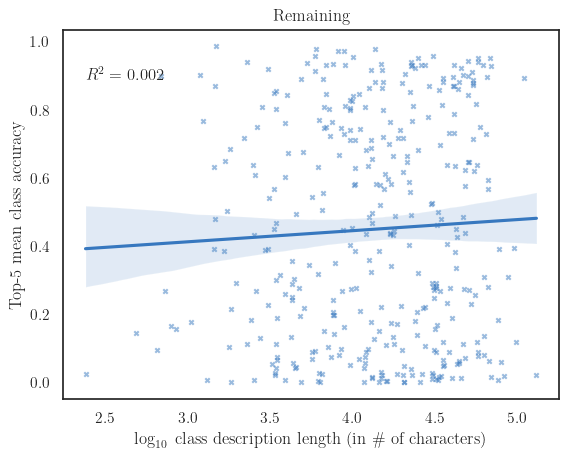

In [67]:
plt.title('Remaining')
plot_fig(df, 'other', save='simple_zsl_albert_outputs/class_accuracy_vs_description_length_other')

In [88]:
import tensorflow as tf
tf.print("Average Accuracy of all classes: ",
         100*albert_results['test_unseen_top5_acc_mean_allclasses'])

Average Accuracy of all classes:  42.586895
